# TEL-CHRUN Customer churn prediction


## Business Case:
- No-Churn Telecom is an established Telecom operator in Europe  with more than a decade in Business. Due to new players in the  market, telecom industry has become very competitive and  retaining customers becoming a challenge.  
- In spite of No-Churn initiatives of reducing tariffs and promoting  more offers, the churn rate ( percentage of customers migrating to  competitors) is well above 10%. 
- No-Churn wants to explore possibility of Machine Learning to help  with following use cases to retain competitive edge in the industry.

## PROJECT GOAL  
Help No-Churn with their use cases with ML 
- Understanding the variables that are influencing the customers  to migrate. 
- Creating Churn risk scores that can be indicative to drive  retention campaigns. 
- Introduce new predicting variable “CHURN-FLAG” with values  YES(1) or NO(0) so that email campaigns with lucrative offers  can be targeted to Churn YES customers.
help to identify possible CHURN-FLAG YES customers and provide  more attention in customer touch point areas, including customer  care support, request fulfilment, auto categorizing tickets as high  priority for quick resolutions any questions they may have etc., 


# 1.Importing Libraries

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from sklearn.preprocessing import LabelEncoder
from category_encoders import BinaryEncoder
from scipy import stats
import pylab
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier
import warnings
warnings.filterwarnings('ignore')
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV


# 2. Importing Dataset

In [2]:
data = pd.read_csv('telecom_churn_data.csv')
df = data.copy()
df.head()

,columns1,columns2,columns3,columns4,columns5,columns6,columns7,columns8,columns9,columns10,...,columns12,columns13,columns14,columns15,columns16,columns17,columns18,columns19,columns20,columns21
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


# 3.EDA

In [ ]:
## Generating Profile Report (Report File will be attached with the notebook)
profile = ProfileReport(df)
profile.to_file(output_file='churn.html')

### Observations

- No missing values.

- VMail_Message has 73.2% zero values.

- CustServ_Calls has 20.6% zero values.

- State has high cardinality.

- Phone has high cardinality.

- Day_Mins is highly correlated with Day_Charge.

- Day_Charge is highly correlated with Day_Mins.

- Eve_Mins is highly correlated with Eve_Charge.

- Eve_Charge is highly correlated with Eve_Mins.

- Night_Mins is highly correlated with Night_Charge.

- Night_Charge is highly correlated with Night_Mins.

- International_Mins is highly correlated with International_Charge.

- International_Charge is highly correlated with International_Mins.

In [4]:
# converting Churn using labelencoder
le = LabelEncoder()
df.Churn = le.fit_transform(df.Churn)

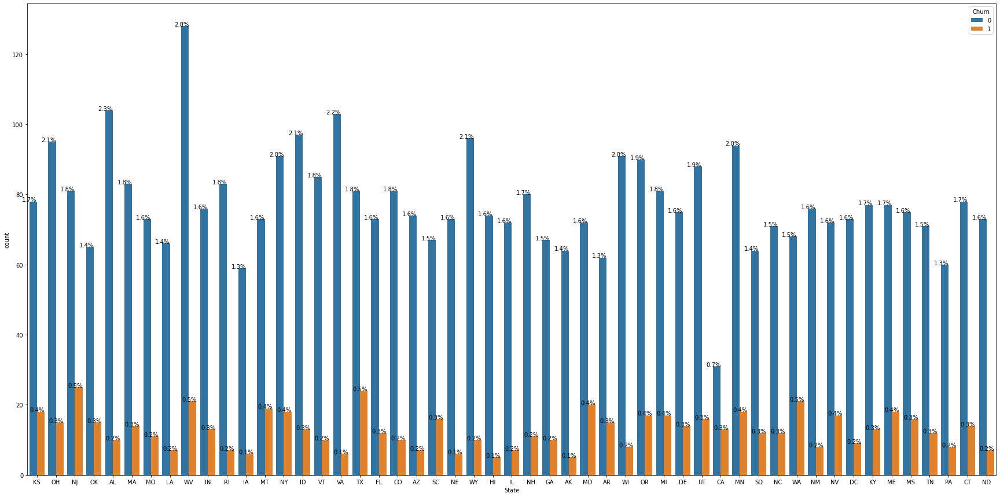

In [5]:
## Ploting graph of State variable with respect to Churn
plt.figure(figsize=(30,15))
ax = sns.countplot(df.State,hue=df.Churn)
total = float(len(df))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

#### Observation

- 16.56 % of people have Flagged yes. That means they may leave this company

- CA is having lower number of subscribers. In that 30% have Flagged yes. This means the company have to work more in that area to increase the number of subscribers

- NJ,WV,TX,WA is having 5% of people individually who had flagged as yes.

- WV is having highest number of subscribers who are willing to stay with the same connection.


In [6]:
df.Area_Code.value_counts()

415    2299
408    1161
510    1157
Name: Area_Code, dtype: int64

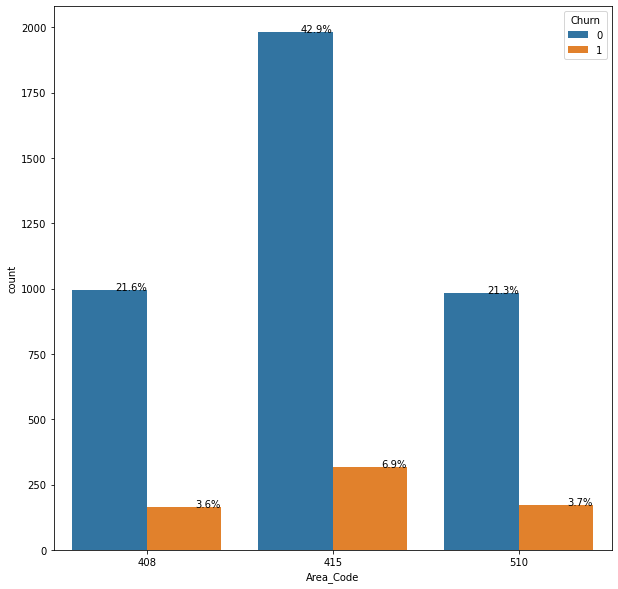

In [7]:
## Plot Areacode with respect to churn
plt.figure(figsize=(10,10))
ax = sns.countplot(df.Area_Code,hue=df.Churn)
total = float(len(df))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

#### Observation

- Area with code 415 is having the highest number of subscribers who have flagged NO and also highest number of subscribers who have flagged YES.

- Area_code 408 and 510 is having lesser number of subscribers than 415. 

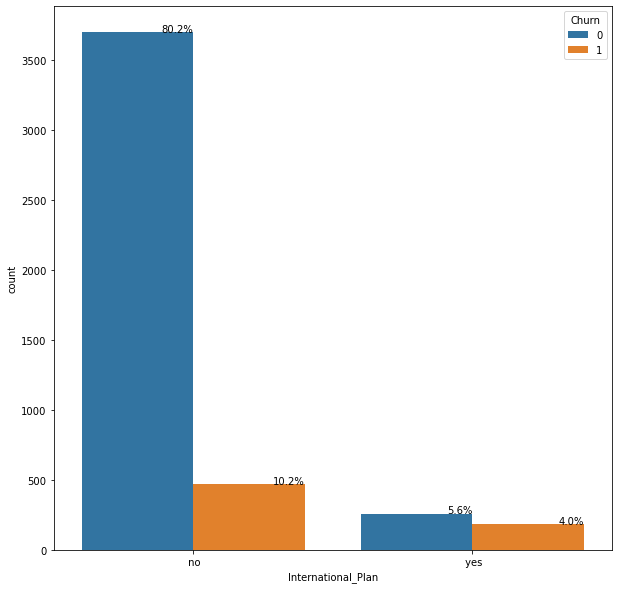

In [8]:
#### Ploting International Plan Data with respect to churn
plt.figure(figsize=(10,10))
ax = sns.countplot(df.International_Plan,hue=df.Churn)
total = float(len(df))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

### Observation

- Majority of the people with no internet plan have flagged as NO. This mainly because of the low call charges.

- Almost 4% of people who is having International plan have flagged YES. This maybe beacause of the network issue or some other issues. This people should be taken care because they are valueable.

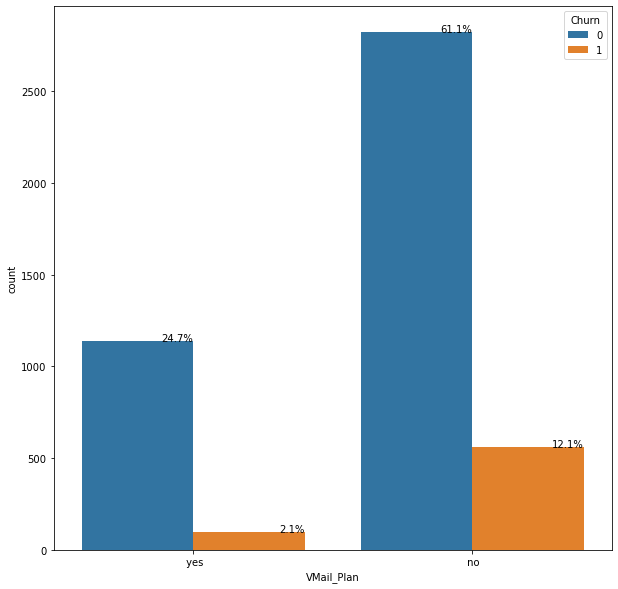

In [9]:
#### Ploting Vmail variable with respect to churn
plt.figure(figsize=(10,10))
ax = sns.countplot(df.VMail_Plan,hue=df.Churn)
total = float(len(df))
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')
plt.show()

#### Observations

- 73.2% people are not using VMail plans. In that 12.1% have flagged as YES. This is similar to that of International plan. This means these people are planning to migrate some other network due to some other issue.

- 26.8% are using VMail plan. 2.1% of people have flagged as YES


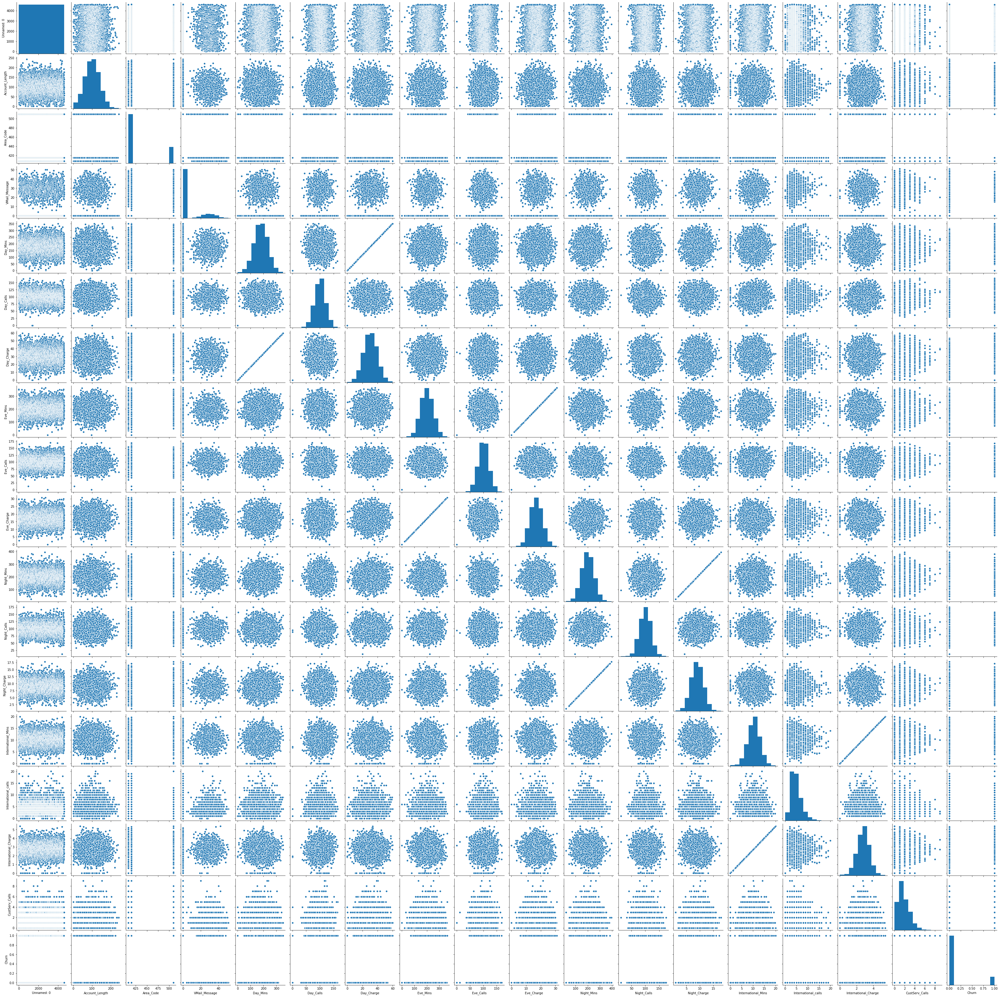

In [10]:
sns.pairplot(df)

Text(0.5, 1.0, 'Day_Charge vs Day_calls')

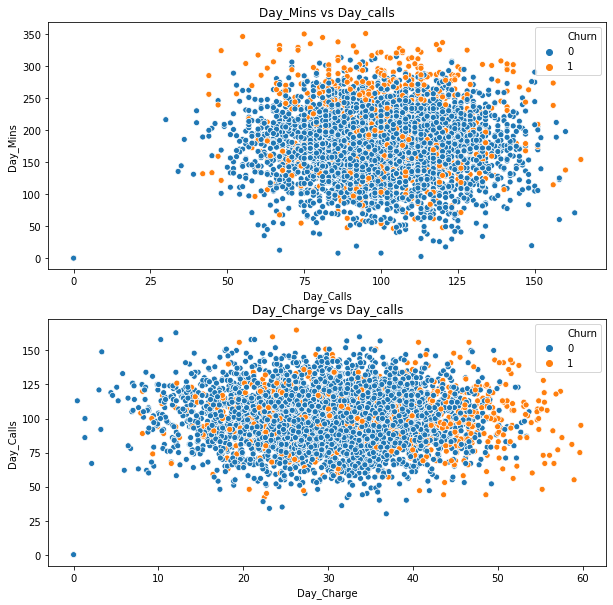

In [11]:
#### Check DayMins vs DayCalls using scatter plot

fig,axes = plt.subplots(2,figsize=(10,10))
sns.scatterplot(ax=axes[0],x=df.Day_Calls,y=df.Day_Mins,hue = df.Churn)
axes[0].set_title('Day_Mins vs Day_calls')

sns.scatterplot(ax=axes[1],x=df.Day_Charge,y=df.Day_Calls,hue = df.Churn)
axes[1].set_title('Day_Charge vs Day_calls')

#### Observation

1. Day_Mins vs Day_calls

- Majority of the people having is numberof day_calls between 75-125 and about 100-250 minutes per day.

- Mainly people with more than 250 Day_mins have flagged as YES. This maybe be because of call rates.

2. Day_Charge vs Day_calls

- Majority of the people flagged YES is when the Day_Charge is high.

- People with same Day_calls is having different Day_charges.

Text(0.5, 1.0, 'Eve_Calls vs Eve_Charge')

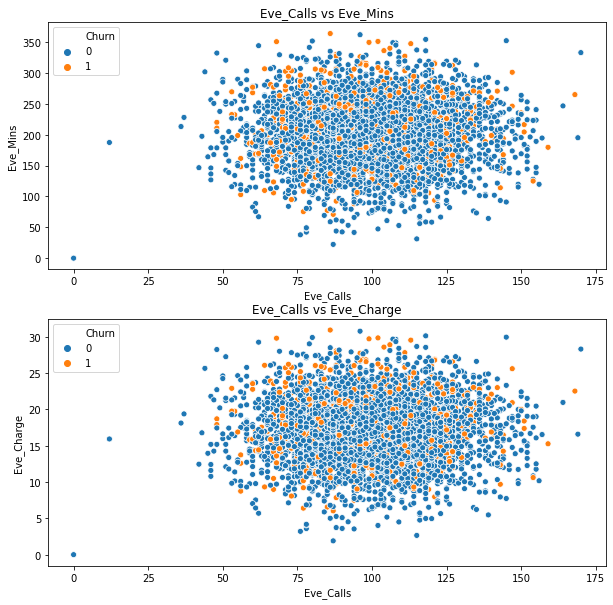

In [12]:
##### Check Eve_Calls vs Eve_Mins using scatter plot
fig,axes = plt.subplots(2,figsize=(10,10))
sns.scatterplot(ax=axes[0],x=df.Eve_Calls,y=df.Eve_Mins,hue = df.Churn)
axes[0].set_title('Eve_Calls vs Eve_Mins')

sns.scatterplot(ax=axes[1],x=df.Eve_Calls,y=df.Eve_Charge,hue = df.Churn)
axes[1].set_title('Eve_Calls vs Eve_Charge')

#### Observations

1. Eve_Calls vs Eve_Mins

- 75-125 Eve_Calls happens mainly with average Eve_Mins of 150-250

- People in all category have flagged as YES. No reason found for flagging YES


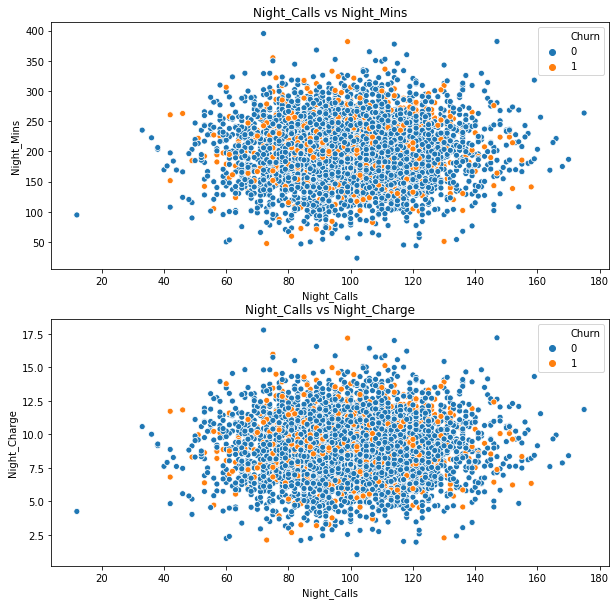

In [13]:
#### Check Night_Calls vs Night_Mins using scatter plot
fig,axes = plt.subplots(2,figsize=(10,10))
sns.scatterplot(ax=axes[0],x=df.Night_Calls,y=df.Night_Mins,hue = df.Churn)
axes[0].set_title('Night_Calls vs Night_Mins')

sns.scatterplot(ax=axes[1],x=df.Night_Calls,y=df.Night_Charge,hue = df.Churn)
axes[1].set_title('Night_Calls vs Night_Charge')
plt.show()

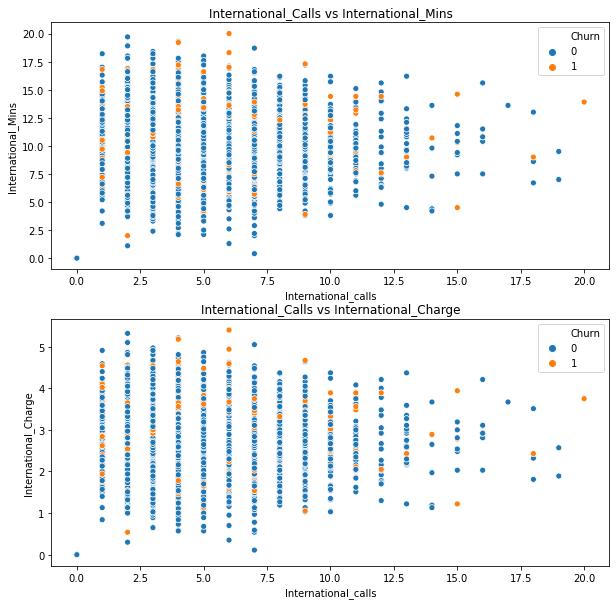

In [14]:
#### Check International_Calls vs International_Mins using scatter plot
fig,axes = plt.subplots(2,figsize=(10,10))
sns.scatterplot(ax=axes[0],x=df.International_calls,y=df.International_Mins,hue = df.Churn)
axes[0].set_title('International_Calls vs International_Mins')

sns.scatterplot(ax=axes[1],x=df.International_calls,y=df.International_Charge,hue = df.Churn)
axes[1].set_title('International_Calls vs International_Charge')
plt.show()

# 4. Encoding

In [15]:
## Select Categorical Variables to for encoding
categorical = df.select_dtypes(exclude='number').columns
categorical

Index(['State', 'Phone', 'International_Plan', 'VMail_Plan'], dtype='object')

- These are the features that should be encoded

#### 1. State

In [16]:
df.State.unique()

array(['KS', 'OH', 'NJ', 'OK', 'AL', 'MA', 'MO', 'LA', 'WV', 'IN', 'RI',
       'IA', 'MT', 'NY', 'ID', 'VT', 'VA', 'TX', 'FL', 'CO', 'AZ', 'SC',
       'NE', 'WY', 'HI', 'IL', 'NH', 'GA', 'AK', 'MD', 'AR', 'WI', 'OR',
       'MI', 'DE', 'UT', 'CA', 'MN', 'SD', 'NC', 'WA', 'NM', 'NV', 'DC',
       'KY', 'ME', 'MS', 'TN', 'PA', 'CT', 'ND'], dtype=object)

In [17]:
print('Number of States : ', len(df.State.unique()))

Number of States :  51


- State is a nominal data. So we can use Binary encoding here.

In [18]:
enc = BinaryEncoder()
enc_state = enc.fit_transform(df.State)
enc_state.head()

,State_0,State_1,State_2,State_3,State_4,State_5,State_6
0,0,0,0,0,0,0,1
1,0,0,0,0,0,1,0
2,0,0,0,0,0,1,1
3,0,0,0,0,0,1,0
4,0,0,0,0,1,0,0


In [19]:
#joining encoded data with main data
df = df.join(enc_state)

In [20]:
#dropping state from old data
df.drop(columns='State',inplace=True)

- sucessfully encoded category value

#### 2. Phone

In [21]:
df.Phone

0        382-4657
1        371-7191
2        358-1921
3        375-9999
4        330-6626
          ...    
4612     345-7512
4613     343-6820
4614     338-4794
4615     355-8388
4616     409-6884
Name: Phone, Length: 4617, dtype: object

- Here Phone contains 2 section. The first section represents the local code. So we can extract data from here and create a new column only with local code.

In [22]:
new = [str(i).split(sep='-')[0] for i in df.Phone]
new = [int(i) for i in new]
df['Phone'] = pd.DataFrame(new,columns=['Phone'])

- Sucessfully extracted data and create a new column with name Phone

#### 3. International_plan

In [23]:
df.International_Plan.value_counts()

 no     4171
 yes     446
Name: International_Plan, dtype: int64

In [24]:
df.International_Plan = pd.get_dummies(df.International_Plan,drop_first=True)

#### 4.VMail_plan

In [25]:
df.VMail_Plan.value_counts()

 no     3381
 yes    1236
Name: VMail_Plan, dtype: int64

In [26]:
df.VMail_Plan = pd.get_dummies(df.VMail_Plan,drop_first=True)

- sucessfully converted 

# 5. Feature Engineering

## 1. Feature Selection

- Feature selection is the technique in which features that are necessary for making models are choosen and the features that are not important is removed from the dataset

### a. Dropping features that has no impact in target

In [27]:
df.drop(columns=['Unnamed: 0'],inplace=True)

### b.  Finding variance for dropping features with low variance (less than 0.08)

- while considering variance if the variance is too low means that feature doent play the major role in finding the Target. so,that low variance features can be dropped

In [28]:
var =  VarianceThreshold(threshold=0.08)
var.fit(df)

VarianceThreshold(threshold=0.08)

In [29]:
var.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True, False,  True,  True,  True,  True,  True,  True])

In [30]:
drop_col_names = df.columns[var.get_support()  == False]
drop_col_names

Index(['State_0'], dtype='object')

- State_o is under the threshold value hence we can drop it.

In [31]:
df.drop(columns=drop_col_names,inplace=True)

### c. Removing Multicollinearity

- Here we are considering 0.8 as cutoof. if the value is greater than 0.8 we can consider it as a duplicate value and we can drop any one the feature

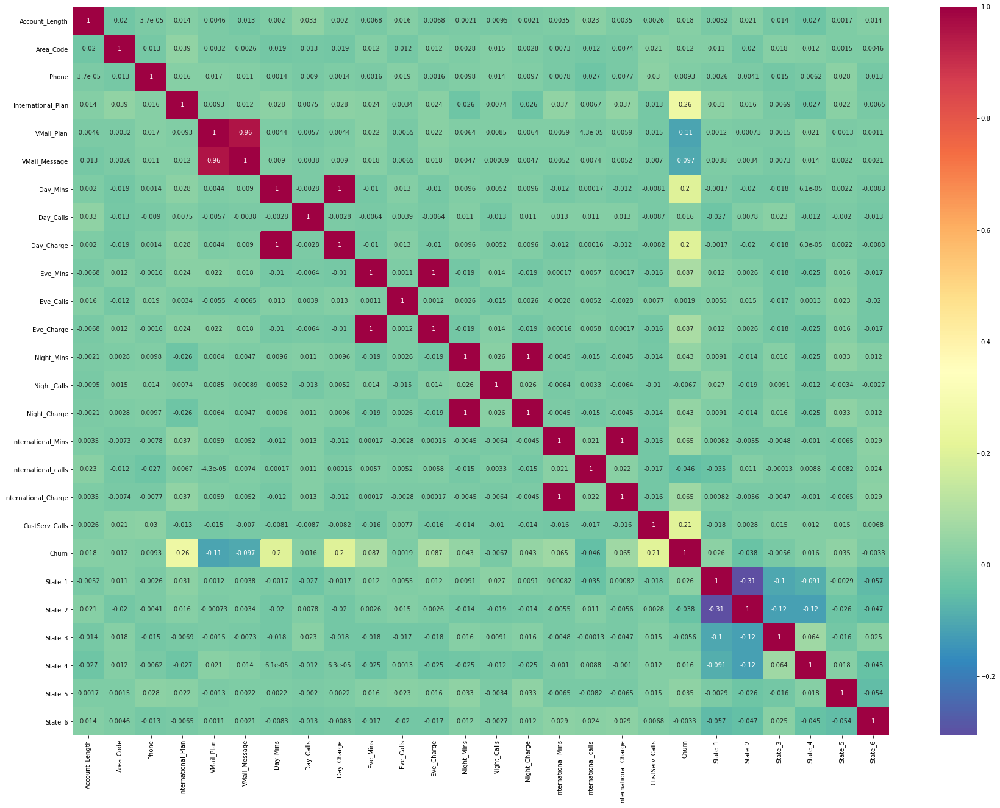

In [32]:
plt.rcParams["figure.figsize"] = 30,22
plt.rcParams["figure.facecolor"] = "white"
corrilation_Ind_features = df.corr()
sns.heatmap(corrilation_Ind_features,annot=True,cmap= "Spectral_r")
plt.show()

In [33]:
drop_col_names = set()

for i in range(len(corrilation_Ind_features.columns)):
    for j in range(i):
        if abs(corrilation_Ind_features.iloc[i,j]) > 0.8:
            col_name = corrilation_Ind_features.columns[i]
            drop_col_names.add(col_name)

In [34]:
drop_col_names

{'Day_Charge',
 'Eve_Charge',
 'International_Charge',
 'Night_Charge',
 'VMail_Message'}

- The above listed features are above the cutoff so we can drop them

In [35]:
df.drop(columns=drop_col_names,inplace=True)

### d. Finding correlation between independent and dependent features

- Here we are considering 0.08 as our cutoff. If the feature is having value below cutoff that means it is having low correlation with the target variable. So we can drop it.

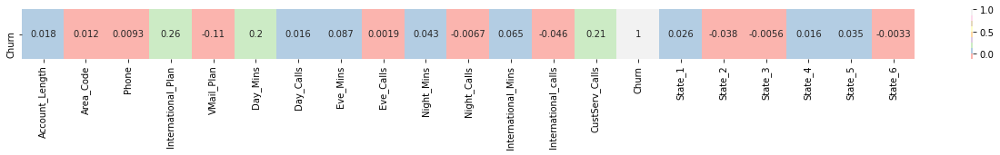

In [36]:
plt.rcParams["figure.figsize"] = 22,1
corrilation_depend = df.corr()
sns.heatmap(corrilation_depend.loc[["Churn"],:],annot=True,cmap= "Pastel1")
plt.show()

- since most of values are below the cutoff let's reduce the cut off

In [37]:
#taking cut off as 0.05
drop_col_names = []
for x,i in enumerate(corrilation_depend["Churn"]):
    if abs(i) < 0.04:
        print(i,"   ",corrilation_depend.columns[x])
        drop_col_names.append(corrilation_depend.columns[x])

0.01804596333797335     Account_Length
0.011995300224197222     Area_Code
0.0092794456539168     Phone
0.016267797010604376     Day_Calls
0.001942881261836244     Eve_Calls
-0.006670885105318874     Night_Calls
0.026382184521520215     State_1
-0.03788076216234512     State_2
-0.005571285140181693     State_3
0.015547709419908151     State_4
0.034931930534799864     State_5
-0.0032547848186444714     State_6


- These mentioned columns can be dropped because they are below the cut off

In [38]:
df.drop(columns=drop_col_names,inplace=True)

# 5. Normalization of Data

In [39]:
df.columns

Index(['International_Plan', 'VMail_Plan', 'Day_Mins', 'Eve_Mins',
       'Night_Mins', 'International_Mins', 'International_calls',
       'CustServ_Calls', 'Churn'],
      dtype='object')

In [40]:
plt.rcParams["figure.figsize"] = 10,5
def plotfigure(df,feature):
    print("\n\nskewness of the ",feature," is : ",stats.skew(df[feature]))
    print("kurtosis of the ",feature," is : ",stats.kurtosis(df[feature]))
    plt.subplot(1,2,1)
    sns.distplot(df[feature],kde=True)
    plt.subplot(1,2,2)
    stats.probplot(df[feature],plot=pylab)
    plt.show()
    
    
def line():
    print("\033[1m" + "_________________________________________________________________________________________________________"+ "\033[0m")


                             I̲n̲t̲e̲r̲n̲a̲t̲i̲o̲n̲a̲l̲_̲P̲l̲a̲n:


skewness of the  International_Plan  is :  2.731107235403605
kurtosis of the  International_Plan  is :  5.458946731273915


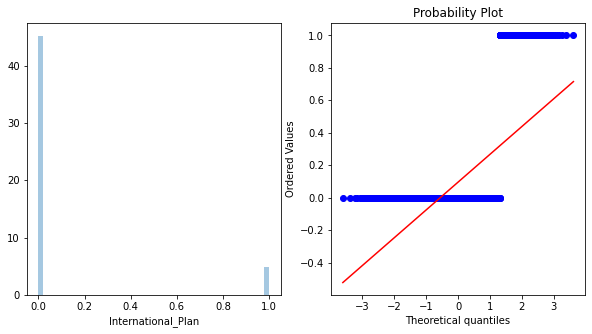

_________________________________________________________________________________________________________

                             V̲M̲a̲i̲l̲_̲P̲l̲a̲n:


skewness of the  VMail_Plan  is :  1.0492898594224374
kurtosis of the  VMail_Plan  is :  -0.8989907909132424


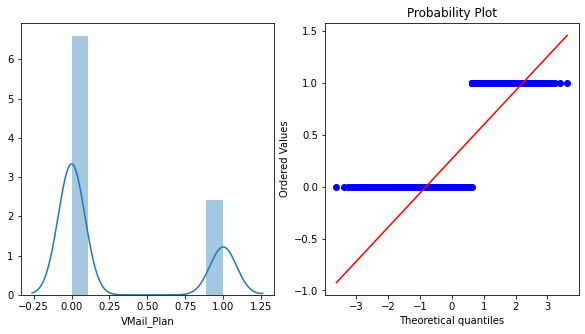

_________________________________________________________________________________________________________

                             D̲a̲y̲_̲M̲i̲n̲s:


skewness of the  Day_Mins  is :  -0.002947284016695239
kurtosis of the  Day_Mins  is :  -0.04365222612737929


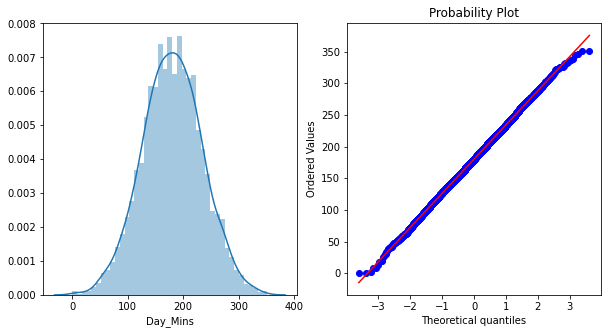

_________________________________________________________________________________________________________

                             E̲v̲e̲_̲M̲i̲n̲s:


skewness of the  Eve_Mins  is :  -0.0052781500846280525
kurtosis of the  Eve_Mins  is :  0.042283656150823745


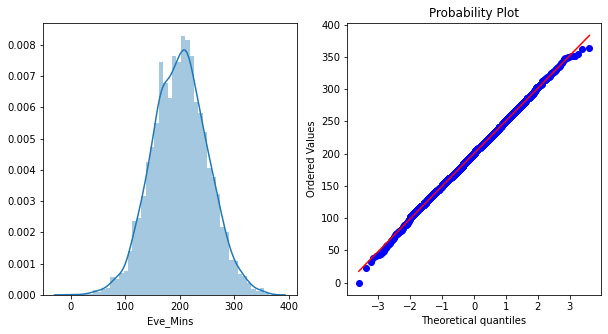

_________________________________________________________________________________________________________

                             N̲i̲g̲h̲t̲_̲M̲i̲n̲s:


skewness of the  Night_Mins  is :  0.02050841390755843
kurtosis of the  Night_Mins  is :  0.06004343141054003


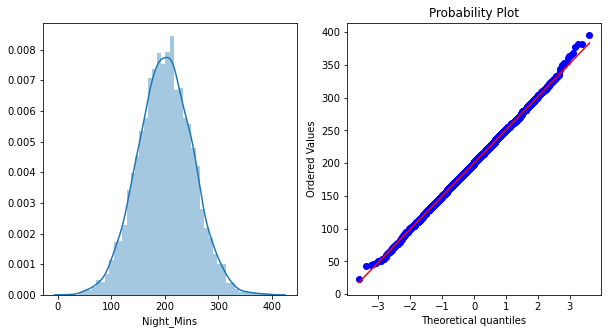

_________________________________________________________________________________________________________

                             I̲n̲t̲e̲r̲n̲a̲t̲i̲o̲n̲a̲l̲_̲M̲i̲n̲s:


skewness of the  International_Mins  is :  -0.22081880952903746
kurtosis of the  International_Mins  is :  0.6695756138404381


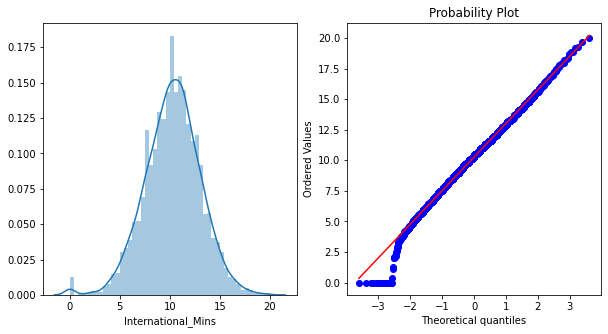

_________________________________________________________________________________________________________

                             I̲n̲t̲e̲r̲n̲a̲t̲i̲o̲n̲a̲l̲_̲c̲a̲l̲l̲s:


skewness of the  International_calls  is :  1.3659756765088018
kurtosis of the  International_calls  is :  3.2980521818291813


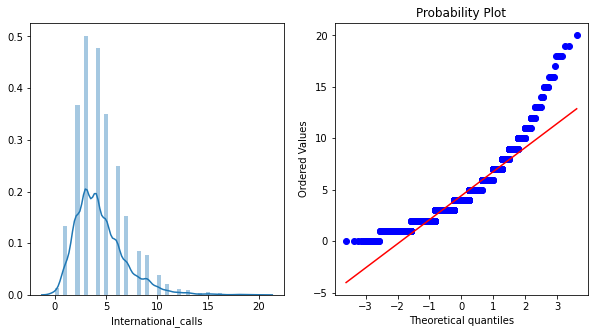

_________________________________________________________________________________________________________

                             C̲u̲s̲t̲S̲e̲r̲v̲_̲C̲a̲l̲l̲s:


skewness of the  CustServ_Calls  is :  1.0464601992374216
kurtosis of the  CustServ_Calls  is :  1.512086924300303


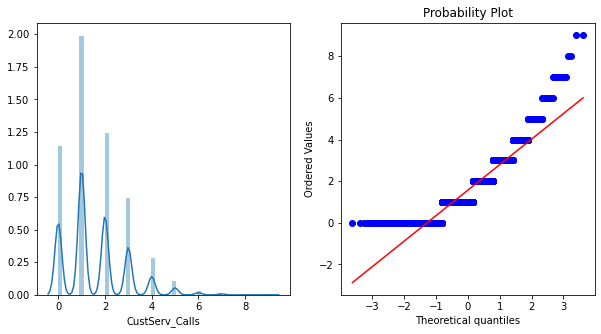

_________________________________________________________________________________________________________

                             C̲h̲u̲r̲n:


skewness of the  Churn  is :  2.050298636747617
kurtosis of the  Churn  is :  2.2037244998491383


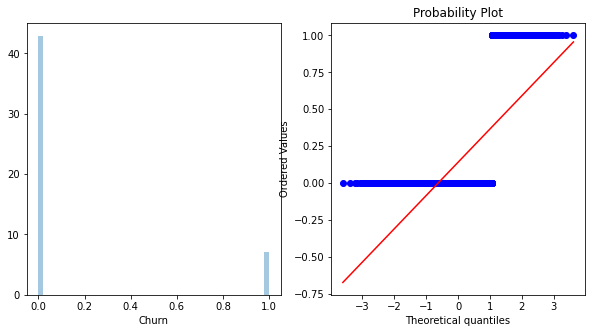

_________________________________________________________________________________________________________


In [41]:
for i in df.columns:
    print("\n                            ","\033[1m" + "\u0332".join(i)+ ":" + "\033[0m")
    plotfigure(df,i)
    line()

#### Observation

- By using distplot and QQ plot we get the clear idea about the normality of this data set. In this data set all continues features comes under gaussion distribution hence the data is normal

# 6. Handling outliers of Continues Features

#### 1. Day_Mins

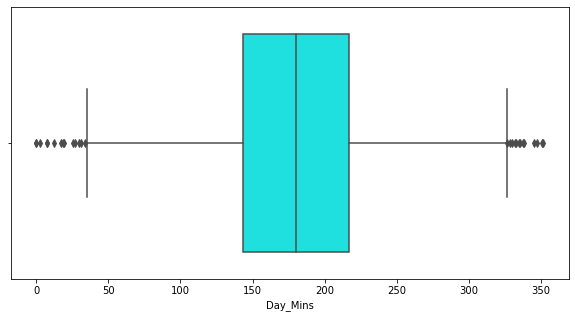

In [42]:
sns.boxplot(df.Day_Mins,color="cyan")
plt.show()

In [43]:
# Removing outliers
#Finding mean and standard deviation of Day_mins
Day_Mins_mean = df.Day_Mins.mean()
Day_Mins_std  = df.Day_Mins.std()
print("Mean of Day_Mins               : ",Day_Mins_mean)
print("standard deviation of Day_Mins : ",Day_Mins_std)

Mean of Day_Mins               :  180.44715183019264
standard deviation of Day_Mins :  53.98353976986507


In [44]:
#finding Lower boundary and Heigher Boundary
lower_boundary   = Day_Mins_mean - (3 * Day_Mins_std)
heigher_boundary = Day_Mins_mean + (3 * Day_Mins_std)
print("Lower Boundary of Day_Mins   : ",lower_boundary)
print("Heigher Boundary of Day_Mins : ",heigher_boundary) 

Lower Boundary of Day_Mins   :  18.49653252059744
Heigher Boundary of Day_Mins :  342.39777113978784


In [45]:
df.loc[df.Day_Mins < lower_boundary , "Day_Mins"] = lower_boundary
df.loc[df.Day_Mins > heigher_boundary , "Day_Mins"] = heigher_boundary

<function matplotlib.pyplot.show(*args, **kw)>

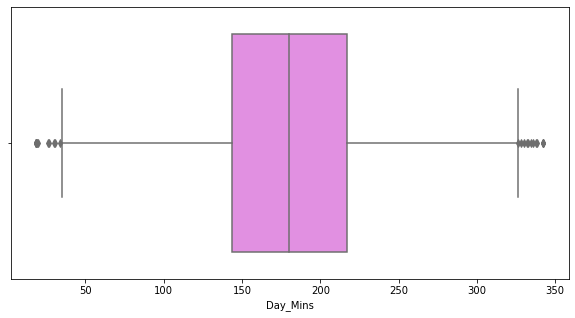

In [46]:
#checking for outliers
sns.boxplot(df.Day_Mins,color = "violet" )
plt.show

- We can see the outliers are not completely removed. So we can try IQR 

In [47]:
#finding Inter Quantile Range(IQR)
IQR = df.Day_Mins.quantile(.75) - df.Day_Mins.quantile(0.25)
print("IQR value of Day_Mins : ",IQR)

IQR value of Day_Mins :  73.10000000000002


In [48]:
#finding under bridge and over bridge values
under_bridge= df.Day_Mins.quantile(.25) - (IQR * 1.5)
over_bridge = df.Day_Mins.quantile(.75) + (IQR * 1.5)
print("Under_bridge value of Day_Mins : ",under_bridge)
print("over_bridge value Day_Mins     : ",over_bridge)

Under_bridge value of Day_Mins :  34.049999999999955
over_bridge value Day_Mins     :  326.45000000000005


In [49]:
#replacing the outliers with the bridge values
df.loc[data.Day_Mins < under_bridge , "Day_Mins"] = under_bridge
df.loc[data.Day_Mins > over_bridge , "Day_Mins"] = over_bridge

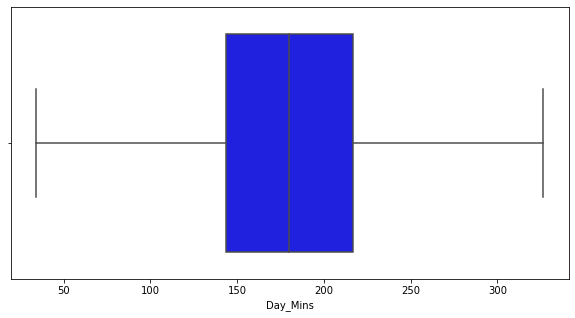

In [50]:
#plotting the boxplot
sns.boxplot(df.Day_Mins,color = "blue")
plt.show()

- Sucessfully removed the outliers

### 2. Eve_Mins

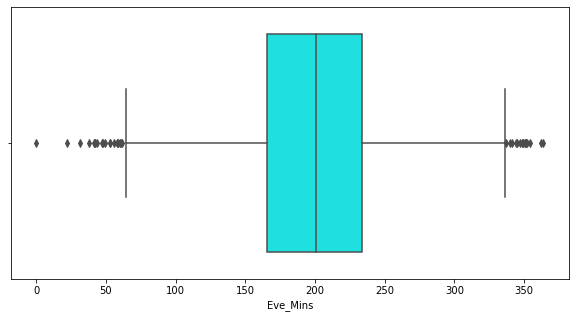

In [51]:
sns.boxplot(df.Eve_Mins,color="cyan")
plt.show()

In [52]:
#Finding Inter Quantile Range
IQR = df.Eve_Mins.quantile(.75) - df.Eve_Mins.quantile(0.25)
print("IQR value of Eve_Mins : ",IQR)

IQR value of Eve_Mins :  68.1


In [53]:
#finding under bridge and over bridge values
under_bridge= df.Eve_Mins.quantile(.25) - (IQR * 1.5)
over_bridge = df.Eve_Mins.quantile(.75) + (IQR * 1.5)
print("Under_bridge value of Eve_Mins : ",under_bridge)
print("over_bridge value Eve_Mins     : ",over_bridge)

Under_bridge value of Eve_Mins :  63.750000000000014
over_bridge value Eve_Mins     :  336.15


In [54]:
#replacing the outliers with the bridge values
df.loc[data.Eve_Mins < under_bridge , "Eve_Mins"] = under_bridge
df.loc[data.Eve_Mins > over_bridge , "Eve_Mins"] = over_bridge

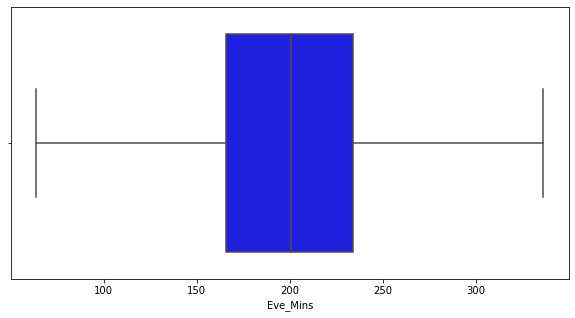

In [55]:
#plotting the boxplot
sns.boxplot(df.Eve_Mins,color="blue")
plt.show()

- sucessfully removed the outliers

#### 3. Night_Mins

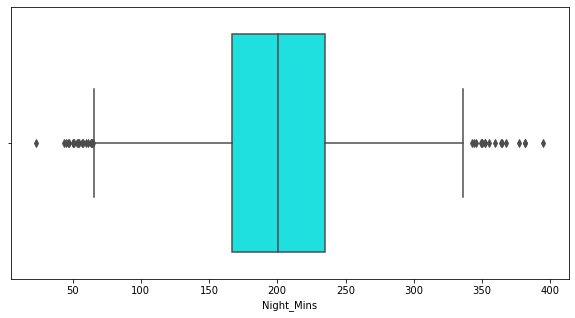

In [56]:
sns.boxplot(df.Night_Mins,color="cyan")
plt.show()

In [57]:
#Finding Inter Quantile Range
IQR = df.Night_Mins.quantile(.75) - df.Night_Mins.quantile(0.25)
print("IQR value of Eve_Mins : ",IQR)

IQR value of Eve_Mins :  67.80000000000001


In [58]:
#finding under bridge and over bridge values
under_bridge= df.Night_Mins.quantile(.25) - (IQR * 1.5)
over_bridge = df.Night_Mins.quantile(.75) + (IQR * 1.5)
print("Under_bridge value of Eve_Mins : ",under_bridge)
print("over_bridge value Eve_Mins     : ",over_bridge)

Under_bridge value of Eve_Mins :  65.39999999999998
over_bridge value Eve_Mins     :  336.6


In [59]:
#replacing the outliers with the bridge values
df.loc[df.Night_Mins < under_bridge , "Night_Mins"] = under_bridge
df.loc[df.Night_Mins > over_bridge , "Night_Mins"] = over_bridge

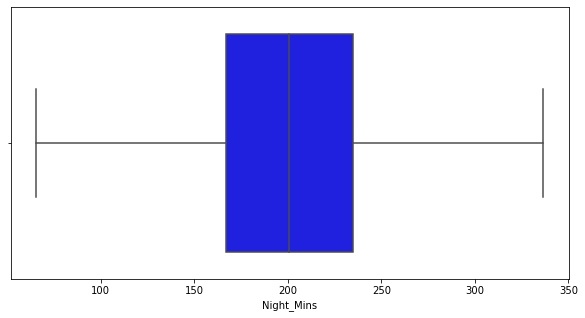

In [60]:
#plotting the boxplot
sns.boxplot(df.Night_Mins,color="blue")
plt.show()

- sucessfully removed outliers

#### 4. International_Mins

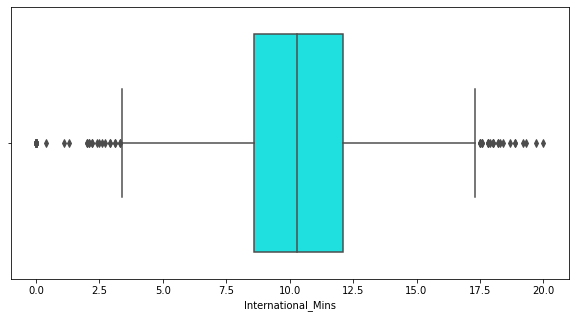

In [61]:
sns.boxplot(df.International_Mins,color="cyan")
plt.show()

In [62]:
#Finding Inter Quantile Range
IQR = df.International_Mins.quantile(.75) - df.International_Mins.quantile(0.25)
print("IQR value of Eve_Mins : ",IQR)

IQR value of Eve_Mins :  3.5


In [63]:
#finding under bridge and over bridge values
under_bridge= df.International_Mins.quantile(.25) - (IQR * 1.5)
over_bridge = df.International_Mins.quantile(.75) + (IQR * 1.5)
print("Under_bridge value of Eve_Mins : ",under_bridge)
print("over_bridge value Eve_Mins     : ",over_bridge)

Under_bridge value of Eve_Mins :  3.3499999999999996
over_bridge value Eve_Mins     :  17.35


In [64]:
#replacing the outliers with the bridge values
df.loc[data.International_Mins < under_bridge , "International_Mins"] = under_bridge
df.loc[data.International_Mins > over_bridge , "International_Mins"] = over_bridge

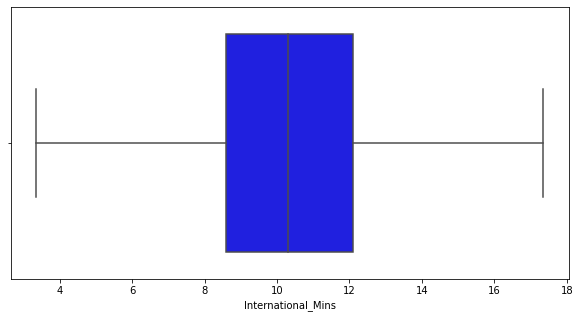

In [65]:
#plotting the boxplot
sns.boxplot(df.International_Mins,color="blue")
plt.show()

- sucessfully removed

# 7. Defining x and y

In [66]:
x = df.drop(columns=['Churn'])
y = df.Churn

# 8. Scaling using standard scalar

In [67]:
scale = StandardScaler()
x = scale.fit_transform(x)

# 9. Splitting the Data

In [68]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=40)

# 9.Oversampling using SMOTE

In [69]:
smote = SMOTE(k_neighbors=2)
x_train,y_train = smote.fit_resample(x_train,y_train)
#y_train.value_counts()

# 11. Modelling

## a. XGBOOST with hyperparameter tuning

In [70]:
model = XGBClassifier(random_state=100,
    
    max_depth=10,
    n_estimators=150,
    learning_rate=0.1,
    min_child_weight=3,
    subsample=0.88,
    reg_lambda=1,
    reg_alpha=1)
model.fit(x_train,y_train)
y_predict = model.predict(x_test)
accuracy_score(y_test,y_predict)

[13:41:52] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


0.9531024531024531

In [71]:
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1185
           1       0.87      0.80      0.83       201

    accuracy                           0.95      1386
   macro avg       0.92      0.89      0.90      1386
weighted avg       0.95      0.95      0.95      1386



In [72]:
pd.crosstab(y_test,y_predict)

col_0,0,1
Churn,,
0,1161,24
1,41,160


#### K_fold cross Validation

In [73]:
scores = cross_val_score(model, x,y, cv=5, scoring='accuracy')
print(scores)
print('MEAN : ',scores.mean())
print('STD : ', scores.std())

[13:41:54] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:41:55] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:41:56] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[13:41:56] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old be

- Since K_fold mean is close to the predicted value of the xgboost we can conclude that our model is not overfitting. We are also having less standard deviation

## b. Random Forest 

In [74]:
rand = RandomForestClassifier(max_depth=15,min_samples_leaf=3,min_samples_split=5,n_estimators=100,random_state=24)
rand.fit(x_train,y_train)
y_predict = rand.predict(x_test)
accuracy_score(y_test,y_predict)

0.9494949494949495

In [75]:
pd.crosstab(y_test,y_predict)

col_0,0,1
Churn,,
0,1153,32
1,38,163


In [76]:
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97      1185
           1       0.84      0.81      0.82       201

    accuracy                           0.95      1386
   macro avg       0.90      0.89      0.90      1386
weighted avg       0.95      0.95      0.95      1386



#### k_fold validation

In [77]:
cross_val = cross_val_score(rand, x,y, cv=5, scoring='accuracy')
print(cross_val)
print('MEAN : ',scores.mean())
print('STD : ', scores.std())

[0.9469697  0.94805195 0.9588299  0.94907909 0.95449621]
MEAN :  0.9568994385895795
STD :  0.003702651619176786


- Since K_fold mean is close to the predicted value of the xgboost we can conclude that our model is not overfitting. We are also having less standard deviation

## c. CATBOOST

In [78]:
cat = CatBoostClassifier(iterations=1000)
cat.fit(x_train,y_train)

Learning rate set to 0.02142
0:	learn: 0.6768961	total: 193ms	remaining: 3m 12s
1:	learn: 0.6641765	total: 199ms	remaining: 1m 39s
2:	learn: 0.6491639	total: 204ms	remaining: 1m 7s
3:	learn: 0.6346223	total: 208ms	remaining: 51.8s
4:	learn: 0.6204686	total: 217ms	remaining: 43.1s
5:	learn: 0.6062987	total: 222ms	remaining: 36.7s
6:	learn: 0.5935387	total: 227ms	remaining: 32.2s
7:	learn: 0.5831326	total: 232ms	remaining: 28.7s
8:	learn: 0.5717883	total: 235ms	remaining: 25.9s
9:	learn: 0.5609948	total: 242ms	remaining: 24s
10:	learn: 0.5503295	total: 248ms	remaining: 22.3s
11:	learn: 0.5397908	total: 253ms	remaining: 20.8s
12:	learn: 0.5302005	total: 261ms	remaining: 19.8s
13:	learn: 0.5236733	total: 268ms	remaining: 18.8s
14:	learn: 0.5147733	total: 273ms	remaining: 17.9s
15:	learn: 0.5072473	total: 278ms	remaining: 17.1s
16:	learn: 0.4981700	total: 281ms	remaining: 16.3s
17:	learn: 0.4905299	total: 289ms	remaining: 15.7s
18:	learn: 0.4838281	total: 293ms	remaining: 15.1s
19:	learn: 0

176:	learn: 0.1973518	total: 1.41s	remaining: 6.56s
177:	learn: 0.1967477	total: 1.42s	remaining: 6.54s
178:	learn: 0.1964334	total: 1.43s	remaining: 6.54s
179:	learn: 0.1956327	total: 1.43s	remaining: 6.52s
180:	learn: 0.1952882	total: 1.44s	remaining: 6.51s
181:	learn: 0.1944445	total: 1.44s	remaining: 6.49s
182:	learn: 0.1939314	total: 1.45s	remaining: 6.47s
183:	learn: 0.1934881	total: 1.46s	remaining: 6.46s
184:	learn: 0.1928286	total: 1.46s	remaining: 6.45s
185:	learn: 0.1922815	total: 1.47s	remaining: 6.44s
186:	learn: 0.1918569	total: 1.48s	remaining: 6.42s
187:	learn: 0.1909901	total: 1.49s	remaining: 6.42s
188:	learn: 0.1902539	total: 1.49s	remaining: 6.41s
189:	learn: 0.1899062	total: 1.5s	remaining: 6.4s
190:	learn: 0.1890854	total: 1.51s	remaining: 6.39s
191:	learn: 0.1886958	total: 1.51s	remaining: 6.38s
192:	learn: 0.1878237	total: 1.52s	remaining: 6.37s
193:	learn: 0.1875999	total: 1.53s	remaining: 6.36s
194:	learn: 0.1870609	total: 1.54s	remaining: 6.35s
195:	learn: 0.

353:	learn: 0.1305309	total: 2.62s	remaining: 4.79s
354:	learn: 0.1302967	total: 2.63s	remaining: 4.78s
355:	learn: 0.1300005	total: 2.64s	remaining: 4.77s
356:	learn: 0.1298148	total: 2.65s	remaining: 4.76s
357:	learn: 0.1296685	total: 2.65s	remaining: 4.76s
358:	learn: 0.1294131	total: 2.66s	remaining: 4.75s
359:	learn: 0.1290572	total: 2.67s	remaining: 4.74s
360:	learn: 0.1287653	total: 2.67s	remaining: 4.74s
361:	learn: 0.1284137	total: 2.68s	remaining: 4.73s
362:	learn: 0.1281671	total: 2.69s	remaining: 4.72s
363:	learn: 0.1279389	total: 2.7s	remaining: 4.71s
364:	learn: 0.1277264	total: 2.7s	remaining: 4.7s
365:	learn: 0.1274171	total: 2.71s	remaining: 4.7s
366:	learn: 0.1271657	total: 2.72s	remaining: 4.69s
367:	learn: 0.1268433	total: 2.73s	remaining: 4.68s
368:	learn: 0.1264932	total: 2.73s	remaining: 4.67s
369:	learn: 0.1260662	total: 2.74s	remaining: 4.67s
370:	learn: 0.1258398	total: 2.75s	remaining: 4.66s
371:	learn: 0.1255378	total: 2.75s	remaining: 4.65s
372:	learn: 0.12

524:	learn: 0.0979985	total: 3.83s	remaining: 3.47s
525:	learn: 0.0978747	total: 3.84s	remaining: 3.46s
526:	learn: 0.0977377	total: 3.85s	remaining: 3.45s
527:	learn: 0.0975953	total: 3.85s	remaining: 3.44s
528:	learn: 0.0973571	total: 3.85s	remaining: 3.43s
529:	learn: 0.0972759	total: 3.86s	remaining: 3.42s
530:	learn: 0.0971374	total: 3.87s	remaining: 3.42s
531:	learn: 0.0970015	total: 3.87s	remaining: 3.4s
532:	learn: 0.0967904	total: 3.87s	remaining: 3.4s
533:	learn: 0.0966592	total: 3.88s	remaining: 3.39s
534:	learn: 0.0964703	total: 3.88s	remaining: 3.38s
535:	learn: 0.0964060	total: 3.89s	remaining: 3.37s
536:	learn: 0.0963227	total: 3.9s	remaining: 3.36s
537:	learn: 0.0960624	total: 3.9s	remaining: 3.35s
538:	learn: 0.0958432	total: 3.9s	remaining: 3.34s
539:	learn: 0.0956944	total: 3.91s	remaining: 3.33s
540:	learn: 0.0955492	total: 3.91s	remaining: 3.32s
541:	learn: 0.0954483	total: 3.92s	remaining: 3.31s
542:	learn: 0.0953100	total: 3.92s	remaining: 3.3s
543:	learn: 0.0951

704:	learn: 0.0763370	total: 5.05s	remaining: 2.11s
705:	learn: 0.0761944	total: 5.06s	remaining: 2.11s
706:	learn: 0.0761494	total: 5.07s	remaining: 2.1s
707:	learn: 0.0760319	total: 5.07s	remaining: 2.09s
708:	learn: 0.0759130	total: 5.08s	remaining: 2.09s
709:	learn: 0.0758376	total: 5.09s	remaining: 2.08s
710:	learn: 0.0758131	total: 5.1s	remaining: 2.07s
711:	learn: 0.0757452	total: 5.11s	remaining: 2.06s
712:	learn: 0.0757077	total: 5.11s	remaining: 2.06s
713:	learn: 0.0756052	total: 5.12s	remaining: 2.05s
714:	learn: 0.0755647	total: 5.13s	remaining: 2.04s
715:	learn: 0.0755026	total: 5.14s	remaining: 2.04s
716:	learn: 0.0754536	total: 5.14s	remaining: 2.03s
717:	learn: 0.0753841	total: 5.15s	remaining: 2.02s
718:	learn: 0.0752781	total: 5.16s	remaining: 2.02s
719:	learn: 0.0752194	total: 5.17s	remaining: 2.01s
720:	learn: 0.0751724	total: 5.17s	remaining: 2s
721:	learn: 0.0750471	total: 5.18s	remaining: 2s
722:	learn: 0.0749903	total: 5.19s	remaining: 1.99s
723:	learn: 0.074853

887:	learn: 0.0624569	total: 6.43s	remaining: 811ms
888:	learn: 0.0624182	total: 6.44s	remaining: 804ms
889:	learn: 0.0623486	total: 6.44s	remaining: 796ms
890:	learn: 0.0622900	total: 6.45s	remaining: 789ms
891:	learn: 0.0621950	total: 6.46s	remaining: 782ms
892:	learn: 0.0621576	total: 6.46s	remaining: 774ms
893:	learn: 0.0620659	total: 6.47s	remaining: 767ms
894:	learn: 0.0620408	total: 6.47s	remaining: 759ms
895:	learn: 0.0619194	total: 6.48s	remaining: 752ms
896:	learn: 0.0618163	total: 6.48s	remaining: 744ms
897:	learn: 0.0617259	total: 6.49s	remaining: 737ms
898:	learn: 0.0616645	total: 6.49s	remaining: 729ms
899:	learn: 0.0616322	total: 6.5s	remaining: 722ms
900:	learn: 0.0615412	total: 6.5s	remaining: 715ms
901:	learn: 0.0614831	total: 6.51s	remaining: 707ms
902:	learn: 0.0614273	total: 6.51s	remaining: 700ms
903:	learn: 0.0614014	total: 6.52s	remaining: 692ms
904:	learn: 0.0613011	total: 6.53s	remaining: 685ms
905:	learn: 0.0612408	total: 6.53s	remaining: 678ms
906:	learn: 0.

In [79]:
y_pred = cat.predict(x_test)
cn = confusion_matrix(y_test,y_pred)
print('Confusion matrix : ', cn ,'\n')
ac = accuracy_score(y_test,y_pred)
print('accuracy score :', ac, '\n')
print(classification_report(y_test,y_pred))

Confusion matrix :  [[1167   18]
 [  43  158]] 

accuracy score : 0.9559884559884559 

              precision    recall  f1-score   support

           0       0.96      0.98      0.97      1185
           1       0.90      0.79      0.84       201

    accuracy                           0.96      1386
   macro avg       0.93      0.89      0.91      1386
weighted avg       0.95      0.96      0.95      1386



### Hyperparameter tuning

In [80]:
# Creating the hyperparameter grid
model_cat = CatBoostClassifier()
param_dist = { "learning_rate": np.linspace(0,0.2,5),
               "max_depth": randint(3, 10)
             }
rscv = RandomizedSearchCV(model_cat, param_dist,scoring='accuracy', cv=5)

              
              
# Fit the model
              
rscv.fit(x_train, y_train)
print(rscv.best_params_)
print(rscv.best_score_)

0:	learn: 0.5756236	total: 25.7ms	remaining: 25.6s
1:	learn: 0.4892193	total: 41.4ms	remaining: 20.7s
2:	learn: 0.4136274	total: 57.1ms	remaining: 19s
3:	learn: 0.3622640	total: 72.7ms	remaining: 18.1s
4:	learn: 0.3195764	total: 88.2ms	remaining: 17.5s
5:	learn: 0.2911384	total: 103ms	remaining: 17s
6:	learn: 0.2644125	total: 115ms	remaining: 16.3s
7:	learn: 0.2490400	total: 131ms	remaining: 16.3s
8:	learn: 0.2354268	total: 147ms	remaining: 16.2s
9:	learn: 0.2229695	total: 162ms	remaining: 16.1s
10:	learn: 0.2066898	total: 178ms	remaining: 16s
11:	learn: 0.1964863	total: 195ms	remaining: 16s
12:	learn: 0.1881478	total: 212ms	remaining: 16.1s
13:	learn: 0.1775618	total: 228ms	remaining: 16s
14:	learn: 0.1692803	total: 237ms	remaining: 15.6s
15:	learn: 0.1632775	total: 247ms	remaining: 15.2s
16:	learn: 0.1557375	total: 263ms	remaining: 15.2s
17:	learn: 0.1473535	total: 279ms	remaining: 15.2s
18:	learn: 0.1385936	total: 295ms	remaining: 15.2s
19:	learn: 0.1330525	total: 311ms	remaining: 1

164:	learn: 0.0079465	total: 2.59s	remaining: 13.1s
165:	learn: 0.0078290	total: 2.6s	remaining: 13.1s
166:	learn: 0.0076794	total: 2.62s	remaining: 13.1s
167:	learn: 0.0076089	total: 2.64s	remaining: 13.1s
168:	learn: 0.0075678	total: 2.65s	remaining: 13s
169:	learn: 0.0074759	total: 2.67s	remaining: 13s
170:	learn: 0.0074212	total: 2.69s	remaining: 13s
171:	learn: 0.0073751	total: 2.7s	remaining: 13s
172:	learn: 0.0073171	total: 2.72s	remaining: 13s
173:	learn: 0.0072845	total: 2.73s	remaining: 13s
174:	learn: 0.0072560	total: 2.75s	remaining: 13s
175:	learn: 0.0071865	total: 2.77s	remaining: 12.9s
176:	learn: 0.0070992	total: 2.78s	remaining: 12.9s
177:	learn: 0.0070607	total: 2.8s	remaining: 12.9s
178:	learn: 0.0069794	total: 2.81s	remaining: 12.9s
179:	learn: 0.0068937	total: 2.83s	remaining: 12.9s
180:	learn: 0.0068376	total: 2.85s	remaining: 12.9s
181:	learn: 0.0068080	total: 2.86s	remaining: 12.9s
182:	learn: 0.0067518	total: 2.88s	remaining: 12.8s
183:	learn: 0.0067123	total: 

323:	learn: 0.0032584	total: 4.97s	remaining: 10.4s
324:	learn: 0.0032584	total: 4.98s	remaining: 10.3s
325:	learn: 0.0032412	total: 5s	remaining: 10.3s
326:	learn: 0.0032412	total: 5.02s	remaining: 10.3s
327:	learn: 0.0032412	total: 5.04s	remaining: 10.3s
328:	learn: 0.0032218	total: 5.07s	remaining: 10.3s
329:	learn: 0.0032045	total: 5.1s	remaining: 10.4s
330:	learn: 0.0032044	total: 5.12s	remaining: 10.3s
331:	learn: 0.0031949	total: 5.14s	remaining: 10.3s
332:	learn: 0.0031721	total: 5.15s	remaining: 10.3s
333:	learn: 0.0031516	total: 5.17s	remaining: 10.3s
334:	learn: 0.0031189	total: 5.18s	remaining: 10.3s
335:	learn: 0.0031189	total: 5.2s	remaining: 10.3s
336:	learn: 0.0031189	total: 5.21s	remaining: 10.3s
337:	learn: 0.0031188	total: 5.23s	remaining: 10.2s
338:	learn: 0.0030984	total: 5.25s	remaining: 10.2s
339:	learn: 0.0030983	total: 5.26s	remaining: 10.2s
340:	learn: 0.0030752	total: 5.28s	remaining: 10.2s
341:	learn: 0.0030559	total: 5.29s	remaining: 10.2s
342:	learn: 0.003

484:	learn: 0.0027417	total: 7.27s	remaining: 7.72s
485:	learn: 0.0027417	total: 7.28s	remaining: 7.7s
486:	learn: 0.0027417	total: 7.29s	remaining: 7.68s
487:	learn: 0.0027416	total: 7.3s	remaining: 7.66s
488:	learn: 0.0027416	total: 7.32s	remaining: 7.64s
489:	learn: 0.0027416	total: 7.33s	remaining: 7.63s
490:	learn: 0.0027416	total: 7.34s	remaining: 7.61s
491:	learn: 0.0027416	total: 7.35s	remaining: 7.59s
492:	learn: 0.0027416	total: 7.36s	remaining: 7.57s
493:	learn: 0.0027416	total: 7.38s	remaining: 7.55s
494:	learn: 0.0027416	total: 7.38s	remaining: 7.53s
495:	learn: 0.0027416	total: 7.4s	remaining: 7.51s
496:	learn: 0.0027416	total: 7.41s	remaining: 7.5s
497:	learn: 0.0027415	total: 7.42s	remaining: 7.48s
498:	learn: 0.0027415	total: 7.43s	remaining: 7.46s
499:	learn: 0.0027415	total: 7.45s	remaining: 7.45s
500:	learn: 0.0027415	total: 7.46s	remaining: 7.43s
501:	learn: 0.0027415	total: 7.47s	remaining: 7.41s
502:	learn: 0.0027414	total: 7.49s	remaining: 7.4s
503:	learn: 0.002

650:	learn: 0.0026148	total: 9.62s	remaining: 5.16s
651:	learn: 0.0026148	total: 9.64s	remaining: 5.14s
652:	learn: 0.0026148	total: 9.65s	remaining: 5.13s
653:	learn: 0.0026148	total: 9.66s	remaining: 5.11s
654:	learn: 0.0026147	total: 9.68s	remaining: 5.1s
655:	learn: 0.0026147	total: 9.69s	remaining: 5.08s
656:	learn: 0.0026147	total: 9.71s	remaining: 5.07s
657:	learn: 0.0026147	total: 9.72s	remaining: 5.05s
658:	learn: 0.0026147	total: 9.73s	remaining: 5.04s
659:	learn: 0.0026147	total: 9.75s	remaining: 5.02s
660:	learn: 0.0026147	total: 9.76s	remaining: 5.01s
661:	learn: 0.0026146	total: 9.78s	remaining: 4.99s
662:	learn: 0.0026146	total: 9.79s	remaining: 4.98s
663:	learn: 0.0026146	total: 9.81s	remaining: 4.96s
664:	learn: 0.0026146	total: 9.82s	remaining: 4.95s
665:	learn: 0.0026146	total: 9.84s	remaining: 4.93s
666:	learn: 0.0026145	total: 9.85s	remaining: 4.92s
667:	learn: 0.0026145	total: 9.87s	remaining: 4.9s
668:	learn: 0.0026145	total: 9.88s	remaining: 4.89s
669:	learn: 0.

815:	learn: 0.0025912	total: 12s	remaining: 2.7s
816:	learn: 0.0025912	total: 12s	remaining: 2.68s
817:	learn: 0.0025912	total: 12s	remaining: 2.67s
818:	learn: 0.0025911	total: 12s	remaining: 2.65s
819:	learn: 0.0025911	total: 12s	remaining: 2.64s
820:	learn: 0.0025911	total: 12s	remaining: 2.62s
821:	learn: 0.0025911	total: 12s	remaining: 2.61s
822:	learn: 0.0025911	total: 12.1s	remaining: 2.59s
823:	learn: 0.0025911	total: 12.1s	remaining: 2.58s
824:	learn: 0.0025911	total: 12.1s	remaining: 2.56s
825:	learn: 0.0025911	total: 12.1s	remaining: 2.55s
826:	learn: 0.0025911	total: 12.1s	remaining: 2.54s
827:	learn: 0.0025910	total: 12.1s	remaining: 2.52s
828:	learn: 0.0025910	total: 12.2s	remaining: 2.51s
829:	learn: 0.0025910	total: 12.2s	remaining: 2.49s
830:	learn: 0.0025910	total: 12.2s	remaining: 2.48s
831:	learn: 0.0025910	total: 12.2s	remaining: 2.46s
832:	learn: 0.0025910	total: 12.2s	remaining: 2.45s
833:	learn: 0.0025910	total: 12.2s	remaining: 2.43s
834:	learn: 0.0025909	total

977:	learn: 0.0025244	total: 14.3s	remaining: 322ms
978:	learn: 0.0025244	total: 14.3s	remaining: 307ms
979:	learn: 0.0025244	total: 14.3s	remaining: 292ms
980:	learn: 0.0025243	total: 14.3s	remaining: 278ms
981:	learn: 0.0025243	total: 14.4s	remaining: 263ms
982:	learn: 0.0025243	total: 14.4s	remaining: 249ms
983:	learn: 0.0025243	total: 14.4s	remaining: 234ms
984:	learn: 0.0025242	total: 14.4s	remaining: 219ms
985:	learn: 0.0025242	total: 14.4s	remaining: 205ms
986:	learn: 0.0025242	total: 14.4s	remaining: 190ms
987:	learn: 0.0025242	total: 14.4s	remaining: 175ms
988:	learn: 0.0025242	total: 14.5s	remaining: 161ms
989:	learn: 0.0025242	total: 14.5s	remaining: 146ms
990:	learn: 0.0025242	total: 14.5s	remaining: 132ms
991:	learn: 0.0025242	total: 14.5s	remaining: 117ms
992:	learn: 0.0025241	total: 14.5s	remaining: 102ms
993:	learn: 0.0025241	total: 14.5s	remaining: 87.7ms
994:	learn: 0.0025241	total: 14.5s	remaining: 73.1ms
995:	learn: 0.0025241	total: 14.6s	remaining: 58.5ms
996:	lear

147:	learn: 0.0190031	total: 2.23s	remaining: 12.8s
148:	learn: 0.0187968	total: 2.25s	remaining: 12.8s
149:	learn: 0.0187432	total: 2.26s	remaining: 12.8s
150:	learn: 0.0185184	total: 2.28s	remaining: 12.8s
151:	learn: 0.0183736	total: 2.29s	remaining: 12.8s
152:	learn: 0.0183106	total: 2.31s	remaining: 12.8s
153:	learn: 0.0180642	total: 2.33s	remaining: 12.8s
154:	learn: 0.0178925	total: 2.34s	remaining: 12.8s
155:	learn: 0.0177571	total: 2.36s	remaining: 12.8s
156:	learn: 0.0176837	total: 2.37s	remaining: 12.7s
157:	learn: 0.0175074	total: 2.39s	remaining: 12.7s
158:	learn: 0.0173305	total: 2.4s	remaining: 12.7s
159:	learn: 0.0171209	total: 2.42s	remaining: 12.7s
160:	learn: 0.0170675	total: 2.43s	remaining: 12.7s
161:	learn: 0.0168859	total: 2.45s	remaining: 12.7s
162:	learn: 0.0167319	total: 2.46s	remaining: 12.6s
163:	learn: 0.0165864	total: 2.48s	remaining: 12.6s
164:	learn: 0.0164975	total: 2.49s	remaining: 12.6s
165:	learn: 0.0163477	total: 2.51s	remaining: 12.6s
166:	learn: 0

306:	learn: 0.0061926	total: 4.57s	remaining: 10.3s
307:	learn: 0.0061630	total: 4.58s	remaining: 10.3s
308:	learn: 0.0061338	total: 4.59s	remaining: 10.3s
309:	learn: 0.0061023	total: 4.6s	remaining: 10.2s
310:	learn: 0.0060674	total: 4.62s	remaining: 10.2s
311:	learn: 0.0060273	total: 4.64s	remaining: 10.2s
312:	learn: 0.0060046	total: 4.65s	remaining: 10.2s
313:	learn: 0.0059628	total: 4.67s	remaining: 10.2s
314:	learn: 0.0059335	total: 4.68s	remaining: 10.2s
315:	learn: 0.0059103	total: 4.7s	remaining: 10.2s
316:	learn: 0.0058674	total: 4.72s	remaining: 10.2s
317:	learn: 0.0058360	total: 4.73s	remaining: 10.1s
318:	learn: 0.0058140	total: 4.75s	remaining: 10.1s
319:	learn: 0.0057840	total: 4.77s	remaining: 10.1s
320:	learn: 0.0057839	total: 4.78s	remaining: 10.1s
321:	learn: 0.0057594	total: 4.8s	remaining: 10.1s
322:	learn: 0.0057304	total: 4.81s	remaining: 10.1s
323:	learn: 0.0056958	total: 4.83s	remaining: 10.1s
324:	learn: 0.0056719	total: 4.84s	remaining: 10.1s
325:	learn: 0.0

473:	learn: 0.0041344	total: 7.09s	remaining: 7.86s
474:	learn: 0.0041344	total: 7.1s	remaining: 7.85s
475:	learn: 0.0041344	total: 7.12s	remaining: 7.83s
476:	learn: 0.0041343	total: 7.13s	remaining: 7.82s
477:	learn: 0.0041343	total: 7.14s	remaining: 7.8s
478:	learn: 0.0041343	total: 7.16s	remaining: 7.78s
479:	learn: 0.0041343	total: 7.17s	remaining: 7.77s
480:	learn: 0.0041342	total: 7.19s	remaining: 7.75s
481:	learn: 0.0041342	total: 7.2s	remaining: 7.74s
482:	learn: 0.0041342	total: 7.21s	remaining: 7.72s
483:	learn: 0.0041342	total: 7.23s	remaining: 7.71s
484:	learn: 0.0041135	total: 7.25s	remaining: 7.69s
485:	learn: 0.0041135	total: 7.26s	remaining: 7.68s
486:	learn: 0.0041134	total: 7.28s	remaining: 7.66s
487:	learn: 0.0041134	total: 7.29s	remaining: 7.65s
488:	learn: 0.0041133	total: 7.31s	remaining: 7.64s
489:	learn: 0.0040758	total: 7.32s	remaining: 7.62s
490:	learn: 0.0040758	total: 7.34s	remaining: 7.61s
491:	learn: 0.0040757	total: 7.35s	remaining: 7.59s
492:	learn: 0.0

632:	learn: 0.0036810	total: 9.45s	remaining: 5.48s
633:	learn: 0.0036810	total: 9.46s	remaining: 5.46s
634:	learn: 0.0036809	total: 9.48s	remaining: 5.45s
635:	learn: 0.0036807	total: 9.49s	remaining: 5.43s
636:	learn: 0.0036807	total: 9.5s	remaining: 5.42s
637:	learn: 0.0036807	total: 9.52s	remaining: 5.4s
638:	learn: 0.0036806	total: 9.53s	remaining: 5.38s
639:	learn: 0.0036661	total: 9.54s	remaining: 5.37s
640:	learn: 0.0036661	total: 9.55s	remaining: 5.35s
641:	learn: 0.0036489	total: 9.57s	remaining: 5.34s
642:	learn: 0.0036489	total: 9.58s	remaining: 5.32s
643:	learn: 0.0036489	total: 9.59s	remaining: 5.3s
644:	learn: 0.0036489	total: 9.6s	remaining: 5.29s
645:	learn: 0.0036488	total: 9.62s	remaining: 5.27s
646:	learn: 0.0036488	total: 9.63s	remaining: 5.25s
647:	learn: 0.0036488	total: 9.64s	remaining: 5.24s
648:	learn: 0.0036488	total: 9.65s	remaining: 5.22s
649:	learn: 0.0036488	total: 9.66s	remaining: 5.2s
650:	learn: 0.0036488	total: 9.67s	remaining: 5.18s
651:	learn: 0.003

804:	learn: 0.0033772	total: 11.8s	remaining: 2.86s
805:	learn: 0.0033772	total: 11.8s	remaining: 2.85s
806:	learn: 0.0033772	total: 11.8s	remaining: 2.83s
807:	learn: 0.0033772	total: 11.9s	remaining: 2.82s
808:	learn: 0.0033771	total: 11.9s	remaining: 2.8s
809:	learn: 0.0033771	total: 11.9s	remaining: 2.79s
810:	learn: 0.0033771	total: 11.9s	remaining: 2.77s
811:	learn: 0.0033549	total: 11.9s	remaining: 2.76s
812:	learn: 0.0033549	total: 11.9s	remaining: 2.74s
813:	learn: 0.0033549	total: 11.9s	remaining: 2.73s
814:	learn: 0.0033549	total: 11.9s	remaining: 2.71s
815:	learn: 0.0033549	total: 12s	remaining: 2.7s
816:	learn: 0.0033549	total: 12s	remaining: 2.68s
817:	learn: 0.0033549	total: 12s	remaining: 2.67s
818:	learn: 0.0033549	total: 12s	remaining: 2.65s
819:	learn: 0.0033549	total: 12s	remaining: 2.64s
820:	learn: 0.0033548	total: 12s	remaining: 2.62s
821:	learn: 0.0033548	total: 12s	remaining: 2.6s
822:	learn: 0.0033548	total: 12s	remaining: 2.59s
823:	learn: 0.0033548	total: 12

976:	learn: 0.0032253	total: 14s	remaining: 329ms
977:	learn: 0.0032253	total: 14s	remaining: 315ms
978:	learn: 0.0032253	total: 14s	remaining: 300ms
979:	learn: 0.0032253	total: 14s	remaining: 286ms
980:	learn: 0.0032253	total: 14s	remaining: 272ms
981:	learn: 0.0032253	total: 14s	remaining: 257ms
982:	learn: 0.0032253	total: 14s	remaining: 243ms
983:	learn: 0.0032253	total: 14.1s	remaining: 229ms
984:	learn: 0.0032252	total: 14.1s	remaining: 214ms
985:	learn: 0.0032252	total: 14.1s	remaining: 200ms
986:	learn: 0.0032252	total: 14.1s	remaining: 186ms
987:	learn: 0.0032252	total: 14.1s	remaining: 171ms
988:	learn: 0.0032252	total: 14.1s	remaining: 157ms
989:	learn: 0.0032252	total: 14.1s	remaining: 143ms
990:	learn: 0.0032252	total: 14.1s	remaining: 128ms
991:	learn: 0.0032252	total: 14.1s	remaining: 114ms
992:	learn: 0.0032251	total: 14.2s	remaining: 99.8ms
993:	learn: 0.0032251	total: 14.2s	remaining: 85.5ms
994:	learn: 0.0032251	total: 14.2s	remaining: 71.3ms
995:	learn: 0.0032251	t

147:	learn: 0.0192447	total: 2.4s	remaining: 13.8s
148:	learn: 0.0190558	total: 2.42s	remaining: 13.8s
149:	learn: 0.0190130	total: 2.43s	remaining: 13.8s
150:	learn: 0.0187132	total: 2.45s	remaining: 13.8s
151:	learn: 0.0185033	total: 2.46s	remaining: 13.7s
152:	learn: 0.0183046	total: 2.48s	remaining: 13.7s
153:	learn: 0.0180343	total: 2.49s	remaining: 13.7s
154:	learn: 0.0178572	total: 2.51s	remaining: 13.7s
155:	learn: 0.0177094	total: 2.52s	remaining: 13.7s
156:	learn: 0.0175508	total: 2.54s	remaining: 13.6s
157:	learn: 0.0173520	total: 2.56s	remaining: 13.6s
158:	learn: 0.0172292	total: 2.57s	remaining: 13.6s
159:	learn: 0.0171183	total: 2.59s	remaining: 13.6s
160:	learn: 0.0169380	total: 2.61s	remaining: 13.6s
161:	learn: 0.0168195	total: 2.62s	remaining: 13.6s
162:	learn: 0.0166703	total: 2.64s	remaining: 13.5s
163:	learn: 0.0164883	total: 2.65s	remaining: 13.5s
164:	learn: 0.0162774	total: 2.67s	remaining: 13.5s
165:	learn: 0.0160856	total: 2.69s	remaining: 13.5s
166:	learn: 0

316:	learn: 0.0058992	total: 5.07s	remaining: 10.9s
317:	learn: 0.0058651	total: 5.08s	remaining: 10.9s
318:	learn: 0.0058281	total: 5.11s	remaining: 10.9s
319:	learn: 0.0058281	total: 5.12s	remaining: 10.9s
320:	learn: 0.0058110	total: 5.13s	remaining: 10.9s
321:	learn: 0.0057781	total: 5.15s	remaining: 10.8s
322:	learn: 0.0057636	total: 5.16s	remaining: 10.8s
323:	learn: 0.0057235	total: 5.17s	remaining: 10.8s
324:	learn: 0.0057235	total: 5.19s	remaining: 10.8s
325:	learn: 0.0056747	total: 5.21s	remaining: 10.8s
326:	learn: 0.0056559	total: 5.22s	remaining: 10.8s
327:	learn: 0.0056169	total: 5.24s	remaining: 10.7s
328:	learn: 0.0056168	total: 5.25s	remaining: 10.7s
329:	learn: 0.0055891	total: 5.26s	remaining: 10.7s
330:	learn: 0.0055671	total: 5.27s	remaining: 10.6s
331:	learn: 0.0055427	total: 5.28s	remaining: 10.6s
332:	learn: 0.0055096	total: 5.29s	remaining: 10.6s
333:	learn: 0.0054762	total: 5.3s	remaining: 10.6s
334:	learn: 0.0054474	total: 5.31s	remaining: 10.5s
335:	learn: 0

484:	learn: 0.0041134	total: 7.04s	remaining: 7.47s
485:	learn: 0.0041134	total: 7.05s	remaining: 7.46s
486:	learn: 0.0041134	total: 7.06s	remaining: 7.44s
487:	learn: 0.0041134	total: 7.07s	remaining: 7.42s
488:	learn: 0.0041134	total: 7.08s	remaining: 7.4s
489:	learn: 0.0041134	total: 7.09s	remaining: 7.38s
490:	learn: 0.0041133	total: 7.11s	remaining: 7.37s
491:	learn: 0.0041133	total: 7.12s	remaining: 7.35s
492:	learn: 0.0041133	total: 7.13s	remaining: 7.34s
493:	learn: 0.0041133	total: 7.14s	remaining: 7.32s
494:	learn: 0.0041133	total: 7.15s	remaining: 7.3s
495:	learn: 0.0041132	total: 7.16s	remaining: 7.28s
496:	learn: 0.0041131	total: 7.17s	remaining: 7.26s
497:	learn: 0.0041131	total: 7.18s	remaining: 7.24s
498:	learn: 0.0041131	total: 7.19s	remaining: 7.22s
499:	learn: 0.0041131	total: 7.2s	remaining: 7.2s
500:	learn: 0.0041131	total: 7.21s	remaining: 7.18s
501:	learn: 0.0040893	total: 7.22s	remaining: 7.16s
502:	learn: 0.0040521	total: 7.23s	remaining: 7.15s
503:	learn: 0.00

645:	learn: 0.0036722	total: 9.03s	remaining: 4.95s
646:	learn: 0.0036722	total: 9.04s	remaining: 4.93s
647:	learn: 0.0036722	total: 9.05s	remaining: 4.92s
648:	learn: 0.0036721	total: 9.06s	remaining: 4.9s
649:	learn: 0.0036721	total: 9.07s	remaining: 4.89s
650:	learn: 0.0036720	total: 9.09s	remaining: 4.87s
651:	learn: 0.0036720	total: 9.1s	remaining: 4.86s
652:	learn: 0.0036720	total: 9.12s	remaining: 4.84s
653:	learn: 0.0036720	total: 9.13s	remaining: 4.83s
654:	learn: 0.0036720	total: 9.15s	remaining: 4.82s
655:	learn: 0.0036720	total: 9.16s	remaining: 4.8s
656:	learn: 0.0036720	total: 9.18s	remaining: 4.79s
657:	learn: 0.0036720	total: 9.19s	remaining: 4.78s
658:	learn: 0.0036576	total: 9.21s	remaining: 4.76s
659:	learn: 0.0036576	total: 9.22s	remaining: 4.75s
660:	learn: 0.0036576	total: 9.23s	remaining: 4.73s
661:	learn: 0.0036576	total: 9.24s	remaining: 4.72s
662:	learn: 0.0036576	total: 9.26s	remaining: 4.71s
663:	learn: 0.0036576	total: 9.27s	remaining: 4.69s
664:	learn: 0.0

804:	learn: 0.0034168	total: 11.2s	remaining: 2.71s
805:	learn: 0.0034168	total: 11.2s	remaining: 2.69s
806:	learn: 0.0034167	total: 11.2s	remaining: 2.68s
807:	learn: 0.0034167	total: 11.2s	remaining: 2.67s
808:	learn: 0.0034167	total: 11.2s	remaining: 2.65s
809:	learn: 0.0034167	total: 11.2s	remaining: 2.64s
810:	learn: 0.0034167	total: 11.3s	remaining: 2.62s
811:	learn: 0.0034167	total: 11.3s	remaining: 2.61s
812:	learn: 0.0034167	total: 11.3s	remaining: 2.59s
813:	learn: 0.0034167	total: 11.3s	remaining: 2.58s
814:	learn: 0.0034167	total: 11.3s	remaining: 2.56s
815:	learn: 0.0034166	total: 11.3s	remaining: 2.55s
816:	learn: 0.0034166	total: 11.3s	remaining: 2.54s
817:	learn: 0.0034166	total: 11.3s	remaining: 2.52s
818:	learn: 0.0034166	total: 11.4s	remaining: 2.51s
819:	learn: 0.0034130	total: 11.4s	remaining: 2.5s
820:	learn: 0.0034130	total: 11.4s	remaining: 2.48s
821:	learn: 0.0034130	total: 11.4s	remaining: 2.47s
822:	learn: 0.0034129	total: 11.4s	remaining: 2.45s
823:	learn: 0

971:	learn: 0.0033381	total: 13.6s	remaining: 390ms
972:	learn: 0.0033381	total: 13.6s	remaining: 377ms
973:	learn: 0.0033235	total: 13.6s	remaining: 363ms
974:	learn: 0.0033234	total: 13.6s	remaining: 349ms
975:	learn: 0.0033234	total: 13.6s	remaining: 335ms
976:	learn: 0.0033234	total: 13.6s	remaining: 321ms
977:	learn: 0.0033234	total: 13.6s	remaining: 307ms
978:	learn: 0.0033234	total: 13.7s	remaining: 293ms
979:	learn: 0.0033233	total: 13.7s	remaining: 279ms
980:	learn: 0.0033233	total: 13.7s	remaining: 265ms
981:	learn: 0.0033233	total: 13.7s	remaining: 251ms
982:	learn: 0.0033233	total: 13.7s	remaining: 237ms
983:	learn: 0.0033233	total: 13.7s	remaining: 223ms
984:	learn: 0.0033233	total: 13.7s	remaining: 209ms
985:	learn: 0.0033233	total: 13.8s	remaining: 195ms
986:	learn: 0.0033232	total: 13.8s	remaining: 181ms
987:	learn: 0.0033232	total: 13.8s	remaining: 168ms
988:	learn: 0.0033232	total: 13.8s	remaining: 154ms
989:	learn: 0.0033232	total: 13.8s	remaining: 140ms
990:	learn: 

133:	learn: 0.0221276	total: 2.02s	remaining: 13s
134:	learn: 0.0219341	total: 2.03s	remaining: 13s
135:	learn: 0.0218234	total: 2.04s	remaining: 13s
136:	learn: 0.0215347	total: 2.06s	remaining: 13s
137:	learn: 0.0212304	total: 2.08s	remaining: 13s
138:	learn: 0.0211225	total: 2.09s	remaining: 13s
139:	learn: 0.0208922	total: 2.11s	remaining: 13s
140:	learn: 0.0206663	total: 2.12s	remaining: 12.9s
141:	learn: 0.0204966	total: 2.14s	remaining: 12.9s
142:	learn: 0.0204035	total: 2.15s	remaining: 12.9s
143:	learn: 0.0201189	total: 2.17s	remaining: 12.9s
144:	learn: 0.0199276	total: 2.19s	remaining: 12.9s
145:	learn: 0.0198136	total: 2.21s	remaining: 12.9s
146:	learn: 0.0195421	total: 2.22s	remaining: 12.9s
147:	learn: 0.0193949	total: 2.24s	remaining: 12.9s
148:	learn: 0.0192120	total: 2.25s	remaining: 12.9s
149:	learn: 0.0189883	total: 2.27s	remaining: 12.9s
150:	learn: 0.0188586	total: 2.28s	remaining: 12.8s
151:	learn: 0.0185917	total: 2.3s	remaining: 12.8s
152:	learn: 0.0183639	total

298:	learn: 0.0069313	total: 4.54s	remaining: 10.7s
299:	learn: 0.0069312	total: 4.55s	remaining: 10.6s
300:	learn: 0.0069312	total: 4.56s	remaining: 10.6s
301:	learn: 0.0069311	total: 4.58s	remaining: 10.6s
302:	learn: 0.0069310	total: 4.59s	remaining: 10.6s
303:	learn: 0.0069075	total: 4.61s	remaining: 10.5s
304:	learn: 0.0068785	total: 4.62s	remaining: 10.5s
305:	learn: 0.0068374	total: 4.64s	remaining: 10.5s
306:	learn: 0.0068099	total: 4.65s	remaining: 10.5s
307:	learn: 0.0067835	total: 4.67s	remaining: 10.5s
308:	learn: 0.0067684	total: 4.68s	remaining: 10.5s
309:	learn: 0.0067343	total: 4.7s	remaining: 10.5s
310:	learn: 0.0066832	total: 4.72s	remaining: 10.5s
311:	learn: 0.0066618	total: 4.73s	remaining: 10.4s
312:	learn: 0.0066618	total: 4.75s	remaining: 10.4s
313:	learn: 0.0066325	total: 4.76s	remaining: 10.4s
314:	learn: 0.0065759	total: 4.78s	remaining: 10.4s
315:	learn: 0.0065445	total: 4.79s	remaining: 10.4s
316:	learn: 0.0065093	total: 4.81s	remaining: 10.4s
317:	learn: 0

467:	learn: 0.0045649	total: 7.09s	remaining: 8.06s
468:	learn: 0.0045440	total: 7.1s	remaining: 8.04s
469:	learn: 0.0045439	total: 7.12s	remaining: 8.03s
470:	learn: 0.0045439	total: 7.13s	remaining: 8.01s
471:	learn: 0.0045242	total: 7.15s	remaining: 8s
472:	learn: 0.0045068	total: 7.17s	remaining: 7.98s
473:	learn: 0.0045067	total: 7.18s	remaining: 7.97s
474:	learn: 0.0044848	total: 7.2s	remaining: 7.95s
475:	learn: 0.0044847	total: 7.21s	remaining: 7.94s
476:	learn: 0.0044847	total: 7.22s	remaining: 7.92s
477:	learn: 0.0044847	total: 7.24s	remaining: 7.9s
478:	learn: 0.0044847	total: 7.25s	remaining: 7.89s
479:	learn: 0.0044847	total: 7.27s	remaining: 7.87s
480:	learn: 0.0044847	total: 7.28s	remaining: 7.86s
481:	learn: 0.0044847	total: 7.3s	remaining: 7.84s
482:	learn: 0.0044847	total: 7.31s	remaining: 7.83s
483:	learn: 0.0044847	total: 7.33s	remaining: 7.81s
484:	learn: 0.0044846	total: 7.34s	remaining: 7.8s
485:	learn: 0.0044846	total: 7.36s	remaining: 7.78s
486:	learn: 0.004484

627:	learn: 0.0039092	total: 9.43s	remaining: 5.59s
628:	learn: 0.0039092	total: 9.45s	remaining: 5.57s
629:	learn: 0.0039092	total: 9.46s	remaining: 5.55s
630:	learn: 0.0039092	total: 9.47s	remaining: 5.54s
631:	learn: 0.0039091	total: 9.48s	remaining: 5.52s
632:	learn: 0.0039091	total: 9.5s	remaining: 5.51s
633:	learn: 0.0039091	total: 9.51s	remaining: 5.49s
634:	learn: 0.0039091	total: 9.53s	remaining: 5.48s
635:	learn: 0.0039091	total: 9.54s	remaining: 5.46s
636:	learn: 0.0039091	total: 9.56s	remaining: 5.45s
637:	learn: 0.0039091	total: 9.57s	remaining: 5.43s
638:	learn: 0.0039090	total: 9.59s	remaining: 5.42s
639:	learn: 0.0039090	total: 9.6s	remaining: 5.4s
640:	learn: 0.0039090	total: 9.62s	remaining: 5.39s
641:	learn: 0.0039090	total: 9.63s	remaining: 5.37s
642:	learn: 0.0039090	total: 9.65s	remaining: 5.36s
643:	learn: 0.0039090	total: 9.66s	remaining: 5.34s
644:	learn: 0.0039090	total: 9.68s	remaining: 5.33s
645:	learn: 0.0039090	total: 9.69s	remaining: 5.31s
646:	learn: 0.0

791:	learn: 0.0035785	total: 11.8s	remaining: 3.09s
792:	learn: 0.0035784	total: 11.8s	remaining: 3.08s
793:	learn: 0.0035784	total: 11.8s	remaining: 3.06s
794:	learn: 0.0035784	total: 11.8s	remaining: 3.04s
795:	learn: 0.0035781	total: 11.8s	remaining: 3.03s
796:	learn: 0.0035781	total: 11.8s	remaining: 3.02s
797:	learn: 0.0035781	total: 11.9s	remaining: 3s
798:	learn: 0.0035781	total: 11.9s	remaining: 2.98s
799:	learn: 0.0035780	total: 11.9s	remaining: 2.97s
800:	learn: 0.0035551	total: 11.9s	remaining: 2.96s
801:	learn: 0.0035551	total: 11.9s	remaining: 2.94s
802:	learn: 0.0035551	total: 11.9s	remaining: 2.93s
803:	learn: 0.0035550	total: 11.9s	remaining: 2.91s
804:	learn: 0.0035550	total: 12s	remaining: 2.9s
805:	learn: 0.0035550	total: 12s	remaining: 2.88s
806:	learn: 0.0035550	total: 12s	remaining: 2.87s
807:	learn: 0.0035550	total: 12s	remaining: 2.85s
808:	learn: 0.0035550	total: 12s	remaining: 2.84s
809:	learn: 0.0035550	total: 12s	remaining: 2.82s
810:	learn: 0.0035550	total:

957:	learn: 0.0034866	total: 14s	remaining: 612ms
958:	learn: 0.0034866	total: 14s	remaining: 597ms
959:	learn: 0.0034866	total: 14s	remaining: 583ms
960:	learn: 0.0034866	total: 14s	remaining: 568ms
961:	learn: 0.0034865	total: 14s	remaining: 553ms
962:	learn: 0.0034865	total: 14s	remaining: 539ms
963:	learn: 0.0034865	total: 14s	remaining: 524ms
964:	learn: 0.0034865	total: 14.1s	remaining: 510ms
965:	learn: 0.0034865	total: 14.1s	remaining: 495ms
966:	learn: 0.0034865	total: 14.1s	remaining: 481ms
967:	learn: 0.0034865	total: 14.1s	remaining: 466ms
968:	learn: 0.0034865	total: 14.1s	remaining: 451ms
969:	learn: 0.0034864	total: 14.1s	remaining: 437ms
970:	learn: 0.0034864	total: 14.1s	remaining: 422ms
971:	learn: 0.0034864	total: 14.2s	remaining: 408ms
972:	learn: 0.0034864	total: 14.2s	remaining: 393ms
973:	learn: 0.0034864	total: 14.2s	remaining: 379ms
974:	learn: 0.0034864	total: 14.2s	remaining: 364ms
975:	learn: 0.0034864	total: 14.2s	remaining: 350ms
976:	learn: 0.0034863	tota

124:	learn: 0.0227109	total: 2.08s	remaining: 14.5s
125:	learn: 0.0224629	total: 2.09s	remaining: 14.5s
126:	learn: 0.0222604	total: 2.11s	remaining: 14.5s
127:	learn: 0.0220164	total: 2.13s	remaining: 14.5s
128:	learn: 0.0217337	total: 2.15s	remaining: 14.5s
129:	learn: 0.0215112	total: 2.16s	remaining: 14.5s
130:	learn: 0.0212112	total: 2.18s	remaining: 14.5s
131:	learn: 0.0209763	total: 2.2s	remaining: 14.5s
132:	learn: 0.0206862	total: 2.21s	remaining: 14.4s
133:	learn: 0.0205565	total: 2.23s	remaining: 14.4s
134:	learn: 0.0203169	total: 2.25s	remaining: 14.4s
135:	learn: 0.0202143	total: 2.27s	remaining: 14.4s
136:	learn: 0.0201854	total: 2.29s	remaining: 14.4s
137:	learn: 0.0200947	total: 2.3s	remaining: 14.4s
138:	learn: 0.0198285	total: 2.32s	remaining: 14.4s
139:	learn: 0.0196578	total: 2.33s	remaining: 14.3s
140:	learn: 0.0193564	total: 2.35s	remaining: 14.3s
141:	learn: 0.0192223	total: 2.37s	remaining: 14.3s
142:	learn: 0.0190310	total: 2.38s	remaining: 14.3s
143:	learn: 0.

294:	learn: 0.0063453	total: 4.79s	remaining: 11.5s
295:	learn: 0.0063453	total: 4.81s	remaining: 11.4s
296:	learn: 0.0063452	total: 4.83s	remaining: 11.4s
297:	learn: 0.0063089	total: 4.84s	remaining: 11.4s
298:	learn: 0.0062879	total: 4.86s	remaining: 11.4s
299:	learn: 0.0062652	total: 4.88s	remaining: 11.4s
300:	learn: 0.0062446	total: 4.89s	remaining: 11.4s
301:	learn: 0.0062198	total: 4.91s	remaining: 11.3s
302:	learn: 0.0061962	total: 4.92s	remaining: 11.3s
303:	learn: 0.0061962	total: 4.94s	remaining: 11.3s
304:	learn: 0.0061721	total: 4.95s	remaining: 11.3s
305:	learn: 0.0061386	total: 4.97s	remaining: 11.3s
306:	learn: 0.0061081	total: 4.99s	remaining: 11.3s
307:	learn: 0.0060688	total: 5s	remaining: 11.2s
308:	learn: 0.0060287	total: 5.02s	remaining: 11.2s
309:	learn: 0.0060046	total: 5.04s	remaining: 11.2s
310:	learn: 0.0059728	total: 5.06s	remaining: 11.2s
311:	learn: 0.0059218	total: 5.07s	remaining: 11.2s
312:	learn: 0.0058997	total: 5.09s	remaining: 11.2s
313:	learn: 0.0

456:	learn: 0.0039437	total: 7.3s	remaining: 8.68s
457:	learn: 0.0039280	total: 7.32s	remaining: 8.66s
458:	learn: 0.0039085	total: 7.34s	remaining: 8.65s
459:	learn: 0.0039084	total: 7.35s	remaining: 8.63s
460:	learn: 0.0039084	total: 7.36s	remaining: 8.61s
461:	learn: 0.0039084	total: 7.38s	remaining: 8.59s
462:	learn: 0.0039084	total: 7.39s	remaining: 8.57s
463:	learn: 0.0039084	total: 7.41s	remaining: 8.56s
464:	learn: 0.0039083	total: 7.42s	remaining: 8.54s
465:	learn: 0.0039083	total: 7.44s	remaining: 8.52s
466:	learn: 0.0038888	total: 7.45s	remaining: 8.51s
467:	learn: 0.0038762	total: 7.47s	remaining: 8.49s
468:	learn: 0.0038762	total: 7.48s	remaining: 8.47s
469:	learn: 0.0038762	total: 7.5s	remaining: 8.46s
470:	learn: 0.0038761	total: 7.51s	remaining: 8.44s
471:	learn: 0.0038608	total: 7.53s	remaining: 8.42s
472:	learn: 0.0038416	total: 7.55s	remaining: 8.41s
473:	learn: 0.0038415	total: 7.56s	remaining: 8.39s
474:	learn: 0.0038212	total: 7.58s	remaining: 8.37s
475:	learn: 0.

629:	learn: 0.0034853	total: 9.66s	remaining: 5.67s
630:	learn: 0.0034853	total: 9.68s	remaining: 5.66s
631:	learn: 0.0034853	total: 9.7s	remaining: 5.64s
632:	learn: 0.0034853	total: 9.71s	remaining: 5.63s
633:	learn: 0.0034853	total: 9.72s	remaining: 5.61s
634:	learn: 0.0034852	total: 9.74s	remaining: 5.6s
635:	learn: 0.0034852	total: 9.76s	remaining: 5.58s
636:	learn: 0.0034852	total: 9.77s	remaining: 5.57s
637:	learn: 0.0034852	total: 9.79s	remaining: 5.55s
638:	learn: 0.0034852	total: 9.8s	remaining: 5.54s
639:	learn: 0.0034852	total: 9.81s	remaining: 5.52s
640:	learn: 0.0034852	total: 9.82s	remaining: 5.5s
641:	learn: 0.0034851	total: 9.84s	remaining: 5.49s
642:	learn: 0.0034851	total: 9.85s	remaining: 5.47s
643:	learn: 0.0034851	total: 9.86s	remaining: 5.45s
644:	learn: 0.0034851	total: 9.88s	remaining: 5.44s
645:	learn: 0.0034851	total: 9.9s	remaining: 5.42s
646:	learn: 0.0034851	total: 9.91s	remaining: 5.41s
647:	learn: 0.0034850	total: 9.93s	remaining: 5.39s
648:	learn: 0.003

801:	learn: 0.0033595	total: 12s	remaining: 2.97s
802:	learn: 0.0033595	total: 12s	remaining: 2.95s
803:	learn: 0.0033595	total: 12.1s	remaining: 2.94s
804:	learn: 0.0033595	total: 12.1s	remaining: 2.92s
805:	learn: 0.0033594	total: 12.1s	remaining: 2.91s
806:	learn: 0.0033594	total: 12.1s	remaining: 2.89s
807:	learn: 0.0033463	total: 12.1s	remaining: 2.87s
808:	learn: 0.0033462	total: 12.1s	remaining: 2.86s
809:	learn: 0.0033462	total: 12.1s	remaining: 2.84s
810:	learn: 0.0033462	total: 12.1s	remaining: 2.83s
811:	learn: 0.0033461	total: 12.1s	remaining: 2.81s
812:	learn: 0.0033461	total: 12.2s	remaining: 2.79s
813:	learn: 0.0033461	total: 12.2s	remaining: 2.78s
814:	learn: 0.0033461	total: 12.2s	remaining: 2.76s
815:	learn: 0.0033460	total: 12.2s	remaining: 2.75s
816:	learn: 0.0033460	total: 12.2s	remaining: 2.73s
817:	learn: 0.0033460	total: 12.2s	remaining: 2.72s
818:	learn: 0.0033460	total: 12.2s	remaining: 2.7s
819:	learn: 0.0033460	total: 12.3s	remaining: 2.69s
820:	learn: 0.003

966:	learn: 0.0032864	total: 14.4s	remaining: 491ms
967:	learn: 0.0032864	total: 14.4s	remaining: 476ms
968:	learn: 0.0032864	total: 14.4s	remaining: 461ms
969:	learn: 0.0032864	total: 14.4s	remaining: 446ms
970:	learn: 0.0032864	total: 14.4s	remaining: 431ms
971:	learn: 0.0032864	total: 14.5s	remaining: 416ms
972:	learn: 0.0032864	total: 14.5s	remaining: 401ms
973:	learn: 0.0032864	total: 14.5s	remaining: 387ms
974:	learn: 0.0032864	total: 14.5s	remaining: 372ms
975:	learn: 0.0032864	total: 14.5s	remaining: 357ms
976:	learn: 0.0032864	total: 14.5s	remaining: 342ms
977:	learn: 0.0032864	total: 14.6s	remaining: 328ms
978:	learn: 0.0032863	total: 14.6s	remaining: 313ms
979:	learn: 0.0032863	total: 14.6s	remaining: 298ms
980:	learn: 0.0032863	total: 14.6s	remaining: 283ms
981:	learn: 0.0032863	total: 14.6s	remaining: 268ms
982:	learn: 0.0032863	total: 14.6s	remaining: 253ms
983:	learn: 0.0032863	total: 14.6s	remaining: 238ms
984:	learn: 0.0032863	total: 14.7s	remaining: 223ms
985:	learn: 

153:	learn: 0.0360825	total: 867ms	remaining: 4.76s
154:	learn: 0.0358856	total: 874ms	remaining: 4.76s
155:	learn: 0.0357655	total: 881ms	remaining: 4.77s
156:	learn: 0.0354332	total: 888ms	remaining: 4.77s
157:	learn: 0.0351439	total: 894ms	remaining: 4.76s
158:	learn: 0.0349213	total: 900ms	remaining: 4.76s
159:	learn: 0.0344974	total: 907ms	remaining: 4.76s
160:	learn: 0.0343914	total: 912ms	remaining: 4.75s
161:	learn: 0.0342364	total: 917ms	remaining: 4.75s
162:	learn: 0.0339344	total: 923ms	remaining: 4.74s
163:	learn: 0.0337663	total: 929ms	remaining: 4.73s
164:	learn: 0.0333179	total: 934ms	remaining: 4.73s
165:	learn: 0.0326987	total: 940ms	remaining: 4.72s
166:	learn: 0.0323877	total: 945ms	remaining: 4.71s
167:	learn: 0.0319534	total: 951ms	remaining: 4.71s
168:	learn: 0.0317299	total: 956ms	remaining: 4.7s
169:	learn: 0.0314748	total: 961ms	remaining: 4.69s
170:	learn: 0.0310969	total: 967ms	remaining: 4.69s
171:	learn: 0.0307562	total: 972ms	remaining: 4.68s
172:	learn: 0

315:	learn: 0.0132616	total: 1.72s	remaining: 3.73s
316:	learn: 0.0131555	total: 1.73s	remaining: 3.72s
317:	learn: 0.0131038	total: 1.73s	remaining: 3.72s
318:	learn: 0.0130525	total: 1.74s	remaining: 3.71s
319:	learn: 0.0129697	total: 1.75s	remaining: 3.71s
320:	learn: 0.0129008	total: 1.75s	remaining: 3.71s
321:	learn: 0.0128433	total: 1.76s	remaining: 3.7s
322:	learn: 0.0127745	total: 1.76s	remaining: 3.7s
323:	learn: 0.0127405	total: 1.77s	remaining: 3.69s
324:	learn: 0.0126719	total: 1.77s	remaining: 3.69s
325:	learn: 0.0126380	total: 1.78s	remaining: 3.68s
326:	learn: 0.0125132	total: 1.79s	remaining: 3.68s
327:	learn: 0.0123944	total: 1.79s	remaining: 3.67s
328:	learn: 0.0123444	total: 1.8s	remaining: 3.67s
329:	learn: 0.0122216	total: 1.8s	remaining: 3.66s
330:	learn: 0.0121059	total: 1.81s	remaining: 3.65s
331:	learn: 0.0120480	total: 1.81s	remaining: 3.65s
332:	learn: 0.0119813	total: 1.82s	remaining: 3.64s
333:	learn: 0.0119054	total: 1.82s	remaining: 3.64s
334:	learn: 0.01

515:	learn: 0.0067850	total: 2.74s	remaining: 2.57s
516:	learn: 0.0067849	total: 2.75s	remaining: 2.56s
517:	learn: 0.0067848	total: 2.75s	remaining: 2.56s
518:	learn: 0.0067848	total: 2.75s	remaining: 2.55s
519:	learn: 0.0067848	total: 2.75s	remaining: 2.54s
520:	learn: 0.0067847	total: 2.76s	remaining: 2.54s
521:	learn: 0.0067847	total: 2.77s	remaining: 2.53s
522:	learn: 0.0067846	total: 2.77s	remaining: 2.53s
523:	learn: 0.0067846	total: 2.78s	remaining: 2.52s
524:	learn: 0.0067845	total: 2.78s	remaining: 2.52s
525:	learn: 0.0067845	total: 2.79s	remaining: 2.51s
526:	learn: 0.0067845	total: 2.79s	remaining: 2.5s
527:	learn: 0.0067845	total: 2.8s	remaining: 2.5s
528:	learn: 0.0067844	total: 2.8s	remaining: 2.49s
529:	learn: 0.0067839	total: 2.8s	remaining: 2.49s
530:	learn: 0.0067839	total: 2.81s	remaining: 2.48s
531:	learn: 0.0067772	total: 2.81s	remaining: 2.47s
532:	learn: 0.0067448	total: 2.82s	remaining: 2.47s
533:	learn: 0.0067127	total: 2.82s	remaining: 2.46s
534:	learn: 0.006

697:	learn: 0.0060472	total: 3.61s	remaining: 1.56s
698:	learn: 0.0060282	total: 3.62s	remaining: 1.56s
699:	learn: 0.0060282	total: 3.62s	remaining: 1.55s
700:	learn: 0.0060281	total: 3.63s	remaining: 1.55s
701:	learn: 0.0060281	total: 3.63s	remaining: 1.54s
702:	learn: 0.0060280	total: 3.63s	remaining: 1.53s
703:	learn: 0.0060280	total: 3.64s	remaining: 1.53s
704:	learn: 0.0060280	total: 3.65s	remaining: 1.52s
705:	learn: 0.0060279	total: 3.65s	remaining: 1.52s
706:	learn: 0.0060278	total: 3.65s	remaining: 1.51s
707:	learn: 0.0060278	total: 3.66s	remaining: 1.51s
708:	learn: 0.0060278	total: 3.67s	remaining: 1.5s
709:	learn: 0.0060278	total: 3.67s	remaining: 1.5s
710:	learn: 0.0060278	total: 3.67s	remaining: 1.49s
711:	learn: 0.0060277	total: 3.68s	remaining: 1.49s
712:	learn: 0.0060277	total: 3.68s	remaining: 1.48s
713:	learn: 0.0060277	total: 3.69s	remaining: 1.48s
714:	learn: 0.0060276	total: 3.69s	remaining: 1.47s
715:	learn: 0.0060275	total: 3.7s	remaining: 1.47s
716:	learn: 0.0

891:	learn: 0.0057769	total: 4.58s	remaining: 554ms
892:	learn: 0.0057769	total: 4.58s	remaining: 549ms
893:	learn: 0.0057769	total: 4.58s	remaining: 544ms
894:	learn: 0.0057768	total: 4.59s	remaining: 539ms
895:	learn: 0.0057768	total: 4.6s	remaining: 534ms
896:	learn: 0.0057768	total: 4.6s	remaining: 528ms
897:	learn: 0.0057768	total: 4.61s	remaining: 523ms
898:	learn: 0.0057520	total: 4.61s	remaining: 518ms
899:	learn: 0.0057520	total: 4.62s	remaining: 513ms
900:	learn: 0.0057520	total: 4.62s	remaining: 508ms
901:	learn: 0.0057520	total: 4.63s	remaining: 503ms
902:	learn: 0.0057520	total: 4.63s	remaining: 498ms
903:	learn: 0.0057519	total: 4.64s	remaining: 492ms
904:	learn: 0.0057519	total: 4.64s	remaining: 487ms
905:	learn: 0.0057519	total: 4.65s	remaining: 482ms
906:	learn: 0.0057519	total: 4.65s	remaining: 477ms
907:	learn: 0.0057519	total: 4.66s	remaining: 472ms
908:	learn: 0.0057518	total: 4.66s	remaining: 467ms
909:	learn: 0.0057327	total: 4.67s	remaining: 461ms
910:	learn: 0.

59:	learn: 0.1457918	total: 355ms	remaining: 5.56s
60:	learn: 0.1452236	total: 359ms	remaining: 5.52s
61:	learn: 0.1436022	total: 365ms	remaining: 5.53s
62:	learn: 0.1419271	total: 372ms	remaining: 5.54s
63:	learn: 0.1391433	total: 378ms	remaining: 5.53s
64:	learn: 0.1385518	total: 384ms	remaining: 5.52s
65:	learn: 0.1372305	total: 391ms	remaining: 5.53s
66:	learn: 0.1348133	total: 397ms	remaining: 5.52s
67:	learn: 0.1329414	total: 402ms	remaining: 5.51s
68:	learn: 0.1312146	total: 407ms	remaining: 5.5s
69:	learn: 0.1300980	total: 413ms	remaining: 5.49s
70:	learn: 0.1285956	total: 419ms	remaining: 5.48s
71:	learn: 0.1276191	total: 424ms	remaining: 5.47s
72:	learn: 0.1263895	total: 430ms	remaining: 5.46s
73:	learn: 0.1256724	total: 435ms	remaining: 5.44s
74:	learn: 0.1240854	total: 440ms	remaining: 5.43s
75:	learn: 0.1232995	total: 446ms	remaining: 5.42s
76:	learn: 0.1221996	total: 451ms	remaining: 5.41s
77:	learn: 0.1214133	total: 457ms	remaining: 5.4s
78:	learn: 0.1198772	total: 462ms

235:	learn: 0.0484249	total: 1.39s	remaining: 4.51s
236:	learn: 0.0482081	total: 1.4s	remaining: 4.51s
237:	learn: 0.0481519	total: 1.41s	remaining: 4.5s
238:	learn: 0.0479584	total: 1.41s	remaining: 4.49s
239:	learn: 0.0479099	total: 1.42s	remaining: 4.49s
240:	learn: 0.0478053	total: 1.42s	remaining: 4.48s
241:	learn: 0.0474917	total: 1.43s	remaining: 4.47s
242:	learn: 0.0474134	total: 1.43s	remaining: 4.46s
243:	learn: 0.0472082	total: 1.44s	remaining: 4.45s
244:	learn: 0.0471668	total: 1.44s	remaining: 4.44s
245:	learn: 0.0470046	total: 1.45s	remaining: 4.43s
246:	learn: 0.0469305	total: 1.45s	remaining: 4.43s
247:	learn: 0.0468782	total: 1.45s	remaining: 4.41s
248:	learn: 0.0464315	total: 1.46s	remaining: 4.4s
249:	learn: 0.0460835	total: 1.46s	remaining: 4.38s
250:	learn: 0.0459244	total: 1.46s	remaining: 4.37s
251:	learn: 0.0457428	total: 1.47s	remaining: 4.36s
252:	learn: 0.0454814	total: 1.47s	remaining: 4.35s
253:	learn: 0.0453649	total: 1.48s	remaining: 4.34s
254:	learn: 0.0

398:	learn: 0.0254924	total: 2.26s	remaining: 3.41s
399:	learn: 0.0254132	total: 2.27s	remaining: 3.4s
400:	learn: 0.0253152	total: 2.27s	remaining: 3.4s
401:	learn: 0.0252034	total: 2.28s	remaining: 3.39s
402:	learn: 0.0251176	total: 2.29s	remaining: 3.39s
403:	learn: 0.0249925	total: 2.29s	remaining: 3.38s
404:	learn: 0.0249786	total: 2.3s	remaining: 3.38s
405:	learn: 0.0249786	total: 2.3s	remaining: 3.37s
406:	learn: 0.0248552	total: 2.31s	remaining: 3.37s
407:	learn: 0.0247877	total: 2.31s	remaining: 3.36s
408:	learn: 0.0247633	total: 2.32s	remaining: 3.35s
409:	learn: 0.0247090	total: 2.33s	remaining: 3.35s
410:	learn: 0.0246632	total: 2.33s	remaining: 3.34s
411:	learn: 0.0246400	total: 2.34s	remaining: 3.33s
412:	learn: 0.0245905	total: 2.34s	remaining: 3.33s
413:	learn: 0.0244643	total: 2.35s	remaining: 3.32s
414:	learn: 0.0243591	total: 2.35s	remaining: 3.32s
415:	learn: 0.0242739	total: 2.36s	remaining: 3.31s
416:	learn: 0.0242415	total: 2.36s	remaining: 3.31s
417:	learn: 0.02

581:	learn: 0.0147601	total: 3.3s	remaining: 2.37s
582:	learn: 0.0147218	total: 3.3s	remaining: 2.36s
583:	learn: 0.0146837	total: 3.31s	remaining: 2.36s
584:	learn: 0.0146801	total: 3.31s	remaining: 2.35s
585:	learn: 0.0146120	total: 3.32s	remaining: 2.34s
586:	learn: 0.0146120	total: 3.32s	remaining: 2.34s
587:	learn: 0.0146117	total: 3.33s	remaining: 2.33s
588:	learn: 0.0145700	total: 3.33s	remaining: 2.33s
589:	learn: 0.0145375	total: 3.34s	remaining: 2.32s
590:	learn: 0.0145372	total: 3.35s	remaining: 2.31s
591:	learn: 0.0144829	total: 3.35s	remaining: 2.31s
592:	learn: 0.0144450	total: 3.36s	remaining: 2.3s
593:	learn: 0.0143955	total: 3.36s	remaining: 2.3s
594:	learn: 0.0143735	total: 3.37s	remaining: 2.29s
595:	learn: 0.0143426	total: 3.37s	remaining: 2.29s
596:	learn: 0.0143424	total: 3.38s	remaining: 2.28s
597:	learn: 0.0143223	total: 3.38s	remaining: 2.27s
598:	learn: 0.0143223	total: 3.39s	remaining: 2.27s
599:	learn: 0.0142741	total: 3.39s	remaining: 2.26s
600:	learn: 0.01

744:	learn: 0.0112351	total: 4.15s	remaining: 1.42s
745:	learn: 0.0112350	total: 4.16s	remaining: 1.42s
746:	learn: 0.0112206	total: 4.16s	remaining: 1.41s
747:	learn: 0.0112004	total: 4.17s	remaining: 1.41s
748:	learn: 0.0112003	total: 4.18s	remaining: 1.4s
749:	learn: 0.0111704	total: 4.18s	remaining: 1.39s
750:	learn: 0.0111181	total: 4.19s	remaining: 1.39s
751:	learn: 0.0110850	total: 4.19s	remaining: 1.38s
752:	learn: 0.0110700	total: 4.2s	remaining: 1.38s
753:	learn: 0.0110515	total: 4.21s	remaining: 1.37s
754:	learn: 0.0110277	total: 4.21s	remaining: 1.37s
755:	learn: 0.0109998	total: 4.22s	remaining: 1.36s
756:	learn: 0.0109776	total: 4.22s	remaining: 1.35s
757:	learn: 0.0109491	total: 4.23s	remaining: 1.35s
758:	learn: 0.0109329	total: 4.23s	remaining: 1.34s
759:	learn: 0.0109091	total: 4.24s	remaining: 1.34s
760:	learn: 0.0108864	total: 4.24s	remaining: 1.33s
761:	learn: 0.0108863	total: 4.25s	remaining: 1.33s
762:	learn: 0.0108863	total: 4.25s	remaining: 1.32s
763:	learn: 0.

904:	learn: 0.0091494	total: 5.01s	remaining: 526ms
905:	learn: 0.0091494	total: 5.01s	remaining: 520ms
906:	learn: 0.0091493	total: 5.02s	remaining: 515ms
907:	learn: 0.0091493	total: 5.03s	remaining: 509ms
908:	learn: 0.0091493	total: 5.03s	remaining: 504ms
909:	learn: 0.0091447	total: 5.04s	remaining: 498ms
910:	learn: 0.0091445	total: 5.04s	remaining: 492ms
911:	learn: 0.0091444	total: 5.05s	remaining: 487ms
912:	learn: 0.0091444	total: 5.05s	remaining: 481ms
913:	learn: 0.0091443	total: 5.05s	remaining: 476ms
914:	learn: 0.0091443	total: 5.06s	remaining: 470ms
915:	learn: 0.0091443	total: 5.06s	remaining: 464ms
916:	learn: 0.0091443	total: 5.07s	remaining: 459ms
917:	learn: 0.0091442	total: 5.07s	remaining: 453ms
918:	learn: 0.0091304	total: 5.08s	remaining: 448ms
919:	learn: 0.0091131	total: 5.08s	remaining: 442ms
920:	learn: 0.0090892	total: 5.09s	remaining: 437ms
921:	learn: 0.0090534	total: 5.1s	remaining: 431ms
922:	learn: 0.0090458	total: 5.1s	remaining: 426ms
923:	learn: 0.

87:	learn: 0.1109625	total: 528ms	remaining: 5.47s
88:	learn: 0.1099289	total: 533ms	remaining: 5.46s
89:	learn: 0.1089834	total: 539ms	remaining: 5.45s
90:	learn: 0.1081208	total: 545ms	remaining: 5.44s
91:	learn: 0.1072930	total: 550ms	remaining: 5.43s
92:	learn: 0.1064276	total: 556ms	remaining: 5.42s
93:	learn: 0.1052773	total: 562ms	remaining: 5.42s
94:	learn: 0.1042510	total: 568ms	remaining: 5.41s
95:	learn: 0.1038975	total: 573ms	remaining: 5.4s
96:	learn: 0.1025856	total: 580ms	remaining: 5.39s
97:	learn: 0.1020760	total: 586ms	remaining: 5.39s
98:	learn: 0.1015787	total: 592ms	remaining: 5.39s
99:	learn: 0.1012713	total: 599ms	remaining: 5.39s
100:	learn: 0.1001775	total: 605ms	remaining: 5.38s
101:	learn: 0.0993903	total: 610ms	remaining: 5.37s
102:	learn: 0.0983821	total: 616ms	remaining: 5.36s
103:	learn: 0.0981439	total: 621ms	remaining: 5.35s
104:	learn: 0.0971704	total: 629ms	remaining: 5.36s
105:	learn: 0.0965358	total: 635ms	remaining: 5.35s
106:	learn: 0.0953099	tota

270:	learn: 0.0387415	total: 1.55s	remaining: 4.18s
271:	learn: 0.0385982	total: 1.56s	remaining: 4.18s
272:	learn: 0.0384936	total: 1.57s	remaining: 4.17s
273:	learn: 0.0383494	total: 1.57s	remaining: 4.17s
274:	learn: 0.0381601	total: 1.58s	remaining: 4.16s
275:	learn: 0.0380782	total: 1.59s	remaining: 4.16s
276:	learn: 0.0378918	total: 1.59s	remaining: 4.15s
277:	learn: 0.0376072	total: 1.6s	remaining: 4.15s
278:	learn: 0.0374198	total: 1.6s	remaining: 4.15s
279:	learn: 0.0373568	total: 1.61s	remaining: 4.14s
280:	learn: 0.0372669	total: 1.62s	remaining: 4.14s
281:	learn: 0.0370310	total: 1.62s	remaining: 4.13s
282:	learn: 0.0367742	total: 1.63s	remaining: 4.13s
283:	learn: 0.0364945	total: 1.63s	remaining: 4.12s
284:	learn: 0.0363580	total: 1.64s	remaining: 4.11s
285:	learn: 0.0361669	total: 1.65s	remaining: 4.11s
286:	learn: 0.0359987	total: 1.65s	remaining: 4.1s
287:	learn: 0.0358623	total: 1.66s	remaining: 4.09s
288:	learn: 0.0357337	total: 1.66s	remaining: 4.09s
289:	learn: 0.0

454:	learn: 0.0191993	total: 2.59s	remaining: 3.1s
455:	learn: 0.0191326	total: 2.59s	remaining: 3.09s
456:	learn: 0.0190525	total: 2.6s	remaining: 3.09s
457:	learn: 0.0190247	total: 2.6s	remaining: 3.08s
458:	learn: 0.0189910	total: 2.61s	remaining: 3.07s
459:	learn: 0.0188639	total: 2.61s	remaining: 3.07s
460:	learn: 0.0188045	total: 2.62s	remaining: 3.06s
461:	learn: 0.0187549	total: 2.63s	remaining: 3.06s
462:	learn: 0.0186926	total: 2.63s	remaining: 3.05s
463:	learn: 0.0186926	total: 2.64s	remaining: 3.05s
464:	learn: 0.0186456	total: 2.64s	remaining: 3.04s
465:	learn: 0.0184687	total: 2.65s	remaining: 3.04s
466:	learn: 0.0184154	total: 2.66s	remaining: 3.03s
467:	learn: 0.0183941	total: 2.66s	remaining: 3.02s
468:	learn: 0.0183835	total: 2.67s	remaining: 3.02s
469:	learn: 0.0183413	total: 2.67s	remaining: 3.01s
470:	learn: 0.0182938	total: 2.68s	remaining: 3.01s
471:	learn: 0.0182740	total: 2.68s	remaining: 3s
472:	learn: 0.0181680	total: 2.69s	remaining: 3s
473:	learn: 0.0181310

647:	learn: 0.0122053	total: 3.62s	remaining: 1.97s
648:	learn: 0.0122052	total: 3.62s	remaining: 1.96s
649:	learn: 0.0122050	total: 3.63s	remaining: 1.95s
650:	learn: 0.0122031	total: 3.63s	remaining: 1.95s
651:	learn: 0.0122031	total: 3.64s	remaining: 1.94s
652:	learn: 0.0121754	total: 3.64s	remaining: 1.94s
653:	learn: 0.0121322	total: 3.65s	remaining: 1.93s
654:	learn: 0.0121059	total: 3.65s	remaining: 1.93s
655:	learn: 0.0120430	total: 3.66s	remaining: 1.92s
656:	learn: 0.0120430	total: 3.67s	remaining: 1.91s
657:	learn: 0.0120429	total: 3.67s	remaining: 1.91s
658:	learn: 0.0120148	total: 3.67s	remaining: 1.9s
659:	learn: 0.0120001	total: 3.68s	remaining: 1.9s
660:	learn: 0.0119460	total: 3.68s	remaining: 1.89s
661:	learn: 0.0119265	total: 3.69s	remaining: 1.88s
662:	learn: 0.0119011	total: 3.69s	remaining: 1.88s
663:	learn: 0.0118794	total: 3.69s	remaining: 1.87s
664:	learn: 0.0118544	total: 3.7s	remaining: 1.86s
665:	learn: 0.0118351	total: 3.7s	remaining: 1.86s
666:	learn: 0.01

822:	learn: 0.0097201	total: 4.46s	remaining: 959ms
823:	learn: 0.0097200	total: 4.46s	remaining: 953ms
824:	learn: 0.0097004	total: 4.47s	remaining: 948ms
825:	learn: 0.0097004	total: 4.47s	remaining: 943ms
826:	learn: 0.0096782	total: 4.48s	remaining: 937ms
827:	learn: 0.0096782	total: 4.48s	remaining: 932ms
828:	learn: 0.0096543	total: 4.49s	remaining: 926ms
829:	learn: 0.0096246	total: 4.5s	remaining: 921ms
830:	learn: 0.0096154	total: 4.5s	remaining: 916ms
831:	learn: 0.0096154	total: 4.51s	remaining: 910ms
832:	learn: 0.0096154	total: 4.51s	remaining: 905ms
833:	learn: 0.0096153	total: 4.52s	remaining: 900ms
834:	learn: 0.0096153	total: 4.53s	remaining: 894ms
835:	learn: 0.0095997	total: 4.53s	remaining: 889ms
836:	learn: 0.0095997	total: 4.54s	remaining: 884ms
837:	learn: 0.0095824	total: 4.54s	remaining: 879ms
838:	learn: 0.0095824	total: 4.55s	remaining: 873ms
839:	learn: 0.0095824	total: 4.55s	remaining: 868ms
840:	learn: 0.0095824	total: 4.56s	remaining: 862ms
841:	learn: 0.

990:	learn: 0.0091954	total: 5.28s	remaining: 48ms
991:	learn: 0.0091954	total: 5.29s	remaining: 42.6ms
992:	learn: 0.0091954	total: 5.29s	remaining: 37.3ms
993:	learn: 0.0091954	total: 5.3s	remaining: 32ms
994:	learn: 0.0091953	total: 5.3s	remaining: 26.6ms
995:	learn: 0.0091953	total: 5.31s	remaining: 21.3ms
996:	learn: 0.0091884	total: 5.31s	remaining: 16ms
997:	learn: 0.0091883	total: 5.32s	remaining: 10.7ms
998:	learn: 0.0091883	total: 5.32s	remaining: 5.33ms
999:	learn: 0.0091883	total: 5.33s	remaining: 0us
0:	learn: 0.6075857	total: 11.5ms	remaining: 11.5s
1:	learn: 0.5327022	total: 20.9ms	remaining: 10.4s
2:	learn: 0.4797644	total: 30.4ms	remaining: 10.1s
3:	learn: 0.4450391	total: 42.1ms	remaining: 10.5s
4:	learn: 0.4232084	total: 53.8ms	remaining: 10.7s
5:	learn: 0.3976238	total: 64.1ms	remaining: 10.6s
6:	learn: 0.3824421	total: 73.2ms	remaining: 10.4s
7:	learn: 0.3595774	total: 82.5ms	remaining: 10.2s
8:	learn: 0.3490114	total: 91.4ms	remaining: 10.1s
9:	learn: 0.3372437	to

179:	learn: 0.0602411	total: 1.07s	remaining: 4.87s
180:	learn: 0.0598611	total: 1.07s	remaining: 4.86s
181:	learn: 0.0594888	total: 1.08s	remaining: 4.86s
182:	learn: 0.0593139	total: 1.09s	remaining: 4.85s
183:	learn: 0.0587403	total: 1.09s	remaining: 4.84s
184:	learn: 0.0583450	total: 1.1s	remaining: 4.83s
185:	learn: 0.0581247	total: 1.1s	remaining: 4.81s
186:	learn: 0.0577289	total: 1.1s	remaining: 4.79s
187:	learn: 0.0571633	total: 1.11s	remaining: 4.78s
188:	learn: 0.0570686	total: 1.11s	remaining: 4.76s
189:	learn: 0.0567048	total: 1.11s	remaining: 4.75s
190:	learn: 0.0565825	total: 1.12s	remaining: 4.73s
191:	learn: 0.0561967	total: 1.12s	remaining: 4.72s
192:	learn: 0.0556338	total: 1.13s	remaining: 4.71s
193:	learn: 0.0555692	total: 1.13s	remaining: 4.69s
194:	learn: 0.0550053	total: 1.13s	remaining: 4.67s
195:	learn: 0.0546007	total: 1.14s	remaining: 4.67s
196:	learn: 0.0544604	total: 1.14s	remaining: 4.66s
197:	learn: 0.0540589	total: 1.15s	remaining: 4.65s
198:	learn: 0.0

364:	learn: 0.0270086	total: 2.09s	remaining: 3.64s
365:	learn: 0.0269804	total: 2.1s	remaining: 3.63s
366:	learn: 0.0267834	total: 2.1s	remaining: 3.63s
367:	learn: 0.0265904	total: 2.11s	remaining: 3.62s
368:	learn: 0.0264782	total: 2.12s	remaining: 3.62s
369:	learn: 0.0264367	total: 2.12s	remaining: 3.61s
370:	learn: 0.0263980	total: 2.13s	remaining: 3.61s
371:	learn: 0.0263205	total: 2.13s	remaining: 3.6s
372:	learn: 0.0262058	total: 2.14s	remaining: 3.6s
373:	learn: 0.0261461	total: 2.15s	remaining: 3.59s
374:	learn: 0.0260840	total: 2.15s	remaining: 3.58s
375:	learn: 0.0260492	total: 2.16s	remaining: 3.58s
376:	learn: 0.0259692	total: 2.16s	remaining: 3.58s
377:	learn: 0.0258910	total: 2.17s	remaining: 3.57s
378:	learn: 0.0258541	total: 2.17s	remaining: 3.56s
379:	learn: 0.0257880	total: 2.18s	remaining: 3.56s
380:	learn: 0.0256654	total: 2.19s	remaining: 3.55s
381:	learn: 0.0255914	total: 2.19s	remaining: 3.55s
382:	learn: 0.0254900	total: 2.2s	remaining: 3.54s
383:	learn: 0.025

544:	learn: 0.0154585	total: 3.12s	remaining: 2.61s
545:	learn: 0.0154585	total: 3.13s	remaining: 2.6s
546:	learn: 0.0154583	total: 3.13s	remaining: 2.59s
547:	learn: 0.0154133	total: 3.14s	remaining: 2.59s
548:	learn: 0.0154016	total: 3.14s	remaining: 2.58s
549:	learn: 0.0153972	total: 3.15s	remaining: 2.58s
550:	learn: 0.0153609	total: 3.15s	remaining: 2.57s
551:	learn: 0.0153608	total: 3.16s	remaining: 2.56s
552:	learn: 0.0153417	total: 3.17s	remaining: 2.56s
553:	learn: 0.0153361	total: 3.17s	remaining: 2.55s
554:	learn: 0.0152780	total: 3.18s	remaining: 2.55s
555:	learn: 0.0152745	total: 3.19s	remaining: 2.54s
556:	learn: 0.0152520	total: 3.19s	remaining: 2.54s
557:	learn: 0.0152197	total: 3.2s	remaining: 2.53s
558:	learn: 0.0151737	total: 3.2s	remaining: 2.53s
559:	learn: 0.0151318	total: 3.21s	remaining: 2.52s
560:	learn: 0.0150965	total: 3.21s	remaining: 2.51s
561:	learn: 0.0150481	total: 3.22s	remaining: 2.51s
562:	learn: 0.0149770	total: 3.22s	remaining: 2.5s
563:	learn: 0.01

704:	learn: 0.0118446	total: 3.97s	remaining: 1.66s
705:	learn: 0.0118040	total: 3.98s	remaining: 1.66s
706:	learn: 0.0118036	total: 3.98s	remaining: 1.65s
707:	learn: 0.0118036	total: 3.98s	remaining: 1.64s
708:	learn: 0.0117926	total: 3.99s	remaining: 1.64s
709:	learn: 0.0117546	total: 3.99s	remaining: 1.63s
710:	learn: 0.0117131	total: 3.99s	remaining: 1.62s
711:	learn: 0.0116822	total: 4s	remaining: 1.62s
712:	learn: 0.0116598	total: 4s	remaining: 1.61s
713:	learn: 0.0116598	total: 4s	remaining: 1.6s
714:	learn: 0.0116253	total: 4.01s	remaining: 1.6s
715:	learn: 0.0115995	total: 4.01s	remaining: 1.59s
716:	learn: 0.0115764	total: 4.02s	remaining: 1.58s
717:	learn: 0.0115269	total: 4.02s	remaining: 1.58s
718:	learn: 0.0114988	total: 4.03s	remaining: 1.57s
719:	learn: 0.0114987	total: 4.03s	remaining: 1.57s
720:	learn: 0.0114617	total: 4.04s	remaining: 1.56s
721:	learn: 0.0113687	total: 4.04s	remaining: 1.55s
722:	learn: 0.0113247	total: 4.04s	remaining: 1.55s
723:	learn: 0.0112863	t

897:	learn: 0.0100512	total: 4.82s	remaining: 547ms
898:	learn: 0.0100511	total: 4.82s	remaining: 542ms
899:	learn: 0.0100511	total: 4.83s	remaining: 536ms
900:	learn: 0.0100511	total: 4.83s	remaining: 531ms
901:	learn: 0.0100511	total: 4.84s	remaining: 525ms
902:	learn: 0.0100324	total: 4.84s	remaining: 520ms
903:	learn: 0.0100323	total: 4.85s	remaining: 515ms
904:	learn: 0.0100323	total: 4.85s	remaining: 509ms
905:	learn: 0.0100314	total: 4.86s	remaining: 504ms
906:	learn: 0.0100314	total: 4.86s	remaining: 498ms
907:	learn: 0.0100314	total: 4.87s	remaining: 493ms
908:	learn: 0.0100314	total: 4.87s	remaining: 488ms
909:	learn: 0.0099937	total: 4.88s	remaining: 482ms
910:	learn: 0.0099851	total: 4.88s	remaining: 477ms
911:	learn: 0.0099831	total: 4.89s	remaining: 472ms
912:	learn: 0.0099831	total: 4.89s	remaining: 466ms
913:	learn: 0.0099802	total: 4.9s	remaining: 461ms
914:	learn: 0.0099802	total: 4.9s	remaining: 456ms
915:	learn: 0.0099801	total: 4.91s	remaining: 450ms
916:	learn: 0.

63:	learn: 0.1380110	total: 366ms	remaining: 5.34s
64:	learn: 0.1368387	total: 371ms	remaining: 5.34s
65:	learn: 0.1349787	total: 380ms	remaining: 5.38s
66:	learn: 0.1327231	total: 386ms	remaining: 5.37s
67:	learn: 0.1321505	total: 392ms	remaining: 5.38s
68:	learn: 0.1310153	total: 399ms	remaining: 5.38s
69:	learn: 0.1298257	total: 405ms	remaining: 5.38s
70:	learn: 0.1287846	total: 412ms	remaining: 5.39s
71:	learn: 0.1280448	total: 418ms	remaining: 5.38s
72:	learn: 0.1271243	total: 424ms	remaining: 5.38s
73:	learn: 0.1261844	total: 431ms	remaining: 5.39s
74:	learn: 0.1251100	total: 437ms	remaining: 5.39s
75:	learn: 0.1241795	total: 444ms	remaining: 5.4s
76:	learn: 0.1224570	total: 450ms	remaining: 5.39s
77:	learn: 0.1219012	total: 457ms	remaining: 5.4s
78:	learn: 0.1203638	total: 462ms	remaining: 5.39s
79:	learn: 0.1192471	total: 469ms	remaining: 5.39s
80:	learn: 0.1179248	total: 475ms	remaining: 5.39s
81:	learn: 0.1169607	total: 481ms	remaining: 5.39s
82:	learn: 0.1156721	total: 488ms

239:	learn: 0.0456044	total: 1.4s	remaining: 4.42s
240:	learn: 0.0454993	total: 1.4s	remaining: 4.42s
241:	learn: 0.0452848	total: 1.41s	remaining: 4.41s
242:	learn: 0.0450070	total: 1.41s	remaining: 4.4s
243:	learn: 0.0446311	total: 1.42s	remaining: 4.4s
244:	learn: 0.0440785	total: 1.42s	remaining: 4.39s
245:	learn: 0.0437630	total: 1.43s	remaining: 4.38s
246:	learn: 0.0435229	total: 1.44s	remaining: 4.38s
247:	learn: 0.0432975	total: 1.44s	remaining: 4.37s
248:	learn: 0.0429279	total: 1.45s	remaining: 4.37s
249:	learn: 0.0426906	total: 1.45s	remaining: 4.36s
250:	learn: 0.0424899	total: 1.46s	remaining: 4.35s
251:	learn: 0.0423935	total: 1.46s	remaining: 4.35s
252:	learn: 0.0421296	total: 1.47s	remaining: 4.34s
253:	learn: 0.0419348	total: 1.48s	remaining: 4.33s
254:	learn: 0.0417436	total: 1.48s	remaining: 4.33s
255:	learn: 0.0413150	total: 1.49s	remaining: 4.32s
256:	learn: 0.0410851	total: 1.49s	remaining: 4.32s
257:	learn: 0.0409053	total: 1.5s	remaining: 4.31s
258:	learn: 0.040

420:	learn: 0.0218597	total: 2.42s	remaining: 3.33s
421:	learn: 0.0218025	total: 2.43s	remaining: 3.33s
422:	learn: 0.0217800	total: 2.44s	remaining: 3.32s
423:	learn: 0.0216492	total: 2.44s	remaining: 3.32s
424:	learn: 0.0215808	total: 2.45s	remaining: 3.31s
425:	learn: 0.0214184	total: 2.45s	remaining: 3.31s
426:	learn: 0.0213712	total: 2.46s	remaining: 3.3s
427:	learn: 0.0212593	total: 2.46s	remaining: 3.29s
428:	learn: 0.0212592	total: 2.47s	remaining: 3.28s
429:	learn: 0.0211376	total: 2.47s	remaining: 3.28s
430:	learn: 0.0211020	total: 2.48s	remaining: 3.27s
431:	learn: 0.0210244	total: 2.48s	remaining: 3.26s
432:	learn: 0.0209924	total: 2.49s	remaining: 3.26s
433:	learn: 0.0209923	total: 2.49s	remaining: 3.25s
434:	learn: 0.0208398	total: 2.5s	remaining: 3.24s
435:	learn: 0.0207605	total: 2.5s	remaining: 3.24s
436:	learn: 0.0207604	total: 2.51s	remaining: 3.23s
437:	learn: 0.0207392	total: 2.51s	remaining: 3.23s
438:	learn: 0.0206334	total: 2.52s	remaining: 3.22s
439:	learn: 0.0

584:	learn: 0.0134330	total: 3.3s	remaining: 2.34s
585:	learn: 0.0134158	total: 3.31s	remaining: 2.34s
586:	learn: 0.0134020	total: 3.31s	remaining: 2.33s
587:	learn: 0.0134020	total: 3.32s	remaining: 2.32s
588:	learn: 0.0134019	total: 3.32s	remaining: 2.32s
589:	learn: 0.0133596	total: 3.33s	remaining: 2.31s
590:	learn: 0.0132937	total: 3.33s	remaining: 2.31s
591:	learn: 0.0132315	total: 3.34s	remaining: 2.3s
592:	learn: 0.0132161	total: 3.34s	remaining: 2.29s
593:	learn: 0.0131904	total: 3.35s	remaining: 2.29s
594:	learn: 0.0131904	total: 3.35s	remaining: 2.28s
595:	learn: 0.0131726	total: 3.36s	remaining: 2.28s
596:	learn: 0.0131162	total: 3.36s	remaining: 2.27s
597:	learn: 0.0130656	total: 3.37s	remaining: 2.27s
598:	learn: 0.0130590	total: 3.37s	remaining: 2.26s
599:	learn: 0.0130336	total: 3.38s	remaining: 2.25s
600:	learn: 0.0130112	total: 3.38s	remaining: 2.25s
601:	learn: 0.0129751	total: 3.39s	remaining: 2.24s
602:	learn: 0.0129241	total: 3.4s	remaining: 2.24s
603:	learn: 0.0

750:	learn: 0.0100619	total: 4.16s	remaining: 1.38s
751:	learn: 0.0100618	total: 4.16s	remaining: 1.37s
752:	learn: 0.0100591	total: 4.17s	remaining: 1.37s
753:	learn: 0.0100347	total: 4.17s	remaining: 1.36s
754:	learn: 0.0100177	total: 4.18s	remaining: 1.36s
755:	learn: 0.0099982	total: 4.18s	remaining: 1.35s
756:	learn: 0.0099982	total: 4.19s	remaining: 1.34s
757:	learn: 0.0099981	total: 4.19s	remaining: 1.34s
758:	learn: 0.0099981	total: 4.2s	remaining: 1.33s
759:	learn: 0.0099981	total: 4.2s	remaining: 1.33s
760:	learn: 0.0099981	total: 4.21s	remaining: 1.32s
761:	learn: 0.0099981	total: 4.21s	remaining: 1.31s
762:	learn: 0.0099980	total: 4.22s	remaining: 1.31s
763:	learn: 0.0099979	total: 4.22s	remaining: 1.3s
764:	learn: 0.0099979	total: 4.22s	remaining: 1.3s
765:	learn: 0.0099978	total: 4.23s	remaining: 1.29s
766:	learn: 0.0099978	total: 4.23s	remaining: 1.29s
767:	learn: 0.0099925	total: 4.24s	remaining: 1.28s
768:	learn: 0.0099924	total: 4.24s	remaining: 1.27s
769:	learn: 0.00

934:	learn: 0.0093035	total: 5.02s	remaining: 349ms
935:	learn: 0.0093035	total: 5.02s	remaining: 343ms
936:	learn: 0.0093035	total: 5.03s	remaining: 338ms
937:	learn: 0.0093035	total: 5.03s	remaining: 333ms
938:	learn: 0.0093034	total: 5.04s	remaining: 327ms
939:	learn: 0.0093034	total: 5.04s	remaining: 322ms
940:	learn: 0.0093034	total: 5.05s	remaining: 316ms
941:	learn: 0.0093033	total: 5.05s	remaining: 311ms
942:	learn: 0.0093032	total: 5.06s	remaining: 306ms
943:	learn: 0.0093032	total: 5.06s	remaining: 300ms
944:	learn: 0.0093032	total: 5.07s	remaining: 295ms
945:	learn: 0.0093018	total: 5.07s	remaining: 289ms
946:	learn: 0.0093018	total: 5.08s	remaining: 284ms
947:	learn: 0.0093018	total: 5.08s	remaining: 279ms
948:	learn: 0.0093018	total: 5.08s	remaining: 273ms
949:	learn: 0.0093018	total: 5.09s	remaining: 268ms
950:	learn: 0.0092969	total: 5.09s	remaining: 262ms
951:	learn: 0.0092969	total: 5.1s	remaining: 257ms
952:	learn: 0.0092969	total: 5.1s	remaining: 252ms
953:	learn: 0.

107:	learn: 0.0199653	total: 876ms	remaining: 7.24s
108:	learn: 0.0197071	total: 882ms	remaining: 7.21s
109:	learn: 0.0194983	total: 888ms	remaining: 7.18s
110:	learn: 0.0191240	total: 893ms	remaining: 7.15s
111:	learn: 0.0188537	total: 898ms	remaining: 7.12s
112:	learn: 0.0183879	total: 904ms	remaining: 7.1s
113:	learn: 0.0183354	total: 911ms	remaining: 7.08s
114:	learn: 0.0180112	total: 918ms	remaining: 7.06s
115:	learn: 0.0177353	total: 928ms	remaining: 7.07s
116:	learn: 0.0172579	total: 937ms	remaining: 7.07s
117:	learn: 0.0171329	total: 947ms	remaining: 7.08s
118:	learn: 0.0168664	total: 952ms	remaining: 7.05s
119:	learn: 0.0166441	total: 959ms	remaining: 7.03s
120:	learn: 0.0162513	total: 966ms	remaining: 7.02s
121:	learn: 0.0160574	total: 975ms	remaining: 7.02s
122:	learn: 0.0158793	total: 982ms	remaining: 7s
123:	learn: 0.0156001	total: 987ms	remaining: 6.97s
124:	learn: 0.0152221	total: 993ms	remaining: 6.95s
125:	learn: 0.0149238	total: 997ms	remaining: 6.92s
126:	learn: 0.01

287:	learn: 0.0044511	total: 2.25s	remaining: 5.56s
288:	learn: 0.0044181	total: 2.25s	remaining: 5.55s
289:	learn: 0.0044180	total: 2.26s	remaining: 5.54s
290:	learn: 0.0043964	total: 2.27s	remaining: 5.53s
291:	learn: 0.0043963	total: 2.28s	remaining: 5.53s
292:	learn: 0.0043963	total: 2.29s	remaining: 5.51s
293:	learn: 0.0043962	total: 2.3s	remaining: 5.53s
294:	learn: 0.0043645	total: 2.32s	remaining: 5.54s
295:	learn: 0.0043644	total: 2.34s	remaining: 5.56s
296:	learn: 0.0043198	total: 2.36s	remaining: 5.58s
297:	learn: 0.0043198	total: 2.37s	remaining: 5.59s
298:	learn: 0.0042895	total: 2.39s	remaining: 5.6s
299:	learn: 0.0042895	total: 2.4s	remaining: 5.59s
300:	learn: 0.0042894	total: 2.4s	remaining: 5.58s
301:	learn: 0.0042894	total: 2.41s	remaining: 5.57s
302:	learn: 0.0042894	total: 2.42s	remaining: 5.57s
303:	learn: 0.0042893	total: 2.43s	remaining: 5.55s
304:	learn: 0.0042893	total: 2.43s	remaining: 5.54s
305:	learn: 0.0042893	total: 2.44s	remaining: 5.54s
306:	learn: 0.00

467:	learn: 0.0037250	total: 3.56s	remaining: 4.05s
468:	learn: 0.0037250	total: 3.57s	remaining: 4.04s
469:	learn: 0.0037249	total: 3.58s	remaining: 4.03s
470:	learn: 0.0037249	total: 3.58s	remaining: 4.02s
471:	learn: 0.0037249	total: 3.59s	remaining: 4.02s
472:	learn: 0.0037249	total: 3.6s	remaining: 4.01s
473:	learn: 0.0037248	total: 3.61s	remaining: 4s
474:	learn: 0.0037247	total: 3.61s	remaining: 3.99s
475:	learn: 0.0037247	total: 3.62s	remaining: 3.99s
476:	learn: 0.0037247	total: 3.63s	remaining: 3.98s
477:	learn: 0.0037245	total: 3.63s	remaining: 3.97s
478:	learn: 0.0037245	total: 3.64s	remaining: 3.96s
479:	learn: 0.0037245	total: 3.65s	remaining: 3.95s
480:	learn: 0.0037245	total: 3.66s	remaining: 3.94s
481:	learn: 0.0037245	total: 3.66s	remaining: 3.94s
482:	learn: 0.0037245	total: 3.67s	remaining: 3.93s
483:	learn: 0.0037245	total: 3.68s	remaining: 3.92s
484:	learn: 0.0037245	total: 3.68s	remaining: 3.91s
485:	learn: 0.0037244	total: 3.69s	remaining: 3.9s
486:	learn: 0.003

638:	learn: 0.0034587	total: 4.77s	remaining: 2.7s
639:	learn: 0.0034586	total: 4.78s	remaining: 2.69s
640:	learn: 0.0034586	total: 4.79s	remaining: 2.68s
641:	learn: 0.0034586	total: 4.79s	remaining: 2.67s
642:	learn: 0.0034586	total: 4.8s	remaining: 2.66s
643:	learn: 0.0034586	total: 4.8s	remaining: 2.65s
644:	learn: 0.0034586	total: 4.81s	remaining: 2.65s
645:	learn: 0.0034584	total: 4.82s	remaining: 2.64s
646:	learn: 0.0034584	total: 4.82s	remaining: 2.63s
647:	learn: 0.0034584	total: 4.83s	remaining: 2.62s
648:	learn: 0.0034582	total: 4.84s	remaining: 2.62s
649:	learn: 0.0034582	total: 4.84s	remaining: 2.61s
650:	learn: 0.0034582	total: 4.85s	remaining: 2.6s
651:	learn: 0.0034582	total: 4.86s	remaining: 2.59s
652:	learn: 0.0034582	total: 4.87s	remaining: 2.58s
653:	learn: 0.0034582	total: 4.87s	remaining: 2.58s
654:	learn: 0.0034582	total: 4.88s	remaining: 2.57s
655:	learn: 0.0034582	total: 4.88s	remaining: 2.56s
656:	learn: 0.0034581	total: 4.89s	remaining: 2.55s
657:	learn: 0.00

820:	learn: 0.0033719	total: 5.98s	remaining: 1.3s
821:	learn: 0.0033718	total: 5.99s	remaining: 1.3s
822:	learn: 0.0033718	total: 6s	remaining: 1.29s
823:	learn: 0.0033718	total: 6s	remaining: 1.28s
824:	learn: 0.0033718	total: 6.01s	remaining: 1.27s
825:	learn: 0.0033717	total: 6.02s	remaining: 1.27s
826:	learn: 0.0033717	total: 6.03s	remaining: 1.26s
827:	learn: 0.0033713	total: 6.03s	remaining: 1.25s
828:	learn: 0.0033713	total: 6.04s	remaining: 1.25s
829:	learn: 0.0033713	total: 6.05s	remaining: 1.24s
830:	learn: 0.0033713	total: 6.05s	remaining: 1.23s
831:	learn: 0.0033713	total: 6.06s	remaining: 1.22s
832:	learn: 0.0033713	total: 6.07s	remaining: 1.22s
833:	learn: 0.0033712	total: 6.07s	remaining: 1.21s
834:	learn: 0.0033712	total: 6.08s	remaining: 1.2s
835:	learn: 0.0033712	total: 6.09s	remaining: 1.19s
836:	learn: 0.0033712	total: 6.09s	remaining: 1.19s
837:	learn: 0.0033711	total: 6.1s	remaining: 1.18s
838:	learn: 0.0033711	total: 6.11s	remaining: 1.17s
839:	learn: 0.0033710	

0:	learn: 0.5573051	total: 8.19ms	remaining: 8.19s
1:	learn: 0.4712090	total: 16ms	remaining: 7.98s
2:	learn: 0.3976601	total: 23.9ms	remaining: 7.95s
3:	learn: 0.3527255	total: 31ms	remaining: 7.71s
4:	learn: 0.3204804	total: 38.5ms	remaining: 7.66s
5:	learn: 0.3026714	total: 46.1ms	remaining: 7.64s
6:	learn: 0.2864703	total: 53.8ms	remaining: 7.63s
7:	learn: 0.2716667	total: 61.6ms	remaining: 7.63s
8:	learn: 0.2580136	total: 69.4ms	remaining: 7.64s
9:	learn: 0.2469918	total: 77ms	remaining: 7.62s
10:	learn: 0.2396153	total: 84.4ms	remaining: 7.59s
11:	learn: 0.2313583	total: 91.8ms	remaining: 7.55s
12:	learn: 0.2157457	total: 99.4ms	remaining: 7.54s
13:	learn: 0.2072861	total: 107ms	remaining: 7.51s
14:	learn: 0.1961330	total: 114ms	remaining: 7.5s
15:	learn: 0.1915728	total: 122ms	remaining: 7.49s
16:	learn: 0.1893929	total: 129ms	remaining: 7.48s
17:	learn: 0.1810297	total: 137ms	remaining: 7.47s
18:	learn: 0.1770050	total: 145ms	remaining: 7.47s
19:	learn: 0.1711362	total: 152ms	r

180:	learn: 0.0205871	total: 1.41s	remaining: 6.4s
181:	learn: 0.0203967	total: 1.42s	remaining: 6.39s
182:	learn: 0.0201939	total: 1.43s	remaining: 6.38s
183:	learn: 0.0200228	total: 1.44s	remaining: 6.38s
184:	learn: 0.0198504	total: 1.45s	remaining: 6.38s
185:	learn: 0.0198036	total: 1.46s	remaining: 6.37s
186:	learn: 0.0196178	total: 1.46s	remaining: 6.36s
187:	learn: 0.0195076	total: 1.47s	remaining: 6.36s
188:	learn: 0.0193321	total: 1.48s	remaining: 6.35s
189:	learn: 0.0192000	total: 1.49s	remaining: 6.34s
190:	learn: 0.0190515	total: 1.5s	remaining: 6.34s
191:	learn: 0.0190267	total: 1.5s	remaining: 6.33s
192:	learn: 0.0188759	total: 1.51s	remaining: 6.32s
193:	learn: 0.0188132	total: 1.52s	remaining: 6.31s
194:	learn: 0.0186967	total: 1.53s	remaining: 6.3s
195:	learn: 0.0184890	total: 1.53s	remaining: 6.29s
196:	learn: 0.0183861	total: 1.54s	remaining: 6.28s
197:	learn: 0.0182892	total: 1.55s	remaining: 6.27s
198:	learn: 0.0182499	total: 1.56s	remaining: 6.26s
199:	learn: 0.01

341:	learn: 0.0080093	total: 2.63s	remaining: 5.06s
342:	learn: 0.0079625	total: 2.64s	remaining: 5.05s
343:	learn: 0.0079255	total: 2.65s	remaining: 5.04s
344:	learn: 0.0078797	total: 2.65s	remaining: 5.04s
345:	learn: 0.0078691	total: 2.66s	remaining: 5.03s
346:	learn: 0.0078377	total: 2.67s	remaining: 5.03s
347:	learn: 0.0078235	total: 2.68s	remaining: 5.02s
348:	learn: 0.0077951	total: 2.69s	remaining: 5.01s
349:	learn: 0.0077951	total: 2.69s	remaining: 5.01s
350:	learn: 0.0077628	total: 2.7s	remaining: 5s
351:	learn: 0.0077627	total: 2.71s	remaining: 4.99s
352:	learn: 0.0077197	total: 2.72s	remaining: 4.98s
353:	learn: 0.0076905	total: 2.73s	remaining: 4.97s
354:	learn: 0.0076519	total: 2.73s	remaining: 4.96s
355:	learn: 0.0076519	total: 2.74s	remaining: 4.96s
356:	learn: 0.0075986	total: 2.75s	remaining: 4.95s
357:	learn: 0.0075283	total: 2.75s	remaining: 4.94s
358:	learn: 0.0074895	total: 2.76s	remaining: 4.93s
359:	learn: 0.0074895	total: 2.77s	remaining: 4.92s
360:	learn: 0.00

514:	learn: 0.0056668	total: 3.84s	remaining: 3.61s
515:	learn: 0.0056667	total: 3.84s	remaining: 3.6s
516:	learn: 0.0056243	total: 3.85s	remaining: 3.6s
517:	learn: 0.0056243	total: 3.85s	remaining: 3.59s
518:	learn: 0.0056243	total: 3.86s	remaining: 3.58s
519:	learn: 0.0056243	total: 3.87s	remaining: 3.57s
520:	learn: 0.0056243	total: 3.87s	remaining: 3.56s
521:	learn: 0.0055821	total: 3.88s	remaining: 3.55s
522:	learn: 0.0055821	total: 3.89s	remaining: 3.55s
523:	learn: 0.0055821	total: 3.9s	remaining: 3.54s
524:	learn: 0.0055561	total: 3.9s	remaining: 3.53s
525:	learn: 0.0055561	total: 3.91s	remaining: 3.52s
526:	learn: 0.0055561	total: 3.92s	remaining: 3.52s
527:	learn: 0.0055549	total: 3.92s	remaining: 3.51s
528:	learn: 0.0055548	total: 3.93s	remaining: 3.5s
529:	learn: 0.0055216	total: 3.94s	remaining: 3.49s
530:	learn: 0.0055215	total: 3.95s	remaining: 3.49s
531:	learn: 0.0055215	total: 3.95s	remaining: 3.48s
532:	learn: 0.0055214	total: 3.96s	remaining: 3.47s
533:	learn: 0.005

694:	learn: 0.0049601	total: 5.05s	remaining: 2.22s
695:	learn: 0.0049601	total: 5.06s	remaining: 2.21s
696:	learn: 0.0049600	total: 5.06s	remaining: 2.2s
697:	learn: 0.0049600	total: 5.07s	remaining: 2.19s
698:	learn: 0.0049600	total: 5.07s	remaining: 2.18s
699:	learn: 0.0049600	total: 5.07s	remaining: 2.17s
700:	learn: 0.0049600	total: 5.08s	remaining: 2.17s
701:	learn: 0.0049599	total: 5.08s	remaining: 2.16s
702:	learn: 0.0049599	total: 5.09s	remaining: 2.15s
703:	learn: 0.0049371	total: 5.09s	remaining: 2.14s
704:	learn: 0.0049371	total: 5.09s	remaining: 2.13s
705:	learn: 0.0049371	total: 5.1s	remaining: 2.12s
706:	learn: 0.0049371	total: 5.1s	remaining: 2.11s
707:	learn: 0.0049370	total: 5.11s	remaining: 2.11s
708:	learn: 0.0049369	total: 5.11s	remaining: 2.1s
709:	learn: 0.0049369	total: 5.12s	remaining: 2.09s
710:	learn: 0.0049189	total: 5.13s	remaining: 2.08s
711:	learn: 0.0048986	total: 5.13s	remaining: 2.08s
712:	learn: 0.0048985	total: 5.14s	remaining: 2.07s
713:	learn: 0.00

855:	learn: 0.0046854	total: 6.09s	remaining: 1.02s
856:	learn: 0.0046853	total: 6.1s	remaining: 1.02s
857:	learn: 0.0046853	total: 6.11s	remaining: 1.01s
858:	learn: 0.0046853	total: 6.12s	remaining: 1s
859:	learn: 0.0046852	total: 6.12s	remaining: 997ms
860:	learn: 0.0046852	total: 6.13s	remaining: 990ms
861:	learn: 0.0046852	total: 6.14s	remaining: 983ms
862:	learn: 0.0046852	total: 6.14s	remaining: 976ms
863:	learn: 0.0046851	total: 6.15s	remaining: 968ms
864:	learn: 0.0046851	total: 6.16s	remaining: 961ms
865:	learn: 0.0046851	total: 6.17s	remaining: 954ms
866:	learn: 0.0046849	total: 6.17s	remaining: 947ms
867:	learn: 0.0046849	total: 6.18s	remaining: 940ms
868:	learn: 0.0046848	total: 6.19s	remaining: 933ms
869:	learn: 0.0046848	total: 6.19s	remaining: 925ms
870:	learn: 0.0046848	total: 6.2s	remaining: 918ms
871:	learn: 0.0046848	total: 6.21s	remaining: 911ms
872:	learn: 0.0046847	total: 6.21s	remaining: 904ms
873:	learn: 0.0046847	total: 6.22s	remaining: 897ms
874:	learn: 0.004

15:	learn: 0.1906247	total: 193ms	remaining: 11.9s
16:	learn: 0.1837477	total: 201ms	remaining: 11.6s
17:	learn: 0.1775702	total: 209ms	remaining: 11.4s
18:	learn: 0.1739143	total: 217ms	remaining: 11.2s
19:	learn: 0.1708809	total: 226ms	remaining: 11.1s
20:	learn: 0.1671745	total: 234ms	remaining: 10.9s
21:	learn: 0.1610166	total: 241ms	remaining: 10.7s
22:	learn: 0.1567891	total: 249ms	remaining: 10.6s
23:	learn: 0.1510711	total: 257ms	remaining: 10.4s
24:	learn: 0.1472705	total: 265ms	remaining: 10.3s
25:	learn: 0.1438713	total: 273ms	remaining: 10.2s
26:	learn: 0.1436071	total: 277ms	remaining: 10s
27:	learn: 0.1411235	total: 285ms	remaining: 9.89s
28:	learn: 0.1396353	total: 292ms	remaining: 9.79s
29:	learn: 0.1380381	total: 300ms	remaining: 9.7s
30:	learn: 0.1331710	total: 308ms	remaining: 9.62s
31:	learn: 0.1294321	total: 315ms	remaining: 9.53s
32:	learn: 0.1264600	total: 323ms	remaining: 9.47s
33:	learn: 0.1240318	total: 331ms	remaining: 9.4s
34:	learn: 0.1223300	total: 339ms	r

195:	learn: 0.0168942	total: 1.59s	remaining: 6.52s
196:	learn: 0.0167854	total: 1.6s	remaining: 6.51s
197:	learn: 0.0166554	total: 1.6s	remaining: 6.5s
198:	learn: 0.0165672	total: 1.61s	remaining: 6.5s
199:	learn: 0.0163681	total: 1.62s	remaining: 6.49s
200:	learn: 0.0163113	total: 1.63s	remaining: 6.48s
201:	learn: 0.0161370	total: 1.64s	remaining: 6.47s
202:	learn: 0.0160548	total: 1.65s	remaining: 6.46s
203:	learn: 0.0158834	total: 1.65s	remaining: 6.45s
204:	learn: 0.0157898	total: 1.66s	remaining: 6.44s
205:	learn: 0.0156745	total: 1.67s	remaining: 6.43s
206:	learn: 0.0155354	total: 1.68s	remaining: 6.42s
207:	learn: 0.0153961	total: 1.68s	remaining: 6.41s
208:	learn: 0.0152697	total: 1.69s	remaining: 6.4s
209:	learn: 0.0152281	total: 1.7s	remaining: 6.39s
210:	learn: 0.0151718	total: 1.71s	remaining: 6.38s
211:	learn: 0.0149175	total: 1.72s	remaining: 6.38s
212:	learn: 0.0148130	total: 1.72s	remaining: 6.37s
213:	learn: 0.0146525	total: 1.73s	remaining: 6.36s
214:	learn: 0.0145

354:	learn: 0.0068302	total: 2.81s	remaining: 5.11s
355:	learn: 0.0068300	total: 2.82s	remaining: 5.1s
356:	learn: 0.0068300	total: 2.83s	remaining: 5.09s
357:	learn: 0.0068294	total: 2.83s	remaining: 5.08s
358:	learn: 0.0067760	total: 2.84s	remaining: 5.08s
359:	learn: 0.0067255	total: 2.85s	remaining: 5.07s
360:	learn: 0.0066864	total: 2.86s	remaining: 5.06s
361:	learn: 0.0066864	total: 2.86s	remaining: 5.05s
362:	learn: 0.0066611	total: 2.87s	remaining: 5.04s
363:	learn: 0.0066307	total: 2.88s	remaining: 5.03s
364:	learn: 0.0066306	total: 2.89s	remaining: 5.02s
365:	learn: 0.0066306	total: 2.89s	remaining: 5.01s
366:	learn: 0.0066303	total: 2.9s	remaining: 5s
367:	learn: 0.0066011	total: 2.91s	remaining: 4.99s
368:	learn: 0.0065625	total: 2.92s	remaining: 4.99s
369:	learn: 0.0065624	total: 2.92s	remaining: 4.98s
370:	learn: 0.0065177	total: 2.93s	remaining: 4.97s
371:	learn: 0.0065177	total: 2.94s	remaining: 4.96s
372:	learn: 0.0064706	total: 2.95s	remaining: 4.96s
373:	learn: 0.006

530:	learn: 0.0054589	total: 4.03s	remaining: 3.56s
531:	learn: 0.0054589	total: 4.03s	remaining: 3.55s
532:	learn: 0.0054588	total: 4.04s	remaining: 3.54s
533:	learn: 0.0054587	total: 4.05s	remaining: 3.53s
534:	learn: 0.0054393	total: 4.05s	remaining: 3.52s
535:	learn: 0.0054090	total: 4.06s	remaining: 3.52s
536:	learn: 0.0054090	total: 4.07s	remaining: 3.51s
537:	learn: 0.0054090	total: 4.08s	remaining: 3.5s
538:	learn: 0.0054089	total: 4.08s	remaining: 3.49s
539:	learn: 0.0053766	total: 4.09s	remaining: 3.48s
540:	learn: 0.0053766	total: 4.1s	remaining: 3.48s
541:	learn: 0.0053766	total: 4.11s	remaining: 3.47s
542:	learn: 0.0053766	total: 4.11s	remaining: 3.46s
543:	learn: 0.0053766	total: 4.12s	remaining: 3.45s
544:	learn: 0.0053766	total: 4.13s	remaining: 3.44s
545:	learn: 0.0053552	total: 4.13s	remaining: 3.44s
546:	learn: 0.0053552	total: 4.14s	remaining: 3.43s
547:	learn: 0.0053290	total: 4.15s	remaining: 3.42s
548:	learn: 0.0053141	total: 4.16s	remaining: 3.41s
549:	learn: 0.

706:	learn: 0.0047453	total: 5.24s	remaining: 2.17s
707:	learn: 0.0047453	total: 5.25s	remaining: 2.16s
708:	learn: 0.0047452	total: 5.25s	remaining: 2.15s
709:	learn: 0.0047452	total: 5.25s	remaining: 2.15s
710:	learn: 0.0047452	total: 5.26s	remaining: 2.14s
711:	learn: 0.0047452	total: 5.26s	remaining: 2.13s
712:	learn: 0.0047451	total: 5.27s	remaining: 2.12s
713:	learn: 0.0047450	total: 5.27s	remaining: 2.11s
714:	learn: 0.0047450	total: 5.28s	remaining: 2.1s
715:	learn: 0.0047450	total: 5.29s	remaining: 2.1s
716:	learn: 0.0047450	total: 5.29s	remaining: 2.09s
717:	learn: 0.0047450	total: 5.3s	remaining: 2.08s
718:	learn: 0.0047450	total: 5.31s	remaining: 2.07s
719:	learn: 0.0047450	total: 5.32s	remaining: 2.07s
720:	learn: 0.0047444	total: 5.32s	remaining: 2.06s
721:	learn: 0.0047444	total: 5.33s	remaining: 2.05s
722:	learn: 0.0047444	total: 5.33s	remaining: 2.04s
723:	learn: 0.0047444	total: 5.34s	remaining: 2.04s
724:	learn: 0.0047444	total: 5.35s	remaining: 2.03s
725:	learn: 0.0

888:	learn: 0.0047054	total: 6.46s	remaining: 806ms
889:	learn: 0.0047054	total: 6.47s	remaining: 799ms
890:	learn: 0.0047053	total: 6.47s	remaining: 792ms
891:	learn: 0.0047053	total: 6.48s	remaining: 785ms
892:	learn: 0.0047053	total: 6.49s	remaining: 778ms
893:	learn: 0.0047053	total: 6.5s	remaining: 771ms
894:	learn: 0.0047053	total: 6.51s	remaining: 763ms
895:	learn: 0.0047053	total: 6.51s	remaining: 756ms
896:	learn: 0.0047052	total: 6.52s	remaining: 749ms
897:	learn: 0.0047052	total: 6.53s	remaining: 741ms
898:	learn: 0.0047052	total: 6.53s	remaining: 734ms
899:	learn: 0.0047051	total: 6.54s	remaining: 727ms
900:	learn: 0.0047051	total: 6.55s	remaining: 720ms
901:	learn: 0.0047050	total: 6.55s	remaining: 712ms
902:	learn: 0.0047050	total: 6.56s	remaining: 705ms
903:	learn: 0.0047049	total: 6.57s	remaining: 697ms
904:	learn: 0.0047048	total: 6.57s	remaining: 690ms
905:	learn: 0.0047048	total: 6.58s	remaining: 683ms
906:	learn: 0.0047047	total: 6.59s	remaining: 675ms
907:	learn: 0

68:	learn: 0.0654961	total: 543ms	remaining: 7.32s
69:	learn: 0.0637849	total: 551ms	remaining: 7.32s
70:	learn: 0.0625753	total: 560ms	remaining: 7.32s
71:	learn: 0.0617042	total: 568ms	remaining: 7.32s
72:	learn: 0.0608170	total: 576ms	remaining: 7.31s
73:	learn: 0.0600008	total: 583ms	remaining: 7.3s
74:	learn: 0.0588406	total: 591ms	remaining: 7.29s
75:	learn: 0.0577203	total: 599ms	remaining: 7.28s
76:	learn: 0.0567700	total: 606ms	remaining: 7.27s
77:	learn: 0.0553814	total: 614ms	remaining: 7.26s
78:	learn: 0.0549499	total: 622ms	remaining: 7.25s
79:	learn: 0.0540227	total: 630ms	remaining: 7.24s
80:	learn: 0.0533699	total: 637ms	remaining: 7.23s
81:	learn: 0.0522812	total: 645ms	remaining: 7.22s
82:	learn: 0.0517976	total: 653ms	remaining: 7.21s
83:	learn: 0.0514204	total: 660ms	remaining: 7.2s
84:	learn: 0.0511862	total: 668ms	remaining: 7.18s
85:	learn: 0.0502594	total: 675ms	remaining: 7.18s
86:	learn: 0.0497479	total: 683ms	remaining: 7.17s
87:	learn: 0.0484274	total: 690ms

247:	learn: 0.0118215	total: 1.94s	remaining: 5.87s
248:	learn: 0.0117622	total: 1.94s	remaining: 5.87s
249:	learn: 0.0117363	total: 1.95s	remaining: 5.86s
250:	learn: 0.0117062	total: 1.96s	remaining: 5.85s
251:	learn: 0.0116362	total: 1.97s	remaining: 5.84s
252:	learn: 0.0115334	total: 1.98s	remaining: 5.84s
253:	learn: 0.0115062	total: 1.99s	remaining: 5.83s
254:	learn: 0.0114287	total: 1.99s	remaining: 5.82s
255:	learn: 0.0113304	total: 2s	remaining: 5.82s
256:	learn: 0.0111898	total: 2.01s	remaining: 5.81s
257:	learn: 0.0111898	total: 2.02s	remaining: 5.79s
258:	learn: 0.0111572	total: 2.02s	remaining: 5.79s
259:	learn: 0.0111034	total: 2.03s	remaining: 5.78s
260:	learn: 0.0110459	total: 2.04s	remaining: 5.77s
261:	learn: 0.0109993	total: 2.04s	remaining: 5.76s
262:	learn: 0.0108830	total: 2.05s	remaining: 5.75s
263:	learn: 0.0108829	total: 2.06s	remaining: 5.74s
264:	learn: 0.0108358	total: 2.07s	remaining: 5.73s
265:	learn: 0.0107981	total: 2.07s	remaining: 5.72s
266:	learn: 0.0

410:	learn: 0.0068230	total: 3.16s	remaining: 4.53s
411:	learn: 0.0068230	total: 3.17s	remaining: 4.52s
412:	learn: 0.0068115	total: 3.17s	remaining: 4.51s
413:	learn: 0.0067686	total: 3.18s	remaining: 4.5s
414:	learn: 0.0067368	total: 3.19s	remaining: 4.5s
415:	learn: 0.0067367	total: 3.2s	remaining: 4.49s
416:	learn: 0.0067190	total: 3.21s	remaining: 4.48s
417:	learn: 0.0066934	total: 3.21s	remaining: 4.47s
418:	learn: 0.0066492	total: 3.22s	remaining: 4.46s
419:	learn: 0.0066492	total: 3.23s	remaining: 4.46s
420:	learn: 0.0066491	total: 3.23s	remaining: 4.45s
421:	learn: 0.0066491	total: 3.24s	remaining: 4.44s
422:	learn: 0.0065628	total: 3.25s	remaining: 4.43s
423:	learn: 0.0065628	total: 3.25s	remaining: 4.42s
424:	learn: 0.0065269	total: 3.26s	remaining: 4.41s
425:	learn: 0.0065017	total: 3.27s	remaining: 4.41s
426:	learn: 0.0065017	total: 3.28s	remaining: 4.4s
427:	learn: 0.0065017	total: 3.28s	remaining: 4.39s
428:	learn: 0.0064594	total: 3.29s	remaining: 4.38s
429:	learn: 0.00

584:	learn: 0.0057511	total: 4.37s	remaining: 3.1s
585:	learn: 0.0057510	total: 4.38s	remaining: 3.09s
586:	learn: 0.0057117	total: 4.38s	remaining: 3.08s
587:	learn: 0.0057117	total: 4.39s	remaining: 3.08s
588:	learn: 0.0057116	total: 4.4s	remaining: 3.07s
589:	learn: 0.0056852	total: 4.4s	remaining: 3.06s
590:	learn: 0.0056852	total: 4.41s	remaining: 3.05s
591:	learn: 0.0056851	total: 4.42s	remaining: 3.04s
592:	learn: 0.0056851	total: 4.42s	remaining: 3.04s
593:	learn: 0.0056850	total: 4.43s	remaining: 3.03s
594:	learn: 0.0056850	total: 4.44s	remaining: 3.02s
595:	learn: 0.0056850	total: 4.45s	remaining: 3.01s
596:	learn: 0.0056850	total: 4.45s	remaining: 3s
597:	learn: 0.0056849	total: 4.46s	remaining: 3s
598:	learn: 0.0056848	total: 4.46s	remaining: 2.99s
599:	learn: 0.0056847	total: 4.47s	remaining: 2.98s
600:	learn: 0.0056846	total: 4.48s	remaining: 2.97s
601:	learn: 0.0056846	total: 4.49s	remaining: 2.96s
602:	learn: 0.0056846	total: 4.49s	remaining: 2.96s
603:	learn: 0.0056845

764:	learn: 0.0048569	total: 5.66s	remaining: 1.74s
765:	learn: 0.0048568	total: 5.67s	remaining: 1.73s
766:	learn: 0.0048568	total: 5.67s	remaining: 1.72s
767:	learn: 0.0048568	total: 5.68s	remaining: 1.71s
768:	learn: 0.0048568	total: 5.68s	remaining: 1.71s
769:	learn: 0.0048567	total: 5.68s	remaining: 1.7s
770:	learn: 0.0048567	total: 5.69s	remaining: 1.69s
771:	learn: 0.0048567	total: 5.7s	remaining: 1.68s
772:	learn: 0.0048567	total: 5.7s	remaining: 1.68s
773:	learn: 0.0048566	total: 5.71s	remaining: 1.67s
774:	learn: 0.0048566	total: 5.72s	remaining: 1.66s
775:	learn: 0.0048259	total: 5.72s	remaining: 1.65s
776:	learn: 0.0048259	total: 5.73s	remaining: 1.64s
777:	learn: 0.0048259	total: 5.74s	remaining: 1.64s
778:	learn: 0.0048259	total: 5.74s	remaining: 1.63s
779:	learn: 0.0048250	total: 5.75s	remaining: 1.62s
780:	learn: 0.0048250	total: 5.76s	remaining: 1.61s
781:	learn: 0.0048249	total: 5.76s	remaining: 1.61s
782:	learn: 0.0048249	total: 5.77s	remaining: 1.6s
783:	learn: 0.00

934:	learn: 0.0047891	total: 6.82s	remaining: 474ms
935:	learn: 0.0047891	total: 6.82s	remaining: 467ms
936:	learn: 0.0047891	total: 6.83s	remaining: 459ms
937:	learn: 0.0047890	total: 6.84s	remaining: 452ms
938:	learn: 0.0047890	total: 6.85s	remaining: 445ms
939:	learn: 0.0047890	total: 6.85s	remaining: 437ms
940:	learn: 0.0047890	total: 6.86s	remaining: 430ms
941:	learn: 0.0047890	total: 6.86s	remaining: 423ms
942:	learn: 0.0047889	total: 6.87s	remaining: 415ms
943:	learn: 0.0047889	total: 6.87s	remaining: 408ms
944:	learn: 0.0047889	total: 6.88s	remaining: 400ms
945:	learn: 0.0047888	total: 6.88s	remaining: 393ms
946:	learn: 0.0047888	total: 6.89s	remaining: 386ms
947:	learn: 0.0047888	total: 6.9s	remaining: 378ms
948:	learn: 0.0047888	total: 6.91s	remaining: 371ms
949:	learn: 0.0047887	total: 6.91s	remaining: 364ms
950:	learn: 0.0047887	total: 6.92s	remaining: 357ms
951:	learn: 0.0047887	total: 6.93s	remaining: 349ms
952:	learn: 0.0047886	total: 6.94s	remaining: 342ms
953:	learn: 0

106:	learn: 0.0389969	total: 891ms	remaining: 7.43s
107:	learn: 0.0385722	total: 900ms	remaining: 7.43s
108:	learn: 0.0382725	total: 908ms	remaining: 7.42s
109:	learn: 0.0377947	total: 915ms	remaining: 7.4s
110:	learn: 0.0374544	total: 922ms	remaining: 7.38s
111:	learn: 0.0373470	total: 930ms	remaining: 7.37s
112:	learn: 0.0369521	total: 936ms	remaining: 7.35s
113:	learn: 0.0366498	total: 945ms	remaining: 7.35s
114:	learn: 0.0359794	total: 955ms	remaining: 7.35s
115:	learn: 0.0356057	total: 963ms	remaining: 7.34s
116:	learn: 0.0351391	total: 972ms	remaining: 7.33s
117:	learn: 0.0345184	total: 981ms	remaining: 7.33s
118:	learn: 0.0341965	total: 990ms	remaining: 7.33s
119:	learn: 0.0337442	total: 1000ms	remaining: 7.33s
120:	learn: 0.0332207	total: 1.01s	remaining: 7.33s
121:	learn: 0.0326630	total: 1.02s	remaining: 7.33s
122:	learn: 0.0324561	total: 1.03s	remaining: 7.33s
123:	learn: 0.0320363	total: 1.03s	remaining: 7.31s
124:	learn: 0.0317685	total: 1.04s	remaining: 7.3s
125:	learn: 0

288:	learn: 0.0089471	total: 2.31s	remaining: 5.68s
289:	learn: 0.0088922	total: 2.32s	remaining: 5.67s
290:	learn: 0.0088922	total: 2.33s	remaining: 5.67s
291:	learn: 0.0088723	total: 2.33s	remaining: 5.66s
292:	learn: 0.0088518	total: 2.34s	remaining: 5.65s
293:	learn: 0.0087997	total: 2.35s	remaining: 5.64s
294:	learn: 0.0087688	total: 2.36s	remaining: 5.64s
295:	learn: 0.0087259	total: 2.37s	remaining: 5.63s
296:	learn: 0.0087058	total: 2.38s	remaining: 5.62s
297:	learn: 0.0086333	total: 2.38s	remaining: 5.61s
298:	learn: 0.0086024	total: 2.39s	remaining: 5.61s
299:	learn: 0.0085685	total: 2.4s	remaining: 5.6s
300:	learn: 0.0084527	total: 2.41s	remaining: 5.59s
301:	learn: 0.0083269	total: 2.41s	remaining: 5.58s
302:	learn: 0.0082555	total: 2.42s	remaining: 5.57s
303:	learn: 0.0082555	total: 2.43s	remaining: 5.56s
304:	learn: 0.0082100	total: 2.44s	remaining: 5.55s
305:	learn: 0.0081785	total: 2.44s	remaining: 5.54s
306:	learn: 0.0081516	total: 2.45s	remaining: 5.53s
307:	learn: 0.

454:	learn: 0.0057665	total: 3.52s	remaining: 4.21s
455:	learn: 0.0057665	total: 3.52s	remaining: 4.2s
456:	learn: 0.0057665	total: 3.53s	remaining: 4.19s
457:	learn: 0.0057664	total: 3.53s	remaining: 4.18s
458:	learn: 0.0057664	total: 3.54s	remaining: 4.17s
459:	learn: 0.0057664	total: 3.54s	remaining: 4.16s
460:	learn: 0.0057663	total: 3.54s	remaining: 4.14s
461:	learn: 0.0057663	total: 3.55s	remaining: 4.14s
462:	learn: 0.0057441	total: 3.56s	remaining: 4.13s
463:	learn: 0.0057140	total: 3.57s	remaining: 4.12s
464:	learn: 0.0057140	total: 3.57s	remaining: 4.11s
465:	learn: 0.0057139	total: 3.58s	remaining: 4.1s
466:	learn: 0.0057139	total: 3.59s	remaining: 4.09s
467:	learn: 0.0057139	total: 3.59s	remaining: 4.08s
468:	learn: 0.0057139	total: 3.6s	remaining: 4.08s
469:	learn: 0.0057139	total: 3.61s	remaining: 4.07s
470:	learn: 0.0057138	total: 3.61s	remaining: 4.06s
471:	learn: 0.0057138	total: 3.62s	remaining: 4.05s
472:	learn: 0.0056827	total: 3.63s	remaining: 4.04s
473:	learn: 0.0

633:	learn: 0.0053484	total: 4.73s	remaining: 2.73s
634:	learn: 0.0053484	total: 4.74s	remaining: 2.72s
635:	learn: 0.0053483	total: 4.75s	remaining: 2.71s
636:	learn: 0.0053483	total: 4.75s	remaining: 2.71s
637:	learn: 0.0053483	total: 4.76s	remaining: 2.7s
638:	learn: 0.0053482	total: 4.77s	remaining: 2.69s
639:	learn: 0.0053482	total: 4.77s	remaining: 2.69s
640:	learn: 0.0053482	total: 4.78s	remaining: 2.68s
641:	learn: 0.0053481	total: 4.79s	remaining: 2.67s
642:	learn: 0.0053481	total: 4.79s	remaining: 2.66s
643:	learn: 0.0053481	total: 4.8s	remaining: 2.65s
644:	learn: 0.0053480	total: 4.81s	remaining: 2.65s
645:	learn: 0.0053480	total: 4.81s	remaining: 2.64s
646:	learn: 0.0053480	total: 4.82s	remaining: 2.63s
647:	learn: 0.0053480	total: 4.83s	remaining: 2.62s
648:	learn: 0.0053479	total: 4.83s	remaining: 2.61s
649:	learn: 0.0053479	total: 4.84s	remaining: 2.6s
650:	learn: 0.0053478	total: 4.84s	remaining: 2.6s
651:	learn: 0.0053478	total: 4.85s	remaining: 2.59s
652:	learn: 0.00

816:	learn: 0.0049697	total: 5.95s	remaining: 1.33s
817:	learn: 0.0049457	total: 5.96s	remaining: 1.32s
818:	learn: 0.0049457	total: 5.96s	remaining: 1.32s
819:	learn: 0.0049457	total: 5.97s	remaining: 1.31s
820:	learn: 0.0049457	total: 5.97s	remaining: 1.3s
821:	learn: 0.0049456	total: 5.98s	remaining: 1.29s
822:	learn: 0.0049456	total: 5.99s	remaining: 1.29s
823:	learn: 0.0049211	total: 6s	remaining: 1.28s
824:	learn: 0.0049211	total: 6s	remaining: 1.27s
825:	learn: 0.0049069	total: 6.01s	remaining: 1.27s
826:	learn: 0.0049069	total: 6.02s	remaining: 1.26s
827:	learn: 0.0049068	total: 6.02s	remaining: 1.25s
828:	learn: 0.0049068	total: 6.03s	remaining: 1.24s
829:	learn: 0.0049068	total: 6.04s	remaining: 1.24s
830:	learn: 0.0049067	total: 6.05s	remaining: 1.23s
831:	learn: 0.0049067	total: 6.05s	remaining: 1.22s
832:	learn: 0.0049067	total: 6.06s	remaining: 1.22s
833:	learn: 0.0049067	total: 6.07s	remaining: 1.21s
834:	learn: 0.0049066	total: 6.08s	remaining: 1.2s
835:	learn: 0.004876

975:	learn: 0.0047793	total: 6.79s	remaining: 167ms
976:	learn: 0.0047793	total: 6.8s	remaining: 160ms
977:	learn: 0.0047793	total: 6.81s	remaining: 153ms
978:	learn: 0.0047792	total: 6.81s	remaining: 146ms
979:	learn: 0.0047792	total: 6.82s	remaining: 139ms
980:	learn: 0.0047792	total: 6.83s	remaining: 132ms
981:	learn: 0.0047792	total: 6.84s	remaining: 125ms
982:	learn: 0.0047791	total: 6.84s	remaining: 118ms
983:	learn: 0.0047791	total: 6.85s	remaining: 111ms
984:	learn: 0.0047791	total: 6.86s	remaining: 104ms
985:	learn: 0.0047791	total: 6.86s	remaining: 97.4ms
986:	learn: 0.0047791	total: 6.87s	remaining: 90.4ms
987:	learn: 0.0047791	total: 6.87s	remaining: 83.5ms
988:	learn: 0.0047791	total: 6.88s	remaining: 76.5ms
989:	learn: 0.0047791	total: 6.88s	remaining: 69.5ms
990:	learn: 0.0047790	total: 6.88s	remaining: 62.5ms
991:	learn: 0.0047790	total: 6.89s	remaining: 55.6ms
992:	learn: 0.0047790	total: 6.89s	remaining: 48.6ms
993:	learn: 0.0047790	total: 6.9s	remaining: 41.6ms
994:	

157:	learn: 0.0235504	total: 1.06s	remaining: 5.65s
158:	learn: 0.0234445	total: 1.07s	remaining: 5.65s
159:	learn: 0.0231730	total: 1.07s	remaining: 5.65s
160:	learn: 0.0227687	total: 1.08s	remaining: 5.65s
161:	learn: 0.0225774	total: 1.09s	remaining: 5.64s
162:	learn: 0.0222982	total: 1.1s	remaining: 5.64s
163:	learn: 0.0222583	total: 1.1s	remaining: 5.63s
164:	learn: 0.0221266	total: 1.11s	remaining: 5.63s
165:	learn: 0.0219088	total: 1.12s	remaining: 5.63s
166:	learn: 0.0216794	total: 1.13s	remaining: 5.63s
167:	learn: 0.0216437	total: 1.14s	remaining: 5.62s
168:	learn: 0.0215413	total: 1.14s	remaining: 5.61s
169:	learn: 0.0214746	total: 1.15s	remaining: 5.61s
170:	learn: 0.0212801	total: 1.16s	remaining: 5.61s
171:	learn: 0.0211302	total: 1.16s	remaining: 5.6s
172:	learn: 0.0210043	total: 1.17s	remaining: 5.59s
173:	learn: 0.0209358	total: 1.18s	remaining: 5.59s
174:	learn: 0.0208447	total: 1.19s	remaining: 5.59s
175:	learn: 0.0205459	total: 1.19s	remaining: 5.59s
176:	learn: 0.0

333:	learn: 0.0079440	total: 2.28s	remaining: 4.55s
334:	learn: 0.0079120	total: 2.29s	remaining: 4.55s
335:	learn: 0.0078643	total: 2.3s	remaining: 4.54s
336:	learn: 0.0078309	total: 2.31s	remaining: 4.54s
337:	learn: 0.0077828	total: 2.31s	remaining: 4.53s
338:	learn: 0.0077828	total: 2.32s	remaining: 4.52s
339:	learn: 0.0077711	total: 2.33s	remaining: 4.51s
340:	learn: 0.0077710	total: 2.33s	remaining: 4.5s
341:	learn: 0.0077709	total: 2.34s	remaining: 4.5s
342:	learn: 0.0077373	total: 2.35s	remaining: 4.49s
343:	learn: 0.0077373	total: 2.35s	remaining: 4.49s
344:	learn: 0.0076808	total: 2.36s	remaining: 4.48s
345:	learn: 0.0075909	total: 2.37s	remaining: 4.48s
346:	learn: 0.0075613	total: 2.38s	remaining: 4.47s
347:	learn: 0.0075612	total: 2.38s	remaining: 4.46s
348:	learn: 0.0075611	total: 2.39s	remaining: 4.46s
349:	learn: 0.0075254	total: 2.4s	remaining: 4.45s
350:	learn: 0.0075136	total: 2.4s	remaining: 4.44s
351:	learn: 0.0075135	total: 2.41s	remaining: 4.44s
352:	learn: 0.007

496:	learn: 0.0060254	total: 3.32s	remaining: 3.36s
497:	learn: 0.0060254	total: 3.33s	remaining: 3.35s
498:	learn: 0.0060253	total: 3.33s	remaining: 3.35s
499:	learn: 0.0060253	total: 3.34s	remaining: 3.34s
500:	learn: 0.0060253	total: 3.34s	remaining: 3.33s
501:	learn: 0.0060253	total: 3.35s	remaining: 3.32s
502:	learn: 0.0060252	total: 3.35s	remaining: 3.31s
503:	learn: 0.0060252	total: 3.36s	remaining: 3.31s
504:	learn: 0.0060252	total: 3.37s	remaining: 3.3s
505:	learn: 0.0060252	total: 3.37s	remaining: 3.29s
506:	learn: 0.0060251	total: 3.38s	remaining: 3.28s
507:	learn: 0.0060251	total: 3.38s	remaining: 3.28s
508:	learn: 0.0059992	total: 3.39s	remaining: 3.27s
509:	learn: 0.0059991	total: 3.4s	remaining: 3.26s
510:	learn: 0.0059991	total: 3.4s	remaining: 3.25s
511:	learn: 0.0059990	total: 3.41s	remaining: 3.25s
512:	learn: 0.0059990	total: 3.41s	remaining: 3.24s
513:	learn: 0.0059990	total: 3.42s	remaining: 3.23s
514:	learn: 0.0059989	total: 3.42s	remaining: 3.22s
515:	learn: 0.0

670:	learn: 0.0052505	total: 4.35s	remaining: 2.13s
671:	learn: 0.0052505	total: 4.36s	remaining: 2.13s
672:	learn: 0.0052505	total: 4.36s	remaining: 2.12s
673:	learn: 0.0052505	total: 4.37s	remaining: 2.11s
674:	learn: 0.0052505	total: 4.38s	remaining: 2.11s
675:	learn: 0.0052505	total: 4.38s	remaining: 2.1s
676:	learn: 0.0052504	total: 4.39s	remaining: 2.09s
677:	learn: 0.0052504	total: 4.39s	remaining: 2.09s
678:	learn: 0.0052504	total: 4.4s	remaining: 2.08s
679:	learn: 0.0052504	total: 4.41s	remaining: 2.07s
680:	learn: 0.0052504	total: 4.41s	remaining: 2.07s
681:	learn: 0.0052504	total: 4.42s	remaining: 2.06s
682:	learn: 0.0052504	total: 4.42s	remaining: 2.05s
683:	learn: 0.0052504	total: 4.43s	remaining: 2.05s
684:	learn: 0.0052504	total: 4.44s	remaining: 2.04s
685:	learn: 0.0052504	total: 4.45s	remaining: 2.03s
686:	learn: 0.0052503	total: 4.45s	remaining: 2.03s
687:	learn: 0.0052503	total: 4.46s	remaining: 2.02s
688:	learn: 0.0052503	total: 4.46s	remaining: 2.01s
689:	learn: 0.

842:	learn: 0.0051936	total: 5.39s	remaining: 1s
843:	learn: 0.0051935	total: 5.39s	remaining: 997ms
844:	learn: 0.0051935	total: 5.4s	remaining: 991ms
845:	learn: 0.0051935	total: 5.41s	remaining: 984ms
846:	learn: 0.0051935	total: 5.41s	remaining: 978ms
847:	learn: 0.0051935	total: 5.42s	remaining: 971ms
848:	learn: 0.0051935	total: 5.42s	remaining: 965ms
849:	learn: 0.0051935	total: 5.43s	remaining: 958ms
850:	learn: 0.0051934	total: 5.44s	remaining: 952ms
851:	learn: 0.0051934	total: 5.44s	remaining: 946ms
852:	learn: 0.0051934	total: 5.45s	remaining: 939ms
853:	learn: 0.0051933	total: 5.46s	remaining: 933ms
854:	learn: 0.0051933	total: 5.46s	remaining: 926ms
855:	learn: 0.0051933	total: 5.47s	remaining: 920ms
856:	learn: 0.0051933	total: 5.47s	remaining: 913ms
857:	learn: 0.0051932	total: 5.48s	remaining: 907ms
858:	learn: 0.0051932	total: 5.48s	remaining: 900ms
859:	learn: 0.0051932	total: 5.49s	remaining: 894ms
860:	learn: 0.0051629	total: 5.5s	remaining: 887ms
861:	learn: 0.005

0:	learn: 0.5925400	total: 6.89ms	remaining: 6.88s
1:	learn: 0.5228662	total: 13.2ms	remaining: 6.61s
2:	learn: 0.4591642	total: 19.4ms	remaining: 6.46s
3:	learn: 0.4195495	total: 25.7ms	remaining: 6.39s
4:	learn: 0.3866033	total: 31.9ms	remaining: 6.35s
5:	learn: 0.3660843	total: 38.1ms	remaining: 6.31s
6:	learn: 0.3503815	total: 44.3ms	remaining: 6.28s
7:	learn: 0.3333048	total: 50.4ms	remaining: 6.25s
8:	learn: 0.3163209	total: 56.8ms	remaining: 6.26s
9:	learn: 0.3017675	total: 63.1ms	remaining: 6.24s
10:	learn: 0.2950738	total: 69.3ms	remaining: 6.23s
11:	learn: 0.2876499	total: 75.5ms	remaining: 6.22s
12:	learn: 0.2804978	total: 81.7ms	remaining: 6.2s
13:	learn: 0.2749851	total: 87.9ms	remaining: 6.19s
14:	learn: 0.2662580	total: 94ms	remaining: 6.17s
15:	learn: 0.2577900	total: 100ms	remaining: 6.16s
16:	learn: 0.2523287	total: 106ms	remaining: 6.16s
17:	learn: 0.2470287	total: 113ms	remaining: 6.14s
18:	learn: 0.2389667	total: 119ms	remaining: 6.13s
19:	learn: 0.2336670	total: 1

166:	learn: 0.0479260	total: 1.05s	remaining: 5.26s
167:	learn: 0.0477977	total: 1.06s	remaining: 5.26s
168:	learn: 0.0474038	total: 1.07s	remaining: 5.25s
169:	learn: 0.0473584	total: 1.07s	remaining: 5.25s
170:	learn: 0.0471357	total: 1.08s	remaining: 5.24s
171:	learn: 0.0467415	total: 1.09s	remaining: 5.24s
172:	learn: 0.0464902	total: 1.09s	remaining: 5.23s
173:	learn: 0.0463353	total: 1.1s	remaining: 5.23s
174:	learn: 0.0461024	total: 1.11s	remaining: 5.22s
175:	learn: 0.0458937	total: 1.11s	remaining: 5.21s
176:	learn: 0.0456642	total: 1.12s	remaining: 5.21s
177:	learn: 0.0454164	total: 1.13s	remaining: 5.2s
178:	learn: 0.0452361	total: 1.13s	remaining: 5.19s
179:	learn: 0.0450997	total: 1.14s	remaining: 5.19s
180:	learn: 0.0447896	total: 1.15s	remaining: 5.18s
181:	learn: 0.0445138	total: 1.15s	remaining: 5.18s
182:	learn: 0.0442065	total: 1.16s	remaining: 5.17s
183:	learn: 0.0441723	total: 1.16s	remaining: 5.16s
184:	learn: 0.0439087	total: 1.17s	remaining: 5.16s
185:	learn: 0.

325:	learn: 0.0209894	total: 2.09s	remaining: 4.33s
326:	learn: 0.0208887	total: 2.1s	remaining: 4.32s
327:	learn: 0.0207045	total: 2.1s	remaining: 4.31s
328:	learn: 0.0205661	total: 2.11s	remaining: 4.31s
329:	learn: 0.0204899	total: 2.12s	remaining: 4.3s
330:	learn: 0.0203175	total: 2.12s	remaining: 4.29s
331:	learn: 0.0202497	total: 2.13s	remaining: 4.29s
332:	learn: 0.0201940	total: 2.14s	remaining: 4.28s
333:	learn: 0.0201735	total: 2.14s	remaining: 4.28s
334:	learn: 0.0200108	total: 2.15s	remaining: 4.27s
335:	learn: 0.0199460	total: 2.16s	remaining: 4.26s
336:	learn: 0.0198719	total: 2.16s	remaining: 4.25s
337:	learn: 0.0198102	total: 2.17s	remaining: 4.25s
338:	learn: 0.0196481	total: 2.17s	remaining: 4.24s
339:	learn: 0.0196151	total: 2.18s	remaining: 4.24s
340:	learn: 0.0195039	total: 2.19s	remaining: 4.23s
341:	learn: 0.0193809	total: 2.19s	remaining: 4.22s
342:	learn: 0.0192474	total: 2.2s	remaining: 4.21s
343:	learn: 0.0192019	total: 2.21s	remaining: 4.21s
344:	learn: 0.01

489:	learn: 0.0116013	total: 3.13s	remaining: 3.26s
490:	learn: 0.0116013	total: 3.14s	remaining: 3.25s
491:	learn: 0.0116013	total: 3.14s	remaining: 3.25s
492:	learn: 0.0115445	total: 3.15s	remaining: 3.24s
493:	learn: 0.0114144	total: 3.15s	remaining: 3.23s
494:	learn: 0.0114144	total: 3.15s	remaining: 3.22s
495:	learn: 0.0113559	total: 3.16s	remaining: 3.21s
496:	learn: 0.0113201	total: 3.16s	remaining: 3.2s
497:	learn: 0.0112836	total: 3.17s	remaining: 3.19s
498:	learn: 0.0112541	total: 3.17s	remaining: 3.19s
499:	learn: 0.0112316	total: 3.18s	remaining: 3.18s
500:	learn: 0.0112316	total: 3.19s	remaining: 3.17s
501:	learn: 0.0112247	total: 3.19s	remaining: 3.17s
502:	learn: 0.0112041	total: 3.2s	remaining: 3.16s
503:	learn: 0.0111604	total: 3.21s	remaining: 3.16s
504:	learn: 0.0111155	total: 3.21s	remaining: 3.15s
505:	learn: 0.0110936	total: 3.22s	remaining: 3.14s
506:	learn: 0.0110936	total: 3.23s	remaining: 3.14s
507:	learn: 0.0110565	total: 3.23s	remaining: 3.13s
508:	learn: 0.

664:	learn: 0.0080869	total: 4.17s	remaining: 2.1s
665:	learn: 0.0080636	total: 4.18s	remaining: 2.09s
666:	learn: 0.0080405	total: 4.18s	remaining: 2.09s
667:	learn: 0.0079723	total: 4.19s	remaining: 2.08s
668:	learn: 0.0079723	total: 4.19s	remaining: 2.07s
669:	learn: 0.0079547	total: 4.2s	remaining: 2.07s
670:	learn: 0.0079171	total: 4.2s	remaining: 2.06s
671:	learn: 0.0078883	total: 4.21s	remaining: 2.05s
672:	learn: 0.0078882	total: 4.21s	remaining: 2.04s
673:	learn: 0.0078882	total: 4.22s	remaining: 2.04s
674:	learn: 0.0078881	total: 4.22s	remaining: 2.03s
675:	learn: 0.0078881	total: 4.23s	remaining: 2.03s
676:	learn: 0.0078881	total: 4.23s	remaining: 2.02s
677:	learn: 0.0078881	total: 4.24s	remaining: 2.01s
678:	learn: 0.0078880	total: 4.24s	remaining: 2.01s
679:	learn: 0.0078880	total: 4.25s	remaining: 2s
680:	learn: 0.0078758	total: 4.25s	remaining: 1.99s
681:	learn: 0.0078758	total: 4.26s	remaining: 1.99s
682:	learn: 0.0078758	total: 4.27s	remaining: 1.98s
683:	learn: 0.0078

850:	learn: 0.0072475	total: 5.2s	remaining: 911ms
851:	learn: 0.0072475	total: 5.21s	remaining: 905ms
852:	learn: 0.0072474	total: 5.21s	remaining: 899ms
853:	learn: 0.0072194	total: 5.22s	remaining: 892ms
854:	learn: 0.0072193	total: 5.22s	remaining: 886ms
855:	learn: 0.0072193	total: 5.23s	remaining: 880ms
856:	learn: 0.0072193	total: 5.24s	remaining: 874ms
857:	learn: 0.0072193	total: 5.24s	remaining: 867ms
858:	learn: 0.0072193	total: 5.25s	remaining: 861ms
859:	learn: 0.0072193	total: 5.25s	remaining: 855ms
860:	learn: 0.0072192	total: 5.26s	remaining: 849ms
861:	learn: 0.0072192	total: 5.26s	remaining: 843ms
862:	learn: 0.0071988	total: 5.27s	remaining: 837ms
863:	learn: 0.0071971	total: 5.28s	remaining: 830ms
864:	learn: 0.0071970	total: 5.28s	remaining: 824ms
865:	learn: 0.0071783	total: 5.29s	remaining: 818ms
866:	learn: 0.0071577	total: 5.29s	remaining: 812ms
867:	learn: 0.0071577	total: 5.3s	remaining: 806ms
868:	learn: 0.0071577	total: 5.3s	remaining: 800ms
869:	learn: 0.0

28:	learn: 0.1832987	total: 183ms	remaining: 6.14s
29:	learn: 0.1787522	total: 190ms	remaining: 6.13s
30:	learn: 0.1763385	total: 196ms	remaining: 6.14s
31:	learn: 0.1730097	total: 203ms	remaining: 6.13s
32:	learn: 0.1686311	total: 209ms	remaining: 6.13s
33:	learn: 0.1663173	total: 216ms	remaining: 6.13s
34:	learn: 0.1653217	total: 224ms	remaining: 6.17s
35:	learn: 0.1623884	total: 231ms	remaining: 6.18s
36:	learn: 0.1607371	total: 237ms	remaining: 6.17s
37:	learn: 0.1587167	total: 244ms	remaining: 6.16s
38:	learn: 0.1567528	total: 250ms	remaining: 6.15s
39:	learn: 0.1552326	total: 256ms	remaining: 6.15s
40:	learn: 0.1531254	total: 262ms	remaining: 6.14s
41:	learn: 0.1520975	total: 269ms	remaining: 6.13s
42:	learn: 0.1489371	total: 277ms	remaining: 6.17s
43:	learn: 0.1476601	total: 284ms	remaining: 6.18s
44:	learn: 0.1451577	total: 291ms	remaining: 6.17s
45:	learn: 0.1428608	total: 297ms	remaining: 6.16s
46:	learn: 0.1420172	total: 304ms	remaining: 6.16s
47:	learn: 0.1393143	total: 310

195:	learn: 0.0371324	total: 1.22s	remaining: 5.01s
196:	learn: 0.0369897	total: 1.23s	remaining: 5.01s
197:	learn: 0.0368161	total: 1.23s	remaining: 5s
198:	learn: 0.0366640	total: 1.24s	remaining: 4.99s
199:	learn: 0.0364753	total: 1.25s	remaining: 4.99s
200:	learn: 0.0361071	total: 1.25s	remaining: 4.99s
201:	learn: 0.0359821	total: 1.26s	remaining: 4.98s
202:	learn: 0.0356522	total: 1.27s	remaining: 4.97s
203:	learn: 0.0354371	total: 1.27s	remaining: 4.97s
204:	learn: 0.0353043	total: 1.28s	remaining: 4.96s
205:	learn: 0.0350693	total: 1.29s	remaining: 4.96s
206:	learn: 0.0349087	total: 1.29s	remaining: 4.95s
207:	learn: 0.0346628	total: 1.3s	remaining: 4.95s
208:	learn: 0.0345623	total: 1.3s	remaining: 4.94s
209:	learn: 0.0342533	total: 1.31s	remaining: 4.93s
210:	learn: 0.0339563	total: 1.32s	remaining: 4.93s
211:	learn: 0.0338073	total: 1.32s	remaining: 4.92s
212:	learn: 0.0336686	total: 1.33s	remaining: 4.92s
213:	learn: 0.0335892	total: 1.34s	remaining: 4.91s
214:	learn: 0.033

382:	learn: 0.0143688	total: 2.23s	remaining: 3.6s
383:	learn: 0.0143305	total: 2.24s	remaining: 3.6s
384:	learn: 0.0142971	total: 2.25s	remaining: 3.59s
385:	learn: 0.0142482	total: 2.25s	remaining: 3.58s
386:	learn: 0.0142434	total: 2.26s	remaining: 3.57s
387:	learn: 0.0141782	total: 2.26s	remaining: 3.57s
388:	learn: 0.0141336	total: 2.27s	remaining: 3.56s
389:	learn: 0.0140912	total: 2.27s	remaining: 3.55s
390:	learn: 0.0140056	total: 2.28s	remaining: 3.55s
391:	learn: 0.0139620	total: 2.28s	remaining: 3.54s
392:	learn: 0.0139319	total: 2.29s	remaining: 3.53s
393:	learn: 0.0139137	total: 2.29s	remaining: 3.52s
394:	learn: 0.0138674	total: 2.29s	remaining: 3.51s
395:	learn: 0.0138439	total: 2.3s	remaining: 3.51s
396:	learn: 0.0137648	total: 2.3s	remaining: 3.5s
397:	learn: 0.0137397	total: 2.31s	remaining: 3.49s
398:	learn: 0.0137392	total: 2.31s	remaining: 3.48s
399:	learn: 0.0137392	total: 2.31s	remaining: 3.47s
400:	learn: 0.0136670	total: 2.32s	remaining: 3.46s
401:	learn: 0.013

563:	learn: 0.0084970	total: 3.09s	remaining: 2.39s
564:	learn: 0.0084807	total: 3.1s	remaining: 2.38s
565:	learn: 0.0084523	total: 3.1s	remaining: 2.38s
566:	learn: 0.0084215	total: 3.11s	remaining: 2.38s
567:	learn: 0.0083948	total: 3.12s	remaining: 2.37s
568:	learn: 0.0083683	total: 3.12s	remaining: 2.37s
569:	learn: 0.0083461	total: 3.13s	remaining: 2.36s
570:	learn: 0.0083460	total: 3.13s	remaining: 2.35s
571:	learn: 0.0083180	total: 3.14s	remaining: 2.35s
572:	learn: 0.0082676	total: 3.15s	remaining: 2.35s
573:	learn: 0.0082348	total: 3.15s	remaining: 2.34s
574:	learn: 0.0082063	total: 3.16s	remaining: 2.33s
575:	learn: 0.0081830	total: 3.17s	remaining: 2.33s
576:	learn: 0.0081830	total: 3.17s	remaining: 2.33s
577:	learn: 0.0081518	total: 3.18s	remaining: 2.32s
578:	learn: 0.0081518	total: 3.18s	remaining: 2.31s
579:	learn: 0.0081290	total: 3.19s	remaining: 2.31s
580:	learn: 0.0081072	total: 3.2s	remaining: 2.31s
581:	learn: 0.0080645	total: 3.21s	remaining: 2.3s
582:	learn: 0.00

747:	learn: 0.0069580	total: 3.92s	remaining: 1.32s
748:	learn: 0.0069580	total: 3.93s	remaining: 1.32s
749:	learn: 0.0069580	total: 3.94s	remaining: 1.31s
750:	learn: 0.0069417	total: 3.94s	remaining: 1.31s
751:	learn: 0.0069274	total: 3.95s	remaining: 1.3s
752:	learn: 0.0069274	total: 3.95s	remaining: 1.3s
753:	learn: 0.0069273	total: 3.96s	remaining: 1.29s
754:	learn: 0.0069273	total: 3.96s	remaining: 1.29s
755:	learn: 0.0069273	total: 3.97s	remaining: 1.28s
756:	learn: 0.0069273	total: 3.98s	remaining: 1.28s
757:	learn: 0.0069273	total: 3.98s	remaining: 1.27s
758:	learn: 0.0069272	total: 3.99s	remaining: 1.27s
759:	learn: 0.0069272	total: 3.99s	remaining: 1.26s
760:	learn: 0.0069270	total: 4s	remaining: 1.25s
761:	learn: 0.0069014	total: 4s	remaining: 1.25s
762:	learn: 0.0069013	total: 4.01s	remaining: 1.25s
763:	learn: 0.0069013	total: 4.01s	remaining: 1.24s
764:	learn: 0.0069013	total: 4.02s	remaining: 1.23s
765:	learn: 0.0069012	total: 4.03s	remaining: 1.23s
766:	learn: 0.006885

930:	learn: 0.0061010	total: 4.96s	remaining: 368ms
931:	learn: 0.0060848	total: 4.97s	remaining: 362ms
932:	learn: 0.0060848	total: 4.97s	remaining: 357ms
933:	learn: 0.0060848	total: 4.97s	remaining: 352ms
934:	learn: 0.0060848	total: 4.98s	remaining: 346ms
935:	learn: 0.0060847	total: 4.98s	remaining: 341ms
936:	learn: 0.0060847	total: 4.99s	remaining: 335ms
937:	learn: 0.0060847	total: 4.99s	remaining: 330ms
938:	learn: 0.0060847	total: 5s	remaining: 325ms
939:	learn: 0.0060846	total: 5s	remaining: 319ms
940:	learn: 0.0060846	total: 5.01s	remaining: 314ms
941:	learn: 0.0060846	total: 5.01s	remaining: 309ms
942:	learn: 0.0060620	total: 5.02s	remaining: 304ms
943:	learn: 0.0060619	total: 5.03s	remaining: 298ms
944:	learn: 0.0060619	total: 5.03s	remaining: 293ms
945:	learn: 0.0060432	total: 5.04s	remaining: 288ms
946:	learn: 0.0060431	total: 5.04s	remaining: 282ms
947:	learn: 0.0060431	total: 5.05s	remaining: 277ms
948:	learn: 0.0060430	total: 5.05s	remaining: 272ms
949:	learn: 0.0060

112:	learn: 0.0681687	total: 716ms	remaining: 5.62s
113:	learn: 0.0676042	total: 722ms	remaining: 5.61s
114:	learn: 0.0669968	total: 730ms	remaining: 5.62s
115:	learn: 0.0664136	total: 736ms	remaining: 5.61s
116:	learn: 0.0659257	total: 743ms	remaining: 5.61s
117:	learn: 0.0651444	total: 749ms	remaining: 5.6s
118:	learn: 0.0643580	total: 755ms	remaining: 5.59s
119:	learn: 0.0637540	total: 761ms	remaining: 5.58s
120:	learn: 0.0635772	total: 767ms	remaining: 5.57s
121:	learn: 0.0631928	total: 774ms	remaining: 5.57s
122:	learn: 0.0626996	total: 781ms	remaining: 5.57s
123:	learn: 0.0621325	total: 787ms	remaining: 5.56s
124:	learn: 0.0615198	total: 793ms	remaining: 5.55s
125:	learn: 0.0612781	total: 799ms	remaining: 5.54s
126:	learn: 0.0606223	total: 805ms	remaining: 5.54s
127:	learn: 0.0603397	total: 811ms	remaining: 5.53s
128:	learn: 0.0597662	total: 818ms	remaining: 5.52s
129:	learn: 0.0592979	total: 824ms	remaining: 5.51s
130:	learn: 0.0589091	total: 830ms	remaining: 5.5s
131:	learn: 0.

276:	learn: 0.0242972	total: 1.76s	remaining: 4.59s
277:	learn: 0.0241748	total: 1.77s	remaining: 4.59s
278:	learn: 0.0239343	total: 1.77s	remaining: 4.58s
279:	learn: 0.0238534	total: 1.78s	remaining: 4.58s
280:	learn: 0.0237932	total: 1.79s	remaining: 4.57s
281:	learn: 0.0237175	total: 1.79s	remaining: 4.57s
282:	learn: 0.0235915	total: 1.8s	remaining: 4.56s
283:	learn: 0.0234430	total: 1.81s	remaining: 4.55s
284:	learn: 0.0233132	total: 1.81s	remaining: 4.55s
285:	learn: 0.0231991	total: 1.82s	remaining: 4.54s
286:	learn: 0.0230228	total: 1.82s	remaining: 4.54s
287:	learn: 0.0228733	total: 1.83s	remaining: 4.53s
288:	learn: 0.0227626	total: 1.84s	remaining: 4.52s
289:	learn: 0.0227104	total: 1.84s	remaining: 4.52s
290:	learn: 0.0226771	total: 1.85s	remaining: 4.51s
291:	learn: 0.0226486	total: 1.86s	remaining: 4.5s
292:	learn: 0.0225068	total: 1.86s	remaining: 4.5s
293:	learn: 0.0223647	total: 1.87s	remaining: 4.49s
294:	learn: 0.0222264	total: 1.88s	remaining: 4.49s
295:	learn: 0.0

441:	learn: 0.0116901	total: 2.79s	remaining: 3.52s
442:	learn: 0.0116533	total: 2.79s	remaining: 3.51s
443:	learn: 0.0116532	total: 2.8s	remaining: 3.5s
444:	learn: 0.0116527	total: 2.8s	remaining: 3.49s
445:	learn: 0.0116021	total: 2.8s	remaining: 3.48s
446:	learn: 0.0115888	total: 2.81s	remaining: 3.47s
447:	learn: 0.0115576	total: 2.81s	remaining: 3.46s
448:	learn: 0.0115260	total: 2.82s	remaining: 3.46s
449:	learn: 0.0114876	total: 2.82s	remaining: 3.45s
450:	learn: 0.0114161	total: 2.83s	remaining: 3.44s
451:	learn: 0.0113850	total: 2.84s	remaining: 3.44s
452:	learn: 0.0113370	total: 2.84s	remaining: 3.43s
453:	learn: 0.0112867	total: 2.85s	remaining: 3.43s
454:	learn: 0.0112866	total: 2.85s	remaining: 3.42s
455:	learn: 0.0112712	total: 2.86s	remaining: 3.41s
456:	learn: 0.0112375	total: 2.87s	remaining: 3.4s
457:	learn: 0.0112373	total: 2.87s	remaining: 3.4s
458:	learn: 0.0112273	total: 2.88s	remaining: 3.39s
459:	learn: 0.0112272	total: 2.88s	remaining: 3.38s
460:	learn: 0.0111

621:	learn: 0.0082346	total: 3.81s	remaining: 2.32s
622:	learn: 0.0082127	total: 3.82s	remaining: 2.31s
623:	learn: 0.0082126	total: 3.82s	remaining: 2.3s
624:	learn: 0.0082126	total: 3.83s	remaining: 2.3s
625:	learn: 0.0081795	total: 3.83s	remaining: 2.29s
626:	learn: 0.0081454	total: 3.84s	remaining: 2.29s
627:	learn: 0.0081454	total: 3.85s	remaining: 2.28s
628:	learn: 0.0081404	total: 3.85s	remaining: 2.27s
629:	learn: 0.0081404	total: 3.86s	remaining: 2.27s
630:	learn: 0.0081071	total: 3.87s	remaining: 2.26s
631:	learn: 0.0080627	total: 3.87s	remaining: 2.25s
632:	learn: 0.0080627	total: 3.88s	remaining: 2.25s
633:	learn: 0.0080627	total: 3.88s	remaining: 2.24s
634:	learn: 0.0080626	total: 3.89s	remaining: 2.23s
635:	learn: 0.0080626	total: 3.89s	remaining: 2.23s
636:	learn: 0.0080626	total: 3.9s	remaining: 2.22s
637:	learn: 0.0080626	total: 3.9s	remaining: 2.21s
638:	learn: 0.0080421	total: 3.91s	remaining: 2.21s
639:	learn: 0.0080420	total: 3.92s	remaining: 2.2s
640:	learn: 0.008

804:	learn: 0.0071934	total: 4.94s	remaining: 1.2s
805:	learn: 0.0071934	total: 4.94s	remaining: 1.19s
806:	learn: 0.0071933	total: 4.95s	remaining: 1.18s
807:	learn: 0.0071703	total: 4.96s	remaining: 1.18s
808:	learn: 0.0071703	total: 4.96s	remaining: 1.17s
809:	learn: 0.0071702	total: 4.97s	remaining: 1.17s
810:	learn: 0.0071702	total: 4.97s	remaining: 1.16s
811:	learn: 0.0071702	total: 4.98s	remaining: 1.15s
812:	learn: 0.0071702	total: 4.99s	remaining: 1.15s
813:	learn: 0.0071702	total: 4.99s	remaining: 1.14s
814:	learn: 0.0071509	total: 5s	remaining: 1.13s
815:	learn: 0.0071309	total: 5s	remaining: 1.13s
816:	learn: 0.0071176	total: 5.01s	remaining: 1.12s
817:	learn: 0.0071176	total: 5.02s	remaining: 1.12s
818:	learn: 0.0071176	total: 5.02s	remaining: 1.11s
819:	learn: 0.0071175	total: 5.03s	remaining: 1.1s
820:	learn: 0.0071175	total: 5.03s	remaining: 1.1s
821:	learn: 0.0071175	total: 5.04s	remaining: 1.09s
822:	learn: 0.0071175	total: 5.04s	remaining: 1.08s
823:	learn: 0.0071102

993:	learn: 0.0066452	total: 5.97s	remaining: 36.1ms
994:	learn: 0.0066452	total: 5.98s	remaining: 30ms
995:	learn: 0.0066451	total: 5.98s	remaining: 24ms
996:	learn: 0.0066451	total: 5.98s	remaining: 18ms
997:	learn: 0.0066451	total: 5.99s	remaining: 12ms
998:	learn: 0.0066450	total: 5.99s	remaining: 6ms
999:	learn: 0.0066450	total: 5.99s	remaining: 0us
0:	learn: 0.5930535	total: 10.4ms	remaining: 10.4s
1:	learn: 0.5247338	total: 18.3ms	remaining: 9.12s
2:	learn: 0.4607799	total: 24.7ms	remaining: 8.21s
3:	learn: 0.4215999	total: 30.9ms	remaining: 7.71s
4:	learn: 0.3939024	total: 37.1ms	remaining: 7.39s
5:	learn: 0.3736918	total: 42.9ms	remaining: 7.11s
6:	learn: 0.3595269	total: 49.1ms	remaining: 6.96s
7:	learn: 0.3431630	total: 55.3ms	remaining: 6.85s
8:	learn: 0.3268759	total: 61.4ms	remaining: 6.76s
9:	learn: 0.3069822	total: 67.8ms	remaining: 6.71s
10:	learn: 0.2961904	total: 74ms	remaining: 6.66s
11:	learn: 0.2859436	total: 80.4ms	remaining: 6.62s
12:	learn: 0.2752446	total: 86.

166:	learn: 0.0470270	total: 1.05s	remaining: 5.22s
167:	learn: 0.0466892	total: 1.05s	remaining: 5.22s
168:	learn: 0.0465619	total: 1.06s	remaining: 5.21s
169:	learn: 0.0464534	total: 1.06s	remaining: 5.2s
170:	learn: 0.0462296	total: 1.07s	remaining: 5.19s
171:	learn: 0.0457552	total: 1.07s	remaining: 5.17s
172:	learn: 0.0454043	total: 1.08s	remaining: 5.16s
173:	learn: 0.0449271	total: 1.08s	remaining: 5.16s
174:	learn: 0.0448498	total: 1.09s	remaining: 5.15s
175:	learn: 0.0445919	total: 1.1s	remaining: 5.15s
176:	learn: 0.0443041	total: 1.1s	remaining: 5.14s
177:	learn: 0.0439291	total: 1.11s	remaining: 5.13s
178:	learn: 0.0436078	total: 1.12s	remaining: 5.13s
179:	learn: 0.0432536	total: 1.12s	remaining: 5.12s
180:	learn: 0.0429872	total: 1.13s	remaining: 5.12s
181:	learn: 0.0426616	total: 1.14s	remaining: 5.11s
182:	learn: 0.0423509	total: 1.14s	remaining: 5.1s
183:	learn: 0.0416720	total: 1.15s	remaining: 5.1s
184:	learn: 0.0414507	total: 1.16s	remaining: 5.09s
185:	learn: 0.041

328:	learn: 0.0198575	total: 2.1s	remaining: 4.28s
329:	learn: 0.0198205	total: 2.1s	remaining: 4.28s
330:	learn: 0.0197253	total: 2.11s	remaining: 4.27s
331:	learn: 0.0196703	total: 2.12s	remaining: 4.26s
332:	learn: 0.0194746	total: 2.13s	remaining: 4.26s
333:	learn: 0.0193646	total: 2.13s	remaining: 4.25s
334:	learn: 0.0193335	total: 2.14s	remaining: 4.24s
335:	learn: 0.0192661	total: 2.14s	remaining: 4.24s
336:	learn: 0.0191932	total: 2.15s	remaining: 4.23s
337:	learn: 0.0190475	total: 2.16s	remaining: 4.22s
338:	learn: 0.0188947	total: 2.16s	remaining: 4.22s
339:	learn: 0.0186513	total: 2.17s	remaining: 4.21s
340:	learn: 0.0185058	total: 2.18s	remaining: 4.21s
341:	learn: 0.0184423	total: 2.18s	remaining: 4.2s
342:	learn: 0.0183463	total: 2.19s	remaining: 4.19s
343:	learn: 0.0183316	total: 2.19s	remaining: 4.19s
344:	learn: 0.0182359	total: 2.2s	remaining: 4.18s
345:	learn: 0.0181013	total: 2.21s	remaining: 4.17s
346:	learn: 0.0180172	total: 2.21s	remaining: 4.17s
347:	learn: 0.01

494:	learn: 0.0108044	total: 3.14s	remaining: 3.2s
495:	learn: 0.0107881	total: 3.15s	remaining: 3.19s
496:	learn: 0.0107881	total: 3.15s	remaining: 3.19s
497:	learn: 0.0107593	total: 3.16s	remaining: 3.18s
498:	learn: 0.0107367	total: 3.17s	remaining: 3.18s
499:	learn: 0.0107175	total: 3.17s	remaining: 3.17s
500:	learn: 0.0106744	total: 3.18s	remaining: 3.17s
501:	learn: 0.0106197	total: 3.19s	remaining: 3.16s
502:	learn: 0.0106079	total: 3.19s	remaining: 3.15s
503:	learn: 0.0105823	total: 3.2s	remaining: 3.15s
504:	learn: 0.0105823	total: 3.21s	remaining: 3.14s
505:	learn: 0.0105820	total: 3.21s	remaining: 3.13s
506:	learn: 0.0105819	total: 3.22s	remaining: 3.13s
507:	learn: 0.0105490	total: 3.22s	remaining: 3.12s
508:	learn: 0.0105490	total: 3.23s	remaining: 3.11s
509:	learn: 0.0105487	total: 3.23s	remaining: 3.11s
510:	learn: 0.0105487	total: 3.24s	remaining: 3.1s
511:	learn: 0.0105486	total: 3.25s	remaining: 3.09s
512:	learn: 0.0105082	total: 3.25s	remaining: 3.09s
513:	learn: 0.0

677:	learn: 0.0084110	total: 4.24s	remaining: 2.01s
678:	learn: 0.0084110	total: 4.25s	remaining: 2.01s
679:	learn: 0.0084109	total: 4.25s	remaining: 2s
680:	learn: 0.0084109	total: 4.26s	remaining: 1.99s
681:	learn: 0.0084109	total: 4.26s	remaining: 1.99s
682:	learn: 0.0084109	total: 4.27s	remaining: 1.98s
683:	learn: 0.0083981	total: 4.28s	remaining: 1.98s
684:	learn: 0.0083980	total: 4.28s	remaining: 1.97s
685:	learn: 0.0083980	total: 4.29s	remaining: 1.96s
686:	learn: 0.0083980	total: 4.29s	remaining: 1.96s
687:	learn: 0.0083980	total: 4.3s	remaining: 1.95s
688:	learn: 0.0083980	total: 4.31s	remaining: 1.94s
689:	learn: 0.0083980	total: 4.31s	remaining: 1.94s
690:	learn: 0.0083980	total: 4.32s	remaining: 1.93s
691:	learn: 0.0083980	total: 4.32s	remaining: 1.92s
692:	learn: 0.0083805	total: 4.33s	remaining: 1.92s
693:	learn: 0.0083805	total: 4.33s	remaining: 1.91s
694:	learn: 0.0083804	total: 4.34s	remaining: 1.9s
695:	learn: 0.0083605	total: 4.35s	remaining: 1.9s
696:	learn: 0.0083

862:	learn: 0.0073785	total: 5.27s	remaining: 837ms
863:	learn: 0.0073785	total: 5.28s	remaining: 831ms
864:	learn: 0.0073784	total: 5.29s	remaining: 825ms
865:	learn: 0.0073784	total: 5.29s	remaining: 819ms
866:	learn: 0.0073784	total: 5.3s	remaining: 813ms
867:	learn: 0.0073784	total: 5.3s	remaining: 806ms
868:	learn: 0.0073569	total: 5.31s	remaining: 800ms
869:	learn: 0.0073569	total: 5.31s	remaining: 794ms
870:	learn: 0.0073569	total: 5.32s	remaining: 788ms
871:	learn: 0.0073568	total: 5.33s	remaining: 782ms
872:	learn: 0.0073568	total: 5.33s	remaining: 775ms
873:	learn: 0.0073289	total: 5.34s	remaining: 769ms
874:	learn: 0.0073010	total: 5.34s	remaining: 763ms
875:	learn: 0.0073010	total: 5.35s	remaining: 757ms
876:	learn: 0.0072665	total: 5.36s	remaining: 751ms
877:	learn: 0.0072665	total: 5.36s	remaining: 745ms
878:	learn: 0.0072665	total: 5.37s	remaining: 739ms
879:	learn: 0.0072664	total: 5.37s	remaining: 732ms
880:	learn: 0.0072419	total: 5.38s	remaining: 726ms
881:	learn: 0.

33:	learn: 0.2127128	total: 184ms	remaining: 5.24s
34:	learn: 0.2088831	total: 188ms	remaining: 5.17s
35:	learn: 0.2064365	total: 191ms	remaining: 5.1s
36:	learn: 0.2031323	total: 194ms	remaining: 5.04s
37:	learn: 0.1976091	total: 198ms	remaining: 5.01s
38:	learn: 0.1939861	total: 201ms	remaining: 4.95s
39:	learn: 0.1907019	total: 203ms	remaining: 4.88s
40:	learn: 0.1884004	total: 207ms	remaining: 4.84s
41:	learn: 0.1870883	total: 211ms	remaining: 4.81s
42:	learn: 0.1852272	total: 216ms	remaining: 4.81s
43:	learn: 0.1825177	total: 222ms	remaining: 4.82s
44:	learn: 0.1800631	total: 227ms	remaining: 4.83s
45:	learn: 0.1765145	total: 233ms	remaining: 4.83s
46:	learn: 0.1745340	total: 238ms	remaining: 4.83s
47:	learn: 0.1713475	total: 244ms	remaining: 4.84s
48:	learn: 0.1674115	total: 249ms	remaining: 4.84s
49:	learn: 0.1651650	total: 255ms	remaining: 4.85s
50:	learn: 0.1623953	total: 264ms	remaining: 4.9s
51:	learn: 0.1598422	total: 279ms	remaining: 5.09s
52:	learn: 0.1574029	total: 285ms

216:	learn: 0.0390301	total: 1.22s	remaining: 4.4s
217:	learn: 0.0386905	total: 1.23s	remaining: 4.4s
218:	learn: 0.0383406	total: 1.23s	remaining: 4.39s
219:	learn: 0.0379700	total: 1.24s	remaining: 4.39s
220:	learn: 0.0376355	total: 1.24s	remaining: 4.38s
221:	learn: 0.0374138	total: 1.25s	remaining: 4.38s
222:	learn: 0.0373252	total: 1.25s	remaining: 4.37s
223:	learn: 0.0370819	total: 1.26s	remaining: 4.37s
224:	learn: 0.0368919	total: 1.27s	remaining: 4.36s
225:	learn: 0.0366002	total: 1.27s	remaining: 4.36s
226:	learn: 0.0364138	total: 1.28s	remaining: 4.35s
227:	learn: 0.0363149	total: 1.28s	remaining: 4.34s
228:	learn: 0.0360853	total: 1.29s	remaining: 4.34s
229:	learn: 0.0359533	total: 1.29s	remaining: 4.33s
230:	learn: 0.0357014	total: 1.3s	remaining: 4.33s
231:	learn: 0.0354673	total: 1.3s	remaining: 4.32s
232:	learn: 0.0353535	total: 1.31s	remaining: 4.32s
233:	learn: 0.0350417	total: 1.32s	remaining: 4.31s
234:	learn: 0.0348915	total: 1.32s	remaining: 4.3s
235:	learn: 0.034

402:	learn: 0.0162180	total: 2.26s	remaining: 3.34s
403:	learn: 0.0161755	total: 2.26s	remaining: 3.34s
404:	learn: 0.0160505	total: 2.27s	remaining: 3.33s
405:	learn: 0.0159857	total: 2.27s	remaining: 3.33s
406:	learn: 0.0159569	total: 2.28s	remaining: 3.32s
407:	learn: 0.0158942	total: 2.28s	remaining: 3.31s
408:	learn: 0.0158341	total: 2.29s	remaining: 3.31s
409:	learn: 0.0157352	total: 2.3s	remaining: 3.3s
410:	learn: 0.0156470	total: 2.3s	remaining: 3.3s
411:	learn: 0.0156109	total: 2.31s	remaining: 3.29s
412:	learn: 0.0155139	total: 2.31s	remaining: 3.29s
413:	learn: 0.0154999	total: 2.32s	remaining: 3.28s
414:	learn: 0.0154598	total: 2.32s	remaining: 3.27s
415:	learn: 0.0153596	total: 2.33s	remaining: 3.27s
416:	learn: 0.0153013	total: 2.33s	remaining: 3.26s
417:	learn: 0.0152389	total: 2.34s	remaining: 3.26s
418:	learn: 0.0151598	total: 2.35s	remaining: 3.25s
419:	learn: 0.0150856	total: 2.35s	remaining: 3.25s
420:	learn: 0.0149891	total: 2.36s	remaining: 3.24s
421:	learn: 0.01

568:	learn: 0.0101632	total: 3.23s	remaining: 2.44s
569:	learn: 0.0101029	total: 3.23s	remaining: 2.44s
570:	learn: 0.0100764	total: 3.24s	remaining: 2.43s
571:	learn: 0.0100753	total: 3.24s	remaining: 2.43s
572:	learn: 0.0100752	total: 3.25s	remaining: 2.42s
573:	learn: 0.0100548	total: 3.25s	remaining: 2.42s
574:	learn: 0.0100548	total: 3.26s	remaining: 2.41s
575:	learn: 0.0100204	total: 3.26s	remaining: 2.4s
576:	learn: 0.0100204	total: 3.27s	remaining: 2.39s
577:	learn: 0.0100111	total: 3.27s	remaining: 2.39s
578:	learn: 0.0099754	total: 3.28s	remaining: 2.38s
579:	learn: 0.0099405	total: 3.28s	remaining: 2.38s
580:	learn: 0.0099203	total: 3.29s	remaining: 2.37s
581:	learn: 0.0098913	total: 3.29s	remaining: 2.37s
582:	learn: 0.0098380	total: 3.3s	remaining: 2.36s
583:	learn: 0.0098123	total: 3.31s	remaining: 2.35s
584:	learn: 0.0097846	total: 3.31s	remaining: 2.35s
585:	learn: 0.0097538	total: 3.31s	remaining: 2.34s
586:	learn: 0.0097276	total: 3.32s	remaining: 2.34s
587:	learn: 0.

736:	learn: 0.0082896	total: 4.08s	remaining: 1.46s
737:	learn: 0.0082404	total: 4.08s	remaining: 1.45s
738:	learn: 0.0082084	total: 4.09s	remaining: 1.44s
739:	learn: 0.0082083	total: 4.09s	remaining: 1.44s
740:	learn: 0.0081943	total: 4.1s	remaining: 1.43s
741:	learn: 0.0081687	total: 4.11s	remaining: 1.43s
742:	learn: 0.0081447	total: 4.11s	remaining: 1.42s
743:	learn: 0.0081098	total: 4.12s	remaining: 1.42s
744:	learn: 0.0080752	total: 4.12s	remaining: 1.41s
745:	learn: 0.0080454	total: 4.13s	remaining: 1.41s
746:	learn: 0.0080284	total: 4.13s	remaining: 1.4s
747:	learn: 0.0080119	total: 4.14s	remaining: 1.39s
748:	learn: 0.0079881	total: 4.14s	remaining: 1.39s
749:	learn: 0.0079649	total: 4.15s	remaining: 1.38s
750:	learn: 0.0079649	total: 4.16s	remaining: 1.38s
751:	learn: 0.0079648	total: 4.16s	remaining: 1.37s
752:	learn: 0.0079627	total: 4.17s	remaining: 1.37s
753:	learn: 0.0079378	total: 4.17s	remaining: 1.36s
754:	learn: 0.0079184	total: 4.18s	remaining: 1.35s
755:	learn: 0.

910:	learn: 0.0074249	total: 4.93s	remaining: 482ms
911:	learn: 0.0074249	total: 4.94s	remaining: 477ms
912:	learn: 0.0074248	total: 4.95s	remaining: 471ms
913:	learn: 0.0074118	total: 4.95s	remaining: 466ms
914:	learn: 0.0073971	total: 4.96s	remaining: 460ms
915:	learn: 0.0073971	total: 4.96s	remaining: 455ms
916:	learn: 0.0073971	total: 4.97s	remaining: 450ms
917:	learn: 0.0073864	total: 4.97s	remaining: 444ms
918:	learn: 0.0073864	total: 4.98s	remaining: 439ms
919:	learn: 0.0073864	total: 4.98s	remaining: 433ms
920:	learn: 0.0073864	total: 4.99s	remaining: 428ms
921:	learn: 0.0073864	total: 4.99s	remaining: 422ms
922:	learn: 0.0073864	total: 5s	remaining: 417ms
923:	learn: 0.0073863	total: 5s	remaining: 411ms
924:	learn: 0.0073863	total: 5.01s	remaining: 406ms
925:	learn: 0.0073863	total: 5.01s	remaining: 401ms
926:	learn: 0.0073863	total: 5.02s	remaining: 395ms
927:	learn: 0.0073863	total: 5.02s	remaining: 390ms
928:	learn: 0.0073862	total: 5.03s	remaining: 384ms
929:	learn: 0.0073

99:	learn: 0.1345868	total: 523ms	remaining: 4.71s
100:	learn: 0.1332554	total: 529ms	remaining: 4.71s
101:	learn: 0.1326429	total: 535ms	remaining: 4.71s
102:	learn: 0.1321604	total: 540ms	remaining: 4.7s
103:	learn: 0.1312371	total: 545ms	remaining: 4.7s
104:	learn: 0.1306747	total: 551ms	remaining: 4.69s
105:	learn: 0.1300435	total: 556ms	remaining: 4.69s
106:	learn: 0.1295661	total: 563ms	remaining: 4.7s
107:	learn: 0.1281313	total: 569ms	remaining: 4.7s
108:	learn: 0.1270137	total: 574ms	remaining: 4.69s
109:	learn: 0.1264988	total: 580ms	remaining: 4.69s
110:	learn: 0.1257729	total: 585ms	remaining: 4.69s
111:	learn: 0.1247620	total: 591ms	remaining: 4.68s
112:	learn: 0.1238476	total: 596ms	remaining: 4.68s
113:	learn: 0.1233007	total: 601ms	remaining: 4.67s
114:	learn: 0.1222426	total: 607ms	remaining: 4.67s
115:	learn: 0.1213491	total: 612ms	remaining: 4.66s
116:	learn: 0.1204837	total: 618ms	remaining: 4.66s
117:	learn: 0.1195660	total: 623ms	remaining: 4.66s
118:	learn: 0.118

258:	learn: 0.0631153	total: 1.39s	remaining: 3.96s
259:	learn: 0.0626998	total: 1.39s	remaining: 3.96s
260:	learn: 0.0624210	total: 1.4s	remaining: 3.95s
261:	learn: 0.0623322	total: 1.4s	remaining: 3.95s
262:	learn: 0.0621798	total: 1.41s	remaining: 3.94s
263:	learn: 0.0618896	total: 1.41s	remaining: 3.94s
264:	learn: 0.0618139	total: 1.42s	remaining: 3.94s
265:	learn: 0.0616555	total: 1.43s	remaining: 3.93s
266:	learn: 0.0613748	total: 1.43s	remaining: 3.93s
267:	learn: 0.0613127	total: 1.44s	remaining: 3.92s
268:	learn: 0.0611512	total: 1.44s	remaining: 3.92s
269:	learn: 0.0609283	total: 1.45s	remaining: 3.91s
270:	learn: 0.0607934	total: 1.45s	remaining: 3.91s
271:	learn: 0.0606050	total: 1.46s	remaining: 3.9s
272:	learn: 0.0602828	total: 1.46s	remaining: 3.9s
273:	learn: 0.0600908	total: 1.47s	remaining: 3.89s
274:	learn: 0.0598811	total: 1.47s	remaining: 3.88s
275:	learn: 0.0598131	total: 1.48s	remaining: 3.88s
276:	learn: 0.0596496	total: 1.48s	remaining: 3.87s
277:	learn: 0.05

444:	learn: 0.0363498	total: 2.41s	remaining: 3s
445:	learn: 0.0363061	total: 2.41s	remaining: 3s
446:	learn: 0.0361627	total: 2.42s	remaining: 2.99s
447:	learn: 0.0361456	total: 2.42s	remaining: 2.99s
448:	learn: 0.0360333	total: 2.43s	remaining: 2.98s
449:	learn: 0.0359472	total: 2.44s	remaining: 2.98s
450:	learn: 0.0359151	total: 2.44s	remaining: 2.98s
451:	learn: 0.0358136	total: 2.45s	remaining: 2.97s
452:	learn: 0.0357454	total: 2.46s	remaining: 2.97s
453:	learn: 0.0356511	total: 2.46s	remaining: 2.96s
454:	learn: 0.0355974	total: 2.47s	remaining: 2.96s
455:	learn: 0.0354733	total: 2.48s	remaining: 2.95s
456:	learn: 0.0353084	total: 2.48s	remaining: 2.95s
457:	learn: 0.0352172	total: 2.49s	remaining: 2.95s
458:	learn: 0.0351209	total: 2.5s	remaining: 2.94s
459:	learn: 0.0350003	total: 2.5s	remaining: 2.94s
460:	learn: 0.0349366	total: 2.51s	remaining: 2.93s
461:	learn: 0.0348675	total: 2.52s	remaining: 2.93s
462:	learn: 0.0347868	total: 2.52s	remaining: 2.92s
463:	learn: 0.034736

609:	learn: 0.0249290	total: 3.42s	remaining: 2.19s
610:	learn: 0.0248876	total: 3.43s	remaining: 2.18s
611:	learn: 0.0248608	total: 3.43s	remaining: 2.18s
612:	learn: 0.0247423	total: 3.44s	remaining: 2.17s
613:	learn: 0.0247119	total: 3.44s	remaining: 2.17s
614:	learn: 0.0246986	total: 3.45s	remaining: 2.16s
615:	learn: 0.0246611	total: 3.46s	remaining: 2.15s
616:	learn: 0.0246261	total: 3.46s	remaining: 2.15s
617:	learn: 0.0245959	total: 3.47s	remaining: 2.14s
618:	learn: 0.0245757	total: 3.47s	remaining: 2.14s
619:	learn: 0.0245053	total: 3.48s	remaining: 2.13s
620:	learn: 0.0244431	total: 3.48s	remaining: 2.13s
621:	learn: 0.0244065	total: 3.49s	remaining: 2.12s
622:	learn: 0.0243041	total: 3.5s	remaining: 2.12s
623:	learn: 0.0242779	total: 3.5s	remaining: 2.11s
624:	learn: 0.0242553	total: 3.51s	remaining: 2.1s
625:	learn: 0.0242304	total: 3.51s	remaining: 2.1s
626:	learn: 0.0241783	total: 3.52s	remaining: 2.09s
627:	learn: 0.0241079	total: 3.52s	remaining: 2.09s
628:	learn: 0.02

793:	learn: 0.0177285	total: 4.45s	remaining: 1.15s
794:	learn: 0.0177151	total: 4.45s	remaining: 1.15s
795:	learn: 0.0176934	total: 4.46s	remaining: 1.14s
796:	learn: 0.0176813	total: 4.46s	remaining: 1.14s
797:	learn: 0.0176637	total: 4.47s	remaining: 1.13s
798:	learn: 0.0176474	total: 4.47s	remaining: 1.13s
799:	learn: 0.0175959	total: 4.48s	remaining: 1.12s
800:	learn: 0.0175589	total: 4.49s	remaining: 1.11s
801:	learn: 0.0175368	total: 4.5s	remaining: 1.11s
802:	learn: 0.0175216	total: 4.5s	remaining: 1.1s
803:	learn: 0.0175151	total: 4.51s	remaining: 1.1s
804:	learn: 0.0174774	total: 4.51s	remaining: 1.09s
805:	learn: 0.0174462	total: 4.52s	remaining: 1.09s
806:	learn: 0.0174067	total: 4.53s	remaining: 1.08s
807:	learn: 0.0173896	total: 4.53s	remaining: 1.08s
808:	learn: 0.0173335	total: 4.54s	remaining: 1.07s
809:	learn: 0.0173130	total: 4.54s	remaining: 1.06s
810:	learn: 0.0172840	total: 4.55s	remaining: 1.06s
811:	learn: 0.0172572	total: 4.55s	remaining: 1.05s
812:	learn: 0.01

974:	learn: 0.0134751	total: 5.46s	remaining: 140ms
975:	learn: 0.0134292	total: 5.47s	remaining: 134ms
976:	learn: 0.0134190	total: 5.47s	remaining: 129ms
977:	learn: 0.0133860	total: 5.48s	remaining: 123ms
978:	learn: 0.0133626	total: 5.48s	remaining: 118ms
979:	learn: 0.0133161	total: 5.49s	remaining: 112ms
980:	learn: 0.0133135	total: 5.49s	remaining: 106ms
981:	learn: 0.0132998	total: 5.49s	remaining: 101ms
982:	learn: 0.0132988	total: 5.5s	remaining: 95.1ms
983:	learn: 0.0132628	total: 5.5s	remaining: 89.5ms
984:	learn: 0.0132391	total: 5.51s	remaining: 83.9ms
985:	learn: 0.0132189	total: 5.51s	remaining: 78.3ms
986:	learn: 0.0132172	total: 5.52s	remaining: 72.7ms
987:	learn: 0.0132172	total: 5.53s	remaining: 67.1ms
988:	learn: 0.0132171	total: 5.53s	remaining: 61.5ms
989:	learn: 0.0131965	total: 5.54s	remaining: 55.9ms
990:	learn: 0.0131965	total: 5.54s	remaining: 50.3ms
991:	learn: 0.0131687	total: 5.54s	remaining: 44.7ms
992:	learn: 0.0131546	total: 5.55s	remaining: 39.1ms
993

155:	learn: 0.0992367	total: 867ms	remaining: 4.69s
156:	learn: 0.0987221	total: 874ms	remaining: 4.69s
157:	learn: 0.0982893	total: 879ms	remaining: 4.68s
158:	learn: 0.0977626	total: 887ms	remaining: 4.69s
159:	learn: 0.0969308	total: 893ms	remaining: 4.69s
160:	learn: 0.0963958	total: 899ms	remaining: 4.68s
161:	learn: 0.0958487	total: 905ms	remaining: 4.68s
162:	learn: 0.0953274	total: 910ms	remaining: 4.67s
163:	learn: 0.0950750	total: 916ms	remaining: 4.67s
164:	learn: 0.0947569	total: 922ms	remaining: 4.66s
165:	learn: 0.0942779	total: 927ms	remaining: 4.66s
166:	learn: 0.0940925	total: 933ms	remaining: 4.65s
167:	learn: 0.0936215	total: 938ms	remaining: 4.65s
168:	learn: 0.0933793	total: 944ms	remaining: 4.64s
169:	learn: 0.0930339	total: 949ms	remaining: 4.63s
170:	learn: 0.0924806	total: 955ms	remaining: 4.63s
171:	learn: 0.0919713	total: 960ms	remaining: 4.62s
172:	learn: 0.0917030	total: 965ms	remaining: 4.62s
173:	learn: 0.0914659	total: 971ms	remaining: 4.61s
174:	learn: 

315:	learn: 0.0528232	total: 1.72s	remaining: 3.73s
316:	learn: 0.0526209	total: 1.73s	remaining: 3.73s
317:	learn: 0.0525017	total: 1.74s	remaining: 3.72s
318:	learn: 0.0523444	total: 1.74s	remaining: 3.72s
319:	learn: 0.0521844	total: 1.75s	remaining: 3.71s
320:	learn: 0.0520940	total: 1.75s	remaining: 3.71s
321:	learn: 0.0520083	total: 1.76s	remaining: 3.7s
322:	learn: 0.0518552	total: 1.76s	remaining: 3.7s
323:	learn: 0.0517186	total: 1.77s	remaining: 3.69s
324:	learn: 0.0515847	total: 1.77s	remaining: 3.69s
325:	learn: 0.0513609	total: 1.78s	remaining: 3.68s
326:	learn: 0.0511536	total: 1.79s	remaining: 3.68s
327:	learn: 0.0509793	total: 1.79s	remaining: 3.67s
328:	learn: 0.0506808	total: 1.8s	remaining: 3.67s
329:	learn: 0.0506221	total: 1.8s	remaining: 3.66s
330:	learn: 0.0504859	total: 1.81s	remaining: 3.66s
331:	learn: 0.0501674	total: 1.81s	remaining: 3.65s
332:	learn: 0.0500724	total: 1.82s	remaining: 3.65s
333:	learn: 0.0499188	total: 1.83s	remaining: 3.65s
334:	learn: 0.04

506:	learn: 0.0294682	total: 2.76s	remaining: 2.68s
507:	learn: 0.0294488	total: 2.77s	remaining: 2.68s
508:	learn: 0.0293091	total: 2.77s	remaining: 2.67s
509:	learn: 0.0292605	total: 2.78s	remaining: 2.67s
510:	learn: 0.0292041	total: 2.78s	remaining: 2.66s
511:	learn: 0.0291283	total: 2.79s	remaining: 2.66s
512:	learn: 0.0290880	total: 2.79s	remaining: 2.65s
513:	learn: 0.0289699	total: 2.8s	remaining: 2.65s
514:	learn: 0.0289266	total: 2.81s	remaining: 2.64s
515:	learn: 0.0288621	total: 2.81s	remaining: 2.64s
516:	learn: 0.0287943	total: 2.82s	remaining: 2.63s
517:	learn: 0.0287596	total: 2.82s	remaining: 2.63s
518:	learn: 0.0286810	total: 2.83s	remaining: 2.62s
519:	learn: 0.0285778	total: 2.83s	remaining: 2.62s
520:	learn: 0.0284814	total: 2.84s	remaining: 2.61s
521:	learn: 0.0283869	total: 2.84s	remaining: 2.6s
522:	learn: 0.0283224	total: 2.85s	remaining: 2.6s
523:	learn: 0.0282444	total: 2.85s	remaining: 2.59s
524:	learn: 0.0281477	total: 2.86s	remaining: 2.59s
525:	learn: 0.0

695:	learn: 0.0190201	total: 3.79s	remaining: 1.66s
696:	learn: 0.0189423	total: 3.8s	remaining: 1.65s
697:	learn: 0.0189249	total: 3.81s	remaining: 1.65s
698:	learn: 0.0189112	total: 3.81s	remaining: 1.64s
699:	learn: 0.0188703	total: 3.82s	remaining: 1.64s
700:	learn: 0.0188023	total: 3.82s	remaining: 1.63s
701:	learn: 0.0187193	total: 3.83s	remaining: 1.63s
702:	learn: 0.0186788	total: 3.83s	remaining: 1.62s
703:	learn: 0.0186718	total: 3.84s	remaining: 1.61s
704:	learn: 0.0186717	total: 3.84s	remaining: 1.61s
705:	learn: 0.0186717	total: 3.85s	remaining: 1.6s
706:	learn: 0.0186717	total: 3.85s	remaining: 1.6s
707:	learn: 0.0186668	total: 3.86s	remaining: 1.59s
708:	learn: 0.0186598	total: 3.86s	remaining: 1.58s
709:	learn: 0.0186597	total: 3.87s	remaining: 1.58s
710:	learn: 0.0186255	total: 3.87s	remaining: 1.57s
711:	learn: 0.0185922	total: 3.88s	remaining: 1.57s
712:	learn: 0.0185822	total: 3.88s	remaining: 1.56s
713:	learn: 0.0185362	total: 3.89s	remaining: 1.56s
714:	learn: 0.0

863:	learn: 0.0146830	total: 4.66s	remaining: 734ms
864:	learn: 0.0146609	total: 4.67s	remaining: 728ms
865:	learn: 0.0146379	total: 4.67s	remaining: 723ms
866:	learn: 0.0146337	total: 4.68s	remaining: 717ms
867:	learn: 0.0146106	total: 4.68s	remaining: 712ms
868:	learn: 0.0145751	total: 4.69s	remaining: 707ms
869:	learn: 0.0145603	total: 4.69s	remaining: 701ms
870:	learn: 0.0145249	total: 4.7s	remaining: 696ms
871:	learn: 0.0144424	total: 4.71s	remaining: 691ms
872:	learn: 0.0144101	total: 4.71s	remaining: 685ms
873:	learn: 0.0143354	total: 4.72s	remaining: 680ms
874:	learn: 0.0143216	total: 4.72s	remaining: 675ms
875:	learn: 0.0142705	total: 4.73s	remaining: 669ms
876:	learn: 0.0142557	total: 4.73s	remaining: 664ms
877:	learn: 0.0142519	total: 4.74s	remaining: 659ms
878:	learn: 0.0142034	total: 4.74s	remaining: 653ms
879:	learn: 0.0141738	total: 4.75s	remaining: 648ms
880:	learn: 0.0141541	total: 4.75s	remaining: 642ms
881:	learn: 0.0141209	total: 4.76s	remaining: 637ms
882:	learn: 0

33:	learn: 0.2414407	total: 186ms	remaining: 5.28s
34:	learn: 0.2383283	total: 192ms	remaining: 5.28s
35:	learn: 0.2363087	total: 197ms	remaining: 5.28s
36:	learn: 0.2331571	total: 203ms	remaining: 5.27s
37:	learn: 0.2311627	total: 207ms	remaining: 5.23s
38:	learn: 0.2283343	total: 210ms	remaining: 5.18s
39:	learn: 0.2258619	total: 213ms	remaining: 5.12s
40:	learn: 0.2221385	total: 218ms	remaining: 5.09s
41:	learn: 0.2170112	total: 221ms	remaining: 5.05s
42:	learn: 0.2149278	total: 227ms	remaining: 5.05s
43:	learn: 0.2132434	total: 232ms	remaining: 5.05s
44:	learn: 0.2120382	total: 238ms	remaining: 5.05s
45:	learn: 0.2098813	total: 243ms	remaining: 5.04s
46:	learn: 0.2077216	total: 248ms	remaining: 5.04s
47:	learn: 0.2048692	total: 253ms	remaining: 5.02s
48:	learn: 0.2034480	total: 259ms	remaining: 5.02s
49:	learn: 0.2021322	total: 264ms	remaining: 5.01s
50:	learn: 0.2008587	total: 269ms	remaining: 5.01s
51:	learn: 0.1965910	total: 275ms	remaining: 5.01s
52:	learn: 0.1945397	total: 280

218:	learn: 0.0741863	total: 1.22s	remaining: 4.35s
219:	learn: 0.0738072	total: 1.22s	remaining: 4.34s
220:	learn: 0.0735891	total: 1.23s	remaining: 4.33s
221:	learn: 0.0732926	total: 1.24s	remaining: 4.33s
222:	learn: 0.0729463	total: 1.24s	remaining: 4.33s
223:	learn: 0.0727871	total: 1.25s	remaining: 4.33s
224:	learn: 0.0726764	total: 1.26s	remaining: 4.33s
225:	learn: 0.0724601	total: 1.26s	remaining: 4.32s
226:	learn: 0.0721505	total: 1.27s	remaining: 4.32s
227:	learn: 0.0719024	total: 1.27s	remaining: 4.31s
228:	learn: 0.0718566	total: 1.28s	remaining: 4.31s
229:	learn: 0.0717236	total: 1.29s	remaining: 4.3s
230:	learn: 0.0713603	total: 1.29s	remaining: 4.3s
231:	learn: 0.0709874	total: 1.3s	remaining: 4.3s
232:	learn: 0.0707027	total: 1.31s	remaining: 4.3s
233:	learn: 0.0706039	total: 1.31s	remaining: 4.3s
234:	learn: 0.0702578	total: 1.32s	remaining: 4.3s
235:	learn: 0.0699837	total: 1.32s	remaining: 4.29s
236:	learn: 0.0697296	total: 1.33s	remaining: 4.29s
237:	learn: 0.06951

401:	learn: 0.0405374	total: 2.26s	remaining: 3.36s
402:	learn: 0.0404869	total: 2.26s	remaining: 3.35s
403:	learn: 0.0402494	total: 2.27s	remaining: 3.35s
404:	learn: 0.0400741	total: 2.27s	remaining: 3.34s
405:	learn: 0.0400432	total: 2.28s	remaining: 3.33s
406:	learn: 0.0399673	total: 2.28s	remaining: 3.33s
407:	learn: 0.0397399	total: 2.29s	remaining: 3.32s
408:	learn: 0.0397076	total: 2.29s	remaining: 3.32s
409:	learn: 0.0395737	total: 2.3s	remaining: 3.31s
410:	learn: 0.0394215	total: 2.31s	remaining: 3.3s
411:	learn: 0.0392470	total: 2.31s	remaining: 3.3s
412:	learn: 0.0391715	total: 2.32s	remaining: 3.29s
413:	learn: 0.0390293	total: 2.32s	remaining: 3.29s
414:	learn: 0.0389859	total: 2.33s	remaining: 3.28s
415:	learn: 0.0389538	total: 2.33s	remaining: 3.28s
416:	learn: 0.0388274	total: 2.34s	remaining: 3.27s
417:	learn: 0.0387475	total: 2.35s	remaining: 3.27s
418:	learn: 0.0385653	total: 2.35s	remaining: 3.26s
419:	learn: 0.0384771	total: 2.36s	remaining: 3.25s
420:	learn: 0.0

591:	learn: 0.0247871	total: 3.29s	remaining: 2.27s
592:	learn: 0.0247734	total: 3.3s	remaining: 2.26s
593:	learn: 0.0247009	total: 3.3s	remaining: 2.26s
594:	learn: 0.0246372	total: 3.31s	remaining: 2.25s
595:	learn: 0.0245376	total: 3.31s	remaining: 2.25s
596:	learn: 0.0244572	total: 3.32s	remaining: 2.24s
597:	learn: 0.0244440	total: 3.32s	remaining: 2.23s
598:	learn: 0.0244001	total: 3.33s	remaining: 2.23s
599:	learn: 0.0242920	total: 3.33s	remaining: 2.22s
600:	learn: 0.0242374	total: 3.33s	remaining: 2.21s
601:	learn: 0.0241363	total: 3.34s	remaining: 2.21s
602:	learn: 0.0240765	total: 3.35s	remaining: 2.2s
603:	learn: 0.0240596	total: 3.35s	remaining: 2.2s
604:	learn: 0.0240428	total: 3.36s	remaining: 2.19s
605:	learn: 0.0239519	total: 3.36s	remaining: 2.19s
606:	learn: 0.0238871	total: 3.37s	remaining: 2.18s
607:	learn: 0.0237348	total: 3.37s	remaining: 2.17s
608:	learn: 0.0236161	total: 3.38s	remaining: 2.17s
609:	learn: 0.0235576	total: 3.38s	remaining: 2.16s
610:	learn: 0.02

780:	learn: 0.0166778	total: 4.33s	remaining: 1.21s
781:	learn: 0.0166330	total: 4.33s	remaining: 1.21s
782:	learn: 0.0165961	total: 4.34s	remaining: 1.2s
783:	learn: 0.0165961	total: 4.35s	remaining: 1.2s
784:	learn: 0.0165740	total: 4.35s	remaining: 1.19s
785:	learn: 0.0165374	total: 4.36s	remaining: 1.19s
786:	learn: 0.0165133	total: 4.37s	remaining: 1.18s
787:	learn: 0.0164825	total: 4.37s	remaining: 1.18s
788:	learn: 0.0164594	total: 4.38s	remaining: 1.17s
789:	learn: 0.0164397	total: 4.38s	remaining: 1.17s
790:	learn: 0.0163987	total: 4.39s	remaining: 1.16s
791:	learn: 0.0163570	total: 4.39s	remaining: 1.15s
792:	learn: 0.0163513	total: 4.4s	remaining: 1.15s
793:	learn: 0.0163339	total: 4.4s	remaining: 1.14s
794:	learn: 0.0162993	total: 4.41s	remaining: 1.14s
795:	learn: 0.0162770	total: 4.42s	remaining: 1.13s
796:	learn: 0.0162769	total: 4.42s	remaining: 1.13s
797:	learn: 0.0162579	total: 4.43s	remaining: 1.12s
798:	learn: 0.0162516	total: 4.43s	remaining: 1.11s
799:	learn: 0.01

939:	learn: 0.0125411	total: 5.19s	remaining: 331ms
940:	learn: 0.0124971	total: 5.2s	remaining: 326ms
941:	learn: 0.0124795	total: 5.2s	remaining: 320ms
942:	learn: 0.0124599	total: 5.21s	remaining: 315ms
943:	learn: 0.0124348	total: 5.21s	remaining: 309ms
944:	learn: 0.0124231	total: 5.22s	remaining: 304ms
945:	learn: 0.0124231	total: 5.22s	remaining: 298ms
946:	learn: 0.0124231	total: 5.23s	remaining: 293ms
947:	learn: 0.0124231	total: 5.23s	remaining: 287ms
948:	learn: 0.0124230	total: 5.24s	remaining: 282ms
949:	learn: 0.0124230	total: 5.24s	remaining: 276ms
950:	learn: 0.0124003	total: 5.25s	remaining: 271ms
951:	learn: 0.0123714	total: 5.25s	remaining: 265ms
952:	learn: 0.0123411	total: 5.26s	remaining: 259ms
953:	learn: 0.0123303	total: 5.27s	remaining: 254ms
954:	learn: 0.0123053	total: 5.27s	remaining: 248ms
955:	learn: 0.0122988	total: 5.28s	remaining: 243ms
956:	learn: 0.0122845	total: 5.28s	remaining: 237ms
957:	learn: 0.0122622	total: 5.29s	remaining: 232ms
958:	learn: 0.

120:	learn: 0.1203869	total: 701ms	remaining: 5.09s
121:	learn: 0.1197888	total: 708ms	remaining: 5.1s
122:	learn: 0.1189774	total: 715ms	remaining: 5.09s
123:	learn: 0.1186434	total: 721ms	remaining: 5.1s
124:	learn: 0.1180000	total: 730ms	remaining: 5.11s
125:	learn: 0.1170859	total: 736ms	remaining: 5.1s
126:	learn: 0.1163586	total: 742ms	remaining: 5.1s
127:	learn: 0.1159994	total: 748ms	remaining: 5.09s
128:	learn: 0.1152648	total: 754ms	remaining: 5.09s
129:	learn: 0.1147317	total: 759ms	remaining: 5.08s
130:	learn: 0.1140557	total: 764ms	remaining: 5.07s
131:	learn: 0.1133746	total: 770ms	remaining: 5.06s
132:	learn: 0.1126826	total: 776ms	remaining: 5.05s
133:	learn: 0.1120356	total: 781ms	remaining: 5.05s
134:	learn: 0.1114025	total: 786ms	remaining: 5.04s
135:	learn: 0.1111191	total: 792ms	remaining: 5.03s
136:	learn: 0.1106556	total: 797ms	remaining: 5.02s
137:	learn: 0.1101667	total: 803ms	remaining: 5.01s
138:	learn: 0.1093767	total: 808ms	remaining: 5s
139:	learn: 0.10872

304:	learn: 0.0550842	total: 1.74s	remaining: 3.96s
305:	learn: 0.0547373	total: 1.74s	remaining: 3.95s
306:	learn: 0.0544624	total: 1.75s	remaining: 3.94s
307:	learn: 0.0544066	total: 1.75s	remaining: 3.94s
308:	learn: 0.0542708	total: 1.76s	remaining: 3.93s
309:	learn: 0.0541028	total: 1.76s	remaining: 3.93s
310:	learn: 0.0539544	total: 1.77s	remaining: 3.92s
311:	learn: 0.0538470	total: 1.78s	remaining: 3.92s
312:	learn: 0.0536615	total: 1.78s	remaining: 3.91s
313:	learn: 0.0534521	total: 1.79s	remaining: 3.91s
314:	learn: 0.0533636	total: 1.79s	remaining: 3.9s
315:	learn: 0.0533387	total: 1.8s	remaining: 3.89s
316:	learn: 0.0531332	total: 1.8s	remaining: 3.89s
317:	learn: 0.0530007	total: 1.81s	remaining: 3.88s
318:	learn: 0.0527749	total: 1.81s	remaining: 3.88s
319:	learn: 0.0524928	total: 1.82s	remaining: 3.87s
320:	learn: 0.0523385	total: 1.83s	remaining: 3.86s
321:	learn: 0.0521863	total: 1.83s	remaining: 3.86s
322:	learn: 0.0521306	total: 1.84s	remaining: 3.85s
323:	learn: 0.0

487:	learn: 0.0316332	total: 2.73s	remaining: 2.87s
488:	learn: 0.0315719	total: 2.74s	remaining: 2.86s
489:	learn: 0.0314876	total: 2.75s	remaining: 2.86s
490:	learn: 0.0313980	total: 2.75s	remaining: 2.85s
491:	learn: 0.0313096	total: 2.76s	remaining: 2.85s
492:	learn: 0.0312096	total: 2.76s	remaining: 2.84s
493:	learn: 0.0311707	total: 2.77s	remaining: 2.83s
494:	learn: 0.0310211	total: 2.77s	remaining: 2.83s
495:	learn: 0.0309015	total: 2.77s	remaining: 2.82s
496:	learn: 0.0308286	total: 2.78s	remaining: 2.81s
497:	learn: 0.0307888	total: 2.78s	remaining: 2.81s
498:	learn: 0.0306839	total: 2.79s	remaining: 2.8s
499:	learn: 0.0305159	total: 2.79s	remaining: 2.79s
500:	learn: 0.0304763	total: 2.8s	remaining: 2.79s
501:	learn: 0.0303264	total: 2.8s	remaining: 2.78s
502:	learn: 0.0302423	total: 2.81s	remaining: 2.78s
503:	learn: 0.0302045	total: 2.81s	remaining: 2.77s
504:	learn: 0.0300600	total: 2.82s	remaining: 2.77s
505:	learn: 0.0298627	total: 2.83s	remaining: 2.76s
506:	learn: 0.0

646:	learn: 0.0207451	total: 3.59s	remaining: 1.96s
647:	learn: 0.0207000	total: 3.6s	remaining: 1.96s
648:	learn: 0.0206653	total: 3.6s	remaining: 1.95s
649:	learn: 0.0206089	total: 3.61s	remaining: 1.94s
650:	learn: 0.0205780	total: 3.62s	remaining: 1.94s
651:	learn: 0.0204950	total: 3.62s	remaining: 1.93s
652:	learn: 0.0204198	total: 3.63s	remaining: 1.93s
653:	learn: 0.0203874	total: 3.63s	remaining: 1.92s
654:	learn: 0.0203415	total: 3.64s	remaining: 1.92s
655:	learn: 0.0203414	total: 3.65s	remaining: 1.91s
656:	learn: 0.0203160	total: 3.65s	remaining: 1.91s
657:	learn: 0.0202733	total: 3.66s	remaining: 1.9s
658:	learn: 0.0201830	total: 3.66s	remaining: 1.89s
659:	learn: 0.0201555	total: 3.67s	remaining: 1.89s
660:	learn: 0.0201296	total: 3.68s	remaining: 1.89s
661:	learn: 0.0200328	total: 3.69s	remaining: 1.88s
662:	learn: 0.0199779	total: 3.7s	remaining: 1.88s
663:	learn: 0.0199252	total: 3.71s	remaining: 1.88s
664:	learn: 0.0198458	total: 3.71s	remaining: 1.87s
665:	learn: 0.01

809:	learn: 0.0153724	total: 4.52s	remaining: 1.06s
810:	learn: 0.0153589	total: 4.53s	remaining: 1.05s
811:	learn: 0.0153486	total: 4.53s	remaining: 1.05s
812:	learn: 0.0153486	total: 4.54s	remaining: 1.04s
813:	learn: 0.0153301	total: 4.54s	remaining: 1.04s
814:	learn: 0.0153300	total: 4.55s	remaining: 1.03s
815:	learn: 0.0153081	total: 4.55s	remaining: 1.03s
816:	learn: 0.0152635	total: 4.56s	remaining: 1.02s
817:	learn: 0.0152419	total: 4.57s	remaining: 1.02s
818:	learn: 0.0152092	total: 4.58s	remaining: 1.01s
819:	learn: 0.0151793	total: 4.58s	remaining: 1s
820:	learn: 0.0151535	total: 4.59s	remaining: 1s
821:	learn: 0.0151481	total: 4.59s	remaining: 994ms
822:	learn: 0.0151480	total: 4.6s	remaining: 989ms
823:	learn: 0.0151199	total: 4.6s	remaining: 983ms
824:	learn: 0.0150771	total: 4.61s	remaining: 977ms
825:	learn: 0.0150091	total: 4.61s	remaining: 972ms
826:	learn: 0.0149733	total: 4.62s	remaining: 966ms
827:	learn: 0.0149457	total: 4.62s	remaining: 961ms
828:	learn: 0.014909

967:	learn: 0.0125593	total: 5.38s	remaining: 178ms
968:	learn: 0.0125411	total: 5.38s	remaining: 172ms
969:	learn: 0.0125246	total: 5.39s	remaining: 167ms
970:	learn: 0.0125245	total: 5.39s	remaining: 161ms
971:	learn: 0.0125095	total: 5.4s	remaining: 155ms
972:	learn: 0.0125095	total: 5.4s	remaining: 150ms
973:	learn: 0.0125094	total: 5.41s	remaining: 144ms
974:	learn: 0.0124881	total: 5.41s	remaining: 139ms
975:	learn: 0.0124723	total: 5.41s	remaining: 133ms
976:	learn: 0.0124184	total: 5.42s	remaining: 128ms
977:	learn: 0.0123936	total: 5.42s	remaining: 122ms
978:	learn: 0.0123681	total: 5.42s	remaining: 116ms
979:	learn: 0.0123372	total: 5.43s	remaining: 111ms
980:	learn: 0.0123162	total: 5.43s	remaining: 105ms
981:	learn: 0.0122759	total: 5.43s	remaining: 99.6ms
982:	learn: 0.0122608	total: 5.44s	remaining: 94.1ms
983:	learn: 0.0122388	total: 5.44s	remaining: 88.5ms
984:	learn: 0.0122176	total: 5.45s	remaining: 83ms
985:	learn: 0.0121870	total: 5.45s	remaining: 77.4ms
986:	learn:

158:	learn: 0.0349213	total: 876ms	remaining: 4.63s
159:	learn: 0.0344974	total: 881ms	remaining: 4.63s
160:	learn: 0.0343914	total: 885ms	remaining: 4.61s
161:	learn: 0.0342364	total: 888ms	remaining: 4.59s
162:	learn: 0.0339344	total: 891ms	remaining: 4.58s
163:	learn: 0.0337663	total: 894ms	remaining: 4.56s
164:	learn: 0.0333179	total: 897ms	remaining: 4.54s
165:	learn: 0.0326987	total: 900ms	remaining: 4.52s
166:	learn: 0.0323877	total: 903ms	remaining: 4.5s
167:	learn: 0.0319534	total: 909ms	remaining: 4.5s
168:	learn: 0.0317299	total: 915ms	remaining: 4.5s
169:	learn: 0.0314748	total: 920ms	remaining: 4.49s
170:	learn: 0.0310969	total: 926ms	remaining: 4.49s
171:	learn: 0.0307562	total: 931ms	remaining: 4.48s
172:	learn: 0.0306065	total: 936ms	remaining: 4.47s
173:	learn: 0.0303975	total: 941ms	remaining: 4.47s
174:	learn: 0.0302362	total: 947ms	remaining: 4.46s
175:	learn: 0.0299547	total: 952ms	remaining: 4.46s
176:	learn: 0.0297453	total: 957ms	remaining: 4.45s
177:	learn: 0.0

339:	learn: 0.0115483	total: 1.9s	remaining: 3.68s
340:	learn: 0.0114952	total: 1.9s	remaining: 3.67s
341:	learn: 0.0114005	total: 1.91s	remaining: 3.67s
342:	learn: 0.0114005	total: 1.91s	remaining: 3.65s
343:	learn: 0.0113652	total: 1.91s	remaining: 3.65s
344:	learn: 0.0113650	total: 1.91s	remaining: 3.63s
345:	learn: 0.0113401	total: 1.92s	remaining: 3.62s
346:	learn: 0.0113301	total: 1.92s	remaining: 3.61s
347:	learn: 0.0112446	total: 1.92s	remaining: 3.6s
348:	learn: 0.0111993	total: 1.93s	remaining: 3.6s
349:	learn: 0.0111993	total: 1.93s	remaining: 3.59s
350:	learn: 0.0111730	total: 1.94s	remaining: 3.58s
351:	learn: 0.0111207	total: 1.94s	remaining: 3.58s
352:	learn: 0.0110840	total: 1.95s	remaining: 3.57s
353:	learn: 0.0110606	total: 1.95s	remaining: 3.57s
354:	learn: 0.0109900	total: 1.96s	remaining: 3.56s
355:	learn: 0.0109164	total: 1.97s	remaining: 3.56s
356:	learn: 0.0108087	total: 1.97s	remaining: 3.55s
357:	learn: 0.0107909	total: 1.98s	remaining: 3.54s
358:	learn: 0.01

508:	learn: 0.0069097	total: 2.76s	remaining: 2.66s
509:	learn: 0.0069097	total: 2.76s	remaining: 2.65s
510:	learn: 0.0069096	total: 2.77s	remaining: 2.65s
511:	learn: 0.0068901	total: 2.77s	remaining: 2.64s
512:	learn: 0.0068577	total: 2.78s	remaining: 2.63s
513:	learn: 0.0068115	total: 2.78s	remaining: 2.63s
514:	learn: 0.0067850	total: 2.79s	remaining: 2.63s
515:	learn: 0.0067850	total: 2.79s	remaining: 2.62s
516:	learn: 0.0067849	total: 2.8s	remaining: 2.61s
517:	learn: 0.0067848	total: 2.8s	remaining: 2.61s
518:	learn: 0.0067848	total: 2.81s	remaining: 2.6s
519:	learn: 0.0067848	total: 2.81s	remaining: 2.6s
520:	learn: 0.0067847	total: 2.82s	remaining: 2.59s
521:	learn: 0.0067847	total: 2.82s	remaining: 2.58s
522:	learn: 0.0067846	total: 2.83s	remaining: 2.58s
523:	learn: 0.0067846	total: 2.83s	remaining: 2.57s
524:	learn: 0.0067845	total: 2.84s	remaining: 2.57s
525:	learn: 0.0067845	total: 2.84s	remaining: 2.56s
526:	learn: 0.0067845	total: 2.85s	remaining: 2.55s
527:	learn: 0.00

684:	learn: 0.0060638	total: 3.61s	remaining: 1.66s
685:	learn: 0.0060638	total: 3.61s	remaining: 1.65s
686:	learn: 0.0060638	total: 3.62s	remaining: 1.65s
687:	learn: 0.0060475	total: 3.62s	remaining: 1.64s
688:	learn: 0.0060474	total: 3.63s	remaining: 1.64s
689:	learn: 0.0060474	total: 3.63s	remaining: 1.63s
690:	learn: 0.0060474	total: 3.63s	remaining: 1.63s
691:	learn: 0.0060473	total: 3.64s	remaining: 1.62s
692:	learn: 0.0060473	total: 3.64s	remaining: 1.61s
693:	learn: 0.0060473	total: 3.65s	remaining: 1.61s
694:	learn: 0.0060472	total: 3.65s	remaining: 1.6s
695:	learn: 0.0060472	total: 3.65s	remaining: 1.6s
696:	learn: 0.0060472	total: 3.66s	remaining: 1.59s
697:	learn: 0.0060472	total: 3.66s	remaining: 1.58s
698:	learn: 0.0060282	total: 3.67s	remaining: 1.58s
699:	learn: 0.0060282	total: 3.67s	remaining: 1.57s
700:	learn: 0.0060281	total: 3.68s	remaining: 1.57s
701:	learn: 0.0060281	total: 3.68s	remaining: 1.56s
702:	learn: 0.0060280	total: 3.69s	remaining: 1.56s
703:	learn: 0.

853:	learn: 0.0058042	total: 4.45s	remaining: 761ms
854:	learn: 0.0058042	total: 4.45s	remaining: 755ms
855:	learn: 0.0057969	total: 4.46s	remaining: 750ms
856:	learn: 0.0057969	total: 4.46s	remaining: 745ms
857:	learn: 0.0057969	total: 4.47s	remaining: 740ms
858:	learn: 0.0057969	total: 4.47s	remaining: 734ms
859:	learn: 0.0057969	total: 4.48s	remaining: 729ms
860:	learn: 0.0057969	total: 4.48s	remaining: 724ms
861:	learn: 0.0057968	total: 4.49s	remaining: 718ms
862:	learn: 0.0057968	total: 4.49s	remaining: 713ms
863:	learn: 0.0057968	total: 4.5s	remaining: 708ms
864:	learn: 0.0057967	total: 4.5s	remaining: 703ms
865:	learn: 0.0057967	total: 4.51s	remaining: 697ms
866:	learn: 0.0057967	total: 4.51s	remaining: 692ms
867:	learn: 0.0057967	total: 4.52s	remaining: 687ms
868:	learn: 0.0057966	total: 4.52s	remaining: 681ms
869:	learn: 0.0057966	total: 4.53s	remaining: 676ms
870:	learn: 0.0057966	total: 4.53s	remaining: 671ms
871:	learn: 0.0057965	total: 4.53s	remaining: 666ms
872:	learn: 0.

31:	learn: 0.2047024	total: 177ms	remaining: 5.35s
32:	learn: 0.2005856	total: 181ms	remaining: 5.31s
33:	learn: 0.1983751	total: 185ms	remaining: 5.26s
34:	learn: 0.1966377	total: 189ms	remaining: 5.2s
35:	learn: 0.1955573	total: 192ms	remaining: 5.13s
36:	learn: 0.1934086	total: 195ms	remaining: 5.07s
37:	learn: 0.1900910	total: 198ms	remaining: 5s
38:	learn: 0.1872383	total: 201ms	remaining: 4.94s
39:	learn: 0.1846603	total: 204ms	remaining: 4.89s
40:	learn: 0.1830272	total: 208ms	remaining: 4.87s
41:	learn: 0.1799250	total: 212ms	remaining: 4.85s
42:	learn: 0.1771738	total: 216ms	remaining: 4.81s
43:	learn: 0.1752344	total: 221ms	remaining: 4.81s
44:	learn: 0.1737667	total: 227ms	remaining: 4.82s
45:	learn: 0.1718603	total: 233ms	remaining: 4.83s
46:	learn: 0.1696774	total: 238ms	remaining: 4.83s
47:	learn: 0.1657705	total: 244ms	remaining: 4.84s
48:	learn: 0.1635279	total: 249ms	remaining: 4.84s
49:	learn: 0.1622983	total: 255ms	remaining: 4.84s
50:	learn: 0.1609514	total: 261ms	r

221:	learn: 0.0508604	total: 1.21s	remaining: 4.26s
222:	learn: 0.0508082	total: 1.22s	remaining: 4.25s
223:	learn: 0.0507615	total: 1.23s	remaining: 4.25s
224:	learn: 0.0504739	total: 1.23s	remaining: 4.25s
225:	learn: 0.0503615	total: 1.24s	remaining: 4.25s
226:	learn: 0.0503026	total: 1.25s	remaining: 4.25s
227:	learn: 0.0500442	total: 1.25s	remaining: 4.25s
228:	learn: 0.0498372	total: 1.26s	remaining: 4.25s
229:	learn: 0.0497415	total: 1.27s	remaining: 4.24s
230:	learn: 0.0495813	total: 1.27s	remaining: 4.24s
231:	learn: 0.0490208	total: 1.28s	remaining: 4.24s
232:	learn: 0.0488263	total: 1.29s	remaining: 4.24s
233:	learn: 0.0487119	total: 1.3s	remaining: 4.24s
234:	learn: 0.0485636	total: 1.3s	remaining: 4.24s
235:	learn: 0.0484249	total: 1.31s	remaining: 4.23s
236:	learn: 0.0482081	total: 1.31s	remaining: 4.23s
237:	learn: 0.0481519	total: 1.32s	remaining: 4.22s
238:	learn: 0.0479584	total: 1.32s	remaining: 4.22s
239:	learn: 0.0479099	total: 1.33s	remaining: 4.22s
240:	learn: 0.

405:	learn: 0.0249786	total: 2.22s	remaining: 3.25s
406:	learn: 0.0248552	total: 2.23s	remaining: 3.25s
407:	learn: 0.0247877	total: 2.24s	remaining: 3.24s
408:	learn: 0.0247633	total: 2.24s	remaining: 3.24s
409:	learn: 0.0247090	total: 2.25s	remaining: 3.23s
410:	learn: 0.0246632	total: 2.25s	remaining: 3.23s
411:	learn: 0.0246400	total: 2.26s	remaining: 3.22s
412:	learn: 0.0245905	total: 2.26s	remaining: 3.22s
413:	learn: 0.0244643	total: 2.27s	remaining: 3.21s
414:	learn: 0.0243591	total: 2.27s	remaining: 3.21s
415:	learn: 0.0242739	total: 2.29s	remaining: 3.21s
416:	learn: 0.0242415	total: 2.29s	remaining: 3.2s
417:	learn: 0.0241612	total: 2.3s	remaining: 3.2s
418:	learn: 0.0240988	total: 2.3s	remaining: 3.19s
419:	learn: 0.0240284	total: 2.31s	remaining: 3.19s
420:	learn: 0.0240182	total: 2.31s	remaining: 3.18s
421:	learn: 0.0239890	total: 2.32s	remaining: 3.18s
422:	learn: 0.0239015	total: 2.33s	remaining: 3.17s
423:	learn: 0.0238261	total: 2.33s	remaining: 3.17s
424:	learn: 0.02

566:	learn: 0.0152907	total: 3.06s	remaining: 2.33s
567:	learn: 0.0152408	total: 3.06s	remaining: 2.33s
568:	learn: 0.0152098	total: 3.07s	remaining: 2.33s
569:	learn: 0.0151706	total: 3.08s	remaining: 2.32s
570:	learn: 0.0151389	total: 3.08s	remaining: 2.31s
571:	learn: 0.0150630	total: 3.09s	remaining: 2.31s
572:	learn: 0.0150130	total: 3.09s	remaining: 2.3s
573:	learn: 0.0149779	total: 3.1s	remaining: 2.3s
574:	learn: 0.0149073	total: 3.1s	remaining: 2.29s
575:	learn: 0.0148912	total: 3.11s	remaining: 2.29s
576:	learn: 0.0148679	total: 3.11s	remaining: 2.28s
577:	learn: 0.0148499	total: 3.12s	remaining: 2.28s
578:	learn: 0.0148298	total: 3.13s	remaining: 2.27s
579:	learn: 0.0147908	total: 3.13s	remaining: 2.27s
580:	learn: 0.0147905	total: 3.14s	remaining: 2.26s
581:	learn: 0.0147601	total: 3.14s	remaining: 2.26s
582:	learn: 0.0147218	total: 3.15s	remaining: 2.25s
583:	learn: 0.0146837	total: 3.15s	remaining: 2.25s
584:	learn: 0.0146801	total: 3.16s	remaining: 2.24s
585:	learn: 0.01

728:	learn: 0.0115689	total: 3.92s	remaining: 1.46s
729:	learn: 0.0115328	total: 3.92s	remaining: 1.45s
730:	learn: 0.0115155	total: 3.92s	remaining: 1.44s
731:	learn: 0.0114916	total: 3.93s	remaining: 1.44s
732:	learn: 0.0114511	total: 3.94s	remaining: 1.43s
733:	learn: 0.0114511	total: 3.94s	remaining: 1.43s
734:	learn: 0.0114127	total: 3.94s	remaining: 1.42s
735:	learn: 0.0114127	total: 3.95s	remaining: 1.42s
736:	learn: 0.0114022	total: 3.95s	remaining: 1.41s
737:	learn: 0.0113853	total: 3.96s	remaining: 1.4s
738:	learn: 0.0113325	total: 3.96s	remaining: 1.4s
739:	learn: 0.0113281	total: 3.97s	remaining: 1.39s
740:	learn: 0.0112994	total: 3.97s	remaining: 1.39s
741:	learn: 0.0112994	total: 3.98s	remaining: 1.38s
742:	learn: 0.0112646	total: 3.98s	remaining: 1.38s
743:	learn: 0.0112351	total: 3.99s	remaining: 1.37s
744:	learn: 0.0112351	total: 4s	remaining: 1.37s
745:	learn: 0.0112350	total: 4s	remaining: 1.36s
746:	learn: 0.0112206	total: 4s	remaining: 1.36s
747:	learn: 0.0112004	t

900:	learn: 0.0092051	total: 4.71s	remaining: 518ms
901:	learn: 0.0091805	total: 4.72s	remaining: 512ms
902:	learn: 0.0091805	total: 4.72s	remaining: 507ms
903:	learn: 0.0091494	total: 4.73s	remaining: 502ms
904:	learn: 0.0091494	total: 4.73s	remaining: 497ms
905:	learn: 0.0091494	total: 4.74s	remaining: 491ms
906:	learn: 0.0091493	total: 4.74s	remaining: 486ms
907:	learn: 0.0091493	total: 4.74s	remaining: 481ms
908:	learn: 0.0091493	total: 4.75s	remaining: 475ms
909:	learn: 0.0091447	total: 4.75s	remaining: 470ms
910:	learn: 0.0091445	total: 4.75s	remaining: 465ms
911:	learn: 0.0091444	total: 4.76s	remaining: 459ms
912:	learn: 0.0091444	total: 4.76s	remaining: 454ms
913:	learn: 0.0091443	total: 4.76s	remaining: 448ms
914:	learn: 0.0091443	total: 4.77s	remaining: 443ms
915:	learn: 0.0091443	total: 4.77s	remaining: 438ms
916:	learn: 0.0091443	total: 4.78s	remaining: 432ms
917:	learn: 0.0091442	total: 4.78s	remaining: 427ms
918:	learn: 0.0091304	total: 4.79s	remaining: 422ms
919:	learn: 

62:	learn: 0.1420972	total: 353ms	remaining: 5.25s
63:	learn: 0.1410374	total: 359ms	remaining: 5.24s
64:	learn: 0.1400904	total: 364ms	remaining: 5.24s
65:	learn: 0.1381403	total: 369ms	remaining: 5.23s
66:	learn: 0.1364468	total: 375ms	remaining: 5.22s
67:	learn: 0.1351773	total: 381ms	remaining: 5.22s
68:	learn: 0.1334466	total: 386ms	remaining: 5.21s
69:	learn: 0.1323449	total: 393ms	remaining: 5.22s
70:	learn: 0.1311796	total: 399ms	remaining: 5.22s
71:	learn: 0.1292103	total: 404ms	remaining: 5.21s
72:	learn: 0.1279174	total: 410ms	remaining: 5.21s
73:	learn: 0.1272018	total: 415ms	remaining: 5.2s
74:	learn: 0.1262718	total: 421ms	remaining: 5.2s
75:	learn: 0.1254833	total: 427ms	remaining: 5.19s
76:	learn: 0.1241227	total: 432ms	remaining: 5.18s
77:	learn: 0.1234761	total: 438ms	remaining: 5.17s
78:	learn: 0.1222316	total: 443ms	remaining: 5.17s
79:	learn: 0.1211037	total: 450ms	remaining: 5.18s
80:	learn: 0.1195467	total: 456ms	remaining: 5.18s
81:	learn: 0.1178393	total: 463ms

243:	learn: 0.0447583	total: 1.38s	remaining: 4.28s
244:	learn: 0.0444159	total: 1.39s	remaining: 4.27s
245:	learn: 0.0441900	total: 1.39s	remaining: 4.27s
246:	learn: 0.0437456	total: 1.4s	remaining: 4.27s
247:	learn: 0.0435723	total: 1.41s	remaining: 4.26s
248:	learn: 0.0431560	total: 1.41s	remaining: 4.26s
249:	learn: 0.0429918	total: 1.42s	remaining: 4.26s
250:	learn: 0.0429045	total: 1.43s	remaining: 4.25s
251:	learn: 0.0427982	total: 1.43s	remaining: 4.25s
252:	learn: 0.0424227	total: 1.44s	remaining: 4.25s
253:	learn: 0.0421658	total: 1.45s	remaining: 4.25s
254:	learn: 0.0418448	total: 1.45s	remaining: 4.24s
255:	learn: 0.0416869	total: 1.46s	remaining: 4.25s
256:	learn: 0.0413230	total: 1.47s	remaining: 4.24s
257:	learn: 0.0411065	total: 1.47s	remaining: 4.24s
258:	learn: 0.0409075	total: 1.48s	remaining: 4.24s
259:	learn: 0.0408187	total: 1.49s	remaining: 4.23s
260:	learn: 0.0405917	total: 1.49s	remaining: 4.23s
261:	learn: 0.0404848	total: 1.5s	remaining: 4.22s
262:	learn: 0.

419:	learn: 0.0217591	total: 2.4s	remaining: 3.31s
420:	learn: 0.0217022	total: 2.4s	remaining: 3.31s
421:	learn: 0.0215415	total: 2.41s	remaining: 3.3s
422:	learn: 0.0215113	total: 2.42s	remaining: 3.29s
423:	learn: 0.0213566	total: 2.42s	remaining: 3.29s
424:	learn: 0.0212089	total: 2.43s	remaining: 3.29s
425:	learn: 0.0211642	total: 2.43s	remaining: 3.28s
426:	learn: 0.0210492	total: 2.44s	remaining: 3.27s
427:	learn: 0.0209911	total: 2.44s	remaining: 3.27s
428:	learn: 0.0208746	total: 2.45s	remaining: 3.26s
429:	learn: 0.0208276	total: 2.46s	remaining: 3.26s
430:	learn: 0.0207601	total: 2.46s	remaining: 3.25s
431:	learn: 0.0207129	total: 2.47s	remaining: 3.25s
432:	learn: 0.0206235	total: 2.48s	remaining: 3.25s
433:	learn: 0.0205940	total: 2.48s	remaining: 3.24s
434:	learn: 0.0205787	total: 2.49s	remaining: 3.23s
435:	learn: 0.0205252	total: 2.5s	remaining: 3.23s
436:	learn: 0.0204328	total: 2.5s	remaining: 3.23s
437:	learn: 0.0203947	total: 2.51s	remaining: 3.22s
438:	learn: 0.020

589:	learn: 0.0132868	total: 3.42s	remaining: 2.38s
590:	learn: 0.0132334	total: 3.42s	remaining: 2.37s
591:	learn: 0.0132334	total: 3.43s	remaining: 2.36s
592:	learn: 0.0132069	total: 3.44s	remaining: 2.36s
593:	learn: 0.0131645	total: 3.44s	remaining: 2.35s
594:	learn: 0.0131385	total: 3.45s	remaining: 2.35s
595:	learn: 0.0131138	total: 3.46s	remaining: 2.34s
596:	learn: 0.0130779	total: 3.46s	remaining: 2.33s
597:	learn: 0.0130586	total: 3.46s	remaining: 2.33s
598:	learn: 0.0129686	total: 3.47s	remaining: 2.32s
599:	learn: 0.0129679	total: 3.48s	remaining: 2.32s
600:	learn: 0.0129679	total: 3.48s	remaining: 2.31s
601:	learn: 0.0129679	total: 3.49s	remaining: 2.31s
602:	learn: 0.0129547	total: 3.49s	remaining: 2.3s
603:	learn: 0.0129209	total: 3.5s	remaining: 2.29s
604:	learn: 0.0128957	total: 3.51s	remaining: 2.29s
605:	learn: 0.0128701	total: 3.51s	remaining: 2.28s
606:	learn: 0.0128701	total: 3.52s	remaining: 2.28s
607:	learn: 0.0128602	total: 3.52s	remaining: 2.27s
608:	learn: 0.

777:	learn: 0.0102403	total: 4.43s	remaining: 1.26s
778:	learn: 0.0101947	total: 4.44s	remaining: 1.26s
779:	learn: 0.0101947	total: 4.44s	remaining: 1.25s
780:	learn: 0.0101947	total: 4.45s	remaining: 1.25s
781:	learn: 0.0101697	total: 4.45s	remaining: 1.24s
782:	learn: 0.0101697	total: 4.46s	remaining: 1.24s
783:	learn: 0.0101497	total: 4.46s	remaining: 1.23s
784:	learn: 0.0101323	total: 4.47s	remaining: 1.22s
785:	learn: 0.0101323	total: 4.47s	remaining: 1.22s
786:	learn: 0.0100892	total: 4.48s	remaining: 1.21s
787:	learn: 0.0100892	total: 4.49s	remaining: 1.21s
788:	learn: 0.0100891	total: 4.49s	remaining: 1.2s
789:	learn: 0.0100890	total: 4.5s	remaining: 1.2s
790:	learn: 0.0100890	total: 4.5s	remaining: 1.19s
791:	learn: 0.0100890	total: 4.51s	remaining: 1.18s
792:	learn: 0.0100889	total: 4.52s	remaining: 1.18s
793:	learn: 0.0100749	total: 4.52s	remaining: 1.17s
794:	learn: 0.0100749	total: 4.53s	remaining: 1.17s
795:	learn: 0.0100749	total: 4.54s	remaining: 1.16s
796:	learn: 0.01

944:	learn: 0.0094080	total: 5.28s	remaining: 308ms
945:	learn: 0.0094080	total: 5.29s	remaining: 302ms
946:	learn: 0.0094078	total: 5.29s	remaining: 296ms
947:	learn: 0.0094078	total: 5.29s	remaining: 290ms
948:	learn: 0.0094078	total: 5.3s	remaining: 285ms
949:	learn: 0.0094077	total: 5.3s	remaining: 279ms
950:	learn: 0.0094077	total: 5.3s	remaining: 273ms
951:	learn: 0.0094077	total: 5.31s	remaining: 268ms
952:	learn: 0.0094077	total: 5.31s	remaining: 262ms
953:	learn: 0.0094077	total: 5.31s	remaining: 256ms
954:	learn: 0.0094076	total: 5.32s	remaining: 251ms
955:	learn: 0.0094075	total: 5.32s	remaining: 245ms
956:	learn: 0.0093738	total: 5.32s	remaining: 239ms
957:	learn: 0.0093737	total: 5.33s	remaining: 234ms
958:	learn: 0.0093737	total: 5.33s	remaining: 228ms
959:	learn: 0.0093737	total: 5.33s	remaining: 222ms
960:	learn: 0.0093737	total: 5.34s	remaining: 217ms
961:	learn: 0.0093737	total: 5.34s	remaining: 211ms
962:	learn: 0.0093736	total: 5.35s	remaining: 206ms
963:	learn: 0.0

105:	learn: 0.0923481	total: 536ms	remaining: 4.52s
106:	learn: 0.0915905	total: 541ms	remaining: 4.52s
107:	learn: 0.0909518	total: 546ms	remaining: 4.5s
108:	learn: 0.0904557	total: 549ms	remaining: 4.49s
109:	learn: 0.0899890	total: 553ms	remaining: 4.48s
110:	learn: 0.0896088	total: 558ms	remaining: 4.46s
111:	learn: 0.0888405	total: 561ms	remaining: 4.45s
112:	learn: 0.0881737	total: 565ms	remaining: 4.43s
113:	learn: 0.0876443	total: 568ms	remaining: 4.41s
114:	learn: 0.0873333	total: 571ms	remaining: 4.4s
115:	learn: 0.0864256	total: 575ms	remaining: 4.38s
116:	learn: 0.0856988	total: 580ms	remaining: 4.38s
117:	learn: 0.0850202	total: 586ms	remaining: 4.38s
118:	learn: 0.0842153	total: 589ms	remaining: 4.36s
119:	learn: 0.0832882	total: 596ms	remaining: 4.37s
120:	learn: 0.0827644	total: 601ms	remaining: 4.37s
121:	learn: 0.0822118	total: 605ms	remaining: 4.36s
122:	learn: 0.0819302	total: 612ms	remaining: 4.36s
123:	learn: 0.0815848	total: 616ms	remaining: 4.35s
124:	learn: 0.

271:	learn: 0.0385235	total: 1.33s	remaining: 3.56s
272:	learn: 0.0384345	total: 1.34s	remaining: 3.56s
273:	learn: 0.0382554	total: 1.34s	remaining: 3.56s
274:	learn: 0.0381034	total: 1.35s	remaining: 3.56s
275:	learn: 0.0378246	total: 1.35s	remaining: 3.56s
276:	learn: 0.0377291	total: 1.36s	remaining: 3.55s
277:	learn: 0.0375535	total: 1.36s	remaining: 3.54s
278:	learn: 0.0373512	total: 1.37s	remaining: 3.54s
279:	learn: 0.0372767	total: 1.38s	remaining: 3.54s
280:	learn: 0.0372179	total: 1.38s	remaining: 3.53s
281:	learn: 0.0370264	total: 1.38s	remaining: 3.52s
282:	learn: 0.0368871	total: 1.39s	remaining: 3.52s
283:	learn: 0.0367475	total: 1.39s	remaining: 3.51s
284:	learn: 0.0366708	total: 1.4s	remaining: 3.5s
285:	learn: 0.0365587	total: 1.4s	remaining: 3.5s
286:	learn: 0.0365224	total: 1.41s	remaining: 3.5s
287:	learn: 0.0362906	total: 1.41s	remaining: 3.49s
288:	learn: 0.0359739	total: 1.41s	remaining: 3.48s
289:	learn: 0.0358641	total: 1.42s	remaining: 3.47s
290:	learn: 0.035

430:	learn: 0.0215085	total: 2.15s	remaining: 2.84s
431:	learn: 0.0214365	total: 2.15s	remaining: 2.83s
432:	learn: 0.0214104	total: 2.16s	remaining: 2.83s
433:	learn: 0.0212991	total: 2.17s	remaining: 2.83s
434:	learn: 0.0212842	total: 2.17s	remaining: 2.82s
435:	learn: 0.0211972	total: 2.18s	remaining: 2.82s
436:	learn: 0.0210776	total: 2.19s	remaining: 2.82s
437:	learn: 0.0210002	total: 2.19s	remaining: 2.81s
438:	learn: 0.0208650	total: 2.2s	remaining: 2.81s
439:	learn: 0.0207760	total: 2.21s	remaining: 2.81s
440:	learn: 0.0206982	total: 2.21s	remaining: 2.81s
441:	learn: 0.0206755	total: 2.22s	remaining: 2.8s
442:	learn: 0.0206552	total: 2.23s	remaining: 2.8s
443:	learn: 0.0206410	total: 2.23s	remaining: 2.8s
444:	learn: 0.0205916	total: 2.24s	remaining: 2.79s
445:	learn: 0.0205102	total: 2.24s	remaining: 2.79s
446:	learn: 0.0204234	total: 2.25s	remaining: 2.78s
447:	learn: 0.0204027	total: 2.26s	remaining: 2.78s
448:	learn: 0.0203863	total: 2.26s	remaining: 2.78s
449:	learn: 0.02

608:	learn: 0.0138789	total: 3.16s	remaining: 2.03s
609:	learn: 0.0138404	total: 3.17s	remaining: 2.03s
610:	learn: 0.0138404	total: 3.17s	remaining: 2.02s
611:	learn: 0.0138404	total: 3.18s	remaining: 2.01s
612:	learn: 0.0138403	total: 3.18s	remaining: 2.01s
613:	learn: 0.0138403	total: 3.18s	remaining: 2s
614:	learn: 0.0138403	total: 3.19s	remaining: 2s
615:	learn: 0.0138402	total: 3.19s	remaining: 1.99s
616:	learn: 0.0138382	total: 3.2s	remaining: 1.99s
617:	learn: 0.0138378	total: 3.21s	remaining: 1.98s
618:	learn: 0.0138378	total: 3.21s	remaining: 1.98s
619:	learn: 0.0138377	total: 3.21s	remaining: 1.97s
620:	learn: 0.0137981	total: 3.22s	remaining: 1.97s
621:	learn: 0.0137868	total: 3.23s	remaining: 1.96s
622:	learn: 0.0137548	total: 3.23s	remaining: 1.96s
623:	learn: 0.0137543	total: 3.24s	remaining: 1.95s
624:	learn: 0.0137542	total: 3.24s	remaining: 1.95s
625:	learn: 0.0137539	total: 3.25s	remaining: 1.94s
626:	learn: 0.0137236	total: 3.25s	remaining: 1.93s
627:	learn: 0.01367

778:	learn: 0.0107292	total: 3.96s	remaining: 1.12s
779:	learn: 0.0107292	total: 3.96s	remaining: 1.12s
780:	learn: 0.0107291	total: 3.97s	remaining: 1.11s
781:	learn: 0.0107093	total: 3.97s	remaining: 1.11s
782:	learn: 0.0106839	total: 3.98s	remaining: 1.1s
783:	learn: 0.0106613	total: 3.98s	remaining: 1.1s
784:	learn: 0.0106546	total: 3.99s	remaining: 1.09s
785:	learn: 0.0106546	total: 3.99s	remaining: 1.09s
786:	learn: 0.0106546	total: 4s	remaining: 1.08s
787:	learn: 0.0106434	total: 4s	remaining: 1.08s
788:	learn: 0.0106434	total: 4s	remaining: 1.07s
789:	learn: 0.0106433	total: 4.01s	remaining: 1.06s
790:	learn: 0.0106433	total: 4.01s	remaining: 1.06s
791:	learn: 0.0106274	total: 4.02s	remaining: 1.05s
792:	learn: 0.0106273	total: 4.02s	remaining: 1.05s
793:	learn: 0.0106273	total: 4.02s	remaining: 1.04s
794:	learn: 0.0106272	total: 4.03s	remaining: 1.04s
795:	learn: 0.0106272	total: 4.04s	remaining: 1.03s
796:	learn: 0.0106272	total: 4.04s	remaining: 1.03s
797:	learn: 0.0106272	t

947:	learn: 0.0096109	total: 4.73s	remaining: 260ms
948:	learn: 0.0096109	total: 4.74s	remaining: 255ms
949:	learn: 0.0096108	total: 4.74s	remaining: 249ms
950:	learn: 0.0096107	total: 4.75s	remaining: 244ms
951:	learn: 0.0096105	total: 4.75s	remaining: 239ms
952:	learn: 0.0096105	total: 4.75s	remaining: 234ms
953:	learn: 0.0096104	total: 4.76s	remaining: 229ms
954:	learn: 0.0096104	total: 4.76s	remaining: 224ms
955:	learn: 0.0096104	total: 4.76s	remaining: 219ms
956:	learn: 0.0096103	total: 4.77s	remaining: 214ms
957:	learn: 0.0096103	total: 4.77s	remaining: 209ms
958:	learn: 0.0096103	total: 4.78s	remaining: 204ms
959:	learn: 0.0096103	total: 4.78s	remaining: 199ms
960:	learn: 0.0096103	total: 4.79s	remaining: 194ms
961:	learn: 0.0096103	total: 4.79s	remaining: 189ms
962:	learn: 0.0096102	total: 4.79s	remaining: 184ms
963:	learn: 0.0096089	total: 4.8s	remaining: 179ms
964:	learn: 0.0096088	total: 4.8s	remaining: 174ms
965:	learn: 0.0096087	total: 4.81s	remaining: 169ms
966:	learn: 0.

128:	learn: 0.0832114	total: 858ms	remaining: 5.79s
129:	learn: 0.0829336	total: 863ms	remaining: 5.78s
130:	learn: 0.0823918	total: 870ms	remaining: 5.77s
131:	learn: 0.0817287	total: 877ms	remaining: 5.76s
132:	learn: 0.0815382	total: 885ms	remaining: 5.77s
133:	learn: 0.0808660	total: 891ms	remaining: 5.76s
134:	learn: 0.0801232	total: 899ms	remaining: 5.76s
135:	learn: 0.0795928	total: 906ms	remaining: 5.75s
136:	learn: 0.0789812	total: 912ms	remaining: 5.74s
137:	learn: 0.0787124	total: 918ms	remaining: 5.74s
138:	learn: 0.0783177	total: 926ms	remaining: 5.74s
139:	learn: 0.0776633	total: 932ms	remaining: 5.73s
140:	learn: 0.0769665	total: 939ms	remaining: 5.72s
141:	learn: 0.0765983	total: 946ms	remaining: 5.71s
142:	learn: 0.0758083	total: 953ms	remaining: 5.71s
143:	learn: 0.0752719	total: 959ms	remaining: 5.7s
144:	learn: 0.0750861	total: 966ms	remaining: 5.7s
145:	learn: 0.0748862	total: 990ms	remaining: 5.79s
146:	learn: 0.0743965	total: 996ms	remaining: 5.78s
147:	learn: 0.

294:	learn: 0.0346505	total: 1.89s	remaining: 4.51s
295:	learn: 0.0345220	total: 1.89s	remaining: 4.5s
296:	learn: 0.0344123	total: 1.9s	remaining: 4.49s
297:	learn: 0.0343344	total: 1.9s	remaining: 4.48s
298:	learn: 0.0342054	total: 1.91s	remaining: 4.47s
299:	learn: 0.0340484	total: 1.91s	remaining: 4.46s
300:	learn: 0.0339590	total: 1.91s	remaining: 4.44s
301:	learn: 0.0338946	total: 1.92s	remaining: 4.43s
302:	learn: 0.0337492	total: 1.92s	remaining: 4.42s
303:	learn: 0.0335748	total: 1.93s	remaining: 4.41s
304:	learn: 0.0334820	total: 1.93s	remaining: 4.41s
305:	learn: 0.0333769	total: 1.94s	remaining: 4.4s
306:	learn: 0.0332537	total: 1.95s	remaining: 4.39s
307:	learn: 0.0331038	total: 1.95s	remaining: 4.39s
308:	learn: 0.0330628	total: 1.96s	remaining: 4.38s
309:	learn: 0.0330240	total: 1.97s	remaining: 4.38s
310:	learn: 0.0329900	total: 1.97s	remaining: 4.37s
311:	learn: 0.0329431	total: 1.98s	remaining: 4.37s
312:	learn: 0.0329160	total: 1.99s	remaining: 4.36s
313:	learn: 0.03

480:	learn: 0.0179429	total: 2.91s	remaining: 3.14s
481:	learn: 0.0178859	total: 2.92s	remaining: 3.13s
482:	learn: 0.0178728	total: 2.92s	remaining: 3.13s
483:	learn: 0.0177822	total: 2.92s	remaining: 3.12s
484:	learn: 0.0177430	total: 2.93s	remaining: 3.11s
485:	learn: 0.0177083	total: 2.93s	remaining: 3.1s
486:	learn: 0.0176284	total: 2.93s	remaining: 3.09s
487:	learn: 0.0176249	total: 2.94s	remaining: 3.08s
488:	learn: 0.0176030	total: 2.94s	remaining: 3.07s
489:	learn: 0.0175803	total: 2.94s	remaining: 3.06s
490:	learn: 0.0174588	total: 2.95s	remaining: 3.06s
491:	learn: 0.0173689	total: 2.95s	remaining: 3.05s
492:	learn: 0.0173444	total: 2.96s	remaining: 3.04s
493:	learn: 0.0173052	total: 2.96s	remaining: 3.04s
494:	learn: 0.0172397	total: 2.97s	remaining: 3.03s
495:	learn: 0.0171436	total: 2.98s	remaining: 3.02s
496:	learn: 0.0171246	total: 2.98s	remaining: 3.02s
497:	learn: 0.0170214	total: 2.98s	remaining: 3.01s
498:	learn: 0.0170014	total: 2.99s	remaining: 3s
499:	learn: 0.01

640:	learn: 0.0119908	total: 3.6s	remaining: 2.02s
641:	learn: 0.0119908	total: 3.61s	remaining: 2.01s
642:	learn: 0.0119683	total: 3.61s	remaining: 2s
643:	learn: 0.0119621	total: 3.62s	remaining: 2s
644:	learn: 0.0119620	total: 3.62s	remaining: 1.99s
645:	learn: 0.0119619	total: 3.63s	remaining: 1.99s
646:	learn: 0.0119619	total: 3.63s	remaining: 1.98s
647:	learn: 0.0119617	total: 3.63s	remaining: 1.97s
648:	learn: 0.0119616	total: 3.64s	remaining: 1.97s
649:	learn: 0.0119615	total: 3.64s	remaining: 1.96s
650:	learn: 0.0119614	total: 3.65s	remaining: 1.96s
651:	learn: 0.0119472	total: 3.65s	remaining: 1.95s
652:	learn: 0.0119129	total: 3.66s	remaining: 1.94s
653:	learn: 0.0118999	total: 3.67s	remaining: 1.94s
654:	learn: 0.0118700	total: 3.67s	remaining: 1.93s
655:	learn: 0.0117766	total: 3.68s	remaining: 1.93s
656:	learn: 0.0117124	total: 3.68s	remaining: 1.92s
657:	learn: 0.0117124	total: 3.69s	remaining: 1.92s
658:	learn: 0.0116889	total: 3.69s	remaining: 1.91s
659:	learn: 0.01164

814:	learn: 0.0095916	total: 4.45s	remaining: 1.01s
815:	learn: 0.0095916	total: 4.45s	remaining: 1s
816:	learn: 0.0095560	total: 4.45s	remaining: 998ms
817:	learn: 0.0095559	total: 4.46s	remaining: 992ms
818:	learn: 0.0095413	total: 4.46s	remaining: 986ms
819:	learn: 0.0095286	total: 4.46s	remaining: 980ms
820:	learn: 0.0095285	total: 4.46s	remaining: 974ms
821:	learn: 0.0095285	total: 4.47s	remaining: 968ms
822:	learn: 0.0095285	total: 4.47s	remaining: 962ms
823:	learn: 0.0094831	total: 4.47s	remaining: 956ms
824:	learn: 0.0094831	total: 4.48s	remaining: 950ms
825:	learn: 0.0094831	total: 4.48s	remaining: 944ms
826:	learn: 0.0094830	total: 4.48s	remaining: 938ms
827:	learn: 0.0094830	total: 4.49s	remaining: 932ms
828:	learn: 0.0094830	total: 4.49s	remaining: 926ms
829:	learn: 0.0094830	total: 4.49s	remaining: 921ms
830:	learn: 0.0094830	total: 4.5s	remaining: 915ms
831:	learn: 0.0094829	total: 4.5s	remaining: 909ms
832:	learn: 0.0094829	total: 4.51s	remaining: 903ms
833:	learn: 0.009

0:	learn: 0.6675605	total: 4.8ms	remaining: 4.8s
1:	learn: 0.6455575	total: 9.19ms	remaining: 4.58s
2:	learn: 0.6264844	total: 13.5ms	remaining: 4.49s
3:	learn: 0.6069996	total: 17.8ms	remaining: 4.44s
4:	learn: 0.5909568	total: 22.8ms	remaining: 4.53s
5:	learn: 0.5769194	total: 27.1ms	remaining: 4.49s
6:	learn: 0.5648433	total: 31.5ms	remaining: 4.47s
7:	learn: 0.5535002	total: 35.9ms	remaining: 4.45s
8:	learn: 0.5433302	total: 40.3ms	remaining: 4.44s
9:	learn: 0.5345420	total: 44.7ms	remaining: 4.42s
10:	learn: 0.5264171	total: 49.1ms	remaining: 4.41s
11:	learn: 0.5184921	total: 53.5ms	remaining: 4.4s
12:	learn: 0.5113779	total: 57.6ms	remaining: 4.37s
13:	learn: 0.5050446	total: 62.1ms	remaining: 4.37s
14:	learn: 0.4975508	total: 66.7ms	remaining: 4.38s
15:	learn: 0.4921665	total: 70.9ms	remaining: 4.36s
16:	learn: 0.4868758	total: 75.2ms	remaining: 4.35s
17:	learn: 0.4756663	total: 79.7ms	remaining: 4.35s
18:	learn: 0.4693385	total: 83.8ms	remaining: 4.33s
19:	learn: 0.4646752	tota

188:	learn: 0.1625770	total: 864ms	remaining: 3.71s
189:	learn: 0.1622952	total: 869ms	remaining: 3.71s
190:	learn: 0.1619894	total: 874ms	remaining: 3.7s
191:	learn: 0.1617059	total: 879ms	remaining: 3.7s
192:	learn: 0.1614989	total: 883ms	remaining: 3.69s
193:	learn: 0.1605412	total: 888ms	remaining: 3.69s
194:	learn: 0.1603300	total: 894ms	remaining: 3.69s
195:	learn: 0.1594463	total: 900ms	remaining: 3.69s
196:	learn: 0.1592604	total: 905ms	remaining: 3.69s
197:	learn: 0.1586083	total: 911ms	remaining: 3.69s
198:	learn: 0.1580608	total: 916ms	remaining: 3.69s
199:	learn: 0.1573505	total: 920ms	remaining: 3.68s
200:	learn: 0.1572031	total: 925ms	remaining: 3.67s
201:	learn: 0.1559679	total: 929ms	remaining: 3.67s
202:	learn: 0.1548190	total: 934ms	remaining: 3.67s
203:	learn: 0.1538354	total: 938ms	remaining: 3.66s
204:	learn: 0.1534749	total: 943ms	remaining: 3.66s
205:	learn: 0.1533061	total: 947ms	remaining: 3.65s
206:	learn: 0.1531066	total: 952ms	remaining: 3.65s
207:	learn: 0.

368:	learn: 0.0949199	total: 1.72s	remaining: 2.93s
369:	learn: 0.0945719	total: 1.72s	remaining: 2.93s
370:	learn: 0.0944993	total: 1.72s	remaining: 2.92s
371:	learn: 0.0942196	total: 1.72s	remaining: 2.91s
372:	learn: 0.0938757	total: 1.73s	remaining: 2.9s
373:	learn: 0.0936588	total: 1.73s	remaining: 2.89s
374:	learn: 0.0933580	total: 1.73s	remaining: 2.89s
375:	learn: 0.0931197	total: 1.73s	remaining: 2.88s
376:	learn: 0.0927021	total: 1.74s	remaining: 2.87s
377:	learn: 0.0926085	total: 1.74s	remaining: 2.86s
378:	learn: 0.0925375	total: 1.74s	remaining: 2.85s
379:	learn: 0.0923455	total: 1.75s	remaining: 2.85s
380:	learn: 0.0921238	total: 1.75s	remaining: 2.84s
381:	learn: 0.0919296	total: 1.75s	remaining: 2.84s
382:	learn: 0.0918222	total: 1.76s	remaining: 2.83s
383:	learn: 0.0914300	total: 1.76s	remaining: 2.83s
384:	learn: 0.0909356	total: 1.77s	remaining: 2.83s
385:	learn: 0.0908362	total: 1.77s	remaining: 2.82s
386:	learn: 0.0907710	total: 1.78s	remaining: 2.82s
387:	learn: 0

559:	learn: 0.0646153	total: 2.57s	remaining: 2.02s
560:	learn: 0.0645213	total: 2.58s	remaining: 2.02s
561:	learn: 0.0644331	total: 2.58s	remaining: 2.01s
562:	learn: 0.0642368	total: 2.58s	remaining: 2.01s
563:	learn: 0.0641552	total: 2.59s	remaining: 2s
564:	learn: 0.0640884	total: 2.59s	remaining: 2s
565:	learn: 0.0639727	total: 2.6s	remaining: 1.99s
566:	learn: 0.0638701	total: 2.6s	remaining: 1.99s
567:	learn: 0.0637741	total: 2.61s	remaining: 1.98s
568:	learn: 0.0637155	total: 2.61s	remaining: 1.98s
569:	learn: 0.0636245	total: 2.62s	remaining: 1.98s
570:	learn: 0.0635269	total: 2.62s	remaining: 1.97s
571:	learn: 0.0634238	total: 2.63s	remaining: 1.97s
572:	learn: 0.0633377	total: 2.63s	remaining: 1.96s
573:	learn: 0.0632074	total: 2.64s	remaining: 1.96s
574:	learn: 0.0630982	total: 2.64s	remaining: 1.95s
575:	learn: 0.0628971	total: 2.65s	remaining: 1.95s
576:	learn: 0.0627941	total: 2.65s	remaining: 1.94s
577:	learn: 0.0626697	total: 2.65s	remaining: 1.94s
578:	learn: 0.062656

746:	learn: 0.0497108	total: 3.42s	remaining: 1.16s
747:	learn: 0.0496780	total: 3.43s	remaining: 1.16s
748:	learn: 0.0495659	total: 3.43s	remaining: 1.15s
749:	learn: 0.0495315	total: 3.44s	remaining: 1.15s
750:	learn: 0.0494784	total: 3.44s	remaining: 1.14s
751:	learn: 0.0493889	total: 3.44s	remaining: 1.14s
752:	learn: 0.0493687	total: 3.45s	remaining: 1.13s
753:	learn: 0.0492950	total: 3.45s	remaining: 1.13s
754:	learn: 0.0491556	total: 3.46s	remaining: 1.12s
755:	learn: 0.0491087	total: 3.46s	remaining: 1.12s
756:	learn: 0.0490196	total: 3.46s	remaining: 1.11s
757:	learn: 0.0489801	total: 3.47s	remaining: 1.11s
758:	learn: 0.0489299	total: 3.47s	remaining: 1.1s
759:	learn: 0.0489151	total: 3.48s	remaining: 1.1s
760:	learn: 0.0488491	total: 3.48s	remaining: 1.09s
761:	learn: 0.0488008	total: 3.49s	remaining: 1.09s
762:	learn: 0.0487665	total: 3.49s	remaining: 1.08s
763:	learn: 0.0486845	total: 3.5s	remaining: 1.08s
764:	learn: 0.0486131	total: 3.5s	remaining: 1.07s
765:	learn: 0.04

941:	learn: 0.0390523	total: 4.28s	remaining: 264ms
942:	learn: 0.0390308	total: 4.28s	remaining: 259ms
943:	learn: 0.0389998	total: 4.29s	remaining: 254ms
944:	learn: 0.0389669	total: 4.29s	remaining: 250ms
945:	learn: 0.0389136	total: 4.29s	remaining: 245ms
946:	learn: 0.0388717	total: 4.29s	remaining: 240ms
947:	learn: 0.0388197	total: 4.29s	remaining: 236ms
948:	learn: 0.0387728	total: 4.3s	remaining: 231ms
949:	learn: 0.0387076	total: 4.3s	remaining: 226ms
950:	learn: 0.0386845	total: 4.3s	remaining: 222ms
951:	learn: 0.0386523	total: 4.3s	remaining: 217ms
952:	learn: 0.0386195	total: 4.31s	remaining: 212ms
953:	learn: 0.0386007	total: 4.31s	remaining: 208ms
954:	learn: 0.0385336	total: 4.31s	remaining: 203ms
955:	learn: 0.0384713	total: 4.32s	remaining: 199ms
956:	learn: 0.0384440	total: 4.32s	remaining: 194ms
957:	learn: 0.0384344	total: 4.33s	remaining: 190ms
958:	learn: 0.0384196	total: 4.33s	remaining: 185ms
959:	learn: 0.0383753	total: 4.34s	remaining: 181ms
960:	learn: 0.03

121:	learn: 0.2581274	total: 525ms	remaining: 3.78s
122:	learn: 0.2568962	total: 530ms	remaining: 3.78s
123:	learn: 0.2565566	total: 535ms	remaining: 3.78s
124:	learn: 0.2562199	total: 541ms	remaining: 3.79s
125:	learn: 0.2557505	total: 546ms	remaining: 3.78s
126:	learn: 0.2551686	total: 551ms	remaining: 3.79s
127:	learn: 0.2547769	total: 556ms	remaining: 3.79s
128:	learn: 0.2540419	total: 561ms	remaining: 3.79s
129:	learn: 0.2521737	total: 566ms	remaining: 3.78s
130:	learn: 0.2516342	total: 570ms	remaining: 3.78s
131:	learn: 0.2494622	total: 575ms	remaining: 3.78s
132:	learn: 0.2484324	total: 580ms	remaining: 3.78s
133:	learn: 0.2481501	total: 584ms	remaining: 3.78s
134:	learn: 0.2473531	total: 589ms	remaining: 3.77s
135:	learn: 0.2451268	total: 593ms	remaining: 3.77s
136:	learn: 0.2445075	total: 597ms	remaining: 3.76s
137:	learn: 0.2441873	total: 602ms	remaining: 3.76s
138:	learn: 0.2428472	total: 606ms	remaining: 3.75s
139:	learn: 0.2424714	total: 610ms	remaining: 3.75s
140:	learn: 

312:	learn: 0.1546483	total: 1.36s	remaining: 2.99s
313:	learn: 0.1544177	total: 1.37s	remaining: 2.98s
314:	learn: 0.1541969	total: 1.37s	remaining: 2.98s
315:	learn: 0.1539887	total: 1.38s	remaining: 2.98s
316:	learn: 0.1538579	total: 1.38s	remaining: 2.97s
317:	learn: 0.1537752	total: 1.38s	remaining: 2.97s
318:	learn: 0.1531527	total: 1.39s	remaining: 2.96s
319:	learn: 0.1527554	total: 1.39s	remaining: 2.96s
320:	learn: 0.1525428	total: 1.4s	remaining: 2.96s
321:	learn: 0.1522831	total: 1.4s	remaining: 2.95s
322:	learn: 0.1518616	total: 1.41s	remaining: 2.95s
323:	learn: 0.1514874	total: 1.41s	remaining: 2.95s
324:	learn: 0.1512966	total: 1.42s	remaining: 2.94s
325:	learn: 0.1512091	total: 1.42s	remaining: 2.94s
326:	learn: 0.1510981	total: 1.43s	remaining: 2.93s
327:	learn: 0.1509109	total: 1.43s	remaining: 2.93s
328:	learn: 0.1505770	total: 1.43s	remaining: 2.92s
329:	learn: 0.1503407	total: 1.44s	remaining: 2.92s
330:	learn: 0.1500756	total: 1.44s	remaining: 2.92s
331:	learn: 0.

502:	learn: 0.1222817	total: 2.22s	remaining: 2.19s
503:	learn: 0.1220300	total: 2.22s	remaining: 2.19s
504:	learn: 0.1219111	total: 2.23s	remaining: 2.18s
505:	learn: 0.1217568	total: 2.23s	remaining: 2.18s
506:	learn: 0.1216707	total: 2.24s	remaining: 2.17s
507:	learn: 0.1216240	total: 2.24s	remaining: 2.17s
508:	learn: 0.1215528	total: 2.25s	remaining: 2.17s
509:	learn: 0.1214296	total: 2.25s	remaining: 2.16s
510:	learn: 0.1212727	total: 2.26s	remaining: 2.16s
511:	learn: 0.1210715	total: 2.26s	remaining: 2.15s
512:	learn: 0.1210346	total: 2.27s	remaining: 2.15s
513:	learn: 0.1208723	total: 2.27s	remaining: 2.15s
514:	learn: 0.1207630	total: 2.28s	remaining: 2.15s
515:	learn: 0.1205459	total: 2.28s	remaining: 2.14s
516:	learn: 0.1204759	total: 2.3s	remaining: 2.15s
517:	learn: 0.1204288	total: 2.31s	remaining: 2.14s
518:	learn: 0.1203445	total: 2.31s	remaining: 2.14s
519:	learn: 0.1201975	total: 2.31s	remaining: 2.14s
520:	learn: 0.1198887	total: 2.32s	remaining: 2.13s
521:	learn: 0

688:	learn: 0.1033424	total: 3.06s	remaining: 1.38s
689:	learn: 0.1031896	total: 3.07s	remaining: 1.38s
690:	learn: 0.1031398	total: 3.07s	remaining: 1.37s
691:	learn: 0.1030208	total: 3.08s	remaining: 1.37s
692:	learn: 0.1029615	total: 3.08s	remaining: 1.36s
693:	learn: 0.1029417	total: 3.09s	remaining: 1.36s
694:	learn: 0.1028126	total: 3.09s	remaining: 1.36s
695:	learn: 0.1027079	total: 3.1s	remaining: 1.35s
696:	learn: 0.1026147	total: 3.1s	remaining: 1.35s
697:	learn: 0.1023302	total: 3.11s	remaining: 1.34s
698:	learn: 0.1022711	total: 3.11s	remaining: 1.34s
699:	learn: 0.1022039	total: 3.12s	remaining: 1.33s
700:	learn: 0.1021228	total: 3.12s	remaining: 1.33s
701:	learn: 0.1020480	total: 3.13s	remaining: 1.33s
702:	learn: 0.1020128	total: 3.13s	remaining: 1.32s
703:	learn: 0.1018958	total: 3.14s	remaining: 1.32s
704:	learn: 0.1018461	total: 3.14s	remaining: 1.31s
705:	learn: 0.1018184	total: 3.15s	remaining: 1.31s
706:	learn: 0.1017920	total: 3.15s	remaining: 1.31s
707:	learn: 0.

857:	learn: 0.0910000	total: 3.9s	remaining: 645ms
858:	learn: 0.0909014	total: 3.9s	remaining: 641ms
859:	learn: 0.0908902	total: 3.91s	remaining: 636ms
860:	learn: 0.0907776	total: 3.92s	remaining: 632ms
861:	learn: 0.0907128	total: 3.92s	remaining: 628ms
862:	learn: 0.0905193	total: 3.93s	remaining: 623ms
863:	learn: 0.0903038	total: 3.93s	remaining: 619ms
864:	learn: 0.0902773	total: 3.94s	remaining: 614ms
865:	learn: 0.0901718	total: 3.94s	remaining: 610ms
866:	learn: 0.0901293	total: 3.95s	remaining: 605ms
867:	learn: 0.0900671	total: 3.95s	remaining: 601ms
868:	learn: 0.0899865	total: 3.96s	remaining: 596ms
869:	learn: 0.0899026	total: 3.96s	remaining: 592ms
870:	learn: 0.0898759	total: 3.97s	remaining: 588ms
871:	learn: 0.0898493	total: 3.97s	remaining: 583ms
872:	learn: 0.0897533	total: 3.98s	remaining: 579ms
873:	learn: 0.0896755	total: 3.98s	remaining: 574ms
874:	learn: 0.0895825	total: 3.99s	remaining: 570ms
875:	learn: 0.0895412	total: 3.99s	remaining: 565ms
876:	learn: 0.

38:	learn: 0.3909538	total: 170ms	remaining: 4.19s
39:	learn: 0.3886371	total: 174ms	remaining: 4.18s
40:	learn: 0.3865966	total: 178ms	remaining: 4.17s
41:	learn: 0.3839721	total: 183ms	remaining: 4.17s
42:	learn: 0.3774540	total: 187ms	remaining: 4.17s
43:	learn: 0.3746674	total: 192ms	remaining: 4.17s
44:	learn: 0.3719978	total: 196ms	remaining: 4.17s
45:	learn: 0.3706063	total: 202ms	remaining: 4.19s
46:	learn: 0.3649010	total: 207ms	remaining: 4.19s
47:	learn: 0.3628366	total: 210ms	remaining: 4.16s
48:	learn: 0.3605646	total: 214ms	remaining: 4.15s
49:	learn: 0.3589469	total: 218ms	remaining: 4.14s
50:	learn: 0.3573410	total: 221ms	remaining: 4.12s
51:	learn: 0.3529373	total: 225ms	remaining: 4.09s
52:	learn: 0.3507102	total: 228ms	remaining: 4.08s
53:	learn: 0.3487842	total: 232ms	remaining: 4.06s
54:	learn: 0.3437490	total: 236ms	remaining: 4.06s
55:	learn: 0.3421574	total: 241ms	remaining: 4.05s
56:	learn: 0.3407804	total: 246ms	remaining: 4.06s
57:	learn: 0.3394114	total: 250

212:	learn: 0.1924187	total: 1.01s	remaining: 3.73s
213:	learn: 0.1914251	total: 1.01s	remaining: 3.73s
214:	learn: 0.1911076	total: 1.02s	remaining: 3.72s
215:	learn: 0.1908559	total: 1.02s	remaining: 3.72s
216:	learn: 0.1904328	total: 1.03s	remaining: 3.71s
217:	learn: 0.1892194	total: 1.03s	remaining: 3.71s
218:	learn: 0.1885841	total: 1.04s	remaining: 3.71s
219:	learn: 0.1875619	total: 1.04s	remaining: 3.7s
220:	learn: 0.1872191	total: 1.05s	remaining: 3.69s
221:	learn: 0.1870042	total: 1.05s	remaining: 3.69s
222:	learn: 0.1866992	total: 1.06s	remaining: 3.69s
223:	learn: 0.1857723	total: 1.06s	remaining: 3.69s
224:	learn: 0.1855352	total: 1.07s	remaining: 3.68s
225:	learn: 0.1847133	total: 1.07s	remaining: 3.68s
226:	learn: 0.1844534	total: 1.08s	remaining: 3.67s
227:	learn: 0.1842057	total: 1.08s	remaining: 3.67s
228:	learn: 0.1840574	total: 1.09s	remaining: 3.67s
229:	learn: 0.1837285	total: 1.09s	remaining: 3.66s
230:	learn: 0.1835202	total: 1.1s	remaining: 3.66s
231:	learn: 0.

392:	learn: 0.1397085	total: 1.86s	remaining: 2.87s
393:	learn: 0.1395649	total: 1.86s	remaining: 2.87s
394:	learn: 0.1394629	total: 1.87s	remaining: 2.86s
395:	learn: 0.1392411	total: 1.87s	remaining: 2.85s
396:	learn: 0.1390985	total: 1.88s	remaining: 2.85s
397:	learn: 0.1390043	total: 1.88s	remaining: 2.84s
398:	learn: 0.1386964	total: 1.89s	remaining: 2.84s
399:	learn: 0.1384998	total: 1.89s	remaining: 2.84s
400:	learn: 0.1384232	total: 1.9s	remaining: 2.83s
401:	learn: 0.1382458	total: 1.9s	remaining: 2.83s
402:	learn: 0.1376425	total: 1.91s	remaining: 2.82s
403:	learn: 0.1374524	total: 1.91s	remaining: 2.82s
404:	learn: 0.1373713	total: 1.92s	remaining: 2.81s
405:	learn: 0.1372066	total: 1.92s	remaining: 2.81s
406:	learn: 0.1371127	total: 1.93s	remaining: 2.81s
407:	learn: 0.1369582	total: 1.93s	remaining: 2.8s
408:	learn: 0.1368697	total: 1.94s	remaining: 2.8s
409:	learn: 0.1367626	total: 1.94s	remaining: 2.79s
410:	learn: 0.1365544	total: 1.94s	remaining: 2.79s
411:	learn: 0.13

575:	learn: 0.1131887	total: 2.71s	remaining: 1.99s
576:	learn: 0.1130836	total: 2.71s	remaining: 1.99s
577:	learn: 0.1130143	total: 2.72s	remaining: 1.98s
578:	learn: 0.1128669	total: 2.72s	remaining: 1.98s
579:	learn: 0.1128261	total: 2.72s	remaining: 1.97s
580:	learn: 0.1125832	total: 2.73s	remaining: 1.97s
581:	learn: 0.1124202	total: 2.73s	remaining: 1.96s
582:	learn: 0.1122521	total: 2.74s	remaining: 1.96s
583:	learn: 0.1121334	total: 2.74s	remaining: 1.95s
584:	learn: 0.1120521	total: 2.75s	remaining: 1.95s
585:	learn: 0.1119493	total: 2.75s	remaining: 1.94s
586:	learn: 0.1118075	total: 2.76s	remaining: 1.94s
587:	learn: 0.1116983	total: 2.76s	remaining: 1.93s
588:	learn: 0.1116295	total: 2.77s	remaining: 1.93s
589:	learn: 0.1114577	total: 2.77s	remaining: 1.92s
590:	learn: 0.1113525	total: 2.77s	remaining: 1.92s
591:	learn: 0.1112550	total: 2.78s	remaining: 1.91s
592:	learn: 0.1111757	total: 2.78s	remaining: 1.91s
593:	learn: 0.1110552	total: 2.79s	remaining: 1.9s
594:	learn: 0

769:	learn: 0.0949933	total: 3.56s	remaining: 1.06s
770:	learn: 0.0948455	total: 3.56s	remaining: 1.06s
771:	learn: 0.0947900	total: 3.57s	remaining: 1.05s
772:	learn: 0.0946079	total: 3.57s	remaining: 1.05s
773:	learn: 0.0945299	total: 3.58s	remaining: 1.04s
774:	learn: 0.0944403	total: 3.58s	remaining: 1.04s
775:	learn: 0.0944159	total: 3.58s	remaining: 1.03s
776:	learn: 0.0943513	total: 3.59s	remaining: 1.03s
777:	learn: 0.0942978	total: 3.59s	remaining: 1.02s
778:	learn: 0.0942608	total: 3.6s	remaining: 1.02s
779:	learn: 0.0942202	total: 3.6s	remaining: 1.02s
780:	learn: 0.0940933	total: 3.61s	remaining: 1.01s
781:	learn: 0.0940785	total: 3.61s	remaining: 1.01s
782:	learn: 0.0940349	total: 3.62s	remaining: 1s
783:	learn: 0.0939591	total: 3.62s	remaining: 998ms
784:	learn: 0.0938537	total: 3.63s	remaining: 993ms
785:	learn: 0.0938116	total: 3.63s	remaining: 989ms
786:	learn: 0.0937152	total: 3.63s	remaining: 984ms
787:	learn: 0.0936885	total: 3.64s	remaining: 979ms
788:	learn: 0.093

958:	learn: 0.0829132	total: 4.41s	remaining: 189ms
959:	learn: 0.0828119	total: 4.42s	remaining: 184ms
960:	learn: 0.0827836	total: 4.42s	remaining: 179ms
961:	learn: 0.0826750	total: 4.42s	remaining: 175ms
962:	learn: 0.0826382	total: 4.43s	remaining: 170ms
963:	learn: 0.0825708	total: 4.43s	remaining: 166ms
964:	learn: 0.0825170	total: 4.44s	remaining: 161ms
965:	learn: 0.0824851	total: 4.44s	remaining: 156ms
966:	learn: 0.0824574	total: 4.44s	remaining: 152ms
967:	learn: 0.0824027	total: 4.45s	remaining: 147ms
968:	learn: 0.0823542	total: 4.45s	remaining: 142ms
969:	learn: 0.0823170	total: 4.45s	remaining: 138ms
970:	learn: 0.0822179	total: 4.46s	remaining: 133ms
971:	learn: 0.0821721	total: 4.46s	remaining: 129ms
972:	learn: 0.0821321	total: 4.47s	remaining: 124ms
973:	learn: 0.0820735	total: 4.47s	remaining: 119ms
974:	learn: 0.0820268	total: 4.47s	remaining: 115ms
975:	learn: 0.0819662	total: 4.48s	remaining: 110ms
976:	learn: 0.0819143	total: 4.48s	remaining: 106ms
977:	learn: 

160:	learn: 0.2252793	total: 684ms	remaining: 3.56s
161:	learn: 0.2249381	total: 688ms	remaining: 3.56s
162:	learn: 0.2232258	total: 693ms	remaining: 3.56s
163:	learn: 0.2219724	total: 697ms	remaining: 3.55s
164:	learn: 0.2214711	total: 702ms	remaining: 3.55s
165:	learn: 0.2211490	total: 707ms	remaining: 3.55s
166:	learn: 0.2206496	total: 711ms	remaining: 3.55s
167:	learn: 0.2192803	total: 715ms	remaining: 3.54s
168:	learn: 0.2187591	total: 720ms	remaining: 3.54s
169:	learn: 0.2178893	total: 724ms	remaining: 3.54s
170:	learn: 0.2175431	total: 729ms	remaining: 3.53s
171:	learn: 0.2169317	total: 734ms	remaining: 3.53s
172:	learn: 0.2162441	total: 738ms	remaining: 3.53s
173:	learn: 0.2159072	total: 743ms	remaining: 3.52s
174:	learn: 0.2154605	total: 747ms	remaining: 3.52s
175:	learn: 0.2149378	total: 752ms	remaining: 3.52s
176:	learn: 0.2145979	total: 757ms	remaining: 3.52s
177:	learn: 0.2141379	total: 762ms	remaining: 3.52s
178:	learn: 0.2138103	total: 766ms	remaining: 3.51s
179:	learn: 

350:	learn: 0.1465730	total: 1.54s	remaining: 2.85s
351:	learn: 0.1464425	total: 1.54s	remaining: 2.84s
352:	learn: 0.1461348	total: 1.55s	remaining: 2.84s
353:	learn: 0.1459595	total: 1.55s	remaining: 2.83s
354:	learn: 0.1457977	total: 1.55s	remaining: 2.82s
355:	learn: 0.1455292	total: 1.56s	remaining: 2.81s
356:	learn: 0.1454216	total: 1.56s	remaining: 2.81s
357:	learn: 0.1450112	total: 1.56s	remaining: 2.8s
358:	learn: 0.1444257	total: 1.56s	remaining: 2.79s
359:	learn: 0.1442862	total: 1.57s	remaining: 2.79s
360:	learn: 0.1437985	total: 1.57s	remaining: 2.78s
361:	learn: 0.1432948	total: 1.57s	remaining: 2.77s
362:	learn: 0.1432063	total: 1.57s	remaining: 2.76s
363:	learn: 0.1427356	total: 1.58s	remaining: 2.76s
364:	learn: 0.1425529	total: 1.58s	remaining: 2.75s
365:	learn: 0.1423978	total: 1.59s	remaining: 2.75s
366:	learn: 0.1419120	total: 1.59s	remaining: 2.75s
367:	learn: 0.1417170	total: 1.6s	remaining: 2.74s
368:	learn: 0.1414964	total: 1.6s	remaining: 2.74s
369:	learn: 0.1

524:	learn: 0.1183208	total: 2.23s	remaining: 2.02s
525:	learn: 0.1182138	total: 2.24s	remaining: 2.02s
526:	learn: 0.1180524	total: 2.24s	remaining: 2.01s
527:	learn: 0.1179367	total: 2.25s	remaining: 2.01s
528:	learn: 0.1178361	total: 2.25s	remaining: 2s
529:	learn: 0.1177827	total: 2.25s	remaining: 2s
530:	learn: 0.1175928	total: 2.26s	remaining: 2s
531:	learn: 0.1175038	total: 2.26s	remaining: 1.99s
532:	learn: 0.1174560	total: 2.27s	remaining: 1.99s
533:	learn: 0.1173029	total: 2.27s	remaining: 1.98s
534:	learn: 0.1172224	total: 2.28s	remaining: 1.98s
535:	learn: 0.1171479	total: 2.28s	remaining: 1.98s
536:	learn: 0.1170846	total: 2.29s	remaining: 1.97s
537:	learn: 0.1169642	total: 2.29s	remaining: 1.97s
538:	learn: 0.1168772	total: 2.29s	remaining: 1.96s
539:	learn: 0.1168047	total: 2.3s	remaining: 1.96s
540:	learn: 0.1167360	total: 2.3s	remaining: 1.95s
541:	learn: 0.1165468	total: 2.31s	remaining: 1.95s
542:	learn: 0.1162551	total: 2.31s	remaining: 1.95s
543:	learn: 0.1162055	t

683:	learn: 0.1027224	total: 2.92s	remaining: 1.35s
684:	learn: 0.1026876	total: 2.93s	remaining: 1.35s
685:	learn: 0.1026244	total: 2.93s	remaining: 1.34s
686:	learn: 0.1024763	total: 2.93s	remaining: 1.34s
687:	learn: 0.1022578	total: 2.94s	remaining: 1.33s
688:	learn: 0.1021884	total: 2.94s	remaining: 1.33s
689:	learn: 0.1021383	total: 2.94s	remaining: 1.32s
690:	learn: 0.1019824	total: 2.94s	remaining: 1.32s
691:	learn: 0.1018463	total: 2.94s	remaining: 1.31s
692:	learn: 0.1016950	total: 2.95s	remaining: 1.31s
693:	learn: 0.1016587	total: 2.95s	remaining: 1.3s
694:	learn: 0.1016212	total: 2.95s	remaining: 1.3s
695:	learn: 0.1015115	total: 2.96s	remaining: 1.29s
696:	learn: 0.1014951	total: 2.96s	remaining: 1.29s
697:	learn: 0.1013803	total: 2.97s	remaining: 1.28s
698:	learn: 0.1013193	total: 2.97s	remaining: 1.28s
699:	learn: 0.1012848	total: 2.98s	remaining: 1.27s
700:	learn: 0.1011943	total: 2.98s	remaining: 1.27s
701:	learn: 0.1010639	total: 2.98s	remaining: 1.27s
702:	learn: 0.

842:	learn: 0.0907166	total: 3.61s	remaining: 672ms
843:	learn: 0.0906480	total: 3.61s	remaining: 668ms
844:	learn: 0.0906054	total: 3.62s	remaining: 663ms
845:	learn: 0.0905528	total: 3.62s	remaining: 659ms
846:	learn: 0.0905012	total: 3.62s	remaining: 655ms
847:	learn: 0.0904722	total: 3.63s	remaining: 651ms
848:	learn: 0.0904100	total: 3.63s	remaining: 646ms
849:	learn: 0.0903575	total: 3.64s	remaining: 642ms
850:	learn: 0.0903313	total: 3.64s	remaining: 638ms
851:	learn: 0.0902637	total: 3.65s	remaining: 634ms
852:	learn: 0.0902088	total: 3.65s	remaining: 630ms
853:	learn: 0.0901761	total: 3.66s	remaining: 625ms
854:	learn: 0.0901378	total: 3.66s	remaining: 621ms
855:	learn: 0.0901066	total: 3.67s	remaining: 617ms
856:	learn: 0.0900347	total: 3.67s	remaining: 613ms
857:	learn: 0.0899417	total: 3.67s	remaining: 608ms
858:	learn: 0.0898410	total: 3.68s	remaining: 604ms
859:	learn: 0.0897826	total: 3.68s	remaining: 600ms
860:	learn: 0.0896967	total: 3.69s	remaining: 595ms
861:	learn: 

0:	learn: 0.6686510	total: 3.52ms	remaining: 3.52s
1:	learn: 0.6472995	total: 6.59ms	remaining: 3.29s
2:	learn: 0.6284126	total: 9.42ms	remaining: 3.13s
3:	learn: 0.6146727	total: 11.8ms	remaining: 2.92s
4:	learn: 0.5983021	total: 14ms	remaining: 2.79s
5:	learn: 0.5841065	total: 16.6ms	remaining: 2.75s
6:	learn: 0.5710690	total: 19ms	remaining: 2.7s
7:	learn: 0.5587527	total: 21.4ms	remaining: 2.65s
8:	learn: 0.5484792	total: 24.4ms	remaining: 2.68s
9:	learn: 0.5397625	total: 29.5ms	remaining: 2.92s
10:	learn: 0.5315634	total: 32.2ms	remaining: 2.9s
11:	learn: 0.5239757	total: 35ms	remaining: 2.88s
12:	learn: 0.5172871	total: 37.6ms	remaining: 2.85s
13:	learn: 0.5089631	total: 40.3ms	remaining: 2.84s
14:	learn: 0.5025219	total: 43.3ms	remaining: 2.84s
15:	learn: 0.4964536	total: 46.5ms	remaining: 2.86s
16:	learn: 0.4911275	total: 49.6ms	remaining: 2.87s
17:	learn: 0.4863023	total: 52.6ms	remaining: 2.87s
18:	learn: 0.4815431	total: 55.2ms	remaining: 2.85s
19:	learn: 0.4704542	total: 58

202:	learn: 0.1957073	total: 685ms	remaining: 2.69s
203:	learn: 0.1948332	total: 688ms	remaining: 2.68s
204:	learn: 0.1946372	total: 690ms	remaining: 2.68s
205:	learn: 0.1941022	total: 693ms	remaining: 2.67s
206:	learn: 0.1935908	total: 696ms	remaining: 2.67s
207:	learn: 0.1932573	total: 698ms	remaining: 2.66s
208:	learn: 0.1931083	total: 701ms	remaining: 2.65s
209:	learn: 0.1929339	total: 705ms	remaining: 2.65s
210:	learn: 0.1925280	total: 709ms	remaining: 2.65s
211:	learn: 0.1918402	total: 712ms	remaining: 2.65s
212:	learn: 0.1914238	total: 715ms	remaining: 2.64s
213:	learn: 0.1907368	total: 719ms	remaining: 2.64s
214:	learn: 0.1905248	total: 723ms	remaining: 2.64s
215:	learn: 0.1902777	total: 727ms	remaining: 2.64s
216:	learn: 0.1899302	total: 731ms	remaining: 2.64s
217:	learn: 0.1897203	total: 735ms	remaining: 2.64s
218:	learn: 0.1893245	total: 739ms	remaining: 2.64s
219:	learn: 0.1889733	total: 743ms	remaining: 2.63s
220:	learn: 0.1880750	total: 747ms	remaining: 2.63s
221:	learn: 

361:	learn: 0.1473623	total: 1.37s	remaining: 2.42s
362:	learn: 0.1471975	total: 1.38s	remaining: 2.42s
363:	learn: 0.1471248	total: 1.38s	remaining: 2.42s
364:	learn: 0.1470388	total: 1.39s	remaining: 2.42s
365:	learn: 0.1468690	total: 1.39s	remaining: 2.41s
366:	learn: 0.1467356	total: 1.4s	remaining: 2.41s
367:	learn: 0.1464987	total: 1.4s	remaining: 2.41s
368:	learn: 0.1462154	total: 1.41s	remaining: 2.4s
369:	learn: 0.1455399	total: 1.41s	remaining: 2.4s
370:	learn: 0.1452878	total: 1.41s	remaining: 2.4s
371:	learn: 0.1450968	total: 1.42s	remaining: 2.4s
372:	learn: 0.1450329	total: 1.42s	remaining: 2.39s
373:	learn: 0.1446161	total: 1.43s	remaining: 2.39s
374:	learn: 0.1443779	total: 1.44s	remaining: 2.39s
375:	learn: 0.1442749	total: 1.44s	remaining: 2.39s
376:	learn: 0.1440425	total: 1.45s	remaining: 2.39s
377:	learn: 0.1438901	total: 1.45s	remaining: 2.39s
378:	learn: 0.1437731	total: 1.46s	remaining: 2.39s
379:	learn: 0.1436232	total: 1.46s	remaining: 2.39s
380:	learn: 0.1435

532:	learn: 0.1200625	total: 2.23s	remaining: 1.96s
533:	learn: 0.1199373	total: 2.24s	remaining: 1.96s
534:	learn: 0.1197920	total: 2.25s	remaining: 1.95s
535:	learn: 0.1197351	total: 2.25s	remaining: 1.95s
536:	learn: 0.1196475	total: 2.25s	remaining: 1.94s
537:	learn: 0.1195585	total: 2.26s	remaining: 1.94s
538:	learn: 0.1194040	total: 2.27s	remaining: 1.94s
539:	learn: 0.1192601	total: 2.27s	remaining: 1.94s
540:	learn: 0.1191576	total: 2.28s	remaining: 1.93s
541:	learn: 0.1190074	total: 2.28s	remaining: 1.93s
542:	learn: 0.1188725	total: 2.29s	remaining: 1.93s
543:	learn: 0.1186441	total: 2.29s	remaining: 1.92s
544:	learn: 0.1185421	total: 2.3s	remaining: 1.92s
545:	learn: 0.1184893	total: 2.3s	remaining: 1.92s
546:	learn: 0.1183354	total: 2.31s	remaining: 1.91s
547:	learn: 0.1182927	total: 2.31s	remaining: 1.91s
548:	learn: 0.1181854	total: 2.32s	remaining: 1.91s
549:	learn: 0.1180454	total: 2.33s	remaining: 1.9s
550:	learn: 0.1180102	total: 2.33s	remaining: 1.9s
551:	learn: 0.11

701:	learn: 0.1033075	total: 3.12s	remaining: 1.32s
702:	learn: 0.1031822	total: 3.13s	remaining: 1.32s
703:	learn: 0.1030958	total: 3.13s	remaining: 1.31s
704:	learn: 0.1029849	total: 3.13s	remaining: 1.31s
705:	learn: 0.1027811	total: 3.14s	remaining: 1.31s
706:	learn: 0.1026670	total: 3.15s	remaining: 1.3s
707:	learn: 0.1026313	total: 3.15s	remaining: 1.3s
708:	learn: 0.1025882	total: 3.16s	remaining: 1.29s
709:	learn: 0.1025052	total: 3.16s	remaining: 1.29s
710:	learn: 0.1024697	total: 3.17s	remaining: 1.29s
711:	learn: 0.1023996	total: 3.17s	remaining: 1.28s
712:	learn: 0.1022879	total: 3.18s	remaining: 1.28s
713:	learn: 0.1022486	total: 3.19s	remaining: 1.28s
714:	learn: 0.1021573	total: 3.19s	remaining: 1.27s
715:	learn: 0.1021177	total: 3.2s	remaining: 1.27s
716:	learn: 0.1020233	total: 3.2s	remaining: 1.26s
717:	learn: 0.1019929	total: 3.21s	remaining: 1.26s
718:	learn: 0.1017537	total: 3.21s	remaining: 1.25s
719:	learn: 0.1016636	total: 3.22s	remaining: 1.25s
720:	learn: 0.10

865:	learn: 0.0901389	total: 3.99s	remaining: 618ms
866:	learn: 0.0900573	total: 4s	remaining: 613ms
867:	learn: 0.0898677	total: 4s	remaining: 609ms
868:	learn: 0.0898476	total: 4.01s	remaining: 604ms
869:	learn: 0.0898173	total: 4.01s	remaining: 600ms
870:	learn: 0.0897430	total: 4.02s	remaining: 595ms
871:	learn: 0.0897167	total: 4.02s	remaining: 591ms
872:	learn: 0.0896392	total: 4.03s	remaining: 586ms
873:	learn: 0.0895492	total: 4.03s	remaining: 581ms
874:	learn: 0.0894732	total: 4.04s	remaining: 577ms
875:	learn: 0.0893898	total: 4.04s	remaining: 572ms
876:	learn: 0.0893268	total: 4.05s	remaining: 568ms
877:	learn: 0.0893005	total: 4.05s	remaining: 563ms
878:	learn: 0.0892795	total: 4.06s	remaining: 558ms
879:	learn: 0.0892466	total: 4.06s	remaining: 554ms
880:	learn: 0.0891244	total: 4.07s	remaining: 549ms
881:	learn: 0.0890714	total: 4.07s	remaining: 545ms
882:	learn: 0.0890175	total: 4.08s	remaining: 540ms
883:	learn: 0.0889305	total: 4.08s	remaining: 536ms
884:	learn: 0.0888

28:	learn: 0.2980954	total: 204ms	remaining: 6.82s
29:	learn: 0.2923357	total: 211ms	remaining: 6.82s
30:	learn: 0.2871523	total: 218ms	remaining: 6.81s
31:	learn: 0.2826150	total: 225ms	remaining: 6.8s
32:	learn: 0.2789897	total: 230ms	remaining: 6.73s
33:	learn: 0.2756181	total: 234ms	remaining: 6.64s
34:	learn: 0.2713867	total: 240ms	remaining: 6.6s
35:	learn: 0.2682671	total: 246ms	remaining: 6.58s
36:	learn: 0.2653827	total: 252ms	remaining: 6.56s
37:	learn: 0.2598159	total: 260ms	remaining: 6.58s
38:	learn: 0.2571136	total: 267ms	remaining: 6.57s
39:	learn: 0.2539017	total: 274ms	remaining: 6.57s
40:	learn: 0.2510202	total: 280ms	remaining: 6.56s
41:	learn: 0.2469172	total: 287ms	remaining: 6.55s
42:	learn: 0.2433015	total: 295ms	remaining: 6.57s
43:	learn: 0.2414800	total: 302ms	remaining: 6.57s
44:	learn: 0.2392678	total: 310ms	remaining: 6.58s
45:	learn: 0.2368160	total: 317ms	remaining: 6.58s
46:	learn: 0.2341678	total: 324ms	remaining: 6.58s
47:	learn: 0.2311468	total: 332ms

207:	learn: 0.0707071	total: 1.43s	remaining: 5.43s
208:	learn: 0.0704187	total: 1.43s	remaining: 5.42s
209:	learn: 0.0700690	total: 1.44s	remaining: 5.41s
210:	learn: 0.0695357	total: 1.44s	remaining: 5.4s
211:	learn: 0.0691045	total: 1.45s	remaining: 5.39s
212:	learn: 0.0687845	total: 1.46s	remaining: 5.38s
213:	learn: 0.0684440	total: 1.46s	remaining: 5.38s
214:	learn: 0.0680381	total: 1.47s	remaining: 5.37s
215:	learn: 0.0677753	total: 1.48s	remaining: 5.37s
216:	learn: 0.0673485	total: 1.49s	remaining: 5.36s
217:	learn: 0.0671241	total: 1.49s	remaining: 5.35s
218:	learn: 0.0669106	total: 1.5s	remaining: 5.34s
219:	learn: 0.0667905	total: 1.51s	remaining: 5.34s
220:	learn: 0.0664572	total: 1.51s	remaining: 5.33s
221:	learn: 0.0659580	total: 1.52s	remaining: 5.32s
222:	learn: 0.0653148	total: 1.52s	remaining: 5.31s
223:	learn: 0.0648545	total: 1.53s	remaining: 5.3s
224:	learn: 0.0646481	total: 1.54s	remaining: 5.29s
225:	learn: 0.0642708	total: 1.54s	remaining: 5.28s
226:	learn: 0.0

368:	learn: 0.0334430	total: 2.29s	remaining: 3.91s
369:	learn: 0.0332294	total: 2.29s	remaining: 3.9s
370:	learn: 0.0331239	total: 2.3s	remaining: 3.9s
371:	learn: 0.0329327	total: 2.31s	remaining: 3.89s
372:	learn: 0.0328386	total: 2.31s	remaining: 3.89s
373:	learn: 0.0326152	total: 2.32s	remaining: 3.88s
374:	learn: 0.0325442	total: 2.33s	remaining: 3.88s
375:	learn: 0.0324223	total: 2.33s	remaining: 3.87s
376:	learn: 0.0323220	total: 2.34s	remaining: 3.87s
377:	learn: 0.0322790	total: 2.35s	remaining: 3.86s
378:	learn: 0.0321581	total: 2.35s	remaining: 3.85s
379:	learn: 0.0321233	total: 2.36s	remaining: 3.85s
380:	learn: 0.0319311	total: 2.37s	remaining: 3.84s
381:	learn: 0.0317365	total: 2.37s	remaining: 3.84s
382:	learn: 0.0315728	total: 2.38s	remaining: 3.83s
383:	learn: 0.0314266	total: 2.38s	remaining: 3.83s
384:	learn: 0.0313735	total: 2.39s	remaining: 3.82s
385:	learn: 0.0312587	total: 2.4s	remaining: 3.81s
386:	learn: 0.0311159	total: 2.4s	remaining: 3.81s
387:	learn: 0.031

538:	learn: 0.0193790	total: 3.33s	remaining: 2.85s
539:	learn: 0.0192828	total: 3.34s	remaining: 2.84s
540:	learn: 0.0192138	total: 3.34s	remaining: 2.84s
541:	learn: 0.0192029	total: 3.35s	remaining: 2.83s
542:	learn: 0.0191536	total: 3.36s	remaining: 2.83s
543:	learn: 0.0191092	total: 3.36s	remaining: 2.82s
544:	learn: 0.0190310	total: 3.37s	remaining: 2.81s
545:	learn: 0.0189454	total: 3.37s	remaining: 2.81s
546:	learn: 0.0189208	total: 3.38s	remaining: 2.8s
547:	learn: 0.0188144	total: 3.38s	remaining: 2.79s
548:	learn: 0.0187882	total: 3.39s	remaining: 2.79s
549:	learn: 0.0187803	total: 3.4s	remaining: 2.78s
550:	learn: 0.0187352	total: 3.4s	remaining: 2.77s
551:	learn: 0.0186852	total: 3.41s	remaining: 2.77s
552:	learn: 0.0186337	total: 3.42s	remaining: 2.76s
553:	learn: 0.0186157	total: 3.42s	remaining: 2.75s
554:	learn: 0.0185880	total: 3.43s	remaining: 2.75s
555:	learn: 0.0185390	total: 3.44s	remaining: 2.74s
556:	learn: 0.0185038	total: 3.44s	remaining: 2.74s
557:	learn: 0.0

709:	learn: 0.0127433	total: 4.38s	remaining: 1.79s
710:	learn: 0.0127057	total: 4.38s	remaining: 1.78s
711:	learn: 0.0126783	total: 4.39s	remaining: 1.77s
712:	learn: 0.0126595	total: 4.39s	remaining: 1.77s
713:	learn: 0.0126283	total: 4.4s	remaining: 1.76s
714:	learn: 0.0125914	total: 4.41s	remaining: 1.76s
715:	learn: 0.0125262	total: 4.42s	remaining: 1.75s
716:	learn: 0.0125209	total: 4.42s	remaining: 1.75s
717:	learn: 0.0124843	total: 4.43s	remaining: 1.74s
718:	learn: 0.0124504	total: 4.44s	remaining: 1.73s
719:	learn: 0.0124070	total: 4.44s	remaining: 1.73s
720:	learn: 0.0123994	total: 4.45s	remaining: 1.72s
721:	learn: 0.0123708	total: 4.46s	remaining: 1.72s
722:	learn: 0.0123368	total: 4.46s	remaining: 1.71s
723:	learn: 0.0123074	total: 4.47s	remaining: 1.7s
724:	learn: 0.0122982	total: 4.47s	remaining: 1.7s
725:	learn: 0.0122690	total: 4.48s	remaining: 1.69s
726:	learn: 0.0122295	total: 4.49s	remaining: 1.68s
727:	learn: 0.0122275	total: 4.49s	remaining: 1.68s
728:	learn: 0.0

882:	learn: 0.0091257	total: 5.43s	remaining: 719ms
883:	learn: 0.0090939	total: 5.43s	remaining: 713ms
884:	learn: 0.0090783	total: 5.44s	remaining: 707ms
885:	learn: 0.0090639	total: 5.45s	remaining: 701ms
886:	learn: 0.0090639	total: 5.45s	remaining: 695ms
887:	learn: 0.0090502	total: 5.46s	remaining: 688ms
888:	learn: 0.0090266	total: 5.46s	remaining: 682ms
889:	learn: 0.0090266	total: 5.47s	remaining: 676ms
890:	learn: 0.0090186	total: 5.47s	remaining: 670ms
891:	learn: 0.0089967	total: 5.48s	remaining: 664ms
892:	learn: 0.0089789	total: 5.49s	remaining: 657ms
893:	learn: 0.0089663	total: 5.49s	remaining: 651ms
894:	learn: 0.0089663	total: 5.5s	remaining: 645ms
895:	learn: 0.0089395	total: 5.5s	remaining: 639ms
896:	learn: 0.0089210	total: 5.51s	remaining: 633ms
897:	learn: 0.0089105	total: 5.52s	remaining: 627ms
898:	learn: 0.0088969	total: 5.52s	remaining: 621ms
899:	learn: 0.0088969	total: 5.53s	remaining: 614ms
900:	learn: 0.0088782	total: 5.54s	remaining: 608ms
901:	learn: 0.

59:	learn: 0.2302042	total: 365ms	remaining: 5.72s
60:	learn: 0.2285386	total: 372ms	remaining: 5.73s
61:	learn: 0.2264229	total: 379ms	remaining: 5.74s
62:	learn: 0.2242172	total: 387ms	remaining: 5.75s
63:	learn: 0.2217959	total: 394ms	remaining: 5.76s
64:	learn: 0.2205346	total: 400ms	remaining: 5.76s
65:	learn: 0.2191166	total: 406ms	remaining: 5.74s
66:	learn: 0.2158485	total: 411ms	remaining: 5.73s
67:	learn: 0.2140243	total: 418ms	remaining: 5.73s
68:	learn: 0.2130356	total: 424ms	remaining: 5.72s
69:	learn: 0.2115245	total: 429ms	remaining: 5.7s
70:	learn: 0.2098995	total: 435ms	remaining: 5.69s
71:	learn: 0.2081938	total: 441ms	remaining: 5.69s
72:	learn: 0.2062305	total: 447ms	remaining: 5.68s
73:	learn: 0.2048694	total: 453ms	remaining: 5.67s
74:	learn: 0.2042995	total: 460ms	remaining: 5.67s
75:	learn: 0.2020315	total: 466ms	remaining: 5.66s
76:	learn: 0.2005787	total: 472ms	remaining: 5.65s
77:	learn: 0.1995209	total: 478ms	remaining: 5.66s
78:	learn: 0.1976405	total: 486m

229:	learn: 0.0996878	total: 1.4s	remaining: 4.69s
230:	learn: 0.0993483	total: 1.41s	remaining: 4.68s
231:	learn: 0.0990292	total: 1.41s	remaining: 4.67s
232:	learn: 0.0986427	total: 1.41s	remaining: 4.66s
233:	learn: 0.0983707	total: 1.42s	remaining: 4.64s
234:	learn: 0.0979966	total: 1.42s	remaining: 4.63s
235:	learn: 0.0977552	total: 1.42s	remaining: 4.61s
236:	learn: 0.0972677	total: 1.43s	remaining: 4.59s
237:	learn: 0.0968658	total: 1.43s	remaining: 4.58s
238:	learn: 0.0964097	total: 1.44s	remaining: 4.57s
239:	learn: 0.0960875	total: 1.44s	remaining: 4.57s
240:	learn: 0.0957496	total: 1.45s	remaining: 4.56s
241:	learn: 0.0953455	total: 1.45s	remaining: 4.55s
242:	learn: 0.0948874	total: 1.46s	remaining: 4.55s
243:	learn: 0.0946184	total: 1.47s	remaining: 4.54s
244:	learn: 0.0944494	total: 1.47s	remaining: 4.54s
245:	learn: 0.0944073	total: 1.48s	remaining: 4.53s
246:	learn: 0.0939237	total: 1.48s	remaining: 4.53s
247:	learn: 0.0937345	total: 1.49s	remaining: 4.52s
248:	learn: 0

400:	learn: 0.0616518	total: 2.46s	remaining: 3.67s
401:	learn: 0.0615073	total: 2.46s	remaining: 3.66s
402:	learn: 0.0614212	total: 2.47s	remaining: 3.66s
403:	learn: 0.0612051	total: 2.48s	remaining: 3.66s
404:	learn: 0.0610386	total: 2.49s	remaining: 3.65s
405:	learn: 0.0607757	total: 2.5s	remaining: 3.65s
406:	learn: 0.0605815	total: 2.5s	remaining: 3.65s
407:	learn: 0.0603479	total: 2.51s	remaining: 3.64s
408:	learn: 0.0602849	total: 2.52s	remaining: 3.64s
409:	learn: 0.0602118	total: 2.53s	remaining: 3.64s
410:	learn: 0.0601235	total: 2.54s	remaining: 3.63s
411:	learn: 0.0599729	total: 2.54s	remaining: 3.63s
412:	learn: 0.0598892	total: 2.55s	remaining: 3.62s
413:	learn: 0.0597953	total: 2.56s	remaining: 3.62s
414:	learn: 0.0596496	total: 2.56s	remaining: 3.61s
415:	learn: 0.0595249	total: 2.57s	remaining: 3.6s
416:	learn: 0.0594057	total: 2.57s	remaining: 3.6s
417:	learn: 0.0593083	total: 2.58s	remaining: 3.59s
418:	learn: 0.0592312	total: 2.59s	remaining: 3.59s
419:	learn: 0.05

565:	learn: 0.0427468	total: 3.49s	remaining: 2.67s
566:	learn: 0.0426645	total: 3.49s	remaining: 2.67s
567:	learn: 0.0425625	total: 3.5s	remaining: 2.66s
568:	learn: 0.0425089	total: 3.51s	remaining: 2.66s
569:	learn: 0.0423882	total: 3.51s	remaining: 2.65s
570:	learn: 0.0423534	total: 3.52s	remaining: 2.64s
571:	learn: 0.0422770	total: 3.53s	remaining: 2.64s
572:	learn: 0.0421433	total: 3.53s	remaining: 2.63s
573:	learn: 0.0421206	total: 3.54s	remaining: 2.63s
574:	learn: 0.0420373	total: 3.55s	remaining: 2.62s
575:	learn: 0.0420159	total: 3.55s	remaining: 2.62s
576:	learn: 0.0419638	total: 3.56s	remaining: 2.61s
577:	learn: 0.0418752	total: 3.56s	remaining: 2.6s
578:	learn: 0.0417440	total: 3.57s	remaining: 2.6s
579:	learn: 0.0417078	total: 3.58s	remaining: 2.59s
580:	learn: 0.0416312	total: 3.58s	remaining: 2.58s
581:	learn: 0.0415970	total: 3.59s	remaining: 2.58s
582:	learn: 0.0415068	total: 3.6s	remaining: 2.57s
583:	learn: 0.0414811	total: 3.6s	remaining: 2.56s
584:	learn: 0.041

757:	learn: 0.0301990	total: 4.53s	remaining: 1.45s
758:	learn: 0.0301150	total: 4.54s	remaining: 1.44s
759:	learn: 0.0300485	total: 4.54s	remaining: 1.43s
760:	learn: 0.0299769	total: 4.54s	remaining: 1.43s
761:	learn: 0.0299381	total: 4.55s	remaining: 1.42s
762:	learn: 0.0299140	total: 4.55s	remaining: 1.41s
763:	learn: 0.0298740	total: 4.56s	remaining: 1.41s
764:	learn: 0.0298237	total: 4.56s	remaining: 1.4s
765:	learn: 0.0298101	total: 4.56s	remaining: 1.39s
766:	learn: 0.0297349	total: 4.57s	remaining: 1.39s
767:	learn: 0.0297140	total: 4.57s	remaining: 1.38s
768:	learn: 0.0296721	total: 4.58s	remaining: 1.37s
769:	learn: 0.0295680	total: 4.58s	remaining: 1.37s
770:	learn: 0.0294839	total: 4.58s	remaining: 1.36s
771:	learn: 0.0294568	total: 4.59s	remaining: 1.35s
772:	learn: 0.0293968	total: 4.59s	remaining: 1.35s
773:	learn: 0.0293282	total: 4.6s	remaining: 1.34s
774:	learn: 0.0293100	total: 4.6s	remaining: 1.33s
775:	learn: 0.0292421	total: 4.6s	remaining: 1.33s
776:	learn: 0.02

930:	learn: 0.0229283	total: 5.57s	remaining: 413ms
931:	learn: 0.0228777	total: 5.57s	remaining: 407ms
932:	learn: 0.0228189	total: 5.58s	remaining: 401ms
933:	learn: 0.0227678	total: 5.58s	remaining: 395ms
934:	learn: 0.0227329	total: 5.59s	remaining: 388ms
935:	learn: 0.0227059	total: 5.59s	remaining: 382ms
936:	learn: 0.0226653	total: 5.6s	remaining: 376ms
937:	learn: 0.0226200	total: 5.6s	remaining: 370ms
938:	learn: 0.0225713	total: 5.61s	remaining: 364ms
939:	learn: 0.0225276	total: 5.62s	remaining: 358ms
940:	learn: 0.0224921	total: 5.62s	remaining: 352ms
941:	learn: 0.0224654	total: 5.63s	remaining: 347ms
942:	learn: 0.0224561	total: 5.63s	remaining: 341ms
943:	learn: 0.0224491	total: 5.64s	remaining: 335ms
944:	learn: 0.0224219	total: 5.65s	remaining: 329ms
945:	learn: 0.0224080	total: 5.65s	remaining: 323ms
946:	learn: 0.0223757	total: 5.66s	remaining: 317ms
947:	learn: 0.0223340	total: 5.66s	remaining: 311ms
948:	learn: 0.0222969	total: 5.67s	remaining: 305ms
949:	learn: 0.

117:	learn: 0.1558725	total: 697ms	remaining: 5.21s
118:	learn: 0.1550889	total: 703ms	remaining: 5.21s
119:	learn: 0.1542077	total: 710ms	remaining: 5.2s
120:	learn: 0.1534069	total: 716ms	remaining: 5.2s
121:	learn: 0.1523245	total: 722ms	remaining: 5.2s
122:	learn: 0.1519651	total: 729ms	remaining: 5.2s
123:	learn: 0.1511614	total: 735ms	remaining: 5.2s
124:	learn: 0.1506946	total: 743ms	remaining: 5.2s
125:	learn: 0.1499936	total: 750ms	remaining: 5.2s
126:	learn: 0.1493511	total: 758ms	remaining: 5.21s
127:	learn: 0.1487270	total: 765ms	remaining: 5.21s
128:	learn: 0.1481532	total: 771ms	remaining: 5.21s
129:	learn: 0.1472262	total: 778ms	remaining: 5.2s
130:	learn: 0.1467536	total: 784ms	remaining: 5.2s
131:	learn: 0.1462039	total: 790ms	remaining: 5.2s
132:	learn: 0.1451359	total: 797ms	remaining: 5.2s
133:	learn: 0.1447526	total: 805ms	remaining: 5.2s
134:	learn: 0.1441737	total: 813ms	remaining: 5.21s
135:	learn: 0.1437001	total: 820ms	remaining: 5.21s
136:	learn: 0.1426077	to

290:	learn: 0.0807390	total: 1.74s	remaining: 4.24s
291:	learn: 0.0802603	total: 1.74s	remaining: 4.23s
292:	learn: 0.0800212	total: 1.75s	remaining: 4.22s
293:	learn: 0.0796935	total: 1.76s	remaining: 4.22s
294:	learn: 0.0792324	total: 1.76s	remaining: 4.21s
295:	learn: 0.0789755	total: 1.77s	remaining: 4.21s
296:	learn: 0.0787959	total: 1.78s	remaining: 4.21s
297:	learn: 0.0787118	total: 1.78s	remaining: 4.2s
298:	learn: 0.0785428	total: 1.79s	remaining: 4.2s
299:	learn: 0.0783444	total: 1.79s	remaining: 4.19s
300:	learn: 0.0781693	total: 1.8s	remaining: 4.18s
301:	learn: 0.0779785	total: 1.81s	remaining: 4.18s
302:	learn: 0.0777979	total: 1.81s	remaining: 4.17s
303:	learn: 0.0774529	total: 1.82s	remaining: 4.17s
304:	learn: 0.0771378	total: 1.83s	remaining: 4.16s
305:	learn: 0.0769850	total: 1.83s	remaining: 4.16s
306:	learn: 0.0768152	total: 1.84s	remaining: 4.15s
307:	learn: 0.0766494	total: 1.84s	remaining: 4.14s
308:	learn: 0.0764368	total: 1.85s	remaining: 4.14s
309:	learn: 0.0

458:	learn: 0.0522049	total: 2.78s	remaining: 3.28s
459:	learn: 0.0521070	total: 2.79s	remaining: 3.27s
460:	learn: 0.0519719	total: 2.79s	remaining: 3.27s
461:	learn: 0.0517747	total: 2.8s	remaining: 3.26s
462:	learn: 0.0516614	total: 2.81s	remaining: 3.26s
463:	learn: 0.0515947	total: 2.81s	remaining: 3.25s
464:	learn: 0.0515104	total: 2.82s	remaining: 3.25s
465:	learn: 0.0513255	total: 2.83s	remaining: 3.24s
466:	learn: 0.0512065	total: 2.83s	remaining: 3.23s
467:	learn: 0.0511063	total: 2.84s	remaining: 3.23s
468:	learn: 0.0509524	total: 2.84s	remaining: 3.22s
469:	learn: 0.0508448	total: 2.85s	remaining: 3.21s
470:	learn: 0.0507563	total: 2.86s	remaining: 3.21s
471:	learn: 0.0506128	total: 2.86s	remaining: 3.2s
472:	learn: 0.0505814	total: 2.87s	remaining: 3.19s
473:	learn: 0.0505259	total: 2.87s	remaining: 3.19s
474:	learn: 0.0504128	total: 2.88s	remaining: 3.18s
475:	learn: 0.0503077	total: 2.89s	remaining: 3.18s
476:	learn: 0.0502067	total: 2.89s	remaining: 3.17s
477:	learn: 0.

627:	learn: 0.0363886	total: 3.83s	remaining: 2.27s
628:	learn: 0.0363094	total: 3.83s	remaining: 2.26s
629:	learn: 0.0362388	total: 3.84s	remaining: 2.26s
630:	learn: 0.0361396	total: 3.85s	remaining: 2.25s
631:	learn: 0.0360523	total: 3.85s	remaining: 2.24s
632:	learn: 0.0359834	total: 3.86s	remaining: 2.24s
633:	learn: 0.0358928	total: 3.87s	remaining: 2.23s
634:	learn: 0.0357841	total: 3.87s	remaining: 2.23s
635:	learn: 0.0357610	total: 3.88s	remaining: 2.22s
636:	learn: 0.0357369	total: 3.89s	remaining: 2.21s
637:	learn: 0.0356870	total: 3.89s	remaining: 2.21s
638:	learn: 0.0356129	total: 3.9s	remaining: 2.2s
639:	learn: 0.0355961	total: 3.91s	remaining: 2.2s
640:	learn: 0.0354787	total: 3.91s	remaining: 2.19s
641:	learn: 0.0354126	total: 3.92s	remaining: 2.19s
642:	learn: 0.0353253	total: 3.92s	remaining: 2.18s
643:	learn: 0.0352601	total: 3.93s	remaining: 2.17s
644:	learn: 0.0352238	total: 3.94s	remaining: 2.17s
645:	learn: 0.0351051	total: 3.94s	remaining: 2.16s
646:	learn: 0.0

798:	learn: 0.0264925	total: 4.88s	remaining: 1.23s
799:	learn: 0.0264685	total: 4.88s	remaining: 1.22s
800:	learn: 0.0264198	total: 4.89s	remaining: 1.21s
801:	learn: 0.0263520	total: 4.89s	remaining: 1.21s
802:	learn: 0.0263378	total: 4.9s	remaining: 1.2s
803:	learn: 0.0263067	total: 4.91s	remaining: 1.2s
804:	learn: 0.0262738	total: 4.91s	remaining: 1.19s
805:	learn: 0.0262372	total: 4.92s	remaining: 1.18s
806:	learn: 0.0262183	total: 4.93s	remaining: 1.18s
807:	learn: 0.0261676	total: 4.93s	remaining: 1.17s
808:	learn: 0.0261076	total: 4.94s	remaining: 1.17s
809:	learn: 0.0260703	total: 4.94s	remaining: 1.16s
810:	learn: 0.0260104	total: 4.95s	remaining: 1.15s
811:	learn: 0.0259688	total: 4.96s	remaining: 1.15s
812:	learn: 0.0259338	total: 4.96s	remaining: 1.14s
813:	learn: 0.0258802	total: 4.97s	remaining: 1.14s
814:	learn: 0.0258556	total: 4.97s	remaining: 1.13s
815:	learn: 0.0258425	total: 4.98s	remaining: 1.12s
816:	learn: 0.0258217	total: 4.99s	remaining: 1.12s
817:	learn: 0.0

971:	learn: 0.0201229	total: 5.91s	remaining: 170ms
972:	learn: 0.0200842	total: 5.91s	remaining: 164ms
973:	learn: 0.0200301	total: 5.92s	remaining: 158ms
974:	learn: 0.0199960	total: 5.93s	remaining: 152ms
975:	learn: 0.0199601	total: 5.93s	remaining: 146ms
976:	learn: 0.0199113	total: 5.94s	remaining: 140ms
977:	learn: 0.0198665	total: 5.95s	remaining: 134ms
978:	learn: 0.0198487	total: 5.96s	remaining: 128ms
979:	learn: 0.0198216	total: 5.96s	remaining: 122ms
980:	learn: 0.0197832	total: 5.97s	remaining: 116ms
981:	learn: 0.0197694	total: 5.97s	remaining: 110ms
982:	learn: 0.0197440	total: 5.98s	remaining: 103ms
983:	learn: 0.0197165	total: 5.99s	remaining: 97.3ms
984:	learn: 0.0196971	total: 5.99s	remaining: 91.3ms
985:	learn: 0.0196773	total: 6s	remaining: 85.2ms
986:	learn: 0.0196229	total: 6s	remaining: 79.1ms
987:	learn: 0.0195993	total: 6.01s	remaining: 73ms
988:	learn: 0.0195834	total: 6.02s	remaining: 66.9ms
989:	learn: 0.0195649	total: 6.02s	remaining: 60.8ms
990:	learn: 0

144:	learn: 0.1384429	total: 876ms	remaining: 5.17s
145:	learn: 0.1380686	total: 882ms	remaining: 5.16s
146:	learn: 0.1373342	total: 888ms	remaining: 5.16s
147:	learn: 0.1366297	total: 895ms	remaining: 5.15s
148:	learn: 0.1363676	total: 901ms	remaining: 5.14s
149:	learn: 0.1358565	total: 907ms	remaining: 5.14s
150:	learn: 0.1353580	total: 913ms	remaining: 5.13s
151:	learn: 0.1347361	total: 919ms	remaining: 5.13s
152:	learn: 0.1343940	total: 925ms	remaining: 5.12s
153:	learn: 0.1340093	total: 931ms	remaining: 5.11s
154:	learn: 0.1336232	total: 937ms	remaining: 5.11s
155:	learn: 0.1332431	total: 943ms	remaining: 5.1s
156:	learn: 0.1327061	total: 950ms	remaining: 5.1s
157:	learn: 0.1322614	total: 957ms	remaining: 5.1s
158:	learn: 0.1319968	total: 963ms	remaining: 5.09s
159:	learn: 0.1314820	total: 969ms	remaining: 5.09s
160:	learn: 0.1310944	total: 975ms	remaining: 5.08s
161:	learn: 0.1305044	total: 981ms	remaining: 5.07s
162:	learn: 0.1301045	total: 987ms	remaining: 5.07s
163:	learn: 0.1

312:	learn: 0.0752573	total: 1.93s	remaining: 4.23s
313:	learn: 0.0749394	total: 1.94s	remaining: 4.23s
314:	learn: 0.0748098	total: 1.94s	remaining: 4.22s
315:	learn: 0.0746785	total: 1.95s	remaining: 4.22s
316:	learn: 0.0743764	total: 1.96s	remaining: 4.21s
317:	learn: 0.0742198	total: 1.96s	remaining: 4.21s
318:	learn: 0.0740088	total: 1.97s	remaining: 4.2s
319:	learn: 0.0736074	total: 1.98s	remaining: 4.2s
320:	learn: 0.0733374	total: 1.98s	remaining: 4.2s
321:	learn: 0.0732252	total: 1.99s	remaining: 4.19s
322:	learn: 0.0730292	total: 2s	remaining: 4.18s
323:	learn: 0.0728648	total: 2s	remaining: 4.18s
324:	learn: 0.0726744	total: 2.01s	remaining: 4.17s
325:	learn: 0.0725824	total: 2.02s	remaining: 4.17s
326:	learn: 0.0723748	total: 2.02s	remaining: 4.16s
327:	learn: 0.0720375	total: 2.03s	remaining: 4.15s
328:	learn: 0.0718767	total: 2.03s	remaining: 4.15s
329:	learn: 0.0716008	total: 2.04s	remaining: 4.14s
330:	learn: 0.0715551	total: 2.05s	remaining: 4.13s
331:	learn: 0.0713294

478:	learn: 0.0507404	total: 2.98s	remaining: 3.24s
479:	learn: 0.0506823	total: 2.99s	remaining: 3.24s
480:	learn: 0.0505325	total: 3s	remaining: 3.23s
481:	learn: 0.0504678	total: 3s	remaining: 3.22s
482:	learn: 0.0503390	total: 3s	remaining: 3.22s
483:	learn: 0.0502988	total: 3.01s	remaining: 3.21s
484:	learn: 0.0502260	total: 3.02s	remaining: 3.2s
485:	learn: 0.0501751	total: 3.02s	remaining: 3.19s
486:	learn: 0.0501615	total: 3.02s	remaining: 3.19s
487:	learn: 0.0500886	total: 3.03s	remaining: 3.18s
488:	learn: 0.0500489	total: 3.04s	remaining: 3.17s
489:	learn: 0.0499407	total: 3.04s	remaining: 3.17s
490:	learn: 0.0499152	total: 3.05s	remaining: 3.16s
491:	learn: 0.0497219	total: 3.06s	remaining: 3.15s
492:	learn: 0.0496076	total: 3.06s	remaining: 3.15s
493:	learn: 0.0495693	total: 3.07s	remaining: 3.14s
494:	learn: 0.0495284	total: 3.07s	remaining: 3.14s
495:	learn: 0.0494227	total: 3.08s	remaining: 3.13s
496:	learn: 0.0493227	total: 3.09s	remaining: 3.12s
497:	learn: 0.0492806	

650:	learn: 0.0359598	total: 4.02s	remaining: 2.16s
651:	learn: 0.0359444	total: 4.03s	remaining: 2.15s
652:	learn: 0.0358527	total: 4.04s	remaining: 2.14s
653:	learn: 0.0358096	total: 4.04s	remaining: 2.14s
654:	learn: 0.0357299	total: 4.05s	remaining: 2.13s
655:	learn: 0.0356792	total: 4.05s	remaining: 2.13s
656:	learn: 0.0356075	total: 4.06s	remaining: 2.12s
657:	learn: 0.0355675	total: 4.06s	remaining: 2.11s
658:	learn: 0.0355005	total: 4.07s	remaining: 2.1s
659:	learn: 0.0354013	total: 4.07s	remaining: 2.1s
660:	learn: 0.0352870	total: 4.08s	remaining: 2.09s
661:	learn: 0.0351756	total: 4.08s	remaining: 2.08s
662:	learn: 0.0350754	total: 4.09s	remaining: 2.08s
663:	learn: 0.0350024	total: 4.1s	remaining: 2.07s
664:	learn: 0.0349646	total: 4.1s	remaining: 2.07s
665:	learn: 0.0348307	total: 4.11s	remaining: 2.06s
666:	learn: 0.0347590	total: 4.12s	remaining: 2.05s
667:	learn: 0.0346753	total: 4.12s	remaining: 2.05s
668:	learn: 0.0346468	total: 4.13s	remaining: 2.04s
669:	learn: 0.03

824:	learn: 0.0263674	total: 5.07s	remaining: 1.07s
825:	learn: 0.0263632	total: 5.08s	remaining: 1.07s
826:	learn: 0.0263040	total: 5.08s	remaining: 1.06s
827:	learn: 0.0262909	total: 5.09s	remaining: 1.06s
828:	learn: 0.0262596	total: 5.1s	remaining: 1.05s
829:	learn: 0.0262094	total: 5.1s	remaining: 1.04s
830:	learn: 0.0261488	total: 5.11s	remaining: 1.04s
831:	learn: 0.0261246	total: 5.12s	remaining: 1.03s
832:	learn: 0.0260688	total: 5.12s	remaining: 1.03s
833:	learn: 0.0260470	total: 5.13s	remaining: 1.02s
834:	learn: 0.0260182	total: 5.13s	remaining: 1.01s
835:	learn: 0.0259692	total: 5.14s	remaining: 1.01s
836:	learn: 0.0259346	total: 5.15s	remaining: 1s
837:	learn: 0.0258819	total: 5.15s	remaining: 996ms
838:	learn: 0.0258714	total: 5.16s	remaining: 990ms
839:	learn: 0.0258496	total: 5.17s	remaining: 984ms
840:	learn: 0.0258182	total: 5.17s	remaining: 978ms
841:	learn: 0.0258004	total: 5.18s	remaining: 972ms
842:	learn: 0.0257434	total: 5.18s	remaining: 966ms
843:	learn: 0.025

990:	learn: 0.0205575	total: 6.11s	remaining: 55.5ms
991:	learn: 0.0205143	total: 6.11s	remaining: 49.3ms
992:	learn: 0.0205015	total: 6.12s	remaining: 43.1ms
993:	learn: 0.0204257	total: 6.13s	remaining: 37ms
994:	learn: 0.0203304	total: 6.13s	remaining: 30.8ms
995:	learn: 0.0203021	total: 6.14s	remaining: 24.6ms
996:	learn: 0.0202643	total: 6.14s	remaining: 18.5ms
997:	learn: 0.0202109	total: 6.15s	remaining: 12.3ms
998:	learn: 0.0201892	total: 6.16s	remaining: 6.17ms
999:	learn: 0.0201520	total: 6.17s	remaining: 0us
0:	learn: 0.6568490	total: 8.38ms	remaining: 8.38s
1:	learn: 0.6255933	total: 15.9ms	remaining: 7.95s
2:	learn: 0.5922360	total: 23.4ms	remaining: 7.79s
3:	learn: 0.5653938	total: 30.9ms	remaining: 7.7s
4:	learn: 0.5501166	total: 36.7ms	remaining: 7.3s
5:	learn: 0.5288149	total: 44.2ms	remaining: 7.32s
6:	learn: 0.5061386	total: 50.3ms	remaining: 7.13s
7:	learn: 0.4867519	total: 56.3ms	remaining: 6.98s
8:	learn: 0.4712129	total: 62.3ms	remaining: 6.86s
9:	learn: 0.457573

177:	learn: 0.1226979	total: 1.07s	remaining: 4.94s
178:	learn: 0.1222145	total: 1.07s	remaining: 4.93s
179:	learn: 0.1218629	total: 1.08s	remaining: 4.91s
180:	learn: 0.1212534	total: 1.08s	remaining: 4.9s
181:	learn: 0.1207876	total: 1.09s	remaining: 4.88s
182:	learn: 0.1203081	total: 1.09s	remaining: 4.87s
183:	learn: 0.1196658	total: 1.09s	remaining: 4.85s
184:	learn: 0.1194862	total: 1.1s	remaining: 4.83s
185:	learn: 0.1191552	total: 1.1s	remaining: 4.81s
186:	learn: 0.1189276	total: 1.1s	remaining: 4.8s
187:	learn: 0.1184638	total: 1.11s	remaining: 4.79s
188:	learn: 0.1179369	total: 1.11s	remaining: 4.79s
189:	learn: 0.1176604	total: 1.12s	remaining: 4.78s
190:	learn: 0.1170774	total: 1.13s	remaining: 4.78s
191:	learn: 0.1167839	total: 1.13s	remaining: 4.77s
192:	learn: 0.1164125	total: 1.14s	remaining: 4.76s
193:	learn: 0.1161932	total: 1.15s	remaining: 4.76s
194:	learn: 0.1157616	total: 1.15s	remaining: 4.75s
195:	learn: 0.1151552	total: 1.16s	remaining: 4.75s
196:	learn: 0.114

350:	learn: 0.0698560	total: 2.11s	remaining: 3.91s
351:	learn: 0.0697475	total: 2.12s	remaining: 3.9s
352:	learn: 0.0695393	total: 2.13s	remaining: 3.9s
353:	learn: 0.0692598	total: 2.13s	remaining: 3.89s
354:	learn: 0.0691012	total: 2.14s	remaining: 3.89s
355:	learn: 0.0689042	total: 2.15s	remaining: 3.88s
356:	learn: 0.0686733	total: 2.15s	remaining: 3.87s
357:	learn: 0.0685524	total: 2.16s	remaining: 3.87s
358:	learn: 0.0683311	total: 2.17s	remaining: 3.87s
359:	learn: 0.0681472	total: 2.17s	remaining: 3.86s
360:	learn: 0.0680673	total: 2.18s	remaining: 3.85s
361:	learn: 0.0679117	total: 2.18s	remaining: 3.85s
362:	learn: 0.0677152	total: 2.19s	remaining: 3.84s
363:	learn: 0.0675122	total: 2.19s	remaining: 3.84s
364:	learn: 0.0672938	total: 2.2s	remaining: 3.83s
365:	learn: 0.0671452	total: 2.21s	remaining: 3.82s
366:	learn: 0.0670328	total: 2.21s	remaining: 3.82s
367:	learn: 0.0668943	total: 2.22s	remaining: 3.81s
368:	learn: 0.0666915	total: 2.23s	remaining: 3.81s
369:	learn: 0.0

526:	learn: 0.0461680	total: 3.16s	remaining: 2.84s
527:	learn: 0.0460547	total: 3.17s	remaining: 2.83s
528:	learn: 0.0459674	total: 3.18s	remaining: 2.83s
529:	learn: 0.0458558	total: 3.18s	remaining: 2.82s
530:	learn: 0.0458141	total: 3.19s	remaining: 2.82s
531:	learn: 0.0457160	total: 3.2s	remaining: 2.81s
532:	learn: 0.0456031	total: 3.2s	remaining: 2.81s
533:	learn: 0.0454885	total: 3.21s	remaining: 2.8s
534:	learn: 0.0453034	total: 3.21s	remaining: 2.79s
535:	learn: 0.0452347	total: 3.22s	remaining: 2.79s
536:	learn: 0.0452071	total: 3.23s	remaining: 2.78s
537:	learn: 0.0451367	total: 3.23s	remaining: 2.78s
538:	learn: 0.0451050	total: 3.24s	remaining: 2.77s
539:	learn: 0.0450024	total: 3.25s	remaining: 2.77s
540:	learn: 0.0449747	total: 3.25s	remaining: 2.76s
541:	learn: 0.0449122	total: 3.26s	remaining: 2.75s
542:	learn: 0.0448178	total: 3.26s	remaining: 2.75s
543:	learn: 0.0446916	total: 3.27s	remaining: 2.74s
544:	learn: 0.0445867	total: 3.28s	remaining: 2.73s
545:	learn: 0.0

693:	learn: 0.0328543	total: 4.3s	remaining: 1.9s
694:	learn: 0.0328234	total: 4.3s	remaining: 1.89s
695:	learn: 0.0328019	total: 4.31s	remaining: 1.88s
696:	learn: 0.0327162	total: 4.32s	remaining: 1.88s
697:	learn: 0.0326423	total: 4.32s	remaining: 1.87s
698:	learn: 0.0326231	total: 4.33s	remaining: 1.86s
699:	learn: 0.0325425	total: 4.34s	remaining: 1.86s
700:	learn: 0.0325222	total: 4.34s	remaining: 1.85s
701:	learn: 0.0325013	total: 4.35s	remaining: 1.84s
702:	learn: 0.0324745	total: 4.35s	remaining: 1.84s
703:	learn: 0.0323749	total: 4.36s	remaining: 1.83s
704:	learn: 0.0323482	total: 4.37s	remaining: 1.83s
705:	learn: 0.0322896	total: 4.37s	remaining: 1.82s
706:	learn: 0.0322047	total: 4.38s	remaining: 1.81s
707:	learn: 0.0321453	total: 4.38s	remaining: 1.81s
708:	learn: 0.0320988	total: 4.39s	remaining: 1.8s
709:	learn: 0.0320478	total: 4.4s	remaining: 1.79s
710:	learn: 0.0319221	total: 4.4s	remaining: 1.79s
711:	learn: 0.0318241	total: 4.41s	remaining: 1.78s
712:	learn: 0.0318

861:	learn: 0.0246358	total: 5.34s	remaining: 856ms
862:	learn: 0.0245944	total: 5.35s	remaining: 850ms
863:	learn: 0.0245475	total: 5.36s	remaining: 844ms
864:	learn: 0.0244691	total: 5.37s	remaining: 838ms
865:	learn: 0.0244091	total: 5.37s	remaining: 832ms
866:	learn: 0.0243820	total: 5.38s	remaining: 826ms
867:	learn: 0.0243620	total: 5.39s	remaining: 819ms
868:	learn: 0.0243155	total: 5.4s	remaining: 814ms
869:	learn: 0.0242761	total: 5.4s	remaining: 808ms
870:	learn: 0.0242348	total: 5.41s	remaining: 801ms
871:	learn: 0.0241943	total: 5.42s	remaining: 795ms
872:	learn: 0.0241590	total: 5.43s	remaining: 789ms
873:	learn: 0.0240974	total: 5.43s	remaining: 783ms
874:	learn: 0.0240498	total: 5.44s	remaining: 777ms
875:	learn: 0.0240283	total: 5.45s	remaining: 771ms
876:	learn: 0.0240111	total: 5.45s	remaining: 765ms
877:	learn: 0.0239596	total: 5.46s	remaining: 759ms
878:	learn: 0.0239368	total: 5.47s	remaining: 752ms
879:	learn: 0.0238795	total: 5.47s	remaining: 746ms
880:	learn: 0.

32:	learn: 0.1392627	total: 179ms	remaining: 5.24s
33:	learn: 0.1369410	total: 184ms	remaining: 5.22s
34:	learn: 0.1329890	total: 188ms	remaining: 5.17s
35:	learn: 0.1311636	total: 191ms	remaining: 5.11s
36:	learn: 0.1277382	total: 194ms	remaining: 5.04s
37:	learn: 0.1199438	total: 197ms	remaining: 4.98s
38:	learn: 0.1176194	total: 199ms	remaining: 4.91s
39:	learn: 0.1149614	total: 202ms	remaining: 4.85s
40:	learn: 0.1130848	total: 205ms	remaining: 4.79s
41:	learn: 0.1084696	total: 208ms	remaining: 4.74s
42:	learn: 0.1065977	total: 211ms	remaining: 4.69s
43:	learn: 0.1052927	total: 214ms	remaining: 4.65s
44:	learn: 0.1025238	total: 220ms	remaining: 4.66s
45:	learn: 0.0985551	total: 225ms	remaining: 4.67s
46:	learn: 0.0978578	total: 231ms	remaining: 4.68s
47:	learn: 0.0946653	total: 236ms	remaining: 4.68s
48:	learn: 0.0932224	total: 241ms	remaining: 4.69s
49:	learn: 0.0919208	total: 247ms	remaining: 4.69s
50:	learn: 0.0908613	total: 252ms	remaining: 4.7s
51:	learn: 0.0886107	total: 258m

197:	learn: 0.0153744	total: 1.04s	remaining: 4.2s
198:	learn: 0.0151994	total: 1.04s	remaining: 4.19s
199:	learn: 0.0149677	total: 1.05s	remaining: 4.19s
200:	learn: 0.0149676	total: 1.05s	remaining: 4.18s
201:	learn: 0.0148158	total: 1.06s	remaining: 4.18s
202:	learn: 0.0147032	total: 1.06s	remaining: 4.17s
203:	learn: 0.0146046	total: 1.07s	remaining: 4.17s
204:	learn: 0.0145564	total: 1.07s	remaining: 4.16s
205:	learn: 0.0145127	total: 1.08s	remaining: 4.16s
206:	learn: 0.0143801	total: 1.09s	remaining: 4.17s
207:	learn: 0.0143131	total: 1.09s	remaining: 4.16s
208:	learn: 0.0142168	total: 1.1s	remaining: 4.16s
209:	learn: 0.0140359	total: 1.1s	remaining: 4.16s
210:	learn: 0.0138436	total: 1.11s	remaining: 4.15s
211:	learn: 0.0137929	total: 1.12s	remaining: 4.15s
212:	learn: 0.0136867	total: 1.12s	remaining: 4.15s
213:	learn: 0.0136866	total: 1.13s	remaining: 4.14s
214:	learn: 0.0135636	total: 1.13s	remaining: 4.14s
215:	learn: 0.0134111	total: 1.14s	remaining: 4.13s
216:	learn: 0.0

366:	learn: 0.0080327	total: 1.9s	remaining: 3.28s
367:	learn: 0.0080324	total: 1.91s	remaining: 3.27s
368:	learn: 0.0080302	total: 1.91s	remaining: 3.26s
369:	learn: 0.0080301	total: 1.91s	remaining: 3.25s
370:	learn: 0.0080244	total: 1.91s	remaining: 3.25s
371:	learn: 0.0079804	total: 1.92s	remaining: 3.24s
372:	learn: 0.0078780	total: 1.92s	remaining: 3.23s
373:	learn: 0.0078501	total: 1.92s	remaining: 3.22s
374:	learn: 0.0078501	total: 1.93s	remaining: 3.21s
375:	learn: 0.0078500	total: 1.93s	remaining: 3.2s
376:	learn: 0.0078500	total: 1.93s	remaining: 3.19s
377:	learn: 0.0078499	total: 1.93s	remaining: 3.18s
378:	learn: 0.0078252	total: 1.94s	remaining: 3.17s
379:	learn: 0.0078250	total: 1.94s	remaining: 3.17s
380:	learn: 0.0078242	total: 1.95s	remaining: 3.16s
381:	learn: 0.0078241	total: 1.95s	remaining: 3.16s
382:	learn: 0.0078235	total: 1.96s	remaining: 3.15s
383:	learn: 0.0078234	total: 1.96s	remaining: 3.14s
384:	learn: 0.0078142	total: 1.96s	remaining: 3.14s
385:	learn: 0.

553:	learn: 0.0068514	total: 2.76s	remaining: 2.23s
554:	learn: 0.0068513	total: 2.77s	remaining: 2.22s
555:	learn: 0.0068513	total: 2.77s	remaining: 2.21s
556:	learn: 0.0068513	total: 2.78s	remaining: 2.21s
557:	learn: 0.0068513	total: 2.78s	remaining: 2.21s
558:	learn: 0.0068512	total: 2.79s	remaining: 2.2s
559:	learn: 0.0068512	total: 2.79s	remaining: 2.19s
560:	learn: 0.0068512	total: 2.8s	remaining: 2.19s
561:	learn: 0.0068511	total: 2.8s	remaining: 2.18s
562:	learn: 0.0068511	total: 2.81s	remaining: 2.18s
563:	learn: 0.0068511	total: 2.81s	remaining: 2.17s
564:	learn: 0.0068510	total: 2.82s	remaining: 2.17s
565:	learn: 0.0068510	total: 2.82s	remaining: 2.16s
566:	learn: 0.0068510	total: 2.83s	remaining: 2.16s
567:	learn: 0.0068509	total: 2.83s	remaining: 2.15s
568:	learn: 0.0068509	total: 2.84s	remaining: 2.15s
569:	learn: 0.0068509	total: 2.84s	remaining: 2.14s
570:	learn: 0.0068509	total: 2.85s	remaining: 2.14s
571:	learn: 0.0068508	total: 2.85s	remaining: 2.13s
572:	learn: 0.0

745:	learn: 0.0061282	total: 3.62s	remaining: 1.23s
746:	learn: 0.0061282	total: 3.63s	remaining: 1.23s
747:	learn: 0.0061282	total: 3.63s	remaining: 1.22s
748:	learn: 0.0061281	total: 3.63s	remaining: 1.22s
749:	learn: 0.0061281	total: 3.64s	remaining: 1.21s
750:	learn: 0.0061280	total: 3.64s	remaining: 1.21s
751:	learn: 0.0061280	total: 3.65s	remaining: 1.2s
752:	learn: 0.0061280	total: 3.65s	remaining: 1.2s
753:	learn: 0.0061280	total: 3.65s	remaining: 1.19s
754:	learn: 0.0061280	total: 3.66s	remaining: 1.19s
755:	learn: 0.0061280	total: 3.66s	remaining: 1.18s
756:	learn: 0.0061279	total: 3.67s	remaining: 1.18s
757:	learn: 0.0061279	total: 3.67s	remaining: 1.17s
758:	learn: 0.0061279	total: 3.68s	remaining: 1.17s
759:	learn: 0.0061279	total: 3.68s	remaining: 1.16s
760:	learn: 0.0061279	total: 3.69s	remaining: 1.16s
761:	learn: 0.0061278	total: 3.69s	remaining: 1.15s
762:	learn: 0.0061278	total: 3.7s	remaining: 1.15s
763:	learn: 0.0061278	total: 3.7s	remaining: 1.14s
764:	learn: 0.00

937:	learn: 0.0060912	total: 4.48s	remaining: 296ms
938:	learn: 0.0060907	total: 4.48s	remaining: 291ms
939:	learn: 0.0060907	total: 4.49s	remaining: 286ms
940:	learn: 0.0060907	total: 4.49s	remaining: 282ms
941:	learn: 0.0060907	total: 4.5s	remaining: 277ms
942:	learn: 0.0060907	total: 4.5s	remaining: 272ms
943:	learn: 0.0060907	total: 4.5s	remaining: 267ms
944:	learn: 0.0060906	total: 4.51s	remaining: 263ms
945:	learn: 0.0060906	total: 4.51s	remaining: 258ms
946:	learn: 0.0060906	total: 4.52s	remaining: 253ms
947:	learn: 0.0060906	total: 4.52s	remaining: 248ms
948:	learn: 0.0060906	total: 4.53s	remaining: 243ms
949:	learn: 0.0060906	total: 4.54s	remaining: 239ms
950:	learn: 0.0060905	total: 4.54s	remaining: 234ms
951:	learn: 0.0060905	total: 4.54s	remaining: 229ms
952:	learn: 0.0060905	total: 4.55s	remaining: 224ms
953:	learn: 0.0060905	total: 4.55s	remaining: 220ms
954:	learn: 0.0060905	total: 4.56s	remaining: 215ms
955:	learn: 0.0060905	total: 4.57s	remaining: 210ms
956:	learn: 0.0

112:	learn: 0.0748026	total: 674ms	remaining: 5.29s
113:	learn: 0.0740410	total: 682ms	remaining: 5.3s
114:	learn: 0.0733368	total: 688ms	remaining: 5.3s
115:	learn: 0.0728662	total: 698ms	remaining: 5.32s
116:	learn: 0.0726415	total: 704ms	remaining: 5.32s
117:	learn: 0.0719613	total: 711ms	remaining: 5.32s
118:	learn: 0.0716890	total: 717ms	remaining: 5.31s
119:	learn: 0.0712895	total: 724ms	remaining: 5.31s
120:	learn: 0.0704651	total: 730ms	remaining: 5.31s
121:	learn: 0.0704159	total: 735ms	remaining: 5.29s
122:	learn: 0.0698125	total: 739ms	remaining: 5.27s
123:	learn: 0.0693285	total: 743ms	remaining: 5.25s
124:	learn: 0.0687454	total: 746ms	remaining: 5.22s
125:	learn: 0.0683027	total: 750ms	remaining: 5.2s
126:	learn: 0.0679739	total: 753ms	remaining: 5.17s
127:	learn: 0.0677855	total: 756ms	remaining: 5.15s
128:	learn: 0.0672147	total: 759ms	remaining: 5.12s
129:	learn: 0.0669921	total: 762ms	remaining: 5.1s
130:	learn: 0.0665250	total: 766ms	remaining: 5.08s
131:	learn: 0.06

275:	learn: 0.0297631	total: 1.53s	remaining: 4.03s
276:	learn: 0.0295794	total: 1.54s	remaining: 4.03s
277:	learn: 0.0292595	total: 1.55s	remaining: 4.02s
278:	learn: 0.0290745	total: 1.56s	remaining: 4.02s
279:	learn: 0.0289911	total: 1.56s	remaining: 4.02s
280:	learn: 0.0287590	total: 1.57s	remaining: 4.01s
281:	learn: 0.0286347	total: 1.57s	remaining: 4.01s
282:	learn: 0.0284546	total: 1.58s	remaining: 4.01s
283:	learn: 0.0281955	total: 1.59s	remaining: 4s
284:	learn: 0.0281264	total: 1.59s	remaining: 3.99s
285:	learn: 0.0279860	total: 1.59s	remaining: 3.98s
286:	learn: 0.0279496	total: 1.6s	remaining: 3.97s
287:	learn: 0.0278438	total: 1.6s	remaining: 3.96s
288:	learn: 0.0277799	total: 1.61s	remaining: 3.95s
289:	learn: 0.0277796	total: 1.61s	remaining: 3.94s
290:	learn: 0.0277033	total: 1.61s	remaining: 3.93s
291:	learn: 0.0276233	total: 1.62s	remaining: 3.93s
292:	learn: 0.0274559	total: 1.63s	remaining: 3.92s
293:	learn: 0.0270626	total: 1.63s	remaining: 3.92s
294:	learn: 0.026

465:	learn: 0.0133341	total: 2.59s	remaining: 2.97s
466:	learn: 0.0133341	total: 2.59s	remaining: 2.96s
467:	learn: 0.0132851	total: 2.6s	remaining: 2.95s
468:	learn: 0.0132310	total: 2.6s	remaining: 2.95s
469:	learn: 0.0132048	total: 2.61s	remaining: 2.94s
470:	learn: 0.0131771	total: 2.62s	remaining: 2.94s
471:	learn: 0.0131771	total: 2.62s	remaining: 2.93s
472:	learn: 0.0131655	total: 2.63s	remaining: 2.93s
473:	learn: 0.0131307	total: 2.64s	remaining: 2.92s
474:	learn: 0.0131307	total: 2.64s	remaining: 2.92s
475:	learn: 0.0130980	total: 2.65s	remaining: 2.92s
476:	learn: 0.0130584	total: 2.65s	remaining: 2.91s
477:	learn: 0.0129655	total: 2.66s	remaining: 2.91s
478:	learn: 0.0129655	total: 2.67s	remaining: 2.9s
479:	learn: 0.0129269	total: 2.67s	remaining: 2.89s
480:	learn: 0.0129038	total: 2.68s	remaining: 2.89s
481:	learn: 0.0128716	total: 2.68s	remaining: 2.88s
482:	learn: 0.0128716	total: 2.69s	remaining: 2.88s
483:	learn: 0.0128715	total: 2.69s	remaining: 2.87s
484:	learn: 0.0

654:	learn: 0.0095115	total: 3.61s	remaining: 1.9s
655:	learn: 0.0095114	total: 3.61s	remaining: 1.9s
656:	learn: 0.0095114	total: 3.62s	remaining: 1.89s
657:	learn: 0.0095114	total: 3.62s	remaining: 1.88s
658:	learn: 0.0094759	total: 3.63s	remaining: 1.88s
659:	learn: 0.0094757	total: 3.63s	remaining: 1.87s
660:	learn: 0.0094757	total: 3.64s	remaining: 1.86s
661:	learn: 0.0094757	total: 3.64s	remaining: 1.86s
662:	learn: 0.0094757	total: 3.65s	remaining: 1.85s
663:	learn: 0.0094756	total: 3.65s	remaining: 1.85s
664:	learn: 0.0094749	total: 3.66s	remaining: 1.84s
665:	learn: 0.0094380	total: 3.66s	remaining: 1.84s
666:	learn: 0.0094380	total: 3.67s	remaining: 1.83s
667:	learn: 0.0093767	total: 3.67s	remaining: 1.82s
668:	learn: 0.0093766	total: 3.68s	remaining: 1.82s
669:	learn: 0.0093766	total: 3.68s	remaining: 1.81s
670:	learn: 0.0093765	total: 3.69s	remaining: 1.81s
671:	learn: 0.0093765	total: 3.69s	remaining: 1.8s
672:	learn: 0.0093757	total: 3.7s	remaining: 1.8s
673:	learn: 0.009

840:	learn: 0.0082368	total: 4.49s	remaining: 848ms
841:	learn: 0.0082368	total: 4.49s	remaining: 843ms
842:	learn: 0.0082367	total: 4.5s	remaining: 838ms
843:	learn: 0.0082367	total: 4.5s	remaining: 832ms
844:	learn: 0.0081816	total: 4.51s	remaining: 827ms
845:	learn: 0.0081557	total: 4.51s	remaining: 822ms
846:	learn: 0.0081557	total: 4.52s	remaining: 816ms
847:	learn: 0.0081556	total: 4.52s	remaining: 811ms
848:	learn: 0.0081556	total: 4.53s	remaining: 805ms
849:	learn: 0.0081556	total: 4.53s	remaining: 800ms
850:	learn: 0.0081555	total: 4.54s	remaining: 795ms
851:	learn: 0.0081555	total: 4.54s	remaining: 789ms
852:	learn: 0.0081553	total: 4.55s	remaining: 784ms
853:	learn: 0.0081553	total: 4.55s	remaining: 778ms
854:	learn: 0.0081553	total: 4.56s	remaining: 773ms
855:	learn: 0.0081553	total: 4.56s	remaining: 768ms
856:	learn: 0.0081553	total: 4.57s	remaining: 762ms
857:	learn: 0.0081553	total: 4.57s	remaining: 757ms
858:	learn: 0.0081552	total: 4.58s	remaining: 751ms
859:	learn: 0.

0:	learn: 0.5887446	total: 5.69ms	remaining: 5.69s
1:	learn: 0.5115413	total: 11.7ms	remaining: 5.83s
2:	learn: 0.4623934	total: 18.5ms	remaining: 6.14s
3:	learn: 0.4239575	total: 24.5ms	remaining: 6.1s
4:	learn: 0.3832862	total: 30.4ms	remaining: 6.05s
5:	learn: 0.3638698	total: 36ms	remaining: 5.96s
6:	learn: 0.3454014	total: 41.9ms	remaining: 5.95s
7:	learn: 0.3325796	total: 47.4ms	remaining: 5.87s
8:	learn: 0.3184920	total: 52.5ms	remaining: 5.79s
9:	learn: 0.3064423	total: 58.2ms	remaining: 5.76s
10:	learn: 0.2995347	total: 63.5ms	remaining: 5.71s
11:	learn: 0.2915606	total: 69.3ms	remaining: 5.7s
12:	learn: 0.2769882	total: 74.5ms	remaining: 5.66s
13:	learn: 0.2688880	total: 80.1ms	remaining: 5.64s
14:	learn: 0.2593959	total: 85.7ms	remaining: 5.63s
15:	learn: 0.2565973	total: 91.3ms	remaining: 5.61s
16:	learn: 0.2529149	total: 97.2ms	remaining: 5.62s
17:	learn: 0.2485395	total: 102ms	remaining: 5.58s
18:	learn: 0.2436716	total: 108ms	remaining: 5.58s
19:	learn: 0.2405394	total: 

176:	learn: 0.0458294	total: 1.04s	remaining: 4.82s
177:	learn: 0.0455252	total: 1.04s	remaining: 4.82s
178:	learn: 0.0451847	total: 1.05s	remaining: 4.81s
179:	learn: 0.0450251	total: 1.05s	remaining: 4.8s
180:	learn: 0.0448827	total: 1.06s	remaining: 4.8s
181:	learn: 0.0447117	total: 1.06s	remaining: 4.79s
182:	learn: 0.0443558	total: 1.07s	remaining: 4.78s
183:	learn: 0.0441070	total: 1.08s	remaining: 4.78s
184:	learn: 0.0437869	total: 1.08s	remaining: 4.78s
185:	learn: 0.0437509	total: 1.09s	remaining: 4.77s
186:	learn: 0.0434258	total: 1.1s	remaining: 4.78s
187:	learn: 0.0431310	total: 1.1s	remaining: 4.78s
188:	learn: 0.0429216	total: 1.11s	remaining: 4.77s
189:	learn: 0.0426996	total: 1.12s	remaining: 4.77s
190:	learn: 0.0424881	total: 1.12s	remaining: 4.76s
191:	learn: 0.0423616	total: 1.13s	remaining: 4.75s
192:	learn: 0.0420952	total: 1.14s	remaining: 4.75s
193:	learn: 0.0418672	total: 1.14s	remaining: 4.74s
194:	learn: 0.0414444	total: 1.15s	remaining: 4.74s
195:	learn: 0.04

353:	learn: 0.0173695	total: 2.1s	remaining: 3.82s
354:	learn: 0.0173093	total: 2.1s	remaining: 3.82s
355:	learn: 0.0172505	total: 2.11s	remaining: 3.81s
356:	learn: 0.0172025	total: 2.11s	remaining: 3.81s
357:	learn: 0.0171497	total: 2.12s	remaining: 3.8s
358:	learn: 0.0171490	total: 2.13s	remaining: 3.79s
359:	learn: 0.0171350	total: 2.13s	remaining: 3.79s
360:	learn: 0.0170707	total: 2.14s	remaining: 3.79s
361:	learn: 0.0170138	total: 2.14s	remaining: 3.78s
362:	learn: 0.0169322	total: 2.15s	remaining: 3.77s
363:	learn: 0.0168992	total: 2.15s	remaining: 3.77s
364:	learn: 0.0168991	total: 2.16s	remaining: 3.76s
365:	learn: 0.0168388	total: 2.17s	remaining: 3.75s
366:	learn: 0.0167592	total: 2.17s	remaining: 3.75s
367:	learn: 0.0166399	total: 2.18s	remaining: 3.74s
368:	learn: 0.0165341	total: 2.18s	remaining: 3.73s
369:	learn: 0.0163671	total: 2.19s	remaining: 3.73s
370:	learn: 0.0162952	total: 2.19s	remaining: 3.72s
371:	learn: 0.0162565	total: 2.2s	remaining: 3.71s
372:	learn: 0.01

513:	learn: 0.0101643	total: 2.96s	remaining: 2.8s
514:	learn: 0.0101642	total: 2.96s	remaining: 2.79s
515:	learn: 0.0101251	total: 2.97s	remaining: 2.79s
516:	learn: 0.0101251	total: 2.98s	remaining: 2.78s
517:	learn: 0.0101251	total: 2.98s	remaining: 2.77s
518:	learn: 0.0101251	total: 2.99s	remaining: 2.77s
519:	learn: 0.0101251	total: 2.99s	remaining: 2.76s
520:	learn: 0.0101250	total: 3s	remaining: 2.75s
521:	learn: 0.0101250	total: 3s	remaining: 2.75s
522:	learn: 0.0101250	total: 3s	remaining: 2.74s
523:	learn: 0.0101250	total: 3.01s	remaining: 2.73s
524:	learn: 0.0100191	total: 3.01s	remaining: 2.73s
525:	learn: 0.0099925	total: 3.02s	remaining: 2.72s
526:	learn: 0.0099925	total: 3.02s	remaining: 2.71s
527:	learn: 0.0099760	total: 3.03s	remaining: 2.71s
528:	learn: 0.0099680	total: 3.03s	remaining: 2.7s
529:	learn: 0.0099680	total: 3.04s	remaining: 2.69s
530:	learn: 0.0099680	total: 3.04s	remaining: 2.69s
531:	learn: 0.0099432	total: 3.05s	remaining: 2.68s
532:	learn: 0.0099296	t

690:	learn: 0.0090153	total: 3.82s	remaining: 1.71s
691:	learn: 0.0089970	total: 3.83s	remaining: 1.7s
692:	learn: 0.0089970	total: 3.83s	remaining: 1.7s
693:	learn: 0.0089970	total: 3.83s	remaining: 1.69s
694:	learn: 0.0089969	total: 3.84s	remaining: 1.69s
695:	learn: 0.0089969	total: 3.85s	remaining: 1.68s
696:	learn: 0.0089969	total: 3.85s	remaining: 1.67s
697:	learn: 0.0089629	total: 3.86s	remaining: 1.67s
698:	learn: 0.0089361	total: 3.86s	remaining: 1.66s
699:	learn: 0.0089187	total: 3.87s	remaining: 1.66s
700:	learn: 0.0089185	total: 3.87s	remaining: 1.65s
701:	learn: 0.0089185	total: 3.88s	remaining: 1.65s
702:	learn: 0.0089185	total: 3.88s	remaining: 1.64s
703:	learn: 0.0089184	total: 3.89s	remaining: 1.63s
704:	learn: 0.0089184	total: 3.89s	remaining: 1.63s
705:	learn: 0.0089182	total: 3.9s	remaining: 1.62s
706:	learn: 0.0089182	total: 3.9s	remaining: 1.62s
707:	learn: 0.0089181	total: 3.91s	remaining: 1.61s
708:	learn: 0.0089181	total: 3.91s	remaining: 1.61s
709:	learn: 0.00

873:	learn: 0.0081317	total: 4.68s	remaining: 675ms
874:	learn: 0.0081043	total: 4.69s	remaining: 670ms
875:	learn: 0.0080831	total: 4.69s	remaining: 664ms
876:	learn: 0.0080619	total: 4.7s	remaining: 659ms
877:	learn: 0.0080357	total: 4.7s	remaining: 654ms
878:	learn: 0.0080357	total: 4.71s	remaining: 648ms
879:	learn: 0.0080357	total: 4.71s	remaining: 643ms
880:	learn: 0.0080357	total: 4.72s	remaining: 637ms
881:	learn: 0.0080356	total: 4.72s	remaining: 632ms
882:	learn: 0.0080356	total: 4.73s	remaining: 627ms
883:	learn: 0.0080356	total: 4.73s	remaining: 621ms
884:	learn: 0.0080356	total: 4.74s	remaining: 616ms
885:	learn: 0.0080188	total: 4.75s	remaining: 611ms
886:	learn: 0.0080187	total: 4.75s	remaining: 605ms
887:	learn: 0.0080031	total: 4.75s	remaining: 600ms
888:	learn: 0.0079781	total: 4.76s	remaining: 594ms
889:	learn: 0.0079477	total: 4.76s	remaining: 589ms
890:	learn: 0.0079096	total: 4.77s	remaining: 584ms
891:	learn: 0.0079094	total: 4.78s	remaining: 578ms
892:	learn: 0.

56:	learn: 0.1215387	total: 340ms	remaining: 5.62s
57:	learn: 0.1191194	total: 345ms	remaining: 5.61s
58:	learn: 0.1170903	total: 352ms	remaining: 5.61s
59:	learn: 0.1162055	total: 357ms	remaining: 5.59s
60:	learn: 0.1147310	total: 362ms	remaining: 5.58s
61:	learn: 0.1133973	total: 368ms	remaining: 5.57s
62:	learn: 0.1118610	total: 375ms	remaining: 5.58s
63:	learn: 0.1107042	total: 382ms	remaining: 5.58s
64:	learn: 0.1085341	total: 387ms	remaining: 5.57s
65:	learn: 0.1073472	total: 393ms	remaining: 5.56s
66:	learn: 0.1057057	total: 399ms	remaining: 5.55s
67:	learn: 0.1041943	total: 404ms	remaining: 5.54s
68:	learn: 0.1034614	total: 410ms	remaining: 5.53s
69:	learn: 0.1029898	total: 415ms	remaining: 5.51s
70:	learn: 0.1017489	total: 420ms	remaining: 5.5s
71:	learn: 0.1006504	total: 426ms	remaining: 5.49s
72:	learn: 0.0999062	total: 431ms	remaining: 5.48s
73:	learn: 0.0989891	total: 437ms	remaining: 5.46s
74:	learn: 0.0978705	total: 442ms	remaining: 5.45s
75:	learn: 0.0964729	total: 448m

217:	learn: 0.0345685	total: 1.21s	remaining: 4.34s
218:	learn: 0.0343529	total: 1.21s	remaining: 4.33s
219:	learn: 0.0341848	total: 1.22s	remaining: 4.31s
220:	learn: 0.0341273	total: 1.22s	remaining: 4.3s
221:	learn: 0.0340491	total: 1.22s	remaining: 4.29s
222:	learn: 0.0337421	total: 1.23s	remaining: 4.27s
223:	learn: 0.0337041	total: 1.23s	remaining: 4.26s
224:	learn: 0.0332674	total: 1.23s	remaining: 4.24s
225:	learn: 0.0331749	total: 1.23s	remaining: 4.22s
226:	learn: 0.0331196	total: 1.24s	remaining: 4.21s
227:	learn: 0.0329557	total: 1.24s	remaining: 4.2s
228:	learn: 0.0327603	total: 1.25s	remaining: 4.2s
229:	learn: 0.0324373	total: 1.25s	remaining: 4.19s
230:	learn: 0.0323357	total: 1.26s	remaining: 4.18s
231:	learn: 0.0322953	total: 1.26s	remaining: 4.18s
232:	learn: 0.0321971	total: 1.27s	remaining: 4.17s
233:	learn: 0.0321201	total: 1.27s	remaining: 4.17s
234:	learn: 0.0318979	total: 1.28s	remaining: 4.17s
235:	learn: 0.0315606	total: 1.28s	remaining: 4.16s
236:	learn: 0.0

408:	learn: 0.0151408	total: 2.24s	remaining: 3.23s
409:	learn: 0.0150861	total: 2.24s	remaining: 3.23s
410:	learn: 0.0150536	total: 2.25s	remaining: 3.23s
411:	learn: 0.0150322	total: 2.26s	remaining: 3.22s
412:	learn: 0.0149828	total: 2.26s	remaining: 3.21s
413:	learn: 0.0148990	total: 2.27s	remaining: 3.21s
414:	learn: 0.0148508	total: 2.27s	remaining: 3.2s
415:	learn: 0.0148254	total: 2.28s	remaining: 3.2s
416:	learn: 0.0147509	total: 2.29s	remaining: 3.19s
417:	learn: 0.0147429	total: 2.29s	remaining: 3.19s
418:	learn: 0.0146743	total: 2.3s	remaining: 3.19s
419:	learn: 0.0145966	total: 2.3s	remaining: 3.18s
420:	learn: 0.0145964	total: 2.31s	remaining: 3.17s
421:	learn: 0.0145964	total: 2.31s	remaining: 3.17s
422:	learn: 0.0145589	total: 2.32s	remaining: 3.16s
423:	learn: 0.0145280	total: 2.32s	remaining: 3.16s
424:	learn: 0.0144424	total: 2.33s	remaining: 3.15s
425:	learn: 0.0144254	total: 2.33s	remaining: 3.15s
426:	learn: 0.0143634	total: 2.34s	remaining: 3.14s
427:	learn: 0.01

573:	learn: 0.0098044	total: 3.11s	remaining: 2.31s
574:	learn: 0.0097895	total: 3.11s	remaining: 2.3s
575:	learn: 0.0097888	total: 3.12s	remaining: 2.29s
576:	learn: 0.0097887	total: 3.12s	remaining: 2.29s
577:	learn: 0.0097878	total: 3.13s	remaining: 2.28s
578:	learn: 0.0097876	total: 3.13s	remaining: 2.28s
579:	learn: 0.0097875	total: 3.14s	remaining: 2.27s
580:	learn: 0.0097874	total: 3.14s	remaining: 2.27s
581:	learn: 0.0097403	total: 3.15s	remaining: 2.26s
582:	learn: 0.0097372	total: 3.15s	remaining: 2.25s
583:	learn: 0.0097371	total: 3.15s	remaining: 2.25s
584:	learn: 0.0097371	total: 3.16s	remaining: 2.24s
585:	learn: 0.0097370	total: 3.17s	remaining: 2.24s
586:	learn: 0.0097370	total: 3.17s	remaining: 2.23s
587:	learn: 0.0097366	total: 3.17s	remaining: 2.22s
588:	learn: 0.0097366	total: 3.18s	remaining: 2.22s
589:	learn: 0.0097365	total: 3.18s	remaining: 2.21s
590:	learn: 0.0097365	total: 3.19s	remaining: 2.21s
591:	learn: 0.0097306	total: 3.19s	remaining: 2.2s
592:	learn: 0.

756:	learn: 0.0087707	total: 3.97s	remaining: 1.27s
757:	learn: 0.0087707	total: 3.98s	remaining: 1.27s
758:	learn: 0.0087707	total: 3.98s	remaining: 1.26s
759:	learn: 0.0087379	total: 3.99s	remaining: 1.26s
760:	learn: 0.0087179	total: 3.99s	remaining: 1.25s
761:	learn: 0.0087179	total: 4s	remaining: 1.25s
762:	learn: 0.0087179	total: 4s	remaining: 1.24s
763:	learn: 0.0086635	total: 4.01s	remaining: 1.24s
764:	learn: 0.0086635	total: 4.01s	remaining: 1.23s
765:	learn: 0.0086635	total: 4.01s	remaining: 1.23s
766:	learn: 0.0086635	total: 4.02s	remaining: 1.22s
767:	learn: 0.0086634	total: 4.02s	remaining: 1.22s
768:	learn: 0.0086190	total: 4.03s	remaining: 1.21s
769:	learn: 0.0085981	total: 4.03s	remaining: 1.2s
770:	learn: 0.0085981	total: 4.04s	remaining: 1.2s
771:	learn: 0.0085633	total: 4.04s	remaining: 1.19s
772:	learn: 0.0085408	total: 4.05s	remaining: 1.19s
773:	learn: 0.0085408	total: 4.05s	remaining: 1.18s
774:	learn: 0.0085407	total: 4.06s	remaining: 1.18s
775:	learn: 0.008540

939:	learn: 0.0080684	total: 4.82s	remaining: 308ms
940:	learn: 0.0080682	total: 4.83s	remaining: 303ms
941:	learn: 0.0080682	total: 4.83s	remaining: 297ms
942:	learn: 0.0080618	total: 4.84s	remaining: 292ms
943:	learn: 0.0080617	total: 4.84s	remaining: 287ms
944:	learn: 0.0080617	total: 4.85s	remaining: 282ms
945:	learn: 0.0080617	total: 4.85s	remaining: 277ms
946:	learn: 0.0080617	total: 4.86s	remaining: 272ms
947:	learn: 0.0080617	total: 4.86s	remaining: 267ms
948:	learn: 0.0080617	total: 4.87s	remaining: 261ms
949:	learn: 0.0080617	total: 4.87s	remaining: 256ms
950:	learn: 0.0080616	total: 4.87s	remaining: 251ms
951:	learn: 0.0080615	total: 4.88s	remaining: 246ms
952:	learn: 0.0080615	total: 4.88s	remaining: 241ms
953:	learn: 0.0080614	total: 4.89s	remaining: 236ms
954:	learn: 0.0080614	total: 4.89s	remaining: 231ms
955:	learn: 0.0080614	total: 4.9s	remaining: 225ms
956:	learn: 0.0080613	total: 4.9s	remaining: 220ms
957:	learn: 0.0080613	total: 4.91s	remaining: 215ms
958:	learn: 0.

101:	learn: 0.0787644	total: 547ms	remaining: 4.81s
102:	learn: 0.0785068	total: 551ms	remaining: 4.8s
103:	learn: 0.0778807	total: 556ms	remaining: 4.79s
104:	learn: 0.0776622	total: 560ms	remaining: 4.78s
105:	learn: 0.0772769	total: 564ms	remaining: 4.76s
106:	learn: 0.0760881	total: 569ms	remaining: 4.74s
107:	learn: 0.0756857	total: 573ms	remaining: 4.73s
108:	learn: 0.0751133	total: 577ms	remaining: 4.71s
109:	learn: 0.0741806	total: 582ms	remaining: 4.71s
110:	learn: 0.0736733	total: 586ms	remaining: 4.7s
111:	learn: 0.0731779	total: 592ms	remaining: 4.69s
112:	learn: 0.0725665	total: 597ms	remaining: 4.68s
113:	learn: 0.0719354	total: 602ms	remaining: 4.68s
114:	learn: 0.0715208	total: 607ms	remaining: 4.67s
115:	learn: 0.0704230	total: 613ms	remaining: 4.67s
116:	learn: 0.0700456	total: 618ms	remaining: 4.66s
117:	learn: 0.0694236	total: 623ms	remaining: 4.66s
118:	learn: 0.0690795	total: 629ms	remaining: 4.65s
119:	learn: 0.0689882	total: 634ms	remaining: 4.65s
120:	learn: 0.

263:	learn: 0.0268951	total: 1.4s	remaining: 3.91s
264:	learn: 0.0268479	total: 1.41s	remaining: 3.9s
265:	learn: 0.0266851	total: 1.41s	remaining: 3.9s
266:	learn: 0.0264871	total: 1.42s	remaining: 3.89s
267:	learn: 0.0263868	total: 1.42s	remaining: 3.89s
268:	learn: 0.0263145	total: 1.43s	remaining: 3.88s
269:	learn: 0.0261549	total: 1.43s	remaining: 3.88s
270:	learn: 0.0260236	total: 1.44s	remaining: 3.87s
271:	learn: 0.0259965	total: 1.44s	remaining: 3.86s
272:	learn: 0.0258985	total: 1.45s	remaining: 3.86s
273:	learn: 0.0257799	total: 1.45s	remaining: 3.85s
274:	learn: 0.0255747	total: 1.46s	remaining: 3.85s
275:	learn: 0.0254482	total: 1.47s	remaining: 3.84s
276:	learn: 0.0252656	total: 1.47s	remaining: 3.84s
277:	learn: 0.0251718	total: 1.48s	remaining: 3.83s
278:	learn: 0.0250816	total: 1.48s	remaining: 3.83s
279:	learn: 0.0250208	total: 1.49s	remaining: 3.82s
280:	learn: 0.0249971	total: 1.49s	remaining: 3.82s
281:	learn: 0.0248363	total: 1.5s	remaining: 3.81s
282:	learn: 0.02

425:	learn: 0.0141698	total: 2.26s	remaining: 3.05s
426:	learn: 0.0140975	total: 2.27s	remaining: 3.04s
427:	learn: 0.0140902	total: 2.27s	remaining: 3.04s
428:	learn: 0.0140441	total: 2.28s	remaining: 3.03s
429:	learn: 0.0140126	total: 2.28s	remaining: 3.03s
430:	learn: 0.0139092	total: 2.29s	remaining: 3.02s
431:	learn: 0.0138693	total: 2.29s	remaining: 3.02s
432:	learn: 0.0138036	total: 2.3s	remaining: 3.01s
433:	learn: 0.0137494	total: 2.3s	remaining: 3s
434:	learn: 0.0136790	total: 2.31s	remaining: 3s
435:	learn: 0.0136202	total: 2.31s	remaining: 2.99s
436:	learn: 0.0135823	total: 2.32s	remaining: 2.99s
437:	learn: 0.0135479	total: 2.32s	remaining: 2.98s
438:	learn: 0.0135050	total: 2.33s	remaining: 2.98s
439:	learn: 0.0135048	total: 2.33s	remaining: 2.97s
440:	learn: 0.0134259	total: 2.34s	remaining: 2.96s
441:	learn: 0.0133972	total: 2.34s	remaining: 2.96s
442:	learn: 0.0133765	total: 2.35s	remaining: 2.95s
443:	learn: 0.0132697	total: 2.35s	remaining: 2.95s
444:	learn: 0.013233

597:	learn: 0.0096919	total: 3.11s	remaining: 2.09s
598:	learn: 0.0096918	total: 3.12s	remaining: 2.09s
599:	learn: 0.0096917	total: 3.12s	remaining: 2.08s
600:	learn: 0.0096891	total: 3.13s	remaining: 2.08s
601:	learn: 0.0096891	total: 3.13s	remaining: 2.07s
602:	learn: 0.0096890	total: 3.13s	remaining: 2.06s
603:	learn: 0.0096890	total: 3.14s	remaining: 2.06s
604:	learn: 0.0096493	total: 3.14s	remaining: 2.05s
605:	learn: 0.0096043	total: 3.15s	remaining: 2.04s
606:	learn: 0.0095896	total: 3.15s	remaining: 2.04s
607:	learn: 0.0095275	total: 3.15s	remaining: 2.03s
608:	learn: 0.0094762	total: 3.16s	remaining: 2.03s
609:	learn: 0.0094306	total: 3.16s	remaining: 2.02s
610:	learn: 0.0094306	total: 3.17s	remaining: 2.02s
611:	learn: 0.0093994	total: 3.17s	remaining: 2.01s
612:	learn: 0.0093994	total: 3.18s	remaining: 2s
613:	learn: 0.0093994	total: 3.18s	remaining: 2s
614:	learn: 0.0093673	total: 3.19s	remaining: 1.99s
615:	learn: 0.0093673	total: 3.19s	remaining: 1.99s
616:	learn: 0.0093

791:	learn: 0.0086480	total: 3.98s	remaining: 1.04s
792:	learn: 0.0086480	total: 3.98s	remaining: 1.04s
793:	learn: 0.0086479	total: 3.98s	remaining: 1.03s
794:	learn: 0.0086472	total: 3.99s	remaining: 1.03s
795:	learn: 0.0086472	total: 3.99s	remaining: 1.02s
796:	learn: 0.0086472	total: 4s	remaining: 1.02s
797:	learn: 0.0086472	total: 4s	remaining: 1.01s
798:	learn: 0.0086471	total: 4.01s	remaining: 1.01s
799:	learn: 0.0086168	total: 4.01s	remaining: 1s
800:	learn: 0.0085797	total: 4.02s	remaining: 998ms
801:	learn: 0.0085792	total: 4.02s	remaining: 993ms
802:	learn: 0.0085784	total: 4.03s	remaining: 988ms
803:	learn: 0.0085784	total: 4.03s	remaining: 983ms
804:	learn: 0.0085570	total: 4.04s	remaining: 978ms
805:	learn: 0.0085569	total: 4.04s	remaining: 973ms
806:	learn: 0.0085569	total: 4.05s	remaining: 968ms
807:	learn: 0.0085569	total: 4.05s	remaining: 963ms
808:	learn: 0.0085565	total: 4.06s	remaining: 958ms
809:	learn: 0.0085565	total: 4.06s	remaining: 953ms
810:	learn: 0.0085564

979:	learn: 0.0076798	total: 4.83s	remaining: 98.6ms
980:	learn: 0.0076634	total: 4.84s	remaining: 93.7ms
981:	learn: 0.0076634	total: 4.84s	remaining: 88.7ms
982:	learn: 0.0076633	total: 4.84s	remaining: 83.8ms
983:	learn: 0.0076633	total: 4.85s	remaining: 78.8ms
984:	learn: 0.0076633	total: 4.85s	remaining: 73.9ms
985:	learn: 0.0076424	total: 4.85s	remaining: 68.9ms
986:	learn: 0.0076278	total: 4.86s	remaining: 64ms
987:	learn: 0.0076276	total: 4.86s	remaining: 59ms
988:	learn: 0.0076275	total: 4.86s	remaining: 54.1ms
989:	learn: 0.0076275	total: 4.87s	remaining: 49.2ms
990:	learn: 0.0075991	total: 4.87s	remaining: 44.2ms
991:	learn: 0.0075991	total: 4.87s	remaining: 39.3ms
992:	learn: 0.0075990	total: 4.88s	remaining: 34.4ms
993:	learn: 0.0075990	total: 4.88s	remaining: 29.5ms
994:	learn: 0.0075984	total: 4.89s	remaining: 24.6ms
995:	learn: 0.0075983	total: 4.89s	remaining: 19.6ms
996:	learn: 0.0075957	total: 4.9s	remaining: 14.7ms
997:	learn: 0.0075843	total: 4.9s	remaining: 9.82ms

149:	learn: 0.0182379	total: 2.45s	remaining: 13.9s
150:	learn: 0.0180650	total: 2.47s	remaining: 13.9s
151:	learn: 0.0178811	total: 2.49s	remaining: 13.9s
152:	learn: 0.0177040	total: 2.5s	remaining: 13.9s
153:	learn: 0.0175697	total: 2.52s	remaining: 13.9s
154:	learn: 0.0174285	total: 2.54s	remaining: 13.8s
155:	learn: 0.0172811	total: 2.56s	remaining: 13.8s
156:	learn: 0.0170949	total: 2.57s	remaining: 13.8s
157:	learn: 0.0169018	total: 2.59s	remaining: 13.8s
158:	learn: 0.0167330	total: 2.61s	remaining: 13.8s
159:	learn: 0.0165812	total: 2.62s	remaining: 13.8s
160:	learn: 0.0164694	total: 2.64s	remaining: 13.8s
161:	learn: 0.0163607	total: 2.66s	remaining: 13.8s
162:	learn: 0.0162040	total: 2.67s	remaining: 13.7s
163:	learn: 0.0161749	total: 2.69s	remaining: 13.7s
164:	learn: 0.0160607	total: 2.7s	remaining: 13.7s
165:	learn: 0.0160039	total: 2.72s	remaining: 13.7s
166:	learn: 0.0158872	total: 2.74s	remaining: 13.6s
167:	learn: 0.0157890	total: 2.75s	remaining: 13.6s
168:	learn: 0.

319:	learn: 0.0057302	total: 5.19s	remaining: 11s
320:	learn: 0.0056978	total: 5.2s	remaining: 11s
321:	learn: 0.0056978	total: 5.21s	remaining: 11s
322:	learn: 0.0056978	total: 5.23s	remaining: 11s
323:	learn: 0.0056797	total: 5.25s	remaining: 10.9s
324:	learn: 0.0056797	total: 5.26s	remaining: 10.9s
325:	learn: 0.0056529	total: 5.28s	remaining: 10.9s
326:	learn: 0.0056263	total: 5.3s	remaining: 10.9s
327:	learn: 0.0056263	total: 5.32s	remaining: 10.9s
328:	learn: 0.0055988	total: 5.33s	remaining: 10.9s
329:	learn: 0.0055726	total: 5.35s	remaining: 10.9s
330:	learn: 0.0055726	total: 5.37s	remaining: 10.9s
331:	learn: 0.0055528	total: 5.39s	remaining: 10.8s
332:	learn: 0.0055234	total: 5.4s	remaining: 10.8s
333:	learn: 0.0055234	total: 5.42s	remaining: 10.8s
334:	learn: 0.0054966	total: 5.43s	remaining: 10.8s
335:	learn: 0.0054624	total: 5.45s	remaining: 10.8s
336:	learn: 0.0054392	total: 5.47s	remaining: 10.8s
337:	learn: 0.0054146	total: 5.49s	remaining: 10.7s
338:	learn: 0.0053954	t

482:	learn: 0.0042790	total: 7.72s	remaining: 8.26s
483:	learn: 0.0042790	total: 7.74s	remaining: 8.25s
484:	learn: 0.0042790	total: 7.75s	remaining: 8.23s
485:	learn: 0.0042790	total: 7.76s	remaining: 8.21s
486:	learn: 0.0042789	total: 7.77s	remaining: 8.19s
487:	learn: 0.0042789	total: 7.79s	remaining: 8.17s
488:	learn: 0.0042572	total: 7.8s	remaining: 8.15s
489:	learn: 0.0042571	total: 7.82s	remaining: 8.14s
490:	learn: 0.0042571	total: 7.83s	remaining: 8.12s
491:	learn: 0.0042571	total: 7.85s	remaining: 8.1s
492:	learn: 0.0042571	total: 7.86s	remaining: 8.09s
493:	learn: 0.0042570	total: 7.88s	remaining: 8.07s
494:	learn: 0.0042570	total: 7.89s	remaining: 8.05s
495:	learn: 0.0042570	total: 7.9s	remaining: 8.03s
496:	learn: 0.0042570	total: 7.91s	remaining: 8.01s
497:	learn: 0.0042570	total: 7.92s	remaining: 7.99s
498:	learn: 0.0042570	total: 7.94s	remaining: 7.97s
499:	learn: 0.0042569	total: 7.95s	remaining: 7.95s
500:	learn: 0.0042569	total: 7.97s	remaining: 7.94s
501:	learn: 0.0

644:	learn: 0.0038140	total: 10.1s	remaining: 5.56s
645:	learn: 0.0038140	total: 10.1s	remaining: 5.54s
646:	learn: 0.0038139	total: 10.1s	remaining: 5.52s
647:	learn: 0.0037950	total: 10.1s	remaining: 5.5s
648:	learn: 0.0037950	total: 10.1s	remaining: 5.49s
649:	learn: 0.0037950	total: 10.2s	remaining: 5.47s
650:	learn: 0.0037950	total: 10.2s	remaining: 5.46s
651:	learn: 0.0037950	total: 10.2s	remaining: 5.44s
652:	learn: 0.0037950	total: 10.2s	remaining: 5.42s
653:	learn: 0.0037950	total: 10.2s	remaining: 5.41s
654:	learn: 0.0037949	total: 10.2s	remaining: 5.39s
655:	learn: 0.0037949	total: 10.3s	remaining: 5.38s
656:	learn: 0.0037949	total: 10.3s	remaining: 5.36s
657:	learn: 0.0037949	total: 10.3s	remaining: 5.35s
658:	learn: 0.0037949	total: 10.3s	remaining: 5.33s
659:	learn: 0.0037949	total: 10.3s	remaining: 5.31s
660:	learn: 0.0037949	total: 10.3s	remaining: 5.29s
661:	learn: 0.0037736	total: 10.3s	remaining: 5.28s
662:	learn: 0.0037736	total: 10.4s	remaining: 5.26s
663:	learn: 0

814:	learn: 0.0036445	total: 12.6s	remaining: 2.87s
815:	learn: 0.0036445	total: 12.6s	remaining: 2.85s
816:	learn: 0.0036445	total: 12.7s	remaining: 2.83s
817:	learn: 0.0036445	total: 12.7s	remaining: 2.82s
818:	learn: 0.0036445	total: 12.7s	remaining: 2.8s
819:	learn: 0.0036445	total: 12.7s	remaining: 2.79s
820:	learn: 0.0036445	total: 12.7s	remaining: 2.77s
821:	learn: 0.0036444	total: 12.7s	remaining: 2.75s
822:	learn: 0.0036444	total: 12.7s	remaining: 2.74s
823:	learn: 0.0036444	total: 12.8s	remaining: 2.72s
824:	learn: 0.0036444	total: 12.8s	remaining: 2.71s
825:	learn: 0.0036443	total: 12.8s	remaining: 2.69s
826:	learn: 0.0036443	total: 12.8s	remaining: 2.68s
827:	learn: 0.0036443	total: 12.8s	remaining: 2.66s
828:	learn: 0.0036443	total: 12.8s	remaining: 2.65s
829:	learn: 0.0036442	total: 12.8s	remaining: 2.63s
830:	learn: 0.0036223	total: 12.8s	remaining: 2.61s
831:	learn: 0.0036015	total: 12.9s	remaining: 2.6s
832:	learn: 0.0036015	total: 12.9s	remaining: 2.58s
833:	learn: 0.

975:	learn: 0.0032972	total: 15s	remaining: 368ms
976:	learn: 0.0032972	total: 15s	remaining: 353ms
977:	learn: 0.0032972	total: 15s	remaining: 338ms
978:	learn: 0.0032857	total: 15s	remaining: 322ms
979:	learn: 0.0032857	total: 15s	remaining: 307ms
980:	learn: 0.0032857	total: 15.1s	remaining: 292ms
981:	learn: 0.0032857	total: 15.1s	remaining: 276ms
982:	learn: 0.0032856	total: 15.1s	remaining: 261ms
983:	learn: 0.0032856	total: 15.1s	remaining: 246ms
984:	learn: 0.0032856	total: 15.1s	remaining: 230ms
985:	learn: 0.0032856	total: 15.1s	remaining: 215ms
986:	learn: 0.0032856	total: 15.2s	remaining: 200ms
987:	learn: 0.0032855	total: 15.2s	remaining: 184ms
988:	learn: 0.0032855	total: 15.2s	remaining: 169ms
989:	learn: 0.0032855	total: 15.2s	remaining: 153ms
990:	learn: 0.0032854	total: 15.2s	remaining: 138ms
991:	learn: 0.0032854	total: 15.2s	remaining: 123ms
992:	learn: 0.0032854	total: 15.2s	remaining: 107ms
993:	learn: 0.0032854	total: 15.2s	remaining: 92ms
994:	learn: 0.0032854	t

In [81]:
model_cat = CatBoostClassifier(iterations=1000,learning_rate=0.05 ,max_depth= 9  )
model_cat.fit(x_train, y_train)

0:	learn: 0.6433663	total: 25.2ms	remaining: 25.1s
1:	learn: 0.6065261	total: 36.1ms	remaining: 18s
2:	learn: 0.5695871	total: 52.2ms	remaining: 17.4s
3:	learn: 0.5341163	total: 69.2ms	remaining: 17.2s
4:	learn: 0.5009849	total: 82.9ms	remaining: 16.5s
5:	learn: 0.4729941	total: 92.7ms	remaining: 15.4s
6:	learn: 0.4466392	total: 103ms	remaining: 14.6s
7:	learn: 0.4248671	total: 118ms	remaining: 14.6s
8:	learn: 0.4071142	total: 140ms	remaining: 15.4s
9:	learn: 0.3889711	total: 158ms	remaining: 15.6s
10:	learn: 0.3745010	total: 174ms	remaining: 15.7s
11:	learn: 0.3595633	total: 191ms	remaining: 15.7s
12:	learn: 0.3458689	total: 209ms	remaining: 15.9s
13:	learn: 0.3334174	total: 228ms	remaining: 16.1s
14:	learn: 0.3198997	total: 245ms	remaining: 16.1s
15:	learn: 0.3136910	total: 255ms	remaining: 15.7s
16:	learn: 0.3027759	total: 274ms	remaining: 15.8s
17:	learn: 0.2934160	total: 288ms	remaining: 15.7s
18:	learn: 0.2844304	total: 307ms	remaining: 15.9s
19:	learn: 0.2768654	total: 325ms	rem

161:	learn: 0.0652002	total: 2.58s	remaining: 13.4s
162:	learn: 0.0647395	total: 2.59s	remaining: 13.3s
163:	learn: 0.0642806	total: 2.61s	remaining: 13.3s
164:	learn: 0.0639682	total: 2.62s	remaining: 13.3s
165:	learn: 0.0636035	total: 2.63s	remaining: 13.2s
166:	learn: 0.0633222	total: 2.65s	remaining: 13.2s
167:	learn: 0.0627861	total: 2.66s	remaining: 13.2s
168:	learn: 0.0624549	total: 2.68s	remaining: 13.2s
169:	learn: 0.0621183	total: 2.69s	remaining: 13.2s
170:	learn: 0.0617368	total: 2.71s	remaining: 13.1s
171:	learn: 0.0615236	total: 2.73s	remaining: 13.1s
172:	learn: 0.0612092	total: 2.74s	remaining: 13.1s
173:	learn: 0.0609537	total: 2.76s	remaining: 13.1s
174:	learn: 0.0604956	total: 2.78s	remaining: 13.1s
175:	learn: 0.0601826	total: 2.79s	remaining: 13.1s
176:	learn: 0.0599465	total: 2.81s	remaining: 13.1s
177:	learn: 0.0595971	total: 2.83s	remaining: 13.1s
178:	learn: 0.0592704	total: 2.84s	remaining: 13s
179:	learn: 0.0587049	total: 2.86s	remaining: 13s
180:	learn: 0.05

329:	learn: 0.0285496	total: 5.24s	remaining: 10.6s
330:	learn: 0.0284662	total: 5.25s	remaining: 10.6s
331:	learn: 0.0283652	total: 5.26s	remaining: 10.6s
332:	learn: 0.0283441	total: 5.28s	remaining: 10.6s
333:	learn: 0.0283055	total: 5.29s	remaining: 10.6s
334:	learn: 0.0282590	total: 5.31s	remaining: 10.5s
335:	learn: 0.0281934	total: 5.33s	remaining: 10.5s
336:	learn: 0.0280803	total: 5.34s	remaining: 10.5s
337:	learn: 0.0280008	total: 5.36s	remaining: 10.5s
338:	learn: 0.0279814	total: 5.38s	remaining: 10.5s
339:	learn: 0.0277641	total: 5.39s	remaining: 10.5s
340:	learn: 0.0276663	total: 5.41s	remaining: 10.5s
341:	learn: 0.0275304	total: 5.43s	remaining: 10.4s
342:	learn: 0.0274519	total: 5.45s	remaining: 10.4s
343:	learn: 0.0273374	total: 5.46s	remaining: 10.4s
344:	learn: 0.0272102	total: 5.48s	remaining: 10.4s
345:	learn: 0.0271569	total: 5.5s	remaining: 10.4s
346:	learn: 0.0270556	total: 5.51s	remaining: 10.4s
347:	learn: 0.0270017	total: 5.53s	remaining: 10.4s
348:	learn: 0

489:	learn: 0.0160876	total: 7.91s	remaining: 8.24s
490:	learn: 0.0160093	total: 7.93s	remaining: 8.22s
491:	learn: 0.0159302	total: 7.95s	remaining: 8.21s
492:	learn: 0.0158943	total: 7.96s	remaining: 8.19s
493:	learn: 0.0158633	total: 7.98s	remaining: 8.17s
494:	learn: 0.0158158	total: 7.99s	remaining: 8.15s
495:	learn: 0.0157564	total: 8.01s	remaining: 8.14s
496:	learn: 0.0157125	total: 8.03s	remaining: 8.12s
497:	learn: 0.0156777	total: 8.04s	remaining: 8.11s
498:	learn: 0.0155685	total: 8.06s	remaining: 8.09s
499:	learn: 0.0154715	total: 8.08s	remaining: 8.08s
500:	learn: 0.0154077	total: 8.1s	remaining: 8.06s
501:	learn: 0.0153511	total: 8.11s	remaining: 8.05s
502:	learn: 0.0153178	total: 8.13s	remaining: 8.03s
503:	learn: 0.0152548	total: 8.15s	remaining: 8.02s
504:	learn: 0.0151860	total: 8.16s	remaining: 8s
505:	learn: 0.0151432	total: 8.18s	remaining: 7.98s
506:	learn: 0.0150967	total: 8.19s	remaining: 7.97s
507:	learn: 0.0150822	total: 8.21s	remaining: 7.95s
508:	learn: 0.01

655:	learn: 0.0101189	total: 10.7s	remaining: 5.63s
656:	learn: 0.0100896	total: 10.7s	remaining: 5.61s
657:	learn: 0.0100608	total: 10.8s	remaining: 5.59s
658:	learn: 0.0100608	total: 10.8s	remaining: 5.57s
659:	learn: 0.0100421	total: 10.8s	remaining: 5.55s
660:	learn: 0.0100200	total: 10.8s	remaining: 5.54s
661:	learn: 0.0099964	total: 10.8s	remaining: 5.52s
662:	learn: 0.0099686	total: 10.8s	remaining: 5.5s
663:	learn: 0.0099608	total: 10.8s	remaining: 5.49s
664:	learn: 0.0099441	total: 10.9s	remaining: 5.47s
665:	learn: 0.0099260	total: 10.9s	remaining: 5.45s
666:	learn: 0.0099091	total: 10.9s	remaining: 5.44s
667:	learn: 0.0098845	total: 10.9s	remaining: 5.42s
668:	learn: 0.0098572	total: 10.9s	remaining: 5.41s
669:	learn: 0.0098331	total: 10.9s	remaining: 5.39s
670:	learn: 0.0098063	total: 11s	remaining: 5.37s
671:	learn: 0.0097768	total: 11s	remaining: 5.36s
672:	learn: 0.0097417	total: 11s	remaining: 5.34s
673:	learn: 0.0097193	total: 11s	remaining: 5.33s
674:	learn: 0.0096923

821:	learn: 0.0074445	total: 13.5s	remaining: 2.91s
822:	learn: 0.0074397	total: 13.5s	remaining: 2.9s
823:	learn: 0.0074149	total: 13.5s	remaining: 2.88s
824:	learn: 0.0073952	total: 13.5s	remaining: 2.86s
825:	learn: 0.0073822	total: 13.5s	remaining: 2.85s
826:	learn: 0.0073540	total: 13.5s	remaining: 2.83s
827:	learn: 0.0073390	total: 13.6s	remaining: 2.81s
828:	learn: 0.0073275	total: 13.6s	remaining: 2.8s
829:	learn: 0.0073139	total: 13.6s	remaining: 2.78s
830:	learn: 0.0072969	total: 13.6s	remaining: 2.77s
831:	learn: 0.0072881	total: 13.6s	remaining: 2.75s
832:	learn: 0.0072881	total: 13.6s	remaining: 2.73s
833:	learn: 0.0072714	total: 13.6s	remaining: 2.72s
834:	learn: 0.0072622	total: 13.7s	remaining: 2.7s
835:	learn: 0.0072499	total: 13.7s	remaining: 2.68s
836:	learn: 0.0072472	total: 13.7s	remaining: 2.67s
837:	learn: 0.0072350	total: 13.7s	remaining: 2.65s
838:	learn: 0.0072211	total: 13.7s	remaining: 2.63s
839:	learn: 0.0072085	total: 13.8s	remaining: 2.62s
840:	learn: 0.0

988:	learn: 0.0058964	total: 16.2s	remaining: 180ms
989:	learn: 0.0058849	total: 16.2s	remaining: 164ms
990:	learn: 0.0058849	total: 16.2s	remaining: 147ms
991:	learn: 0.0058849	total: 16.2s	remaining: 131ms
992:	learn: 0.0058751	total: 16.2s	remaining: 114ms
993:	learn: 0.0058609	total: 16.3s	remaining: 98.1ms
994:	learn: 0.0058537	total: 16.3s	remaining: 81.8ms
995:	learn: 0.0058429	total: 16.3s	remaining: 65.4ms
996:	learn: 0.0058356	total: 16.3s	remaining: 49.1ms
997:	learn: 0.0058266	total: 16.3s	remaining: 32.7ms
998:	learn: 0.0058266	total: 16.3s	remaining: 16.4ms
999:	learn: 0.0058168	total: 16.4s	remaining: 0us


In [82]:
y_pred = model_cat.predict(x_test)
cn = confusion_matrix(y_test,y_pred)
print('Confusion matrix : ', cn ,'\n')
ac = accuracy_score(y_test,y_pred)
print('accuracy score :', ac, '\n')
print(classification_report(y_test,y_pred))

Confusion matrix :  [[1170   15]
 [  48  153]] 

accuracy score : 0.9545454545454546 

              precision    recall  f1-score   support

           0       0.96      0.99      0.97      1185
           1       0.91      0.76      0.83       201

    accuracy                           0.95      1386
   macro avg       0.94      0.87      0.90      1386
weighted avg       0.95      0.95      0.95      1386



# Churn risk score :-

Churn Rate = (user at the begining - user at the end ) / (user at the beginging)

In [83]:
data.Churn.value_counts()

 False.    3961
 True.      656
Name: Churn, dtype: int64

From this it is clear that there was 4617 customers in the begining of the period. Out of 4617 , 3961 customers are remaning and 656 customers left the company

In [84]:
(data.Churn == False).value_counts()

False    4617
Name: Churn, dtype: int64

In [85]:
## Calculating Churn Risk Score
churn_rate = (4617-3961)/4617 * 100
churn_rate

14.208360407190817

Hence we can conclude that 14.2% of customers left the company after the end of the period

## Conclusion

- For feature reduction/feature selection, methods like variance threshold correlation and Multicollinearity has been used, removed outliers,  used Standard scalr method to scale the data and then used SMOTE oversampling method to balance data. 
- After using different ML on our dataset we selected the best out of them which are XGBoost, Random Forest and CATBoost with Hyperparameter tunning.
- XGBoost with its best parameters gives accuracy of 96% with f1 score for 0 is 98% and for 1 is 85%.
- Using Random Forest with hyperparamter tunning we got 95% accuracy with F1 score for 0 is 97% and for 1 is 84%.
- CATBoost with hyperparamter tunning gives accuracy of 96% with f1 score for 0 is 97% and for 1 is 83%.
- Used K-fole cross validation to make sure that models are not overfitting .
- Churn risk score was 14.2 %

#### Thus we can conclude that our models are performing well and will help No-Churn Telecom Operator to retain competitive edge in the industry. These models can be helpfull for them to improve quality of the features that are causing increase in Churn, which would lead the operator to increase their customers and providing better services to them and also to maintain high profit rate too.